# Flow drift metrics demo (A, P, F)

This notebook shows how to:
1) load logged `A/F/P` from disk to a chosen JAX device,
2) compute the drift metrics (fast/slow + dominant direction),
3) optionally render a quick video preview.

Supported log formats:
- **NPZ chunks** produced by `scripts/simulate_save_apf.py` (recommended)
- **Per-timestep pickles**: `{t}.pickle` or `{t}.zip` (gzip-pickled)


In [16]:
import os
import sys

sys.path.insert(0, os.getcwd())

import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm

from flow_drift_metrics import (
    load_range,
    compute_drift_timeseries,
    iter_npz_snapshots,
)

print('JAX devices:', jax.devices())
masses_T = np.load('metrics/species/masses_T.npy')
palette = np.load(f'metrics/species/palette.npy')
t_logged = np.load(f'metrics/species/t_logged.npy', )
centers = np.load(f'metrics/species/centers.npy')


JAX devices: [cuda(id=0)]


## 0) Point to your logs

`save_pth` should be a directory containing either:
- chunked `P_steps_...npz` files (from `simulate_save_apf`), or
- per-timestep `{t}.pickle` / `{t}.zip` files.


In [13]:
# Example path (edit this)
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602112129/interp_6"

# Step range (inclusive)
t1, t2 = 0, 1000_000

# Device selector for the loader/metric: "gpu", "gpu:0", "cpu", ...
has_gpu = any(d.platform == "gpu" for d in jax.devices())
device = "gpu:0" if has_gpu else "cpu"

print('save_pth:', save_pth)
print('range:', (t1, t2))
print('device:', device)


save_pth: experiments/flow_lenia_apf_rollouts/checkpoints/2602112129/interp_6
range: (0, 1000000)
device: gpu:0


## 1) Compute species mass metrics

This reads A, P and computes per specie mass metrics

0it [00:00, ?it/s]

20000it [07:56, 41.98it/s]


t: (20000,) int64
masses_T: (20000, 10) float32
palette: (10, 3) uint8
centers: (9, 3) float32


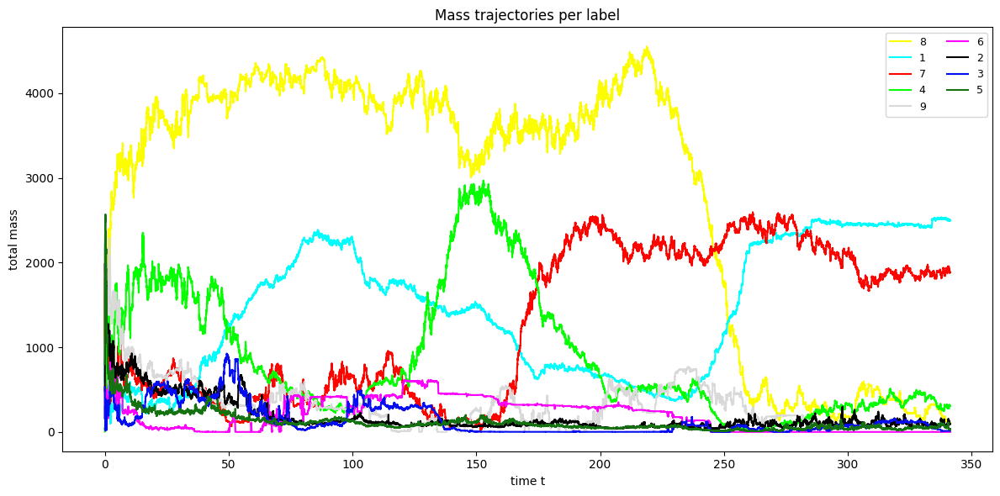

In [4]:
import numpy as np
import jax
import jax.numpy as jnp

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state, extract_AFP, resolve_device
from scripts import evolutionary_metrics as em

# --- user inputs ---
t1, t2 = 0, 1_000_000
device = device           
log_format = "auto"          # "auto" / "npz" / "pickle"
batch_frames = 512             # подбирай под память (4/8/16...)

# параметры em.compute_mass_trajectories(...)
q = 4
min_bin_mass = 0.0
lam = 200.0
dp_iters = 8
mass_eps_rel = 1e-6
rgb_void = 3
max_rgb_dist = 0.0

def iter_frames_AP(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)

    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("A", "P")):
            yield int(t), s["A"], s["P"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            A, _F, P = extract_AFP(st, t=t)
            if P is None:
                raise ValueError(f"P is missing at t={t}; can't render rgb from A,P (need P logged).")
            yield int(t), A, P
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")

def render_rgb_u8_and_mass(A_np, P_np):
    # как lenia_flow render_mode='Pcolor': rgb = clip(sum(A) * P[:3], 0,1)
    A = np.asarray(A_np, dtype=np.float32)
    P = np.asarray(P_np, dtype=np.float32)
    inten = A.sum(axis=-1, keepdims=True)              # (H,W,1)
    rgb01 = np.clip(inten * P[..., :3], 0.0, 1.0)      # (H,W,3)
    rgb_u8 = np.clip(np.rint(rgb01 * 255.0), 0, 255).astype(np.uint8)
    m = inten[..., 0].astype(np.float32)               # (H,W)  <-- это и есть frames_mass
    return rgb_u8, m

# =========================
# PASS 1: глобальные центры (DP-means) + max mass
# =========================
B = (256 + q - 1) // q
M = B * B * B
mass_sum = np.zeros(M, dtype=np.float64)
rgb_sum = np.zeros((M, 3), dtype=np.float64)
max_m_global = 0.0

for _t, A, P in tqdm(iter_frames_AP(save_pth, t1, t2, log_format=log_format)):
    rgb_u8, m = render_rgb_u8_and_mass(A, P)
    max_m_global = max(max_m_global, float(m.max()))

    w_flat = m.reshape(-1)
    ok = w_flat > 0
    if not ok.any():
        continue

    pix = rgb_u8.reshape(-1, 3)[ok]
    w = w_flat[ok].astype(np.float64)

    rb = (pix[:, 0] // q).astype(np.int32)
    gb = (pix[:, 1] // q).astype(np.int32)
    bb = (pix[:, 2] // q).astype(np.int32)
    key = (rb * B + gb) * B + bb

    mass_sum += np.bincount(key, weights=w, minlength=M)
    rgb_sum[:, 0] += np.bincount(key, weights=w * pix[:, 0], minlength=M)
    rgb_sum[:, 1] += np.bincount(key, weights=w * pix[:, 1], minlength=M)
    rgb_sum[:, 2] += np.bincount(key, weights=w * pix[:, 2], minlength=M)

keys = np.nonzero(mass_sum > 0)[0]
if min_bin_mass > 0:
    keys = keys[mass_sum[keys] >= min_bin_mass]

w_bins = mass_sum[keys].astype(np.float32)
pts = (rgb_sum[keys] / mass_sum[keys][:, None]).astype(np.float32)

centers = em.dpmeans_weighted(pts, w_bins, lam=lam, iters=dp_iters)
labels_fn, masses_fn, _render_fn, palette = em.make_jax_label_mass_batch(centers)

dev = resolve_device(device)
mass_eps = np.float32(mass_eps_rel * max_m_global)

# =========================
# PASS 2: считаем masses_T батчами и склеиваем
# =========================
t_list = []
masses_chunks = []

rgb_buf, m_buf, t_buf = [], [], []
for t, A, P in iter_frames_AP(save_pth, t1, t2, log_format=log_format):
    rgb_u8, m = render_rgb_u8_and_mass(A, P)

    rgb_buf.append(rgb_u8)
    m_buf.append(m)
    t_buf.append(t)

    if len(rgb_buf) >= batch_frames:
        rgb_batch = np.stack(rgb_buf, axis=0)          # (Tb,H,W,3) uint8
        m_batch = np.stack(m_buf, axis=0)              # (Tb,H,W) float32

        rgb_j = jax.device_put(jnp.asarray(rgb_batch, dtype=jnp.uint8), dev)
        m_j = jax.device_put(jnp.asarray(m_batch, dtype=jnp.float32), dev)

        masses_b = masses_fn(rgb_j, m_j, mass_eps, rgb_void=rgb_void, max_rgb_dist=float(max_rgb_dist))
        masses_chunks.append(np.array(masses_b, dtype=np.float32))
        t_list.extend(t_buf)

        rgb_buf.clear(); m_buf.clear(); t_buf.clear()

# flush tail
if rgb_buf:
    rgb_batch = np.stack(rgb_buf, axis=0)
    m_batch = np.stack(m_buf, axis=0)
    rgb_j = jax.device_put(jnp.asarray(rgb_batch, dtype=jnp.uint8), dev)
    m_j = jax.device_put(jnp.asarray(m_batch, dtype=jnp.float32), dev)
    masses_b = masses_fn(rgb_j, m_j, mass_eps, rgb_void=rgb_void, max_rgb_dist=float(max_rgb_dist))
    masses_chunks.append(np.array(masses_b, dtype=np.float32))
    t_list.extend(t_buf)

masses_T = np.concatenate(masses_chunks, axis=0)      # (T_logged, K+1)
t_logged = np.asarray(t_list, dtype=np.int64)

print("t:", t_logged.shape, t_logged.dtype)
print("masses_T:", masses_T.shape, masses_T.dtype)
print("palette:", palette.shape, palette.dtype)
print("centers:", centers.shape, centers.dtype)

# теперь можно:
em.plot_mass_trajectories(masses_T, palette=palette, include_void=False, top_k=12)

np.save(f'metrics/species/masses_T.npy', masses_T)
np.save(f'metrics/species/palette.npy', palette)
np.save(f'metrics/species/t_logged.npy', t_logged)
np.save(f'metrics/species/centers.npy', centers)


## 2) Compute drift metrics (streaming)

This reads frames from disk and runs a jitted metric per frame. You can optionally write a CSV.


In [ ]:
t_logged

array([     0,     50,    100, ..., 999850, 999900, 999950],
      shape=(20000,))

In [5]:
np.logspace(-1, -4, 10)

array([0.1       , 0.04641589, 0.02154435, 0.01      , 0.00464159,
       0.00215443, 0.001     , 0.00046416, 0.00021544, 0.0001    ])

In [7]:
from tqdm import tqdm
outs = {}
for beta_t in tqdm(np.logspace(-1, -4, 10)):
    out = compute_drift_timeseries(
        save_pth,
        t1=0,
        t2=1000000,
        device=device,
        log_format="auto",  # or "npz" / "pickle"
        csv_path=None,       # e.g. "drift.csv"
        # You can override defaults here:
        r_pool=3,
        beta_t=beta_t,
        q_top=0.995,
        m_thr_frac=0.02,
        mp_thr_frac=0.01,
        kappa_thr=0.2,
    )
    np.save(f'metrics/speed_characteristics/{beta_t}.npy', out)



20000it [03:47, 87.89it/s] 0<?, ?it/s]
20000it [03:46, 88.41it/s] 7<34:08, 227.57s/it]
20000it [03:46, 88.18it/s] 3<30:14, 226.78s/it]
20000it [03:46, 88.26it/s] 0<26:27, 226.80s/it]
20000it [03:46, 88.27it/s] 7<22:40, 226.73s/it]
20000it [03:47, 87.88it/s] 3<18:53, 226.69s/it]
20000it [03:46, 88.18it/s] 1<15:07, 227.00s/it]
20000it [03:46, 88.40it/s] 8<11:20, 226.94s/it]
20000it [03:46, 88.31it/s] 4<07:33, 226.72s/it]
20000it [03:45, 88.59it/s] 1<03:46, 226.65s/it]
100%|██████████| 10/10 [37:46<00:00, 226.68s/it]


In [20]:
import os
dir_name = 'metrics/speed_characteristics'
sms = {}
for file_name in sorted(os.listdir(dir_name)):
    sms[file_name[:-4]] = np.load(f"{dir_name}/{file_name}", allow_pickle=True)

In [95]:
def plot_mass_trajectories(masses_T, palette=None, include_void=False, top_k=12,
                           mass_floor=0.0, logy=False, figsize=(12, 6), title=None):
    """
    masses_T: (T, K+1)
    palette:  (K+1,3) uint8 (optional). If provided, line color matches label color.
    include_void: include label 0 trajectory
    top_k: plot only labels with largest total mass over time (keeps plot readable)
    mass_floor: ignore labels with total mass below this
    """
    M = np.asarray(masses_T, dtype=np.float64)
    T, L = M.shape
    totals = M.sum(axis=0)

    start = 0 if include_void else 1
    idx = np.arange(start, L, dtype=int)
    # idx = idx[totals[idx] >= mass_floor]
    idx = idx[np.argsort(-totals[idx])][:top_k]

    x = np.arange(T) * 50

    plt.figure(figsize=figsize)
    for lab in idx:
        y = M[:, lab]
        if palette is not None:
            c = np.asarray(palette[lab], dtype=np.float64) / 255.0
            # Avoid pure white blending into the background
            if np.all(c >= 0.95):
                c = np.array([0.85, 0.85, 0.85], dtype=np.float64)
            plt.plot(x, y, label=str(lab), color=c)
        else:
            plt.plot(x, y, label=str(lab))

    if logy:
        plt.yscale("log")

    plt.xlabel("time t")
    plt.ylabel("total mass")
    if title is not None:
        plt.title(title)
    else:
        plt.title("Mass trajectories per label")
    plt.legend(ncol=2, fontsize=9)
    plt.tight_layout()

In [40]:
940000 / 250 / 60

62.666666666666664

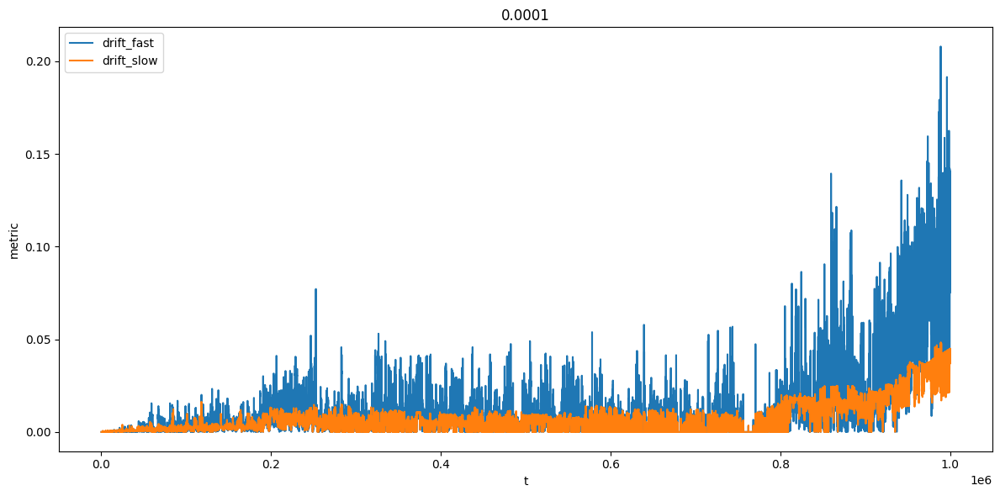

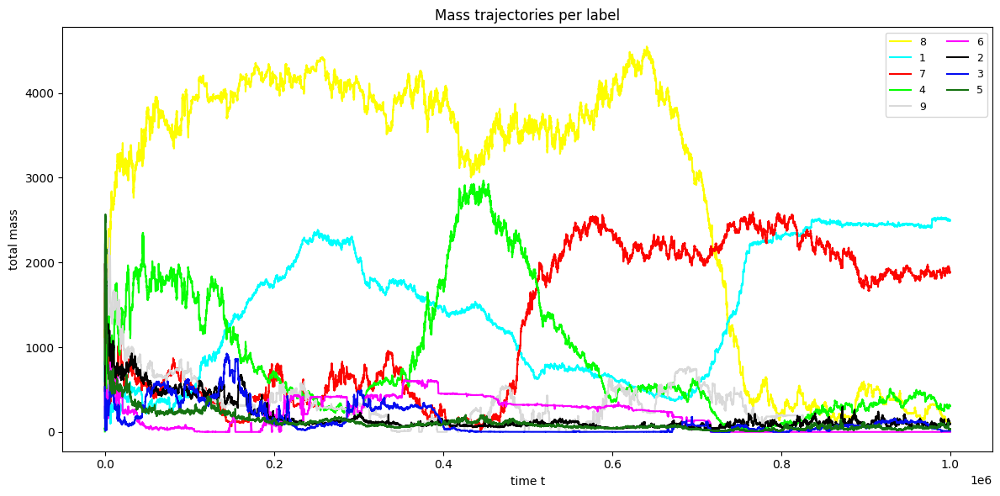

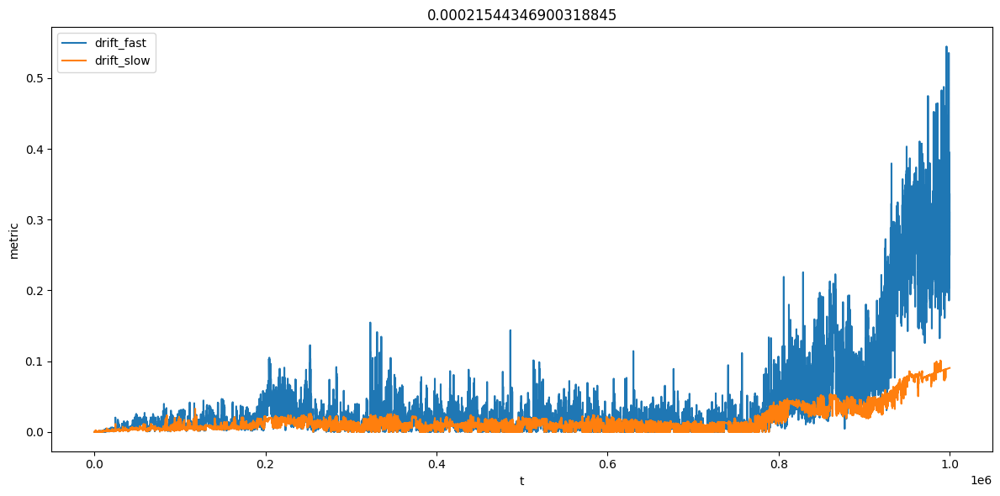

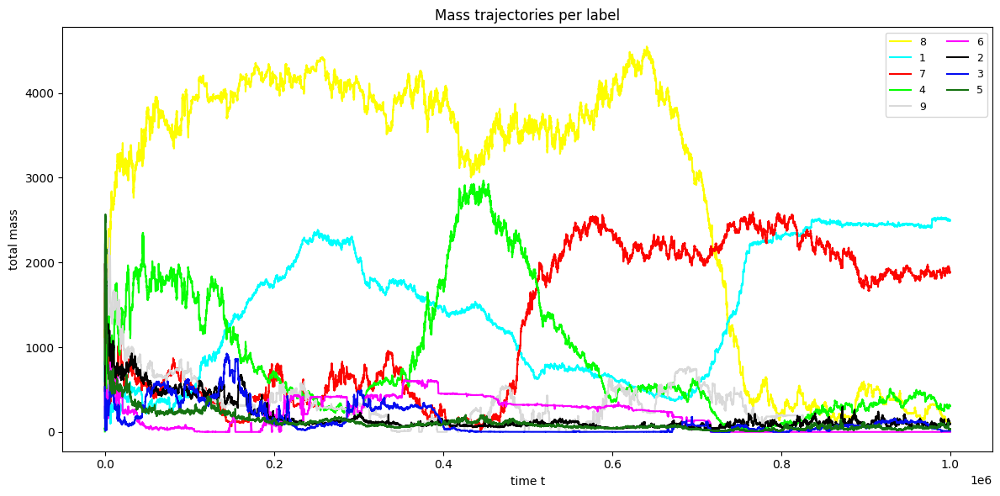

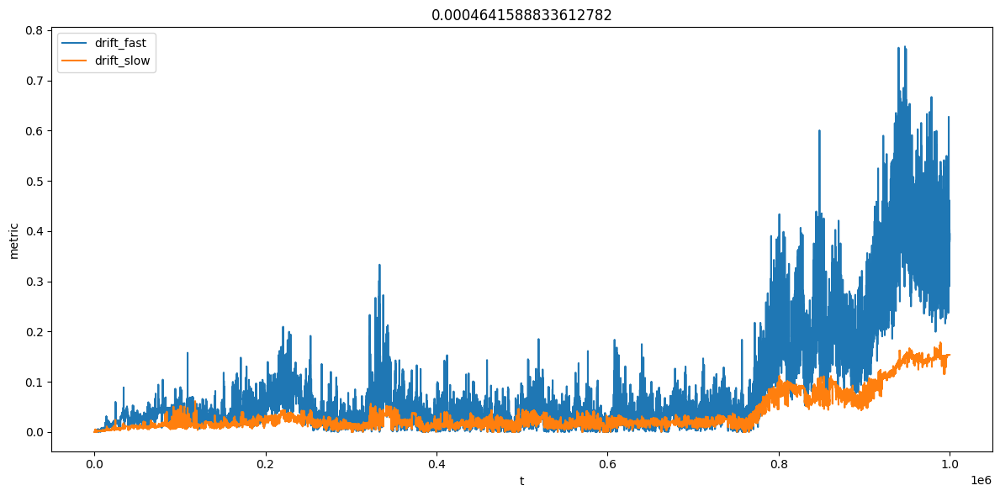

...

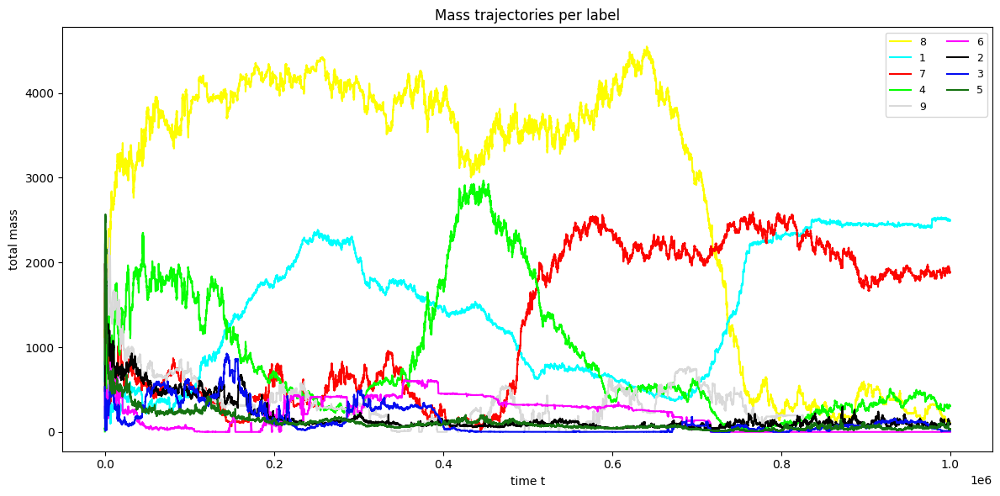

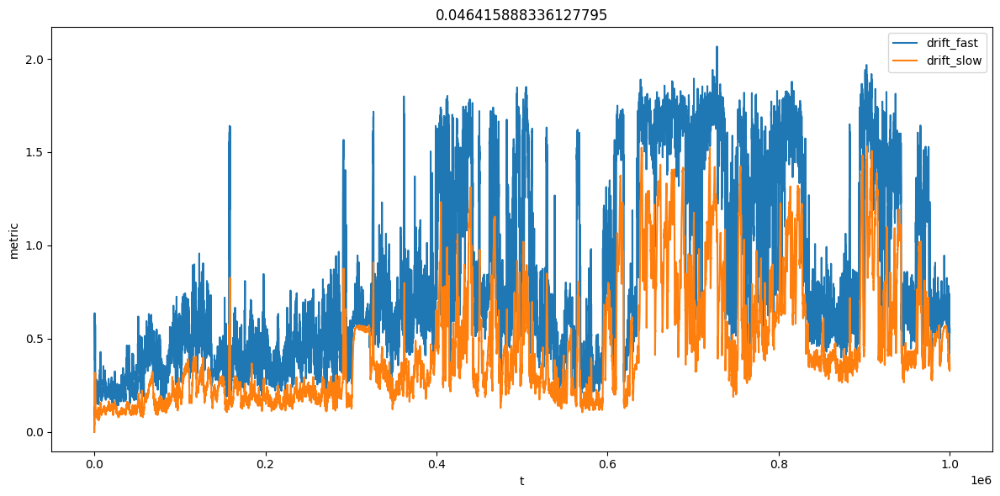

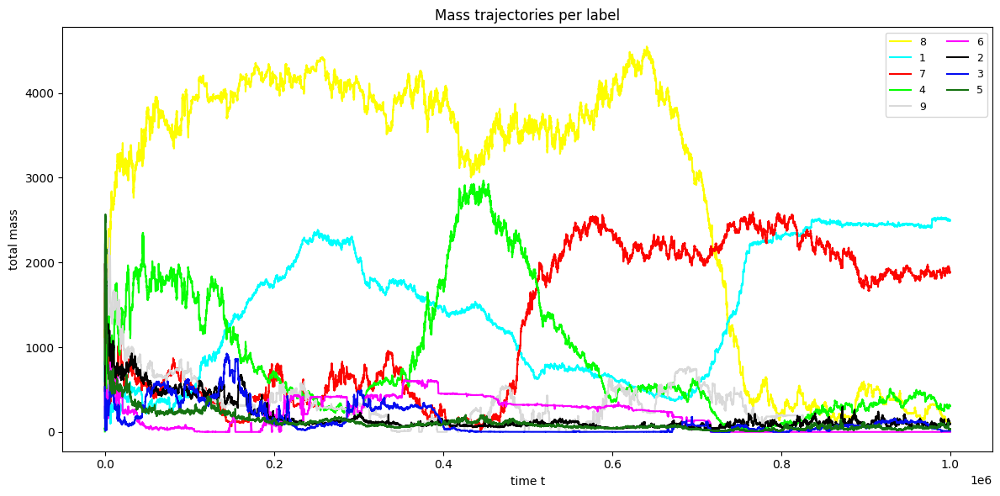

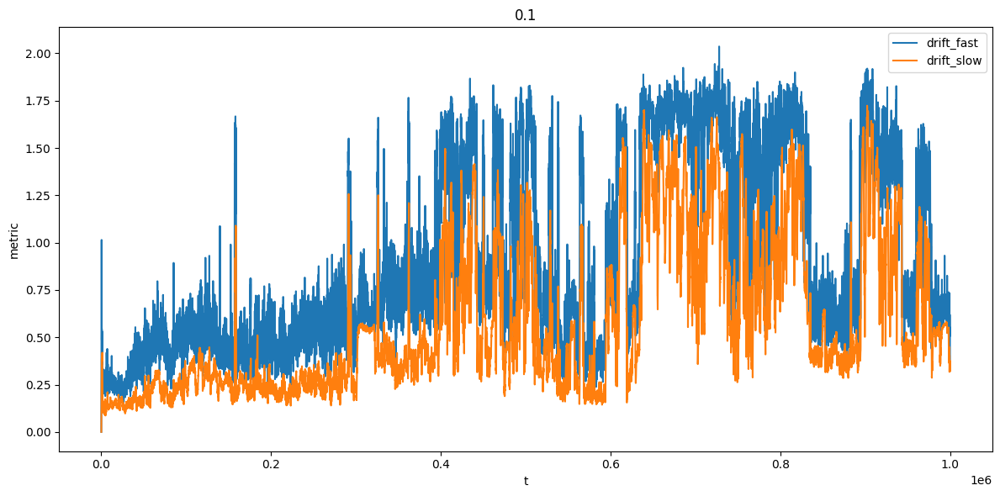

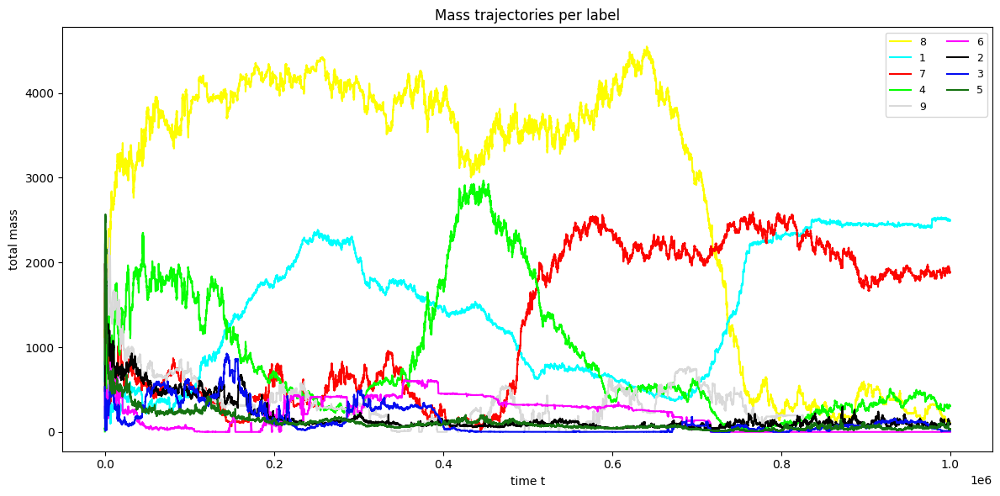

In [36]:
for beta_t, value in sms.items():
    value = value.item()
    plt.figure(figsize=(12, 6))
    plt.plot(value["t"], value["drift_fast"], label="drift_fast")
    plt.plot(value["t"], value["drift_slow"], label="drift_slow")
    plt.xlabel("t")
    plt.ylabel("metric")
    plt.legend()
    plt.title(f"{beta_t}")
    plt.tight_layout()
    plot_mass_trajectories(masses_T, palette=palette, include_void=False, top_k=12)
    # plt.yscale('log')


In [97]:
import numpy as np

def _next_pow2(n: int) -> int:
    return 1 << (n - 1).bit_length()

def gaussian_smooth_fft(x: np.ndarray, sigma: float, mode: str = "reflect") -> np.ndarray:
    x = np.asarray(x, dtype=np.float64)
    T = x.shape[0]
    if sigma <= 0:
        return x.copy()

    pad = int(min(T - 1, max(1, 4.0 * sigma)))
    if mode == "reflect":
        xp = np.concatenate([x[1:pad+1][::-1], x, x[-pad-1:-1][::-1]], axis=0)
        left = pad
    else:
        xp = np.pad(x, (pad, pad), mode="constant")
        left = pad

    N = _next_pow2(xp.shape[0])
    w = 2.0 * np.pi * np.fft.fftfreq(N)          # rad/sample
    H = np.exp(-0.5 * (sigma * w) ** 2)          # Gaussian in freq

    yp = np.fft.ifft(np.fft.fft(xp, n=N) * H).real[:xp.shape[0]]
    return yp[left:left+T]

def grad_central(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x, dtype=np.float64)
    g = np.empty_like(x)
    g[1:-1] = 0.5 * (x[2:] - x[:-2])
    g[0] = x[1] - x[0]
    g[-1] = x[-1] - x[-2]
    return g

# usage:
activity_s = gaussian_smooth_fft(sms['0.1'].item()['drift_slow'], sigma=200)   # sigma in samples

In [101]:
masses_s = []
for i in tqdm(range(10)):
    masses_s.append(gaussian_smooth_fft(masses_T[:, i], sigma=200))
masses_s = np.array(masses_s).transpose(1, 0)
G = np.apply_along_axis(grad_central, 0, masses_s)
G.shape

100%|██████████| 10/10 [00:00<00:00, 487.82it/s]


(20000, 10)

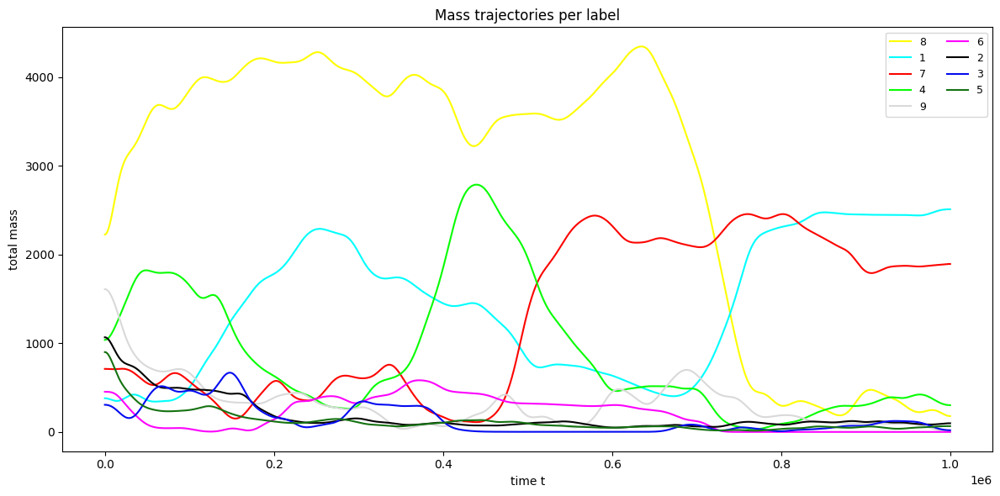

In [110]:
plot_mass_trajectories(masses_s, palette=palette, include_void=False, top_k=12)
# plot_mass_trajectories(G, palette=palette, include_void=False, top_k=12)
# plot_mass_trajectories(np.abs(G*masses_s), palette=palette, include_void=False, top_k=12)

# plt.figure(figsize=(12, 6))
# plt.plot(sms['0.1'].item()["t"], np.abs(G * masses_s).sum(-1), label="drift_fast")
# plt.plot(sms['0.1'].item()["t"], np.abs(G * masses_s).sum(-1), label="drift_slow")
# plt.xlabel("t")
# plt.ylabel("metric")
# plt.legend()
# plt.title(f"{beta_t}")
# plt.tight_layout()

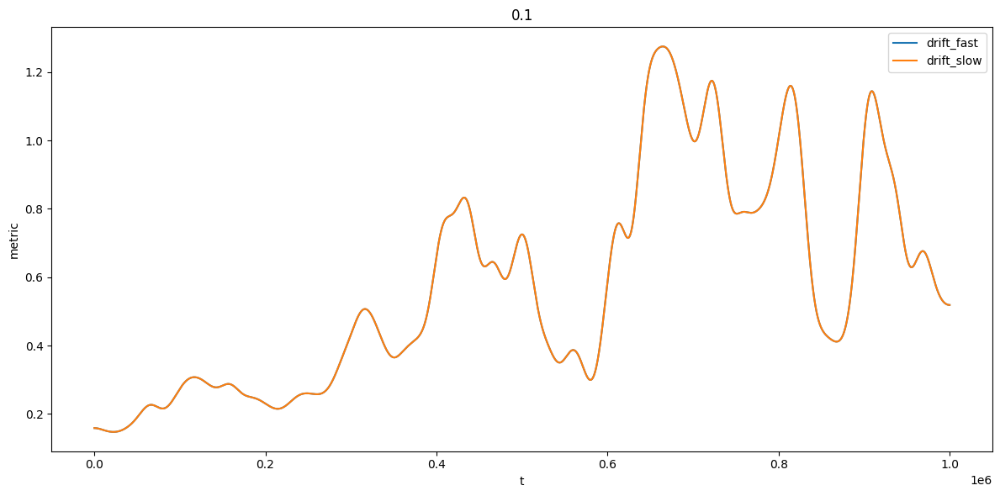

In [103]:
plt.figure(figsize=(12, 6))
plt.plot(sms['0.1'].item()["t"], activity_s, label="drift_fast")
plt.plot(sms['0.1'].item()["t"], activity_s, label="drift_slow")
plt.xlabel("t")
plt.ylabel("metric")
plt.legend()
plt.title(f"{beta_t}")
plt.tight_layout()

In [111]:
import numpy as np

def grad_central(x: np.ndarray) -> np.ndarray:
    """Central difference derivative with same length as x."""
    x = np.asarray(x, dtype=np.float64)
    g = np.empty_like(x)
    g[1:-1] = 0.5 * (x[2:] - x[:-2])
    g[0] = x[1] - x[0]
    g[-1] = x[-1] - x[-2]
    return g

def zscore(x: np.ndarray, axis=0, eps=1e-12) -> np.ndarray:
    x = np.asarray(x, dtype=np.float64)
    mu = x.mean(axis=axis, keepdims=True)
    sd = x.std(axis=axis, keepdims=True)
    return (x - mu) / (sd + eps)

def corr0(a: np.ndarray, b: np.ndarray, eps=1e-12) -> float:
    """Pearson corr between two 1D arrays."""
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    a = (a - a.mean()) / (a.std() + eps)
    b = (b - b.mean()) / (b.std() + eps)
    return float(np.mean(a * b))

def corr_with_mass_grad(activity: np.ndarray,
                        mass: np.ndarray,
                        use_log: bool = False,
                        eps_log: float = 1e-6):
    """
    activity: (T,)
    mass: (T,S) mass per species
    Returns:
      g: (T,S) gradients
      r: (S,) corr(activity, g[:,s])
    """
    a = np.asarray(activity, dtype=np.float64)
    M = np.asarray(mass, dtype=np.float64)

    if use_log:
        X = np.log(M + eps_log)
    else:
        X = M

    G = np.apply_along_axis(grad_central, 0, X)  # (T,S)

    a_z = zscore(a, axis=0)
    G_z = zscore(G, axis=0)

    r = np.mean(a_z[:, None] * G_z, axis=0)      # (S,)
    return G, r

def lagged_corr(activity: np.ndarray,
                x: np.ndarray,
                L: int,
                eps=1e-12) -> tuple[np.ndarray, np.ndarray]:
    """
    Correlation corr(activity[t], x[t+lag]) for lag in [-L..L].
    activity, x: (T,)
    Returns lags, corr_values
    """
    a = np.asarray(activity, dtype=np.float64)
    x = np.asarray(x, dtype=np.float64)
    lags = np.arange(-L, L+1, dtype=int)
    out = np.empty_like(lags, dtype=np.float64)

    for i, lag in enumerate(lags):
        if lag < 0:
            aa = a[-lag:]
            xx = x[:len(aa)]
        elif lag > 0:
            aa = a[:-lag]
            xx = x[lag:]
        else:
            aa = a
            xx = x
        out[i] = corr0(aa, xx, eps=eps)
    return lags, out

# -------------------------
# Example usage
# -------------------------

G, r = corr_with_mass_grad(activity_s, masses_T, use_log=False)
Glog, rlog = corr_with_mass_grad(activity_s, masses_T, use_log=True)

print("Top species by |corr(activity, dM/dt)|:", np.argsort(-np.abs(r))[:10], r[np.argsort(-np.abs(r))[:10]])
print("Top species by |corr(activity, dlogM/dt)|:", np.argsort(-np.abs(rlog))[:10], rlog[np.argsort(-np.abs(rlog))[:10]])

# For one species s, inspect lag structure:
# s = int(np.argmax(np.abs(rlog)))
# lags, cc = lagged_corr(activity, Glog[:, s], L=5000)
# lag_best = lags[np.argmax(np.abs(cc))]
# print("best lag", lag_best, "corr", cc[np.argmax(np.abs(cc))])


Top species by |corr(activity, dM/dt)|: [8 0 9 7 1 3 4 6 2 5] [-0.03196644  0.01951928  0.01517436  0.01312481  0.01137929  0.00574506
 -0.00472762 -0.00216226 -0.00096744  0.00024529]
Top species by |corr(activity, dlogM/dt)|: [4 8 1 7 6 2 9 5 3 0] [-0.01785526 -0.01407548  0.00680901  0.0064157  -0.00427456  0.00295949
  0.00162719  0.00137343  0.00112429  0.00095228]


In [6]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import imageio.v2 as imageio

from flow_drift_metrics import iter_npz_snapshots, make_jperp_fn, resolve_device

save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2 = 500000, 550000

# quiver sampling
stride = 8                 # keep moderate; density comes from masking + smoothing
quiver_scale = 0.05        # bigger => shorter arrows (Matplotlib quiver convention)

# smoothing / masking
r_smooth = 3               # box radius: 3 => 7x7 smoothing window
m_thr_frac = 0.03          # only draw arrows where smoothed mass is >= frac * max(m_s)

fps = 30
out_mp4 = "compare_raw_vs_Jperp_quiver.mp4"

device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)

jperp_fn = make_jperp_fn(eps=1e-6)

def box_avg_np(x: np.ndarray, r: int):
    # periodic box average; supports (H,W) or (H,W,2)
    acc = np.zeros_like(x, dtype=np.float32)
    for dy in range(-r, r + 1):
        y2 = np.roll(x, dy, axis=0)
        for dx in range(-r, r + 1):
            acc += np.roll(y2, dx, axis=1)
    acc /= float((2 * r + 1) ** 2)
    return acc

def quiver_grid_masked_dir(vec_yx: np.ndarray, m_s: np.ndarray, stride: int, m_thr_frac: float):
    H, W, _ = vec_yx.shape
    ys = np.arange(0, H, stride)
    xs = np.arange(0, W, stride)

    V2 = vec_yx[ys[:, None], xs[None, :]]
    M2 = m_s[ys[:, None], xs[None, :]]

    thr = float(m_thr_frac) * float(m_s.max() + 1e-12)
    keep = M2 > thr

    U = V2[..., 1]  # dx
    V = V2[..., 0]  # dy
    X, Y = np.meshgrid(xs, ys)

    X = X[keep]; Y = Y[keep]
    U = U[keep]; V = V[keep]

    # angle in [-pi, pi], then map to [0, 1]
    ang = np.arctan2(V, U)
    Cdir = (ang + np.pi) / (2.0 * np.pi)

    return X, Y, U, V, Cdir


with imageio.get_writer(out_mp4, fps=fps, codec="libx264", macro_block_size=None) as writer:
    for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("A", "F")):
        A = jax.device_put(jnp.asarray(s["A"], dtype=jnp.float32), dev)  # (H,W,C)
        F = jax.device_put(jnp.asarray(s["F"], dtype=jnp.float32), dev)  # (H,W,2,C)

        m, J, J_perp, q, n = jperp_fn(A, F)  # m:(H,W), J/J_perp:(H,W,2) in (dy,dx)

        m_np = np.asarray(m, dtype=np.float32)

        raw_np = np.asarray(J, dtype=np.float32)
        Jp_np  = np.asarray(J_perp, dtype=np.float32)

        # smooth (mass-weighted field becomes less spiky), and smooth mass for masking
        m_s   = box_avg_np(m_np, r_smooth)
        raw_s = box_avg_np(raw_np, r_smooth)
        Jp_s  = box_avg_np(Jp_np, r_smooth)

        # Option A: plot smoothed momentum field (recommended to see "where flux goes")
        raw_field = raw_s
        Jp_field  = Jp_s

        # Option B: plot smoothed velocity (uncomment if you want speed-on-mass)
        # raw_field = raw_s / (m_s[..., None] + 1e-6)
        # Jp_field  = Jp_s  / (m_s[..., None] + 1e-6)

        X0, Y0, U0, V0, C0 = quiver_grid_masked_dir(raw_field, m_s, stride, m_thr_frac)
        X1, Y1, U1, V1, C1 = quiver_grid_masked_dir(Jp_field,  m_s, stride, m_thr_frac)


        # normalize color range for contrast (visual only)
        cmax0 = np.percentile(C0, 95) if C0.size else 1.0
        cmax1 = np.percentile(C1, 95) if C1.size else 1.0
        C0n = np.clip(C0, 0, cmax0)
        C1n = np.clip(C1, 0, cmax1)

        fig, axs = plt.subplots(1, 2, figsize=(10, 5), dpi=160, constrained_layout=True)
        fig.suptitle(f"t={t}", y=0.995)

        for ax in axs:
            ax.imshow(m_np, cmap="gray", origin="upper")
            ax.set_axis_off()
            ax.set_aspect("equal")

        axs[0].set_title(f"raw: box_avg(J), r={r_smooth}", pad=6)
        axs[1].set_title(f"projected: box_avg(J_perp), r={r_smooth}", pad=6)

        qkw = dict(
            angles="xy",
            scale_units="xy",
            scale=quiver_scale,
            width=0.0022,
            headwidth=3.2,
            headlength=4.0,
            headaxislength=3.5,
            minlength=0.0,
            pivot="mid",
            cmap="twilight"
        )

        axs[0].quiver(X0, Y0, U0, V0, C0n, **qkw)
        axs[1].quiver(X1, Y1, U1, V1, C1n, **qkw)

        fig.canvas.draw()
        w, h = fig.canvas.get_width_height()
        buf = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8).reshape(h, w, 4)
        writer.append_data(buf[..., :3].copy())
        plt.close(fig)

print("Wrote:", out_mp4)


/home/coder/.conda/envs/torchjax/lib/python3.11/subprocess.py:1885: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _fork_exec(


Wrote: compare_raw_vs_Jperp_quiver.mp4


## 3.1) Frustration + complexity

In [1]:
import numpy as np
import jax
import jax.numpy as jnp
from collections import deque

# -------------------------
# Helpers: RGB -> HSV -> hue-bin label
# -------------------------
def rgb_to_hsv(rgb):
    # rgb: (...,3) float in [0,1]
    # hsv: (...,3) with h in [0,1), s,v in [0,1]
    r, g, b = rgb[..., 0], rgb[..., 1], rgb[..., 2]
    cmax = jnp.maximum(jnp.maximum(r, g), b)
    cmin = jnp.minimum(jnp.minimum(r, g), b)
    delta = cmax - cmin

    h = jnp.zeros_like(cmax)
    delta_safe = delta + 1e-12

    is_r = (cmax == r) & (delta > 0)
    is_g = (cmax == g) & (delta > 0)
    is_b = (cmax == b) & (delta > 0)

    h = jnp.where(is_r, ((g - b) / delta_safe) % 6.0, h)
    h = jnp.where(is_g, ((b - r) / delta_safe) + 2.0, h)
    h = jnp.where(is_b, ((r - g) / delta_safe) + 4.0, h)
    h = (h / 6.0) % 1.0

    s = jnp.where(cmax > 0, delta / (cmax + 1e-12), 0.0)
    v = cmax
    return jnp.stack([h, s, v], axis=-1)

def rgb_bins_label(P, m, hue_bins=12, m_thr_frac=0.02, sat_min=0.08, val_min=0.08):
    # P: (H,W,K), uses first 3 channels as RGB
    # m: (H,W) mass
    # returns label: (H,W) int32 in [0..hue_bins], where 0 = background/void
    rgb = jnp.clip(P[..., :3], 0.0, 1.0)
    hsv = rgb_to_hsv(rgb)
    h, s, v = hsv[..., 0], hsv[..., 1], hsv[..., 2]

    m_thr = m_thr_frac * (jnp.max(m) + 1e-12)
    fg = (m > m_thr) & (s > sat_min) & (v > val_min)

    bin_id = jnp.floor(h * hue_bins).astype(jnp.int32) + 1
    bin_id = jnp.where(bin_id > hue_bins, hue_bins, bin_id)
    lab = jnp.where(fg, bin_id, 0).astype(jnp.int32)
    return lab

# -------------------------
# Spatial ops (periodic)
# -------------------------
def wall_density(label):
    # fraction of pixel-edges that are boundaries
    diff_y = label != jnp.roll(label, shift=1, axis=0)
    diff_x = label != jnp.roll(label, shift=1, axis=1)
    return jnp.mean((diff_x | diff_y).astype(jnp.float32))

def box_blur_periodic(x, r):
    # periodic box blur radius r (window size 2r+1), separable via rolling sums
    if r <= 0:
        return x
    acc = jnp.zeros_like(x)
    for k in range(-r, r + 1):
        acc = acc + jnp.roll(x, shift=k, axis=0)
    acc = acc / float(2 * r + 1)

    acc2 = jnp.zeros_like(acc)
    for k in range(-r, r + 1):
        acc2 = acc2 + jnp.roll(acc, shift=k, axis=1)
    acc2 = acc2 / float(2 * r + 1)
    return acc2

# -------------------------
# Dynamical heterogeneity (chi4) on a mobility field
# -------------------------
def mobility_mass(m1, m2):
    return jnp.abs(m2 - m1)

def overlap_q(mu, a):
    # smooth overlap in [0,1], robust to spikes
    return jnp.exp(-0.5 * (mu / (a + 1e-12)) ** 2)

def heterogeneity_scalar(mu, r_pool=3):
    # "complexity" proxy at one spatial scale: Var/Mean^2 after pooling
    mu_p = box_blur_periodic(mu, r_pool)
    mean = jnp.mean(mu_p)
    var = jnp.mean((mu_p - mean) ** 2)
    return var / (mean * mean + 1e-12)

# -------------------------
# Malthusian growth across RGB bins
# -------------------------
def mass_by_label(m, label, K):
    # returns (K,) masses for labels 1..K
    out = []
    for k in range(1, K + 1):
        out.append(jnp.sum(m * (label == k)))
    return jnp.stack(out, axis=0)

def selection_pressure(M_t, M_t2, dt):
    # returns (r_bar, sigma_r, r_rel)
    eps = 1e-12
    r = (jnp.log(M_t2 + eps) - jnp.log(M_t + eps)) / float(dt)
    w = M_t / (jnp.sum(M_t) + eps)
    r_bar = jnp.sum(w * r)
    sig2 = jnp.sum(w * (r - r_bar) ** 2)
    return r_bar, jnp.sqrt(sig2 + eps), (r - r_bar)

print("Helpers defined.")


Helpers defined.


In [19]:
from flow_drift_metrics import iter_npz_snapshots, resolve_device
# ---- user knobs ----
t1, t2 = 0, 200_000
frame_stride = 20
delta_frames = 10
hue_bins = 12
r_list = [0, 1, 2, 4, 8]

m_thr_frac = 0.02
sat_min = 0.08
val_min = 0.08

device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)

# ---- streaming accumulators ----
buf_m = deque(maxlen=delta_frames + 1)
buf_P = deque(maxlen=delta_frames + 1)
buf_lab = deque(maxlen=delta_frames + 1)

sumQ = 0.0
sumQ2 = 0.0
nQ = 0

wall_sum = 0.0
wall_n = 0

H_sum = np.zeros(len(r_list), dtype=np.float64)
H_n = 0

sel_sum = 0.0
sel_n = 0

Q_series = []
Hstar_series = []
sel_series = []

H0 = None
W0 = None

i = 0
for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "P"))):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    A = jax.device_put(jnp.asarray(s["A"], dtype=jnp.float32), dev)  # (H,W,C)
    P = jax.device_put(jnp.asarray(s["P"], dtype=jnp.float32), dev)  # (H,W,K)

    if H0 is None:
        H0, W0 = int(A.shape[0]), int(A.shape[1])

    m = jnp.sum(A, axis=-1)
    lab = rgb_bins_label(P, m, hue_bins=hue_bins, m_thr_frac=m_thr_frac, sat_min=sat_min, val_min=val_min)

    wd = wall_density(lab)
    wall_sum += float(wd)
    wall_n += 1

    buf_m.append(m)
    buf_P.append(P)
    buf_lab.append(lab)

    if len(buf_m) < (delta_frames + 1):
        continue

    m0 = buf_m[0]
    m1 = buf_m[-1]
    lab0 = buf_lab[0]
    lab1 = buf_lab[-1]

    mu = mobility_mass(m0, m1)

    fg = (m0 > (m_thr_frac * (jnp.max(m0) + 1e-12)))
    mu_in = jnp.where(fg, mu, 0.0)

    a = jnp.maximum(jnp.median(jnp.where(fg, mu, 0.0)), 1e-6)

    q_in = jnp.where(fg, overlap_q(mu, a), 0.0)   # <-- ключевое: вне fg не 1, а 0
    Q = jnp.sum(q_in) / (jnp.sum(fg.astype(jnp.float32)) + 1e-12)

    Qf = float(Q)
    sumQ += Qf
    sumQ2 += Qf * Qf
    nQ += 1

    Hs = []
    for rr in r_list:
        Hs.append(float(heterogeneity_scalar(mu_fg, r_pool=rr)))
    Hs = np.asarray(Hs, dtype=np.float64)
    H_sum += Hs
    H_n += 1

    M0 = mass_by_label(m0, lab0, hue_bins)
    M1 = mass_by_label(m1, lab1, hue_bins)
    dt = float(delta_frames * frame_stride)
    rbar, sel, rrel = selection_pressure(M0, M1, dt=dt)

    sel_sum += float(sel)
    sel_n += 1

    Q_series.append(Qf)
    Hstar_series.append(float(Hs.max()))
    sel_series.append(float(sel))

if nQ > 1:
    chi4 = (sumQ2 / nQ - (sumQ / nQ) ** 2) * float(H0 * W0)
else:
    chi4 = float('nan')

wall_mean = wall_sum / max(1, wall_n)

H_mean = H_sum / max(1, H_n)
r_star = r_list[int(np.argmax(H_mean))]
complexity_max = float(np.max(H_mean))

sel_mean = sel_sum / max(1, sel_n)

print("chi4 (dynamical heterogeneity):", chi4)
print("wall_density mean (domain walls / frustration proxy):", wall_mean)
print("complexity_max = max_r mean(Var/Mean^2) :", complexity_max, " at r_star =", r_star)
print("selection_pressure mean (std growth rates across RGB bins):", sel_mean)

import numpy as np

def corr(a, b, eps=1e-12):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    a = (a - a.mean()) / (a.std() + eps)
    b = (b - b.mean()) / (b.std() + eps)
    return float(np.mean(a * b))

Q = np.asarray(Q_series, dtype=np.float64)
H = np.asarray(Hstar_series, dtype=np.float64)

W = min(200, len(Q) // 2)   # или //3
W = max(W, 10)
chi4_win = []
H_win = []
for i in range(0, len(Q) - W + 1):
    q = Q[i:i+W]
    chi4_local = (q.var() * (H0 * W0))  # N * Var(Q) (внутри окна)
    chi4_win.append(chi4_local)
    H_win.append(H[i:i+W].mean())

print("corr(windowed_chi4, windowed_complexity):", corr(chi4_win, H_win))



0it [00:00, ?it/s]

4001it [00:23, 169.14it/s]

chi4 (dynamical heterogeneity): 0.00025162173366521
wall_density mean (domain walls / frustration proxy): 0.07462565209345882
complexity_max = max_r mean(Var/Mean^2) : 17.331186294555664  at r_star = 0
selection_pressure mean (std growth rates across RGB bins): 0.007558426852959711
corr(windowed_chi4, windowed_complexity): 0.0


### `ПОПЫТКА 2`

In [4]:
# --- FULL SNIPPET: calibrate a0 fast + run fast metrics loop (single GPU->CPU sync per frame) ---

from collections import deque
import numpy as np
import jax
import jax.numpy as jnp
from tqdm import tqdm

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# -----------------------
# User config
# -----------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2 = 0, 1_000_000

frame_stride = 20
delta_frames = 10

hue_bins = 12
m_thr_frac = 0.02
sat_min = 0.08
val_min = 0.08

# complexity / pooling
r_list = [0, 1, 2, 4, 8]
r_mass = 4

# pairs (placeholder)
pairs = [(2, 6), (6, 10), (2, 10)]

# calibration speed knobs
frame_stride_calib = frame_stride * 10
need_calib = 32
pix_stride = 4

# -----------------------
# Helpers
# -----------------------
def rgb_to_hsv(rgb):
    r, g, b = rgb[..., 0], rgb[..., 1], rgb[..., 2]
    cmax = jnp.maximum(jnp.maximum(r, g), b)
    cmin = jnp.minimum(jnp.minimum(r, g), b)
    delta = cmax - cmin
    delta_safe = delta + 1e-12

    h = jnp.zeros_like(cmax)
    is_r = (cmax == r) & (delta > 0)
    is_g = (cmax == g) & (delta > 0)
    is_b = (cmax == b) & (delta > 0)

    h = jnp.where(is_r, ((g - b) / delta_safe) % 6.0, h)
    h = jnp.where(is_g, ((b - r) / delta_safe) + 2.0, h)
    h = jnp.where(is_b, ((r - g) / delta_safe) + 4.0, h)
    h = (h / 6.0) % 1.0

    s = jnp.where(cmax > 0, delta / (cmax + 1e-12), 0.0)
    v = cmax
    return jnp.stack([h, s, v], axis=-1)

def rgb_bins_label(P, m, hue_bins=12, m_thr_frac=0.02, sat_min=0.08, val_min=0.08):
    rgb = jnp.clip(P[..., :3], 0.0, 1.0)
    hsv = rgb_to_hsv(rgb)
    h, s, v = hsv[..., 0], hsv[..., 1], hsv[..., 2]
    m_thr = m_thr_frac * (jnp.max(m) + 1e-12)
    fg = (m > m_thr) & (s > sat_min) & (v > val_min)
    bin_id = jnp.floor(h * hue_bins).astype(jnp.int32) + 1
    bin_id = jnp.where(bin_id > hue_bins, hue_bins, bin_id)
    return jnp.where(fg, bin_id, 0).astype(jnp.int32)

def box_blur_periodic(x, r):
    if r <= 0:
        return x
    acc = jnp.zeros_like(x)
    for k in range(-r, r + 1):
        acc = acc + jnp.roll(x, k, axis=0)
    acc = acc / float(2 * r + 1)
    acc2 = jnp.zeros_like(acc)
    for k in range(-r, r + 1):
        acc2 = acc2 + jnp.roll(acc, k, axis=1)
    return acc2 / float(2 * r + 1)

def wall_density(label):
    diff_y = label != jnp.roll(label, 1, axis=0)
    diff_x = label != jnp.roll(label, 1, axis=1)
    return jnp.mean((diff_x | diff_y).astype(jnp.float32))

def contact_frac_pair(label, a, b):
    ly = jnp.roll(label, 1, axis=0)
    lx = jnp.roll(label, 1, axis=1)
    def pair_match(L):
        return ((label == a) & (L == b)) | ((label == b) & (L == a))
    m_y = pair_match(ly)
    m_x = pair_match(lx)
    return 0.5 * (jnp.mean(m_x.astype(jnp.float32)) + jnp.mean(m_y.astype(jnp.float32)))

def norm2(v2, eps=1e-12):
    return jnp.sqrt(jnp.sum(v2 * v2, axis=-1) + eps)

def activity_from_Jperp(J_perp, fg, q_top=0.95):
    s = norm2(J_perp)
    vals = s[fg]
    return jnp.where(vals.size > 0, jnp.quantile(vals, q_top), 0.0)

def mobility_from_Jperp(Jp0, Jp1):
    return jnp.abs(norm2(Jp1) - norm2(Jp0))

def overlap_q(mu, a):
    return jnp.exp(-0.5 * (mu / (a + 1e-12)) ** 2)

def chi4_from_Q(Q_series, N_eff):
    Q = np.asarray(Q_series, dtype=np.float64)
    if Q.size < 2:
        return float("nan")
    return float(N_eff * Q.var())

# local mass peaks across all bins (fast, no quantile)
bins = jnp.arange(1, hue_bins + 1, dtype=jnp.int32)
def local_mass_peak_allbins(m, lab, r_pool=4):
    onehot = (lab[..., None] == bins[None, None, :]).astype(m.dtype)      # (H,W,K)
    mk = m[..., None] * onehot                                            # (H,W,K)
    mkT = jnp.transpose(mk, (2, 0, 1))                                    # (K,H,W)
    mkpT = jax.vmap(lambda x: box_blur_periodic(x, r_pool))(mkT)          # (K,H,W)
    return jnp.max(mkpT.reshape(mkpT.shape[0], -1), axis=1)               # (K,)

# -----------------------
# Device / jperp
# -----------------------
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# -----------------------
# 1) Calibrate a0 quickly
# -----------------------
buf_Jp = deque(maxlen=delta_frames + 1)
buf_fg = deque(maxlen=delta_frames + 1)

a_list = []
nfg_list = []

i = 0
for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "P", "F")), desc="calib"):
    if (i % frame_stride_calib) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        P = jnp.asarray(s["P"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)

    m, J, Jp, q, n = jperp_fn(A, F)
    lab = rgb_bins_label(P, m, hue_bins=hue_bins, m_thr_frac=m_thr_frac, sat_min=sat_min, val_min=val_min)
    fg = (lab > 0)

    buf_Jp.append(Jp)
    buf_fg.append(fg)

    if len(buf_Jp) < (delta_frames + 1):
        continue

    mu = mobility_from_Jperp(buf_Jp[0], buf_Jp[-1])

    mu_s = mu[::pix_stride, ::pix_stride]
    fg_s = buf_fg[0][::pix_stride, ::pix_stride]
    vals = np.asarray(mu_s[fg_s])  # CPU small sample

    if vals.size == 0:
        continue

    a_list.append(float(np.median(vals)))
    nfg_list.append(float(vals.size))

    if len(a_list) >= need_calib:
        break

a0 = float(np.median(a_list)) if len(a_list) else 1e-6
N_eff = float(np.mean(nfg_list)) * (pix_stride * pix_stride) if len(nfg_list) else 224 * 224
print("calibrated a0 =", a0, "N_eff~", N_eff, "n_calib =", len(a_list))

# -----------------------
# 2) Main loop (FAST): one device_get per processed frame
# -----------------------
buf_Jp = deque(maxlen=delta_frames + 1)
buf_fg = deque(maxlen=delta_frames + 1)

Q_series = []
Hstar_series = []
wall_series = []
act_series = []
pair_series = {p: [] for p in pairs}
locmass_series = [[] for _ in range(hue_bins)]

eps = 1e-12

i = 0
for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "P", "F")), desc="main"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        P = jnp.asarray(s["P"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)

    m, J, J_perp, q, n = jperp_fn(A, F)
    lab = rgb_bins_label(P, m, hue_bins=hue_bins, m_thr_frac=m_thr_frac, sat_min=sat_min, val_min=val_min)
    fg  = (lab > 0)

    wd = wall_density(lab)
    act = activity_from_Jperp(J_perp, fg, q_top=0.95)
    contacts = jnp.stack([contact_frac_pair(lab, a, b) for (a, b) in pairs], axis=0) if pairs else jnp.zeros((0,), jnp.float32)
    peaks = local_mass_peak_allbins(m, lab, r_pool=r_mass)

    buf_Jp.append(J_perp)
    buf_fg.append(fg)

    if len(buf_Jp) >= (delta_frames + 1):
        Jp0 = buf_Jp[0]
        Jp1 = buf_Jp[-1]
        fg0 = buf_fg[0]

        mu = mobility_from_Jperp(Jp0, Jp1)
        mu_fg = jnp.where(fg0, mu, 0.0)

        q_in = jnp.where(fg0, overlap_q(mu, a0), 0.0)
        Q = jnp.sum(q_in) / (jnp.sum(fg0.astype(jnp.float32)) + eps)

        Hs = []
        for rr in r_list:
            mup = box_blur_periodic(mu_fg, rr)
            mean = jnp.mean(mup)
            var  = jnp.mean((mup - mean) ** 2)
            Hs.append(var / (mean * mean + eps))
        Hstar = jnp.max(jnp.stack(Hs, axis=0))
    else:
        Q = jnp.array(np.nan, dtype=jnp.float32)
        Hstar = jnp.array(np.nan, dtype=jnp.float32)

    out = jnp.concatenate([jnp.stack([wd, act, Q, Hstar], axis=0), contacts, peaks], axis=0)
    out_np = np.asarray(jax.device_get(out))

    wd_f, act_f, Q_f, H_f = out_np[0], out_np[1], out_np[2], out_np[3]
    wall_series.append(wd_f)
    act_series.append(act_f)
    if not np.isnan(Q_f): Q_series.append(Q_f)
    if not np.isnan(H_f): Hstar_series.append(H_f)

    off = 4
    for pi, p in enumerate(pairs):
        pair_series[p].append(out_np[off + pi])
    off += len(pairs)

    for k in range(hue_bins):
        locmass_series[k].append(out_np[off + k])

chi4 = chi4_from_Q(Q_series, N_eff)
wall_mean = float(np.mean(wall_series)) if wall_series else float("nan")
complexity_mean = float(np.mean(Hstar_series)) if Hstar_series else float("nan")

print("chi4:", chi4)
print("wall_density mean:", wall_mean)
print("mean complexity(H*):", complexity_mean)
print("len(Q_series) =", len(Q_series), "len(act_series) =", len(act_series))


calib: 8200it [00:53, 153.45it/s]


calibrated a0 = 0.589794784784317 N_eff~ 12235.0 n_calib = 32


main: 20000it [18:09, 18.36it/s]

chi4: 195.75036033696847
wall_density mean: 0.06362991034984589
mean complexity(H*): 37.82016372680664
len(Q_series) = 990 len(act_series) = 1000


In [5]:
Q = np.asarray(Q_series)
act = np.asarray(act_series[-len(Q):])  # выровнять длины
print("Q mean/std:", Q.mean(), Q.std(), "p01/p50/p99:", np.percentile(Q, [1,50,99]))
print("act mean/std:", act.mean(), act.std(), "p01/p50/p99:", np.percentile(act, [1,50,99]))


Q mean/std: 0.3891601 0.126488 p01/p50/p99: [0.21027903 0.37699598 0.71403208]
act mean/std: 6.360142 1.4409589 p01/p50/p99: [2.53883953 6.335109   8.87490083]


In [6]:
import numpy as np

Q = np.asarray(Q_series, dtype=np.float64)
act = np.asarray(act_series[-len(Q):], dtype=np.float64)

def z(x): 
    x = (x - x.mean())/(x.std()+1e-12)
    return x

print("corr(act, Q) =", float(np.mean(z(act)*z(Q))))


corr(act, Q) = -0.927043618570899


In [7]:
import numpy as np

H = np.asarray(Hstar_series, dtype=np.float64)
W = np.asarray(wall_series[-len(H):], dtype=np.float64)

def z(x): return (x - x.mean())/(x.std()+1e-12)

print("corr(H*, wall_density) =", float(np.mean(z(H)*z(W))))

for p in pairs:
    C = np.asarray(pair_series[p][-len(H):], dtype=np.float64)
    print("pair", p, "corr(H*, contact) =", float(np.mean(z(H)*z(C))))


corr(H*, wall_density) = -0.8199962296161233
pair (2, 6) corr(H*, contact) = 0.0
pair (6, 10) corr(H*, contact) = 0.0
pair (2, 10) corr(H*, contact) = 0.0


In [8]:
import numpy as np

H = np.asarray(Hstar_series, dtype=np.float64)

for p in pairs:
    C = np.asarray(pair_series[p][-len(H):], dtype=np.float64)
    print(p, "mean/std/min/max:", C.mean(), C.std(), C.min(), C.max())


(2, 6) mean/std/min/max: 0.0 0.0 0.0 0.0
(6, 10) mean/std/min/max: 0.0 0.0 0.0 0.0
(2, 10) mean/std/min/max: 0.0 0.0 0.0 0.0


## 3) Optional: render a video preview (Pcolor + |F|)

This uses the chunked-NPZ iterator and writes an MP4 with side-by-side frames.
Requires `imageio` + an ffmpeg backend.


In [9]:
import imageio

def pcolor_rgb_u8(A_np: np.ndarray, P_np: np.ndarray) -> np.ndarray:
    A_np = A_np.astype(np.float32)
    P_np = P_np.astype(np.float32)
    inten = A_np.sum(axis=-1, keepdims=True)
    if P_np.shape[-1] >= 3:
        p3 = P_np[..., :3]
    else:
        reps = int(np.ceil(3 / P_np.shape[-1]))
        p3 = np.tile(P_np, (1, 1, reps))[..., :3]
    rgb = np.clip(inten * p3, 0.0, 1.0)
    return (rgb * 255).astype(np.uint8)

def flow_mag_u8(F_np: np.ndarray, percentile: float = 99.5, eps: float = 1e-8) -> np.ndarray:
    F_np = F_np.astype(np.float32)
    mag_ch = np.linalg.norm(F_np, axis=2)      # (H,W,C)
    mag = mag_ch.mean(axis=-1)                # (H,W)
    scale = np.percentile(mag, percentile)
    if not np.isfinite(scale) or scale < eps:
        scale = float(np.max(mag)) if float(np.max(mag)) >= eps else 1.0
    m = np.clip(mag / scale, 0.0, 1.0)
    m3 = (m[..., None] * 255).astype(np.uint8)
    return np.repeat(m3, 3, axis=2)

out_mp4 = "apf_preview.mp4"
fps = 30

writer = imageio.get_writer(out_mp4, fps=fps, codec="libx264")
try:
    for tt, sample in iter_npz_snapshots(save_pth, t1, t2, fields=("A", "P", "F")):
        rgb = pcolor_rgb_u8(sample["A"], sample["P"])
        flow = flow_mag_u8(sample["F"])
        frame = np.concatenate([rgb, flow], axis=1)
        writer.append_data(frame)
finally:
    writer.close()

print('Wrote', out_mp4)


/home/coder/.conda/envs/torchjax/lib/python3.11/subprocess.py:1885: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _fork_exec(


Wrote apf_preview.mp4


build: 20000it [38:11,  8.73it/s]

built frames: 1999 mode: angle dt_per_point(sim steps) = 10
tau_e by r: {0: 350.0, 1: 1050.0, 2: 790.0, 4: 730.0, 8: 910.0, 12: 1840.0, 14: 2010.0, 16: 2150.0, 20: 2260.0, 24: 2350.0, 28: 2390.0, 32: 2410.0, 36: 2460.0, 40: 2590.0, 45: 2730.0, 50: 2780.0, 60: 3050.0, 80: 3470.0, 100: 3710.0}
tau_int by r: {0: 1615.7003753415063, 1: 2743.74576692049, 2: 1308.3621315427242, 4: 1178.865512683234, 8: 1674.4425152178587, 12: 3073.543281613541, 14: 3424.9535867670966, 16: 3599.862806591199, 20: 3769.2381192695625, 24: 3874.3270227888024, 28: 3908.2379857863416, 32: 3924.7488924788368, 36: 3996.4244166209182, 40: 4106.698642286108, 45: 4280.061509775559, 50: 4462.837358403485, 60: 4861.376870358581, 80: 5541.790550531704, 100: 5963.570386952838}


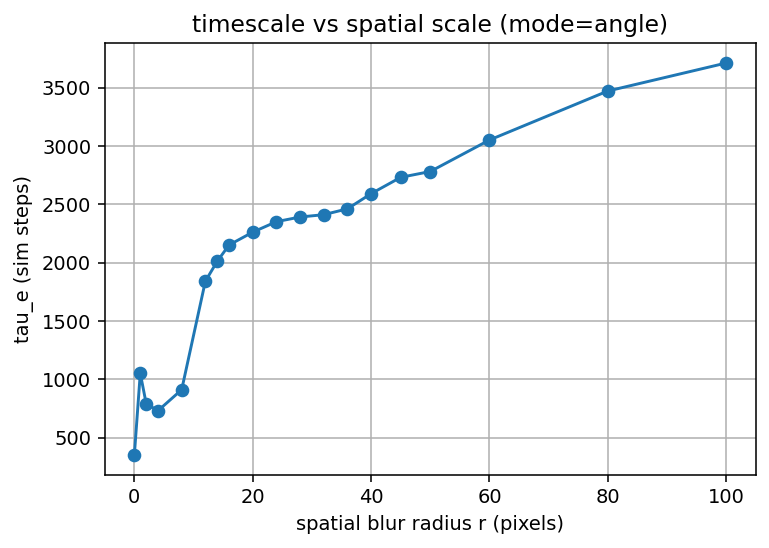

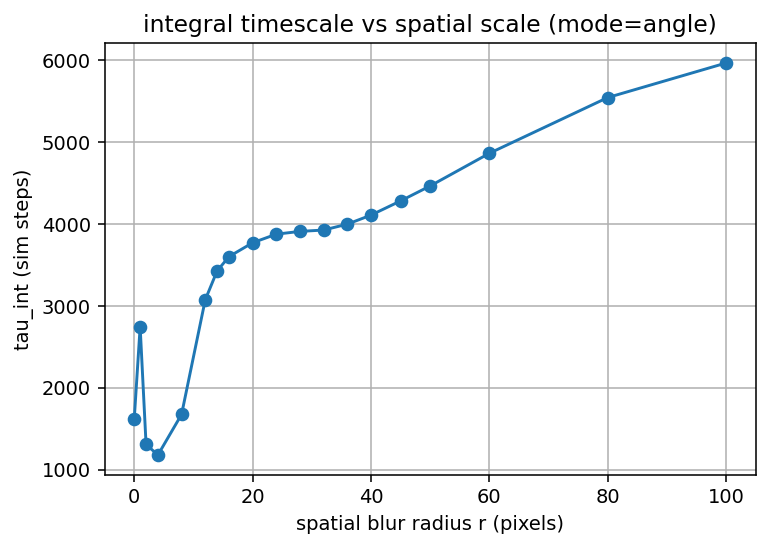

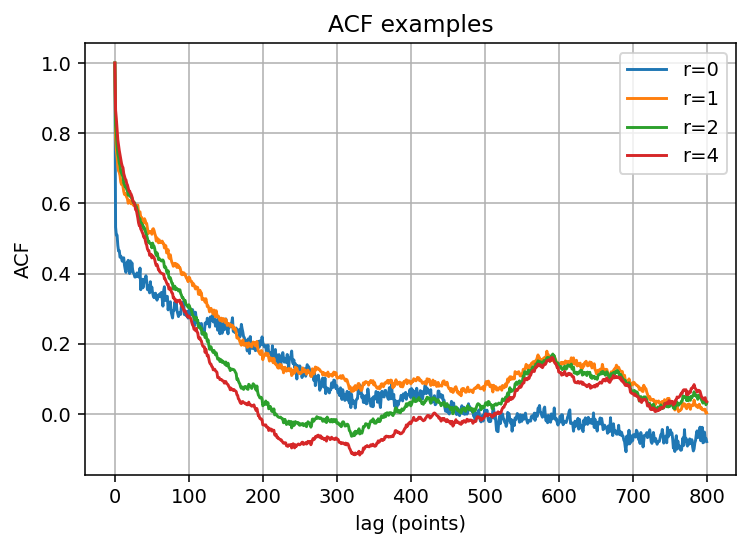

In [8]:
import numpy as np
import jax
import jax.numpy as jnp
from tqdm import tqdm
from collections import deque
import matplotlib.pyplot as plt

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2 = 0, 1000_000
frame_stride = 20            # берём каждый N-й снапшот
max_frames = 5000            # ограничение по числу обработанных точек (None = без ограничения)

hue_bins = 12
m_thr_frac = 0.02
sat_min = 0.08
val_min = 0.08

q_top = 0.95                 # агрегат по fg: верхний квантиль
r_list = [0, 1, 2, 4, 8, 12] # пространственные масштабы (радиус box blur)
max_lag = 400                # лаг ACF в шагах по обработанным кадрам

mode = "angle"               # "amp" или "angle"
delta_frames = 10            # только для mode="angle": угол между t и t-delta

eps = 1e-12

# ----------------------------
# SMALL HELPERS
# ----------------------------
def rgb_to_hsv(rgb):
    r, g, b = rgb[..., 0], rgb[..., 1], rgb[..., 2]
    cmax = jnp.maximum(jnp.maximum(r, g), b)
    cmin = jnp.minimum(jnp.minimum(r, g), b)
    delta = cmax - cmin
    delta_safe = delta + 1e-12

    h = jnp.zeros_like(cmax)
    is_r = (cmax == r) & (delta > 0)
    is_g = (cmax == g) & (delta > 0)
    is_b = (cmax == b) & (delta > 0)

    h = jnp.where(is_r, ((g - b) / delta_safe) % 6.0, h)
    h = jnp.where(is_g, ((b - r) / delta_safe) + 2.0, h)
    h = jnp.where(is_b, ((r - g) / delta_safe) + 4.0, h)
    h = (h / 6.0) % 1.0

    s = jnp.where(cmax > 0, delta / (cmax + 1e-12), 0.0)
    v = cmax
    return jnp.stack([h, s, v], axis=-1)

def rgb_bins_label(P, m, hue_bins=12, m_thr_frac=0.02, sat_min=0.08, val_min=0.08):
    rgb = jnp.clip(P[..., :3], 0.0, 1.0)
    hsv = rgb_to_hsv(rgb)
    h, s, v = hsv[..., 0], hsv[..., 1], hsv[..., 2]
    m_thr = m_thr_frac * (jnp.max(m) + 1e-12)
    fg = (m > m_thr) & (s > sat_min) & (v > val_min)
    bin_id = jnp.floor(h * hue_bins).astype(jnp.int32) + 1
    bin_id = jnp.where(bin_id > hue_bins, hue_bins, bin_id)
    return jnp.where(fg, bin_id, 0).astype(jnp.int32)

def box_blur_periodic(x, r):
    if r <= 0:
        return x
    acc = jnp.zeros_like(x)
    for k in range(-r, r + 1):
        acc = acc + jnp.roll(x, k, axis=0)
    acc = acc / float(2 * r + 1)
    acc2 = jnp.zeros_like(acc)
    for k in range(-r, r + 1):
        acc2 = acc2 + jnp.roll(acc, k, axis=1)
    return acc2 / float(2 * r + 1)

def acf_fft(x, max_lag):
    x = np.asarray(x, np.float64)
    x = x - x.mean()
    n = len(x)
    if n < 2:
        return np.full(max_lag + 1, np.nan)
    var = x.var() + 1e-12
    m = 1
    while m < 2 * n:
        m *= 2
    X = np.fft.rfft(x, n=m)
    c = np.fft.irfft(X * np.conj(X), n=m)[:max_lag + 1]
    norm = np.arange(n, n - (max_lag + 1), -1, dtype=np.float64)
    return (c / (var * norm))

def tau_e(ac, dt):
    thr = 1 / np.e
    idx = np.where(ac <= thr)[0]
    return float(idx[0] * dt) if len(idx) else float("nan")

def tau_int(ac, dt):
    ac = np.asarray(ac, np.float64)
    if not np.isfinite(ac[0]):
        return float("nan")
    s = 0.0
    for k in range(1, len(ac)):
        if ac[k] <= 0:
            break
        s += ac[k]
    return float(dt * (1.0 + 2.0 * s))

# ----------------------------
# DEVICE + JPERP
# ----------------------------
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# MAIN: build z_r(t) series
# ----------------------------
series = {r: [] for r in r_list}
fg_frac = []

buf_Jp = deque(maxlen=delta_frames + 1)

i = 0
kept = 0

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "P", "F")), desc="build"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        P = jnp.asarray(s["P"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)

    m, J, Jp, q, n = jperp_fn(A, F)                # Jp: (H,W,2)
    lab = rgb_bins_label(P, m, hue_bins, m_thr_frac, sat_min, val_min)
    fg = (lab > 0)

    fg_frac.append(float(jax.device_get(jnp.mean(fg.astype(jnp.float32)))))

    if mode == "amp":
        X = jnp.sqrt(jnp.sum(Jp * Jp, axis=-1) + eps)     # (H,W)
    elif mode == "angle":
        buf_Jp.append(Jp)
        if len(buf_Jp) < (delta_frames + 1):
            continue
        Jp0 = buf_Jp[0]
        Jp1 = buf_Jp[-1]
        n0 = jnp.sqrt(jnp.sum(Jp0 * Jp0, axis=-1) + eps)
        n1 = jnp.sqrt(jnp.sum(Jp1 * Jp1, axis=-1) + eps)
        u0 = Jp0 / (n0[..., None] + 1e-6)
        u1 = Jp1 / (n1[..., None] + 1e-6)
        c = jnp.clip(jnp.sum(u0 * u1, axis=-1), -1.0, 1.0)  # cos(angle)
        X = 1.0 - c                                         # 0..2, (H,W)
    else:
        raise ValueError("mode must be 'amp' or 'angle'")

    X_fg = jnp.where(fg, X, 0.0)

    outs = []
    for r in r_list:
        Xr = box_blur_periodic(X_fg, r)
        vals = Xr[fg]
        zr = jnp.where(vals.size > 0, jnp.quantile(vals, q_top), 0.0)
        outs.append(zr)

    outs_np = np.asarray(jax.device_get(jnp.stack(outs, axis=0)))
    for r, zr in zip(r_list, outs_np):
        series[r].append(float(zr))

    kept += 1
    if max_frames is not None and kept >= max_frames:
        break

print("built frames:", kept, "mode:", mode, "dt_per_point(sim steps) =", frame_stride)

# ----------------------------
# TIMESCALE ESTIMATION
# ----------------------------
dt = float(frame_stride)  # в "тиках симуляции", если это так у тебя определено

tau_e_map = {}
tau_int_map = {}
ac_map = {}

for r in r_list:
    z = np.asarray(series[r], dtype=np.float64)
    if len(z) < max_lag + 5:
        print("r", r, "too short:", len(z))
        continue
    ac = acf_fft(z, max_lag=max_lag)
    ac_map[r] = ac
    tau_e_map[r] = tau_e(ac, dt)
    tau_int_map[r] = tau_int(ac, dt)

print("tau_e by r:", tau_e_map)
print("tau_int by r:", tau_int_map)

# ----------------------------
# PLOTS (optional)
# ----------------------------
rs = [r for r in r_list if r in tau_e_map]
te = [tau_e_map[r] for r in rs]
ti = [tau_int_map[r] for r in rs]

plt.figure(figsize=(6,4), dpi=140)
plt.plot(rs, te, marker="o")
plt.xlabel("spatial blur radius r (pixels)")
plt.ylabel("tau_e (sim steps)")
plt.title(f"timescale vs spatial scale (mode={mode})")
plt.grid(True)
plt.show()

plt.figure(figsize=(6,4), dpi=140)
plt.plot(rs, ti, marker="o")
plt.xlabel("spatial blur radius r (pixels)")
plt.ylabel("tau_int (sim steps)")
plt.title(f"integral timescale vs spatial scale (mode={mode})")
plt.grid(True)
plt.show()

plt.figure(figsize=(6,4), dpi=140)
for r in rs[:4]:
    plt.plot(ac_map[r], label=f"r={r}")
plt.xlabel("lag (points)")
plt.ylabel("ACF")
plt.title("ACF examples")
plt.legend()
plt.grid(True)
plt.show()


r=0: 20000it [01:06, 301.43it/s]


r=0: dt≈1e+03 sim-steps/pt, tau_e≈1.11e+03 sim-steps, kept=1000


r=1: 20000it [01:06, 300.39it/s]


r=1: dt≈1e+03 sim-steps/pt, tau_e≈2.53e+03 sim-steps, kept=1000


r=2: 20000it [01:06, 299.74it/s]


r=2: dt≈1e+03 sim-steps/pt, tau_e≈2.39e+03 sim-steps, kept=1000


r=4: 20000it [01:07, 295.92it/s]


r=4: dt≈1e+03 sim-steps/pt, tau_e≈1.3e+03 sim-steps, kept=1000


r=8: 20000it [01:07, 296.57it/s]


r=8: dt≈1e+03 sim-steps/pt, tau_e≈1.17e+03 sim-steps, kept=1000


r=12: 20000it [01:07, 296.50it/s]


r=12: dt≈1e+03 sim-steps/pt, tau_e≈1.09e+03 sim-steps, kept=1000


r=16: 20000it [01:08, 293.66it/s]


r=16: dt≈1e+03 sim-steps/pt, tau_e≈1e+03 sim-steps, kept=1000


r=20: 20000it [01:08, 292.62it/s]


r=20: dt≈1e+03 sim-steps/pt, tau_e≈1e+03 sim-steps, kept=1000


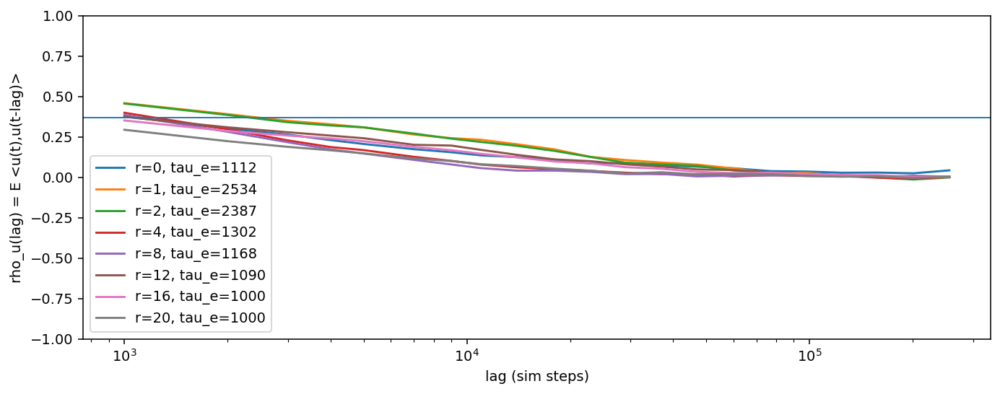

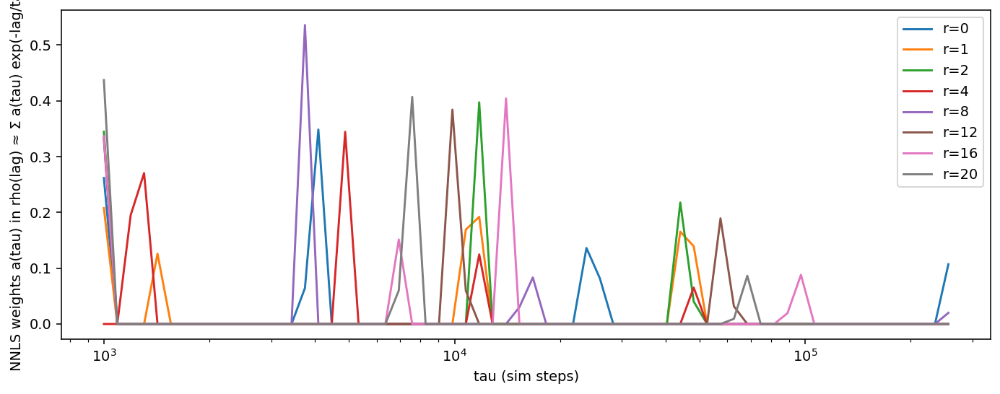

In [9]:
import numpy as np
from collections import deque
from tqdm import tqdm

import jax
import jax.numpy as jnp
from scipy.optimize import nnls

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn


# -----------------------------
# user params
# -----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2 = 0, 10000000

frame_stride = 20          # оставь как в основном прогоне
r_list = [0, 1, 2, 4, 8, 12, 16, 20]
pix_stride = 4             # 4..8 сильно ускоряет; влияет только на статистику (усреднение)

m_thr_frac = 0.02          # foreground по массе: m > frac*max(m)
norm_thr = 1e-6            # чтобы не брать нулевые направления
eps = 1e-6

max_lag = 256              # в "точках ряда" (после frame_stride)
n_lags = 24                # сколько лагов (лог-сетка)
n_tau = 64                 # сетка tau для разложения rho(lag) ~ sum_k a_k exp(-lag/tau_k)

device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)

jperp_fn = make_jperp_fn(eps=eps)


# -----------------------------
# helpers
# -----------------------------
def make_lag_list(max_lag: int, n_lags: int):
    lags = np.unique(np.round(np.logspace(0, np.log10(max_lag), n_lags)).astype(np.int32))
    lags = lags[(lags >= 1) & (lags <= max_lag)]
    return lags.tolist()

LAGS = make_lag_list(max_lag, n_lags)
Lmax = max(LAGS)

def box_blur_sep_periodic(x: jax.Array, r: int) -> jax.Array:
    # separable periodic box blur: O((2r+1)HW), not O((2r+1)^2 HW)
    if r <= 0:
        return x
    r = int(r)
    acc = jnp.zeros_like(x)
    for dx in range(-r, r + 1):
        acc = acc + jnp.roll(x, dx, axis=1)
    x1 = acc / float(2 * r + 1)
    acc = jnp.zeros_like(x1)
    for dy in range(-r, r + 1):
        acc = acc + jnp.roll(x1, dy, axis=0)
    return acc / float(2 * r + 1)

def make_u_sub_fn(r: int, pix_stride: int, m_thr_frac: float, norm_thr: float, eps: float):
    r = int(r); ps = int(pix_stride)
    m_thr_frac = float(m_thr_frac); norm_thr = float(norm_thr); eps = float(eps)

    @jax.jit
    def fn(A: jax.Array, F: jax.Array):
        m, _, Jperp, _, _ = jperp_fn(A, F)  # Jperp: (H,W,2)

        Jy = box_blur_sep_periodic(Jperp[..., 0], r)
        Jx = box_blur_sep_periodic(Jperp[..., 1], r)
        Jp = jnp.stack([Jy, Jx], axis=-1)

        nrm = jnp.sqrt(jnp.sum(Jp * Jp, axis=-1))
        u = Jp / (nrm[..., None] + eps)

        fg_m = m > (m_thr_frac * jnp.max(m))
        fg = fg_m & (nrm > norm_thr)

        # weight to downweight near-zero flows (still "angle" semantics, just avoids noise)
        w = jnp.where(fg, nrm, 0.0)

        u_s = u[::ps, ::ps, :]
        w_s = w[::ps, ::ps]
        return u_s, w_s

    return fn

def tau_e_from_rho(lags: np.ndarray, rho: np.ndarray, dt: float):
    thr = np.exp(-1.0)
    idx = np.where(rho <= thr)[0]
    if idx.size == 0:
        return np.inf
    i = int(idx[0])
    if i == 0:
        return float(lags[0] * dt)
    # linear interpolation between (lags[i-1],rho[i-1]) and (lags[i],rho[i])
    l0, l1 = float(lags[i - 1]), float(lags[i])
    r0, r1 = float(rho[i - 1]), float(rho[i])
    if r1 == r0:
        le = l1
    else:
        le = l0 + (thr - r0) * (l1 - l0) / (r1 - r0)
    return le * dt

def fit_timescale_spectrum_nnls(lags: np.ndarray, rho: np.ndarray, dt: float, n_tau: int):
    # tau grid in "sim steps"
    lmin = float(lags.min() * dt)
    lmax = float(lags.max() * dt)
    tau_grid = np.logspace(np.log10(max(lmin, 1e-9)), np.log10(lmax), n_tau).astype(np.float64)

    Phi = np.exp(- (lags[:, None] * dt) / tau_grid[None, :])  # shape (n_lags, n_tau)
    a, _ = nnls(Phi, rho.astype(np.float64))
    if a.sum() > 0:
        a = a / a.sum()
    return tau_grid, a


# -----------------------------
# main: compute rho_u(lag) per r
# -----------------------------
results = {}

for r in r_list:
    u_fn = make_u_sub_fn(r, pix_stride, m_thr_frac, norm_thr, eps)

    num = np.zeros((len(LAGS),), dtype=np.float64)
    den = np.zeros((len(LAGS),), dtype=np.float64)

    buf_u = deque(maxlen=Lmax + 1)
    buf_w = deque(maxlen=Lmax + 1)

    kept = 0
    prev_kept_step = None
    dt_list = []

    i = 0
    it = iter_npz_snapshots(save_pth, t1, t2, fields=("A", "F"))
    for step, s in tqdm(it, desc=f"r={r}"):
        if (i % frame_stride) != 0:
            i += 1
            continue
        i += 1

        with jax.default_device(dev):
            A = jnp.asarray(s["A"], dtype=jnp.float32)
            F = jnp.asarray(s["F"], dtype=jnp.float32)

        u_s, w_s = u_fn(A, F)
        u_np = np.asarray(u_s)   # (H',W',2)
        w_np = np.asarray(w_s)   # (H',W')

        buf_u.append(u_np)
        buf_w.append(w_np)

        kept += 1
        if prev_kept_step is not None:
            dt_list.append(int(step) - int(prev_kept_step))
        prev_kept_step = int(step)

        if len(buf_u) < (Lmax + 1):
            continue

        u_cur = buf_u[-1]
        w_cur = buf_w[-1]

        for j, lag in enumerate(LAGS):
            u_old = buf_u[-1 - lag]
            w_old = buf_w[-1 - lag]

            w = np.minimum(w_cur, w_old)  # weight only where both are valid
            mask = w > 0.0

            if mask.any():
                dot = (u_cur[..., 0] * u_old[..., 0] + u_cur[..., 1] * u_old[..., 1])
                num[j] += float((w[mask] * dot[mask]).sum())
                den[j] += float(w[mask].sum())

    lags = np.asarray(LAGS, dtype=np.int32)
    rho = np.where(den > 0, num / den, np.nan).astype(np.float64)

    dt_hat = float(np.median(dt_list)) if len(dt_list) else 1.0  # "sim steps" per one kept point
    tau_e = tau_e_from_rho(lags, rho, dt_hat)

    tau_grid, a = fit_timescale_spectrum_nnls(lags, rho, dt_hat, n_tau=n_tau)

    results[r] = dict(
        lags=lags,
        rho=rho,
        dt=dt_hat,
        tau_e=tau_e,
        tau_grid=tau_grid,
        a=a,
        kept=kept,
    )

    print(f"r={r}: dt≈{dt_hat:.3g} sim-steps/pt, tau_e≈{tau_e:.3g} sim-steps, kept={kept}")


# -----------------------------
# quick plots (optional)
# -----------------------------
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4), dpi=140)
for r in r_list:
    lags = results[r]["lags"] * results[r]["dt"]
    rho  = results[r]["rho"]
    plt.plot(lags, rho, label=f"r={r}, tau_e={results[r]['tau_e']:.0f}")
plt.axhline(np.exp(-1.0), linewidth=1)
plt.xscale("log")
plt.ylim(-1.0, 1.0)
plt.xlabel("lag (sim steps)")
plt.ylabel("rho_u(lag) = E <u(t),u(t-lag)>")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,4), dpi=140)
for r in r_list:
    tau = results[r]["tau_grid"]
    a   = results[r]["a"]
    plt.plot(tau, a, label=f"r={r}")
plt.xscale("log")
plt.xlabel("tau (sim steps)")
plt.ylabel("NNLS weights a(tau) in rho(lag) ≈ Σ a(tau) exp(-lag/tau)")
plt.legend()
plt.tight_layout()
plt.show()

build series: 91it [00:11, 23.62it/s]

build series: 20000it [16:24, 20.31it/s]


T = 20000 R = 6 dt_sim = 50.0 | agg = topk_mean k_pix = 128


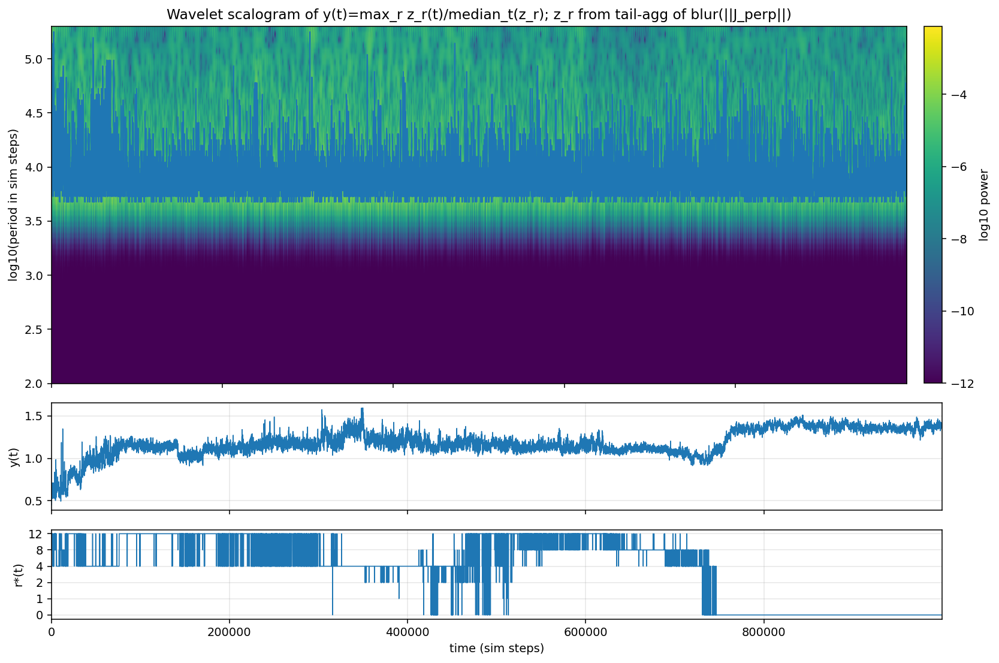

picked events (indices): [ 6996  6076 16871 17500 16718  6803  5006 19428 17832 16243] ...


In [4]:
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from functools import partial


import jax
import jax.numpy as jnp

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ============================
# CONFIG (адекватные дефолты под t2=1e6 sim steps, лог раз в 50)
# ============================
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2 = 0, 1_000_000              # sim steps
frame_stride = 1                   # не увеличивать, иначе потеряешь 500..2000

r_list = [0, 1, 2, 4, 8, 12]
eps = 1e-12

# foreground mask (как у тебя)
hue_bins = 12
m_thr_frac = 0.02
sat_min = 0.08
val_min = 0.08

# spatial tail aggregation:
#  - "topk_mean": устойчивее, меньше реагирует на одиночный пиксель
#  - "topk_min" : прокси высокого перцентиля (примерно q ~ 1 - k_pix/(H*W))
spatial_agg = "topk_mean"
k_pix = 128

# wavelet periods (в sim steps)
w0 = 6.0
n_periods = 64
period_min_sim = None              # если None -> 2*dt_sim
period_max_sim = 200_000.0         # под 1e6 достаточно

# event picking / debug
top_events = 30
min_sep_sim = 5000.0               # минимальная дистанция между событиями (sim steps)
debug_topk = 512                   # сколько точек подсвечивать на карте в дебаге
debug_window_pts = 200             # окно вокруг события в точках (не sim steps)

# ============================
# DEVICE + JPERP
# ============================
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ============================
# HSV helpers (self-contained)
# ============================
def rgb_to_hsv(rgb):
    r, g, b = rgb[..., 0], rgb[..., 1], rgb[..., 2]
    cmax = jnp.maximum(jnp.maximum(r, g), b)
    cmin = jnp.minimum(jnp.minimum(r, g), b)
    delta = cmax - cmin
    delta_safe = delta + 1e-12

    h = jnp.zeros_like(cmax)
    is_r = (cmax == r) & (delta > 0)
    is_g = (cmax == g) & (delta > 0)
    is_b = (cmax == b) & (delta > 0)

    h = jnp.where(is_r, ((g - b) / delta_safe) % 6.0, h)
    h = jnp.where(is_g, ((b - r) / delta_safe) + 2.0, h)
    h = jnp.where(is_b, ((r - g) / delta_safe) + 4.0, h)
    h = (h / 6.0) % 1.0

    s = jnp.where(cmax > 0, delta / (cmax + 1e-12), 0.0)
    v = cmax
    return jnp.stack([h, s, v], axis=-1)

def rgb_bins_label(P, m, hue_bins=12, m_thr_frac=0.02, sat_min=0.08, val_min=0.08):
    rgb = jnp.clip(P[..., :3], 0.0, 1.0)
    hsv = rgb_to_hsv(rgb)
    h, s, v = hsv[..., 0], hsv[..., 1], hsv[..., 2]
    m_thr = m_thr_frac * (jnp.max(m) + 1e-12)
    fg = (m > m_thr) & (s > sat_min) & (v > val_min)
    bin_id = jnp.floor(h * hue_bins).astype(jnp.int32) + 1
    bin_id = jnp.where(bin_id > hue_bins, hue_bins, bin_id)
    return jnp.where(fg, bin_id, 0).astype(jnp.int32)

# ============================
# Fast periodic box blur in O(HW) via cumsum (no roll loops)
# ============================
def circ_boxblur_1d(x, r, axis):
    if r <= 0:
        return x
    w = 2 * r + 1
    y = jnp.moveaxis(x, axis, 0)
    L = y.shape[0]
    y_ext = jnp.concatenate([y, y[:2*r]], axis=0)
    cs = jnp.cumsum(y_ext, axis=0)
    cs0 = jnp.concatenate([jnp.zeros_like(cs[:1]), cs], axis=0)
    sums = cs0[w:w+L] - cs0[:L]
    out = sums / float(w)
    return jnp.moveaxis(out, 0, axis)

def box_blur_periodic_fast_2d(x, r):
    if r <= 0:
        return x
    x = circ_boxblur_1d(x, r, axis=0)
    x = circ_boxblur_1d(x, r, axis=1)
    return x

# ============================
# Tail aggregators (no full sort)
# ============================

@partial(jax.jit, static_argnames=("mode", "k_pix"))
def tail_agg_2d(X, k_pix=128, mode="topk_mean"):
    flat = X.reshape(-1)
    k = min(k_pix, flat.shape[0])       # Python int, static for top_k
    vals, _ = jax.lax.top_k(flat, k)    # descending
    if mode == "topk_min":
        return vals[-1]
    return jnp.mean(vals)

# ============================
# Build Z(t,r), y(t), r*(t)  (cheap memory: store only T x R)
# ============================
steps = []
fg_frac = []
Z = []

i = 0
for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "P", "F")), desc="build series"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        P = jnp.asarray(s["P"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)

        m, J, Jp, q, n = jperp_fn(A, F)                                   # Jp: (H,W,2)
        lab = rgb_bins_label(P, m, hue_bins, m_thr_frac, sat_min, val_min)
        fg = (lab > 0)

        X = jnp.sqrt(jnp.sum(Jp * Jp, axis=-1) + eps)                      # ||J_perp|| (H,W)
        X = jnp.where(fg, X, 0.0)

        outs = []
        for r in r_list:
            Xr = box_blur_periodic_fast_2d(X, r)
            outs.append(tail_agg_2d(Xr, k_pix=k_pix, mode=spatial_agg))
        outs = jnp.stack(outs, axis=0)

        fg_frac_t = jnp.mean(fg.astype(jnp.float32))

    steps.append(int(t))
    fg_frac.append(float(jax.device_get(fg_frac_t)))
    Z.append(np.asarray(jax.device_get(outs), dtype=np.float32))

steps = np.asarray(steps, dtype=np.int64)
fg_frac = np.asarray(fg_frac, dtype=np.float32)
Z = np.stack(Z, axis=0)                                                     # (T,R)

dt_sim = float(np.median(np.diff(steps)))
print("T =", Z.shape[0], "R =", Z.shape[1], "dt_sim =", dt_sim, "| agg =", spatial_agg, "k_pix =", k_pix)

med_r = np.median(Z, axis=0, keepdims=True) + 1e-12
Znorm = Z / med_r
y = np.max(Znorm, axis=1)                                                   # (T,)
r_star = np.argmax(Znorm, axis=1).astype(np.int32)                          # (T,)

# ============================
# Wavelet (Morlet) via FFT => scalogram power[scale, time]
# ============================
def morlet_cwt_power(x, dt, periods, w0=6.0):
    x = np.asarray(x, np.float64)
    x = x - x.mean()
    n = x.shape[0]
    m = int(2 ** np.ceil(np.log2(n)))
    X = np.fft.rfft(x, n=m)

    omega = 2.0 * np.pi * np.fft.rfftfreq(m, d=dt)
    fourier_factor = (4.0 * np.pi) / (w0 + np.sqrt(2.0 + w0*w0))
    scales = periods / (fourier_factor * dt)

    power = np.empty((len(scales), n), np.float32)
    const = (np.pi ** -0.25)

    for i, s in enumerate(scales):
        norm = const * np.sqrt(dt / s)
        psi_hat = norm * np.exp(-0.5 * (s * omega - w0) ** 2)
        psi_hat[omega <= 0] = 0.0
        W = np.fft.irfft(X * psi_hat, n=m)[:n]
        power[i] = (W.real * W.real + W.imag * W.imag).astype(np.float32)

    return power

if period_min_sim is None:
    period_min_sim = 2.0 * dt_sim

periods = np.logspace(np.log10(period_min_sim), np.log10(period_max_sim), n_periods)
power = morlet_cwt_power(y, dt_sim, periods, w0=w0)                          # (S,T)
ridge_idx = np.argmax(power, axis=0)
ridge_logT = np.log10(periods[ridge_idx])

# ============================
# Main figure (scalogram + y + r*)
# ============================
t_axis = steps.astype(np.float64)

fig, (ax0, ax1, ax2) = plt.subplots(
    3, 1, figsize=(12, 8), dpi=140, sharex=True,
    gridspec_kw={"height_ratios": [4, 1.2, 1.0]}
)

Zimg = np.log10(power + 1e-12)
ax0.imshow(
    Zimg, aspect="auto", origin="lower",
    extent=[float(t_axis[0]), float(t_axis[-1]),
            float(np.log10(periods[0])), float(np.log10(periods[-1]))]
)
ax0.plot(t_axis, ridge_logT, linewidth=1.0)
ax0.set_ylabel("log10(period in sim steps)")
ax0.set_title("Wavelet scalogram of y(t)=max_r z_r(t)/median_t(z_r); z_r from tail-agg of blur(||J_perp||)")

cb = fig.colorbar(ax0.images[0], ax=ax0, fraction=0.02, pad=0.02)
cb.set_label("log10 power")

ax1.plot(t_axis, y, linewidth=0.8)
ax1.set_ylabel("y(t)")
ax1.grid(True, alpha=0.3)

ax2.plot(t_axis, r_star.astype(np.float32), linewidth=0.8)
ax2.set_yticks(range(len(r_list)))
ax2.set_yticklabels([str(r) for r in r_list])
ax2.set_ylabel("r*(t)")
ax2.set_xlabel("time (sim steps)")
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================
# Event picker (top peaks with separation) + snapshot loader cache
# ============================
def pick_events(y, steps, topn=30, min_sep_sim=5000.0, dt_sim=50.0):
    idx_sorted = np.argsort(y)[::-1]
    min_sep_pts = int(np.ceil(min_sep_sim / dt_sim))
    chosen = []
    for idx in idx_sorted:
        if all(abs(idx - j) >= min_sep_pts for j in chosen):
            chosen.append(int(idx))
            if len(chosen) >= topn:
                break
    return np.asarray(chosen, dtype=np.int32)

events = pick_events(y, steps, topn=top_events, min_sep_sim=min_sep_sim, dt_sim=dt_sim)
print("picked events (indices):", events[:10], "...")

_snap_cache = {}  # step -> dict(A,P,F)

def load_snapshot(step):
    step = int(step)
    if step in _snap_cache:
        return _snap_cache[step]
    for tt, ss in iter_npz_snapshots(save_pth, step, step+1, fields=("A","P","F")):
        _snap_cache[step] = ss
        return ss
    raise KeyError(f"snapshot step={step} not found")

# ============================
# Debug: inspect a chosen event without rebuilding the whole run
# ============================
def debug_event(event_rank=0, window_pts=200, show_prev=True):
    """
    event_rank: индекс в массиве events (0 = самый сильный)
    window_pts: окно по индексам ряда (не sim steps), для графиков y/z/fg
    """
    idx = int(events[event_rank])
    step = int(steps[idx])
    rr = int(r_list[int(r_star[idx])])

    lo = max(0, idx - window_pts)
    hi = min(len(steps), idx + window_pts + 1)

    ss = load_snapshot(step)
    with jax.default_device(dev):
        A = jnp.asarray(ss["A"], dtype=jnp.float32)
        P = jnp.asarray(ss["P"], dtype=jnp.float32)
        F = jnp.asarray(ss["F"], dtype=jnp.float32)

        m, J, Jp, q, n = jperp_fn(A, F)
        lab = rgb_bins_label(P, m, hue_bins, m_thr_frac, sat_min, val_min)
        fg = (lab > 0)

        X = jnp.sqrt(jnp.sum(Jp * Jp, axis=-1) + eps)
        X_fg = jnp.where(fg, X, 0.0)

        Xr = box_blur_periodic_fast_2d(X_fg, rr)

        flat = Xr.reshape(-1)
        k = int(min(debug_topk, flat.shape[0]))
        vals, inds = jax.lax.top_k(flat, k)
        inds = jax.device_get(inds)
        H, W = Xr.shape
        ys = (inds // W).astype(np.int32)
        xs = (inds %  W).astype(np.int32)

        X_np = np.asarray(jax.device_get(X), dtype=np.float32)
        Xfg_np = np.asarray(jax.device_get(X_fg), dtype=np.float32)
        Xr_np = np.asarray(jax.device_get(Xr), dtype=np.float32)
        fg_np = np.asarray(jax.device_get(fg), dtype=np.uint8)
        m_np = np.asarray(jax.device_get(m), dtype=np.float32)

    fig, axs = plt.subplots(2, 3, figsize=(14, 8), dpi=140)

    # (0,0) time series window
    axs[0,0].plot(steps[lo:hi], y[lo:hi], linewidth=0.9, label="y(t)")
    axs[0,0].axvline(step, linewidth=1.0)
    axs[0,0].set_title(f"event_rank={event_rank}  idx={idx}  step={step}  r*={rr}")
    axs[0,0].grid(True, alpha=0.3)
    axs[0,0].legend()

    # (0,1) z_r in window (normalized) + highlight chosen r*
    for j, r in enumerate(r_list):
        axs[0,1].plot(steps[lo:hi], Znorm[lo:hi, j], linewidth=0.7)
    axs[0,1].axvline(step, linewidth=1.0)
    axs[0,1].set_title("Znorm(t,r)=z_r/median_t(z_r) in window")
    axs[0,1].grid(True, alpha=0.3)

    # (0,2) fg fraction
    axs[0,2].plot(steps[lo:hi], fg_frac[lo:hi], linewidth=0.9)
    axs[0,2].axvline(step, linewidth=1.0)
    axs[0,2].set_title("fg_frac(t) in window")
    axs[0,2].grid(True, alpha=0.3)

    # (1,0) raw amplitude map ||J_perp||
    im0 = axs[1,0].imshow(X_np, origin="lower")
    axs[1,0].set_title("X(t,x)=||J_perp|| (raw)")
    fig.colorbar(im0, ax=axs[1,0], fraction=0.046, pad=0.04)

    # (1,1) masked amplitude + fg overlay
    im1 = axs[1,1].imshow(Xfg_np, origin="lower")
    axs[1,1].imshow(fg_np, origin="lower", alpha=0.20)
    axs[1,1].set_title("X_fg(t,x)=X*fg + fg overlay")
    fig.colorbar(im1, ax=axs[1,1], fraction=0.046, pad=0.04)

    # (1,2) blurred map at r* with top-k points overlay
    im2 = axs[1,2].imshow(Xr_np, origin="lower")
    axs[1,2].scatter(xs, ys, s=6, linewidths=0.0)
    axs[1,2].set_title(f"X_r(t,x)=blur(X_fg,r={rr}) + top-{debug_topk} pixels")
    fig.colorbar(im2, ax=axs[1,2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    if show_prev and idx > 0:
        step0 = int(steps[idx-1])
        ss0 = load_snapshot(step0)
        with jax.default_device(dev):
            A0 = jnp.asarray(ss0["A"], dtype=jnp.float32)
            P0 = jnp.asarray(ss0["P"], dtype=jnp.float32)
            F0 = jnp.asarray(ss0["F"], dtype=jnp.float32)
            m0, J0, Jp0, q0, n0 = jperp_fn(A0, F0)
            lab0 = rgb_bins_label(P0, m0, hue_bins, m_thr_frac, sat_min, val_min)
            fg0 = (lab0 > 0)
            X0 = jnp.sqrt(jnp.sum(Jp0 * Jp0, axis=-1) + eps)
            X0_fg = jnp.where(fg0, X0, 0.0)
            X0r = box_blur_periodic_fast_2d(X0_fg, rr)

            X0r_np = np.asarray(jax.device_get(X0r), dtype=np.float32)

        plt.figure(figsize=(12, 4), dpi=140)
        plt.subplot(1, 3, 1)
        plt.imshow(X0r_np, origin="lower")
        plt.title(f"prev: blur(X_fg, r={rr}) at step={step0}")
        plt.colorbar(fraction=0.046, pad=0.04)

        plt.subplot(1, 3, 2)
        plt.imshow(Xr_np, origin="lower")
        plt.title(f"curr: blur(X_fg, r={rr}) at step={step}")
        plt.colorbar(fraction=0.046, pad=0.04)

        plt.subplot(1, 3, 3)
        plt.imshow(Xr_np - X0r_np, origin="lower")
        plt.title("diff: curr - prev")
        plt.colorbar(fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

# пример: debug_event(0)

In [7]:
import os
import numpy as np

def save_precomputed_series(path, *, steps, dt_sim, r_list, Z, Znorm=None, y=None, r_star=None, fg_frac=None, meta=None):
    """
    Saves precomputed series to a single .npz.
    steps: (T,) int64 sim steps
    dt_sim: float
    r_list: (R,) int
    Z: (T,R) float32
    Optional: Znorm (T,R), y (T,), r_star (T,), fg_frac (T,)
    meta: dict of scalars/strings (will be saved as np.array(object))
    """
    os.makedirs(os.path.dirname(path) or ".", exist_ok=True)
    payload = {
        "steps": np.asarray(steps, np.int64),
        "dt_sim": np.asarray(dt_sim, np.float64),
        "r_list": np.asarray(r_list, np.int32),
        "Z": np.asarray(Z, np.float32),
    }
    if Znorm is not None: payload["Znorm"] = np.asarray(Znorm, np.float32)
    if y is not None:     payload["y"]     = np.asarray(y, np.float32)
    if r_star is not None:payload["r_star"]= np.asarray(r_star, np.int32)
    if fg_frac is not None:payload["fg_frac"]= np.asarray(fg_frac, np.float32)
    if meta is not None:  payload["meta"]  = np.asarray(meta, dtype=object)

    np.savez_compressed(path, **payload)

def load_precomputed_series(path):
    """
    Loads the .npz saved by save_precomputed_series.
    Returns a dict with numpy arrays; missing optional fields won't be present.
    """
    d = np.load(path, allow_pickle=True)
    out = {k: d[k] for k in d.files}
    # unwrap meta if present
    if "meta" in out:
        try:
            out["meta"] = out["meta"].item()
        except Exception:
            pass
    return out

# ---- usage ----
# save:
# save_precomputed_series(
#     "precomputed/series_apf_2602021501.npz",
#     steps=steps, dt_sim=dt_sim, r_list=r_list, Z=Z,
#     Znorm=Znorm, y=y, r_star=r_star, fg_frac=fg_frac,
#     meta={"save_pth": save_pth, "t1": t1, "t2": t2, "frame_stride": frame_stride,
#           "k_pix": k_pix, "spatial_agg": spatial_agg, "m_thr_frac": m_thr_frac,
#           "sat_min": sat_min, "val_min": val_min}
# )

# load:
dat = load_precomputed_series("precomputed/series_apf_2602021501.npz")
steps = dat["steps"]; dt_sim = float(dat["dt_sim"]); r_list = dat["r_list"]
Z = dat["Z"]
Znorm = dat.get("Znorm", None); y = dat.get("y", None)
r_star = dat.get("r_star", None); fg_frac = dat.get("fg_frac", None)
meta = dat.get("meta", {})

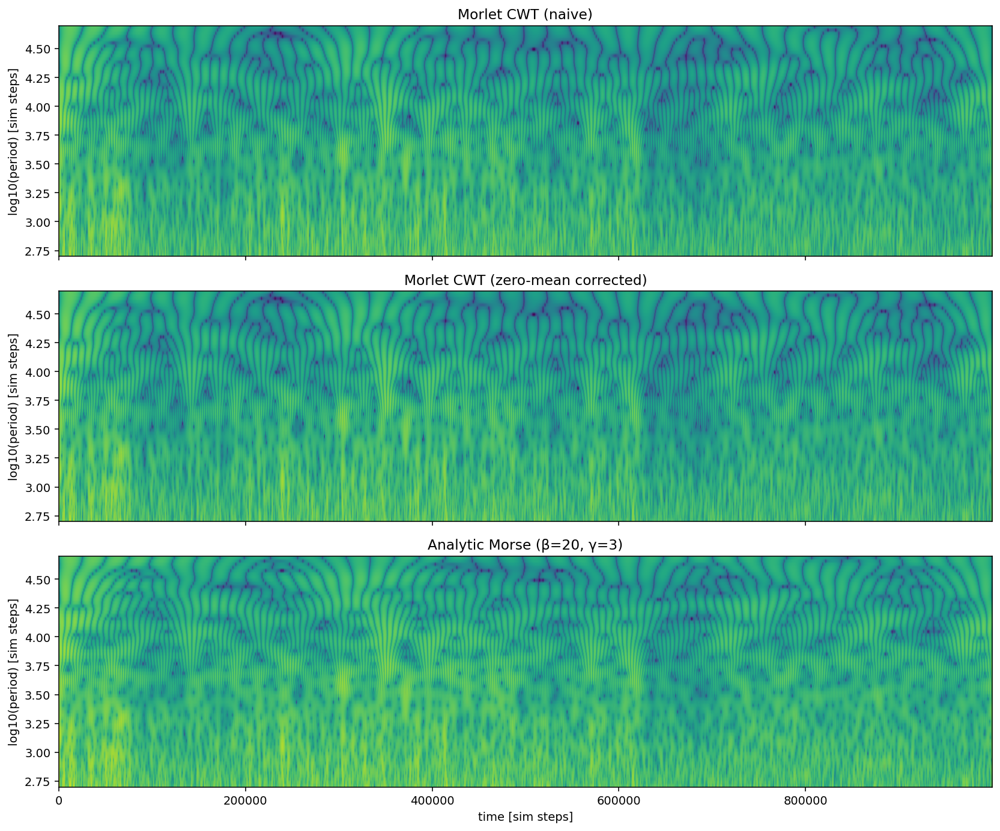

In [8]:
# Assumes you already have in memory from previous run:
#   y: (T,) float
#   steps: (T,) int (sim steps)
#   dt_sim: float (sim steps per sample) ~ 50
#
# Goal: compare several CWTs for artifacts over periods 500..50000 sim-steps.

import numpy as np
import matplotlib.pyplot as plt

# ----------------------------
# common period grid (your requested range)
# ----------------------------
period_min, period_max = 500.0, 50_000.0
n_periods = 72
periods = np.logspace(np.log10(period_min), np.log10(period_max), n_periods)

# ----------------------------
# FFT-based CWT power: Morlet (naive), Morlet (zero-mean corrected), Analytic Morse
# ----------------------------
def cwt_power_fft(x, dt, periods, kind="morlet", w0=6.0, morlet_corrected=False,
                  morse_beta=20.0, morse_gamma=3.0):
    """
    x: (T,) real
    dt: sim steps per sample
    periods: (S,) in sim steps
    returns power: (S,T)
    """
    x = np.asarray(x, np.float64)
    x = x - x.mean()
    T = x.shape[0]
    M = int(2 ** np.ceil(np.log2(T)))
    X = np.fft.rfft(x, n=M)

    omega = 2.0 * np.pi * np.fft.rfftfreq(M, d=dt)  # rad / sim-step
    # analytic: keep only positive frequencies (rfft already >=0); we'll zero DC if desired
    power = np.empty((len(periods), T), np.float32)

    if kind == "morlet":
        # Morlet "Fourier factor" mapping: period ~ fourier_factor * scale
        fourier_factor = (4.0 * np.pi) / (w0 + np.sqrt(2.0 + w0*w0))
        scales = periods / fourier_factor  # IMPORTANT: scales in sim-steps (not samples)

        const = (np.pi ** -0.25)
        for i, s in enumerate(scales):
            # bandpass centered around w0/s with Gaussian width ~1/s
            base = np.exp(-0.5 * (s * omega - w0) ** 2)

            if morlet_corrected:
                # zero-mean correction (textbook): exp(-0.5 (ω-ω0)^2) - exp(-0.5 ω0^2) exp(-0.5 ω^2)
                corr = np.exp(-0.5 * (w0 ** 2)) * np.exp(-0.5 * (s * omega) ** 2)
                base = base - corr

            # enforce analytic (drop DC, and keep ω>0 only)
            base = base.copy()
            base[omega <= 0] = 0.0

            # mild normalization (comparable visuals; absolute scaling not the point here)
            psi_hat = const * np.sqrt(dt / (s + 1e-12)) * base

            W = np.fft.irfft(X * psi_hat, n=M)[:T]
            power[i] = (W.real * W.real + W.imag * W.imag).astype(np.float32)

        return power

    if kind == "morse":
        # Analytic generalized Morse wavelet in frequency domain:
        #   ψ̂(ω) ∝ ω^β exp(-ω^γ), ω>0
        # Choose mapping period ~ 2π / ω_peak, where ω_peak = (β/γ)^(1/γ)
        beta, gamma = float(morse_beta), float(morse_gamma)
        w_peak = (beta / gamma) ** (1.0 / gamma)  # rad / (scale units)

        # we want wavelet centered at ω_c = 2π / period
        omega_c = 2.0 * np.pi / periods           # rad / sim-step
        scales = w_peak / (omega_c + 1e-30)       # scale in sim-steps so that (scale*ω) peaks near ω_c

        for i, s in enumerate(scales):
            u = s * omega
            base = (u ** beta) * np.exp(-(u ** gamma))
            base = base.copy()
            base[omega <= 0] = 0.0

            # normalize peak to 1 for comparability across scales
            m = base.max()
            if m > 0:
                base = base / m

            # simple scale normalization (again: visual comparison, not absolute units)
            psi_hat = np.sqrt(dt / (s + 1e-12)) * base

            W = np.fft.irfft(X * psi_hat, n=M)[:T]
            power[i] = (W.real * W.real + W.imag * W.imag).astype(np.float32)

        return power

    raise ValueError("kind must be 'morlet' or 'morse'")

# ----------------------------
# compute
# ----------------------------
P_morlet = cwt_power_fft(y, dt_sim, periods, kind="morlet", w0=6.0, morlet_corrected=False)
P_morlet_zm = cwt_power_fft(y, dt_sim, periods, kind="morlet", w0=6.0, morlet_corrected=True)

# Morse parameters: these are reasonable defaults for “clean analytic” behavior;
# tweak beta up for narrower band (more freq resolution), down for more time localization.
P_morse = cwt_power_fft(y, dt_sim, periods, kind="morse", morse_beta=20.0, morse_gamma=3.0)

# ----------------------------
# plot comparison (same axes)
# ----------------------------
t0, t1 = float(steps[0]), float(steps[-1])
y0, y1 = float(np.log10(periods[0])), float(np.log10(periods[-1]))

def show(ax, power, title):
    Z = np.log10(power + 1e-12)
    ax.imshow(Z, aspect="auto", origin="lower", extent=[t0, t1, y0, y1])
    ax.set_title(title)
    ax.set_ylabel("log10(period) [sim steps]")

fig, axs = plt.subplots(3, 1, figsize=(12, 10), dpi=140, sharex=True)
show(axs[0], P_morlet,    "Morlet CWT (naive)")
show(axs[1], P_morlet_zm, "Morlet CWT (zero-mean corrected)")
show(axs[2], P_morse,     "Analytic Morse (β=20, γ=3)")

axs[2].set_xlabel("time [sim steps]")
plt.tight_layout()
plt.show()

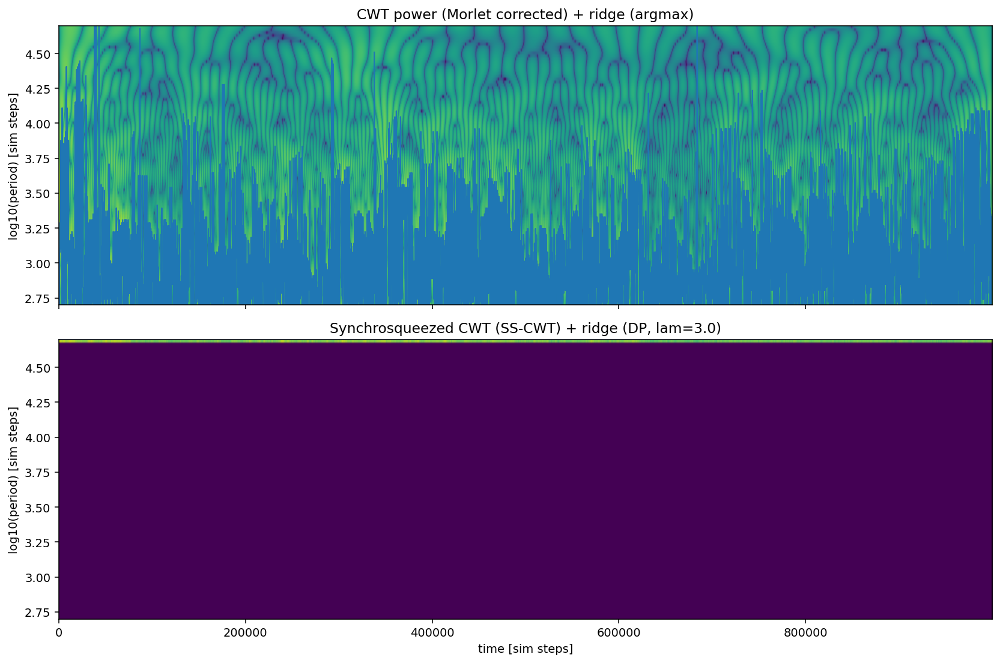

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- config ----------
period_min, period_max = 500.0, 50_000.0
n_periods = 96
periods = np.logspace(np.log10(period_min), np.log10(period_max), n_periods)

w0 = 6.0
use_zero_mean_correction = True

# ridge smoothing (DP). If lam=0 -> pure argmax ridge.
lam = 3.0

# ---------- CWT (complex) via FFT: Morlet (analytic), with optional zero-mean correction ----------
def morlet_cwt_complex(x, dt, periods, w0=6.0, zero_mean=True):
    """
    x: (T,) real
    dt: sim steps per sample
    periods: (S,) in sim steps
    returns:
      W: (S,T) complex64  (CWT coeffs)
      scales: (S,) in sim steps
    """
    x = np.asarray(x, np.float64)
    x = x - x.mean()
    T = x.shape[0]
    M = int(2 ** np.ceil(np.log2(T)))
    X = np.fft.rfft(x, n=M)

    omega = 2.0 * np.pi * np.fft.rfftfreq(M, d=dt)  # rad / sim-step

    fourier_factor = (4.0 * np.pi) / (w0 + np.sqrt(2.0 + w0*w0))
    scales = periods / fourier_factor               # scale in sim steps (IMPORTANT)

    const = (np.pi ** -0.25)
    W = np.empty((len(scales), T), np.complex64)

    for i, s in enumerate(scales):
        base = np.exp(-0.5 * (s * omega - w0) ** 2)

        if zero_mean:
            corr = np.exp(-0.5 * (w0 ** 2)) * np.exp(-0.5 * (s * omega) ** 2)
            base = base - corr

        base = base.copy()
        base[omega <= 0] = 0.0  # analytic, drop DC too

        psi_hat = const * np.sqrt(dt / (s + 1e-12)) * base
        w = np.fft.irfft(X * psi_hat, n=M)[:T]
        W[i] = w.astype(np.complex64)

    return W, scales

# ---------- Synchrosqueezing ----------
def synchrosqueeze_from_cwt(W, dt, periods):
    """
    W: (S,T) complex CWT coeffs
    dt: sim steps per sample
    periods: (S,) target period bins in sim steps (log-spaced recommended)
    returns:
      SS: (S,T) float32  (synchrosqueezed power on same period grid)
      ridge_period_argmax: (T,) float32  (argmax period in SS at each time)
    """
    S, T = W.shape
    eps = 1e-12

    # d/dt W using central differences in time, units: per sample; convert to per sim-step by /dt
    dW = np.empty_like(W)
    dW[:, 1:-1] = (W[:, 2:] - W[:, :-2]) / (2.0 * dt)
    dW[:, 0] = (W[:, 1] - W[:, 0]) / dt
    dW[:, -1] = (W[:, -1] - W[:, -2]) / dt

    # instantaneous angular frequency ω(t,s) = Im( (dW/W) )
    ratio = dW / (W + eps)
    omega_inst = np.imag(ratio).astype(np.float64)  # rad / sim-step

    # convert to period in sim steps: T = 2π / ω
    omega_abs = np.maximum(np.abs(omega_inst), 1e-12)
    T_inst = (2.0 * np.pi) / omega_abs  # sim steps

    # target bins in log-period
    logP = np.log(periods).astype(np.float64)
    SS = np.zeros((len(periods), T), np.float32)

    # weights: power; you can also use |W|, but power is typical for visualization
    Pwr = (W.real * W.real + W.imag * W.imag).astype(np.float32)

    # map each (s,t) to nearest period-bin (in log-space)
    # O(S*T) but S~100 and T~20k is ok in numpy.
    for si in range(S):
        lp = np.log(np.clip(T_inst[si], periods[0], periods[-1]))
        idx = np.searchsorted(logP, lp)  # 0..S
        idx = np.clip(idx, 1, len(periods)-1)
        left = idx - 1
        right = idx
        choose_right = (np.abs(lp - logP[right]) < np.abs(lp - logP[left]))
        j = np.where(choose_right, right, left).astype(np.int32)
        SS[j, np.arange(T)] += Pwr[si]

    ridge_idx = np.argmax(SS, axis=0)
    ridge_period = periods[ridge_idx].astype(np.float32)
    return SS, ridge_period

# ---------- Ridge extraction (plain argmax + smooth DP variant) ----------
def ridge_argmax(power, periods):
    idx = np.argmax(power, axis=0)
    return periods[idx].astype(np.float32)

def ridge_dp(power, periods, lam=3.0):
    """
    power: (S,T) nonnegative (e.g., SS or |W|^2)
    maximize sum_t log(power[s_t,t]) - lam * (ΔlogP)^2
    """
    S, T = power.shape
    eps = 1e-12
    logP = np.log(periods).astype(np.float64)

    score = np.log(power + eps).astype(np.float64)

    dp = np.empty((S, T), np.float64)
    back = np.empty((S, T), np.int32)

    dp[:, 0] = score[:, 0]
    back[:, 0] = -1

    # transition penalty matrix in log-period space
    dlog = (logP[:, None] - logP[None, :])
    pen = lam * (dlog * dlog)

    for t in range(1, T):
        # dp_prev[j] - pen[i,j]  => choose j
        # vectorized: for each i, compute max over j
        M = dp[:, t-1][None, :] - pen
        jbest = np.argmax(M, axis=1)
        dp[:, t] = score[:, t] + M[np.arange(S), jbest]
        back[:, t] = jbest.astype(np.int32)

    # backtrack
    sT = int(np.argmax(dp[:, -1]))
    path = np.empty(T, np.int32)
    path[-1] = sT
    for t in range(T-1, 0, -1):
        path[t-1] = back[path[t], t]
    return periods[path].astype(np.float32)

# ---------- run ----------
W, scales = morlet_cwt_complex(y, dt_sim, periods, w0=w0, zero_mean=use_zero_mean_correction)
P_cwt = (W.real * W.real + W.imag * W.imag).astype(np.float32)

SS, ridge_ss_arg = synchrosqueeze_from_cwt(W, dt_sim, periods)

ridge_cwt = ridge_argmax(P_cwt, periods)
ridge_ss = ridge_argmax(SS, periods)

ridge_ss_dp = ridge_dp(SS, periods, lam=lam) if lam > 0 else ridge_ss

# ---------- plot ----------
t_axis = steps.astype(np.float64)
ymin, ymax = np.log10(periods[0]), np.log10(periods[-1])

fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=140, sharex=True)

Z0 = np.log10(P_cwt + 1e-12)
axs[0].imshow(Z0, aspect="auto", origin="lower",
              extent=[float(t_axis[0]), float(t_axis[-1]), float(ymin), float(ymax)])
axs[0].plot(t_axis, np.log10(ridge_cwt), linewidth=1.0)
axs[0].set_title("CWT power (Morlet corrected) + ridge (argmax)")
axs[0].set_ylabel("log10(period) [sim steps]")

Z1 = np.log10(SS + 1e-12)
axs[1].imshow(Z1, aspect="auto", origin="lower",
              extent=[float(t_axis[0]), float(t_axis[-1]), float(ymin), float(ymax)])
axs[1].plot(t_axis, np.log10(ridge_ss_dp), linewidth=1.2)
axs[1].set_title(f"Synchrosqueezed CWT (SS-CWT) + ridge (DP, lam={lam})")
axs[1].set_ylabel("log10(period) [sim steps]")
axs[1].set_xlabel("time [sim steps]")

plt.tight_layout()
plt.show()

/home/coder/tmp/ipykernel_472032/1017781833.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


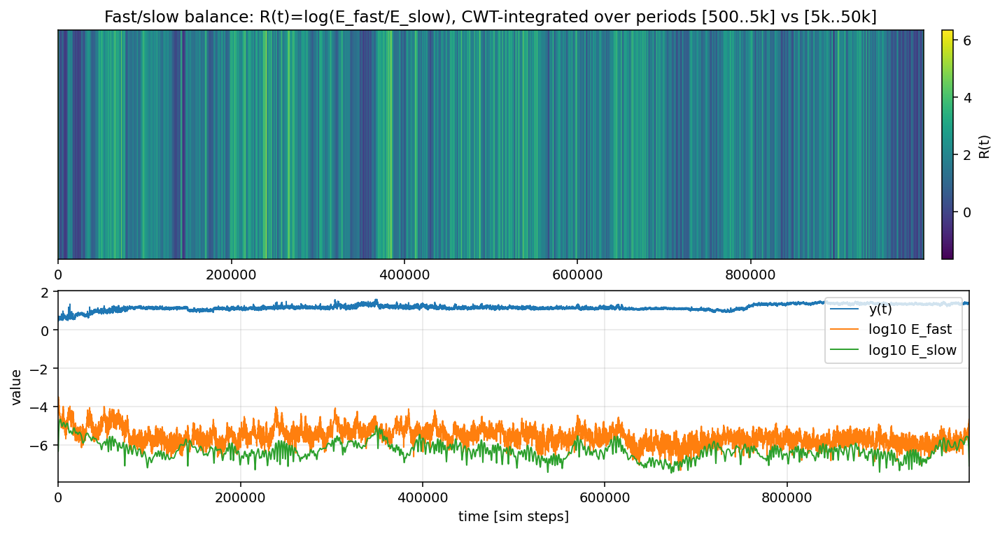

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# assumes in memory:
#   y: (T,) float
#   steps: (T,) int (sim steps)
#   dt_sim: float (sim steps per sample), ~50

# --------- CWT (complex Morlet, corrected) ----------
def morlet_cwt_complex(x, dt, periods, w0=6.0, zero_mean=True):
    x = np.asarray(x, np.float64)
    x = x - x.mean()
    T = x.shape[0]
    M = int(2 ** np.ceil(np.log2(T)))
    X = np.fft.rfft(x, n=M)
    omega = 2.0 * np.pi * np.fft.rfftfreq(M, d=dt)  # rad/sim-step

    fourier_factor = (4.0 * np.pi) / (w0 + np.sqrt(2.0 + w0*w0))
    scales = periods / fourier_factor               # sim-steps

    const = (np.pi ** -0.25)
    W = np.empty((len(scales), T), np.complex64)

    for i, s in enumerate(scales):
        base = np.exp(-0.5 * (s * omega - w0) ** 2)
        if zero_mean:
            corr = np.exp(-0.5 * (w0 ** 2)) * np.exp(-0.5 * (s * omega) ** 2)
            base = base - corr
        base = base.copy()
        base[omega <= 0] = 0.0  # analytic, drop DC
        psi_hat = const * np.sqrt(dt / (s + 1e-12)) * base
        w = np.fft.irfft(X * psi_hat, n=M)[:T]
        W[i] = w.astype(np.complex64)
    return W

# --------- periods grid ----------
period_min, period_max = 500.0, 50_000.0
n_periods = 96
periods = np.logspace(np.log10(period_min), np.log10(period_max), n_periods)

# --------- compute power ----------
W = morlet_cwt_complex(y, dt_sim, periods, w0=6.0, zero_mean=True)
P = (W.real * W.real + W.imag * W.imag).astype(np.float64)  # (S,T)

# --------- log-weighted band energies ----------
logT = np.log(periods)
dlogT = np.gradient(logT)

def band_energy(P, periods, T_lo, T_hi):
    m = (periods >= T_lo) & (periods <= T_hi)
    if not np.any(m):
        return np.zeros(P.shape[1], np.float64)
    # integrate over logT: sum P * dlogT
    return np.sum(P[m] * dlogT[m, None], axis=0)

E_fast = band_energy(P, periods, 500.0, 5_000.0)
E_slow = band_energy(P, periods, 5_000.0, 50_000.0)

eps = 1e-12
R = np.log((E_fast + eps) / (E_slow + eps))  # >0 fast-dominated, <0 slow-dominated

# --------- visualization: 1 figure (heatmap over time is R, plus diagnostics) ----------
t = steps.astype(np.float64)

fig = plt.figure(figsize=(12, 6), dpi=140)
gs = fig.add_gridspec(2, 1, height_ratios=[1.2, 1.0], hspace=0.15)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0], sharex=ax0)

# top: R(t) as a 1xT heatmap (single-row image) -> super readable
Z = R[None, :]
im = ax0.imshow(
    Z,
    aspect="auto",
    origin="lower",
    extent=[float(t[0]), float(t[-1]), 0.0, 1.0],
)
ax0.set_yticks([])
ax0.set_title("Fast/slow balance: R(t)=log(E_fast/E_slow), CWT-integrated over periods [500..5k] vs [5k..50k]")
cbar = plt.colorbar(im, ax=ax0, fraction=0.03, pad=0.02)
cbar.set_label("R(t)")

# bottom: y(t) and band energies (log for scale)
ax1.plot(t, y, linewidth=1.0, label="y(t)")
ax1.plot(t, np.log10(E_fast + 1e-30), linewidth=1.0, label="log10 E_fast")
ax1.plot(t, np.log10(E_slow + 1e-30), linewidth=1.0, label="log10 E_slow")
ax1.set_xlabel("time [sim steps]")
ax1.set_ylabel("value")
ax1.legend(loc="upper right")
ax1.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

mu/I: 20000it [05:19, 62.68it/s]


frames: 20000 dt_sim: 50.0
saved: precomputed/mu_I_heatmaps_apf_2602021501.npz


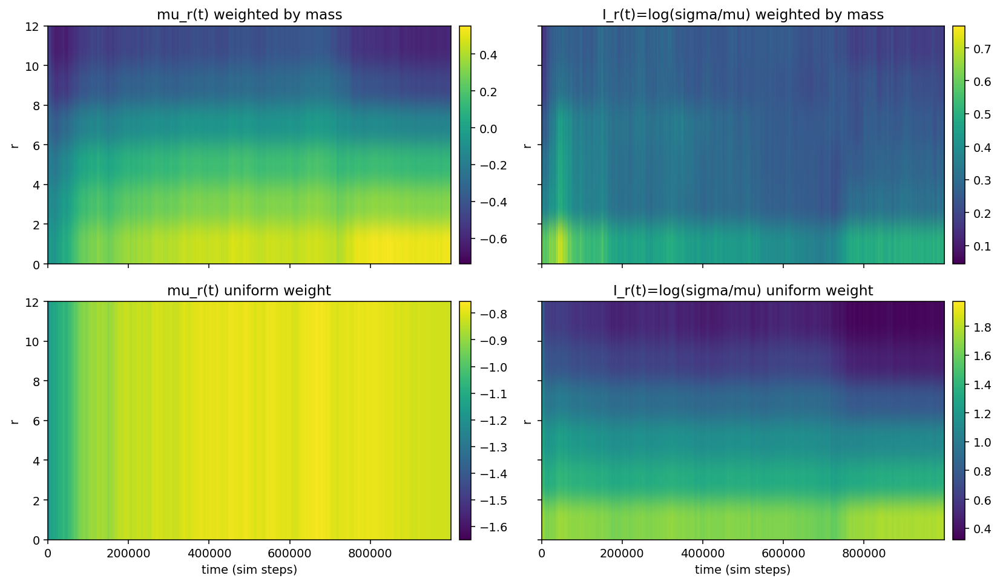

In [1]:
import numpy as np
import jax
import jax.numpy as jnp
import jax.lax as lax
from tqdm import tqdm
import matplotlib.pyplot as plt

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2 = 0, 1_000_000          # sim steps
frame_stride = 1               # IMPORTANT: keep 1 (logging already sparse)
max_frames = None              # None = all in [t1,t2]

r_list = [0, 1, 2, 4, 8, 12]
eps = 1e-12

# compute both weights:
do_weight_mass = True          # w = m(x)
do_weight_uniform = True       # w = 1

out_npz = "precomputed/mu_I_heatmaps_apf_2602021501.npz"

# ----------------------------
# DEVICE
# ----------------------------
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# PERIODIC BOX BLUR (2D scalar)
# ----------------------------
def box_blur_periodic_fast_2d(x, r):
    if r <= 0:
        return x
    win = 2 * r + 1

    def blur1d(x, axis):
        def body(i, acc):
            shift = i - r
            return acc + jnp.roll(x, shift, axis=axis)
        acc = lax.fori_loop(0, win, body, jnp.zeros_like(x))
        return acc / float(win)

    x = blur1d(x, axis=0)
    x = blur1d(x, axis=1)
    return x

# stats for fixed r (compiled per r)
def make_stats_fn(r):
    def stats(X, w):
        Xr = box_blur_periodic_fast_2d(X, r)
        sw = jnp.sum(w) + eps
        mu = jnp.sum(w * Xr) / sw
        ms2 = jnp.sum(w * (Xr * Xr)) / sw
        sig = jnp.sqrt(ms2 + eps)
        I = jnp.log((sig + eps) / (mu + eps))
        return mu.astype(jnp.float32), I.astype(jnp.float32)
    return jax.jit(stats)

stats_fns = {r: make_stats_fn(r) for r in r_list}

# ----------------------------
# MAIN LOOP
# ----------------------------
steps = []
mu_mass, I_mass = [], []
mu_uni,  I_uni  = [], []

i = 0
kept = 0

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "F")), desc="mu/I"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)

        m, J, Jp, q, n = jperp_fn(A, F)                 # m: (H,W), Jp: (H,W,2)
        X = jnp.sqrt(jnp.sum(Jp * Jp, axis=-1) + eps)    # X = ||J_perp||, (H,W)

        if do_weight_mass:
            w_m = jnp.maximum(m, 0.0)
        if do_weight_uniform:
            w_u = jnp.ones_like(X)

        mus_m, Is_m = [], []
        mus_u, Is_u = [], []

        for r in r_list:
            fn = stats_fns[r]
            if do_weight_mass:
                mu, I = fn(X, w_m)
                mus_m.append(mu); Is_m.append(I)
            if do_weight_uniform:
                mu, I = fn(X, w_u)
                mus_u.append(mu); Is_u.append(I)

        if do_weight_mass:
            mu_mass.append(np.asarray(jax.device_get(jnp.stack(mus_m)), dtype=np.float32))
            I_mass.append(np.asarray(jax.device_get(jnp.stack(Is_m)), dtype=np.float32))
        if do_weight_uniform:
            mu_uni.append(np.asarray(jax.device_get(jnp.stack(mus_u)), dtype=np.float32))
            I_uni.append(np.asarray(jax.device_get(jnp.stack(Is_u)), dtype=np.float32))

    steps.append(int(t))
    kept += 1
    if max_frames is not None and kept >= max_frames:
        break

steps = np.asarray(steps, dtype=np.int64)
dt_sim = float(np.median(np.diff(steps))) if len(steps) >= 2 else float("nan")
print("frames:", kept, "dt_sim:", dt_sim)

r_arr = np.asarray(r_list, dtype=np.int32)

if do_weight_mass:
    mu_mass = np.stack(mu_mass, axis=0)  # (T,R)
    I_mass  = np.stack(I_mass,  axis=0)  # (T,R)
if do_weight_uniform:
    mu_uni  = np.stack(mu_uni,  axis=0)  # (T,R)
    I_uni   = np.stack(I_uni,   axis=0)  # (T,R)

# ----------------------------
# SAVE
# ----------------------------
payload = {
    "steps": steps,
    "dt_sim": np.asarray(dt_sim, np.float64),
    "r_list": r_arr,
}
if do_weight_mass:
    payload["mu_mass"] = mu_mass
    payload["I_mass"]  = I_mass
if do_weight_uniform:
    payload["mu_uni"] = mu_uni
    payload["I_uni"]  = I_uni

import os
os.makedirs(os.path.dirname(out_npz) or ".", exist_ok=True)
np.savez_compressed(out_npz, **payload)
print("saved:", out_npz)

# ----------------------------
# PLOT (single figure; 2x2 if both weights)
# ----------------------------
t0, t1p = float(steps[0]), float(steps[-1])
extent = [t0, t1p, float(r_arr[0]), float(r_arr[-1])]

def show_heat(ax, Z, title, log=False):
    ZZ = Z.copy()
    if log:
        ZZ = np.log10(ZZ + 1e-30)
    im = ax.imshow(
        ZZ.T, aspect="auto", origin="lower", extent=extent
    )
    ax.set_ylabel("r")
    ax.set_title(title)
    return im

if do_weight_mass and do_weight_uniform:
    fig, ax = plt.subplots(2, 2, figsize=(12, 7), dpi=140, sharex=True, sharey=True)

    im00 = show_heat(ax[0,0], mu_mass, "mu_r(t) weighted by mass", log=True)
    plt.colorbar(im00, ax=ax[0,0], fraction=0.03, pad=0.02)

    im01 = show_heat(ax[0,1], I_mass, "I_r(t)=log(sigma/mu) weighted by mass", log=False)
    plt.colorbar(im01, ax=ax[0,1], fraction=0.03, pad=0.02)

    im10 = show_heat(ax[1,0], mu_uni, "mu_r(t) uniform weight", log=True)
    plt.colorbar(im10, ax=ax[1,0], fraction=0.03, pad=0.02)

    im11 = show_heat(ax[1,1], I_uni, "I_r(t)=log(sigma/mu) uniform weight", log=False)
    plt.colorbar(im11, ax=ax[1,1], fraction=0.03, pad=0.02)

    for a in ax[1,:]:
        a.set_xlabel("time (sim steps)")
    for a in ax[:,0]:
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

elif do_weight_mass:
    fig, ax = plt.subplots(1, 2, figsize=(12, 3.5), dpi=140, sharex=True, sharey=True)

    im0 = show_heat(ax[0], mu_mass, "mu_r(t) weighted by mass", log=True)
    plt.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.02)

    im1 = show_heat(ax[1], I_mass, "I_r(t)=log(sigma/mu) weighted by mass", log=False)
    plt.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.02)

    for a in ax:
        a.set_xlabel("time (sim steps)")
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

else:
    fig, ax = plt.subplots(1, 2, figsize=(12, 3.5), dpi=140, sharex=True, sharey=True)

    im0 = show_heat(ax[0], mu_uni, "mu_r(t) uniform weight", log=True)
    plt.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.02)

    im1 = show_heat(ax[1], I_uni, "I_r(t)=log(sigma/mu) uniform weight", log=False)
    plt.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.02)

    for a in ax:
        a.set_xlabel("time (sim steps)")
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

mu/I: 20000it [10:53, 30.61it/s]


frames: 20000 dt_sim: 50.0
saved: precomputed/mu_I_heatmaps_apf_2602021501.npz


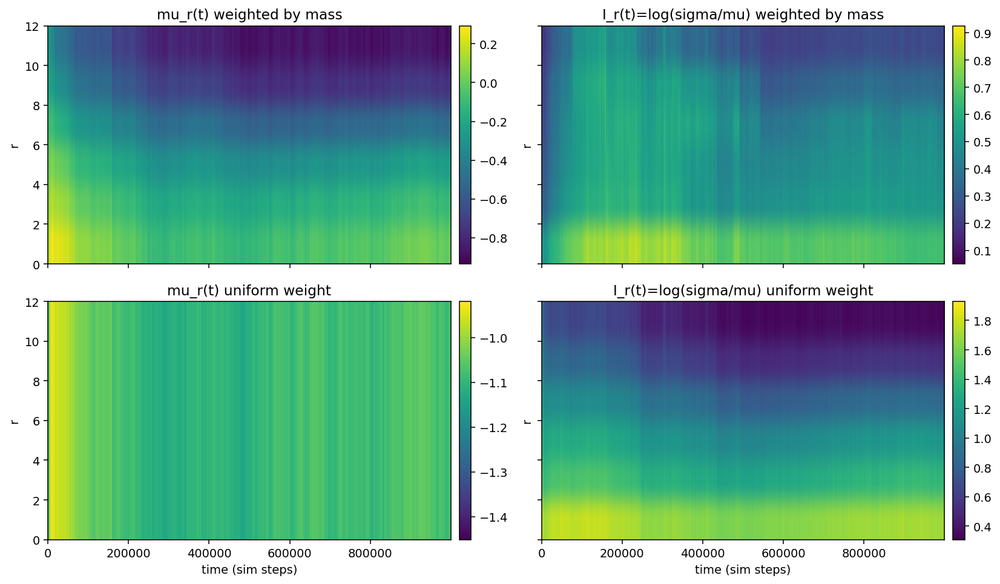

In [2]:
import numpy as np
import jax
import jax.numpy as jnp
import jax.lax as lax
from tqdm import tqdm
import matplotlib.pyplot as plt

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602072147/interp_1"
t1, t2 = 0, 1_000_000          # sim steps
frame_stride = 1               # IMPORTANT: keep 1 (logging already sparse)
max_frames = None              # None = all in [t1,t2]

r_list = [0, 1, 2, 4, 8, 12]
eps = 1e-12

# compute both weights:
do_weight_mass = True          # w = m(x)
do_weight_uniform = True       # w = 1

out_npz = "precomputed/mu_I_heatmaps_apf_2602021501.npz"

# ----------------------------
# DEVICE
# ----------------------------
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# PERIODIC BOX BLUR (2D scalar)
# ----------------------------
def box_blur_periodic_fast_2d(x, r):
    if r <= 0:
        return x
    win = 2 * r + 1

    def blur1d(x, axis):
        def body(i, acc):
            shift = i - r
            return acc + jnp.roll(x, shift, axis=axis)
        acc = lax.fori_loop(0, win, body, jnp.zeros_like(x))
        return acc / float(win)

    x = blur1d(x, axis=0)
    x = blur1d(x, axis=1)
    return x

# stats for fixed r (compiled per r)
def make_stats_fn(r):
    def stats(X, w):
        Xr = box_blur_periodic_fast_2d(X, r)
        sw = jnp.sum(w) + eps
        mu = jnp.sum(w * Xr) / sw
        ms2 = jnp.sum(w * (Xr * Xr)) / sw
        sig = jnp.sqrt(ms2 + eps)
        I = jnp.log((sig + eps) / (mu + eps))
        return mu.astype(jnp.float32), I.astype(jnp.float32)
    return jax.jit(stats)

stats_fns = {r: make_stats_fn(r) for r in r_list}

# ----------------------------
# MAIN LOOP
# ----------------------------
steps = []
mu_mass, I_mass = [], []
mu_uni,  I_uni  = [], []

i = 0
kept = 0

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "F")), desc="mu/I"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)

        m, J, Jp, q, n = jperp_fn(A, F)                 # m: (H,W), Jp: (H,W,2)
        X = jnp.sqrt(jnp.sum(Jp * Jp, axis=-1) + eps)    # X = ||J_perp||, (H,W)

        if do_weight_mass:
            w_m = jnp.maximum(m, 0.0)
        if do_weight_uniform:
            w_u = jnp.ones_like(X)

        mus_m, Is_m = [], []
        mus_u, Is_u = [], []

        for r in r_list:
            fn = stats_fns[r]
            if do_weight_mass:
                mu, I = fn(X, w_m)
                mus_m.append(mu); Is_m.append(I)
            if do_weight_uniform:
                mu, I = fn(X, w_u)
                mus_u.append(mu); Is_u.append(I)

        if do_weight_mass:
            mu_mass.append(np.asarray(jax.device_get(jnp.stack(mus_m)), dtype=np.float32))
            I_mass.append(np.asarray(jax.device_get(jnp.stack(Is_m)), dtype=np.float32))
        if do_weight_uniform:
            mu_uni.append(np.asarray(jax.device_get(jnp.stack(mus_u)), dtype=np.float32))
            I_uni.append(np.asarray(jax.device_get(jnp.stack(Is_u)), dtype=np.float32))

    steps.append(int(t))
    kept += 1
    if max_frames is not None and kept >= max_frames:
        break

steps = np.asarray(steps, dtype=np.int64)
dt_sim = float(np.median(np.diff(steps))) if len(steps) >= 2 else float("nan")
print("frames:", kept, "dt_sim:", dt_sim)

r_arr = np.asarray(r_list, dtype=np.int32)

if do_weight_mass:
    mu_mass = np.stack(mu_mass, axis=0)  # (T,R)
    I_mass  = np.stack(I_mass,  axis=0)  # (T,R)
if do_weight_uniform:
    mu_uni  = np.stack(mu_uni,  axis=0)  # (T,R)
    I_uni   = np.stack(I_uni,   axis=0)  # (T,R)

# ----------------------------
# SAVE
# ----------------------------
payload = {
    "steps": steps,
    "dt_sim": np.asarray(dt_sim, np.float64),
    "r_list": r_arr,
}
if do_weight_mass:
    payload["mu_mass"] = mu_mass
    payload["I_mass"]  = I_mass
if do_weight_uniform:
    payload["mu_uni"] = mu_uni
    payload["I_uni"]  = I_uni

import os
os.makedirs(os.path.dirname(out_npz) or ".", exist_ok=True)
np.savez_compressed(out_npz, **payload)
print("saved:", out_npz)

# ----------------------------
# PLOT (single figure; 2x2 if both weights)
# ----------------------------
t0, t1p = float(steps[0]), float(steps[-1])
extent = [t0, t1p, float(r_arr[0]), float(r_arr[-1])]

def show_heat(ax, Z, title, log=False):
    ZZ = Z.copy()
    if log:
        ZZ = np.log10(ZZ + 1e-30)
    im = ax.imshow(
        ZZ.T, aspect="auto", origin="lower", extent=extent
    )
    ax.set_ylabel("r")
    ax.set_title(title)
    return im

if do_weight_mass and do_weight_uniform:
    fig, ax = plt.subplots(2, 2, figsize=(12, 7), dpi=140, sharex=True, sharey=True)

    im00 = show_heat(ax[0,0], mu_mass, "mu_r(t) weighted by mass", log=True)
    plt.colorbar(im00, ax=ax[0,0], fraction=0.03, pad=0.02)

    im01 = show_heat(ax[0,1], I_mass, "I_r(t)=log(sigma/mu) weighted by mass", log=False)
    plt.colorbar(im01, ax=ax[0,1], fraction=0.03, pad=0.02)

    im10 = show_heat(ax[1,0], mu_uni, "mu_r(t) uniform weight", log=True)
    plt.colorbar(im10, ax=ax[1,0], fraction=0.03, pad=0.02)

    im11 = show_heat(ax[1,1], I_uni, "I_r(t)=log(sigma/mu) uniform weight", log=False)
    plt.colorbar(im11, ax=ax[1,1], fraction=0.03, pad=0.02)

    for a in ax[1,:]:
        a.set_xlabel("time (sim steps)")
    for a in ax[:,0]:
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

elif do_weight_mass:
    fig, ax = plt.subplots(1, 2, figsize=(12, 3.5), dpi=140, sharex=True, sharey=True)

    im0 = show_heat(ax[0], mu_mass, "mu_r(t) weighted by mass", log=True)
    plt.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.02)

    im1 = show_heat(ax[1], I_mass, "I_r(t)=log(sigma/mu) weighted by mass", log=False)
    plt.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.02)

    for a in ax:
        a.set_xlabel("time (sim steps)")
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

else:
    fig, ax = plt.subplots(1, 2, figsize=(12, 3.5), dpi=140, sharex=True, sharey=True)

    im0 = show_heat(ax[0], mu_uni, "mu_r(t) uniform weight", log=True)
    plt.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.02)

    im1 = show_heat(ax[1], I_uni, "I_r(t)=log(sigma/mu) uniform weight", log=False)
    plt.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.02)

    for a in ax:
        a.set_xlabel("time (sim steps)")
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

/home/coder/tmp/ipykernel_499108/1966825992.py:62: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(freqs > 0, 1.0 / freqs, np.inf)   # sim-steps


selected freqs: 101 period range: 501.96078431372547 25600.0


stream: 20000it [05:15, 63.32it/s]


blocks: 38 D: 18432


spod: 100%|██████████| 101/101 [00:00<00:00, 231.44it/s]


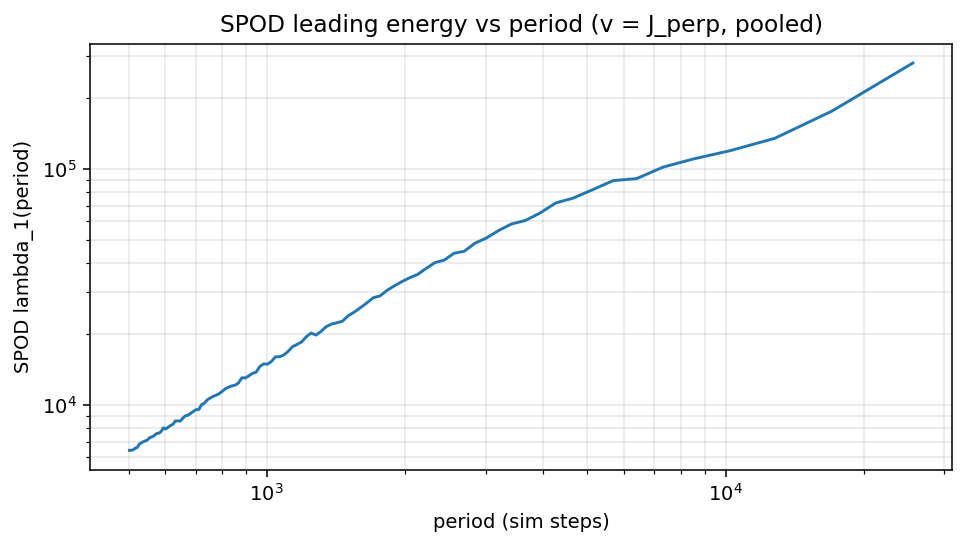

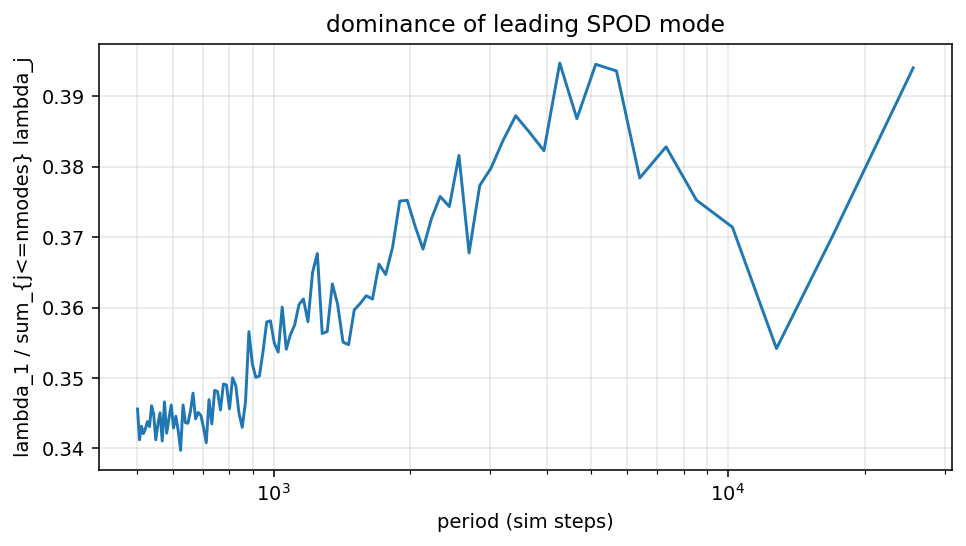

In [3]:
import numpy as np
import jax
import jax.numpy as jnp
from tqdm import tqdm
from collections import deque
import matplotlib.pyplot as plt

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2 = 0, 1_000_000          # sim steps
frame_stride = 1               # logging already every 50 sim-steps

dt_sim = 50.0                  # you said fixed; if not, compute from steps
period_min = 500.0
period_max = 50_000.0

ds = 4                         # spatial pooling factor (deterministic)
nfft = 1024                    # max period ~ nfft*dt_sim = 51200
overlap = 0.5
hop = int(nfft * (1.0 - overlap))
nmodes = 3                     # leading SPOD eigenvalues per freq

max_blocks = None              # optionally cap blocks (e.g. 64)

eps = 1e-12
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# helpers
# ----------------------------
def avg_pool_vecfield(v, ds):
    # v: (H,W,2) numpy float32
    H, W, C = v.shape
    H2, W2 = H // ds, W // ds
    v = v[:H2*ds, :W2*ds, :]
    v = v.reshape(H2, ds, W2, ds, C).mean(axis=(1,3))
    return v

# SPOD: method of snapshots at one frequency
def spod_eigs_from_Qf(Qf_BD, nmodes=3):
    # Qf_BD: (B,D) complex64, columns are realizations (blocks) at fixed freq
    B, D = Qf_BD.shape
    Q = Qf_BD.T  # (D,B)
    G = (Q.conj().T @ Q) / float(B)  # (B,B) Hermitian
    w, V = np.linalg.eigh(G)         # ascending
    idx = np.argsort(w)[::-1]
    w = w[idx]
    V = V[:, idx]
    w = np.maximum(w, 0.0)
    return w[:nmodes], V[:, :nmodes]

# ----------------------------
# choose frequencies (period band)
# ----------------------------
freqs = np.fft.rfftfreq(nfft, d=dt_sim)              # cycles per sim-step
periods = np.where(freqs > 0, 1.0 / freqs, np.inf)   # sim-steps
fi_sel = np.where((periods >= period_min) & (periods <= period_max))[0]
fi_sel = fi_sel[fi_sel != 0]                         # drop DC
periods_sel = periods[fi_sel]
nfi = len(fi_sel)
print("selected freqs:", nfi, "period range:", periods_sel.min(), periods_sel.max())

# ----------------------------
# streaming blocks -> store Fourier coeffs for selected freqs
# blocks_F: list of (nfi, D) complex64, length B
# ----------------------------
wtime = np.hanning(nfft).astype(np.float32)
buf = deque(maxlen=nfft)

blocks_F = []
n_seen = 0
i = 0

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A","F")), desc="stream"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        m, J, Jp, q, n = jperp_fn(A, F)  # Jp: (H,W,2)

    Jp_np = np.asarray(jax.device_get(Jp), dtype=np.float32)
    v = avg_pool_vecfield(Jp_np, ds)              # (H',W',2)
    qv = v.reshape(-1)                            # D = 2*H'*W'
    buf.append(qv)
    n_seen += 1

    if n_seen >= nfft and ((n_seen - nfft) % hop == 0):
        block = np.stack(buf, axis=0).astype(np.float32)            # (nfft, D)
        block = block - block.mean(axis=0, keepdims=True)           # remove block-mean
        block = block * wtime[:, None]
        Fblk = np.fft.rfft(block, axis=0).astype(np.complex64)      # (nfreq, D)
        blocks_F.append(Fblk[fi_sel, :])                            # (nfi, D)

        if max_blocks is not None and len(blocks_F) >= max_blocks:
            break

B = len(blocks_F)
print("blocks:", B, "D:", blocks_F[0].shape[1])

Q = np.stack(blocks_F, axis=0)   # (B, nfi, D) complex64

# ----------------------------
# SPOD eigenvalues spectrum
# ----------------------------
lam = np.zeros((nfi, nmodes), dtype=np.float32)

for j in tqdm(range(nfi), desc="spod"):
    Qf = Q[:, j, :]  # (B, D)
    w, _ = spod_eigs_from_Qf(Qf, nmodes=nmodes)
    lam[j, :len(w)] = w.real.astype(np.float32)

# ----------------------------
# plot: leading eigenvalue vs period
# ----------------------------
plt.figure(figsize=(7,4), dpi=140)
plt.plot(periods_sel, lam[:,0] + 1e-30)
plt.xscale("log")
plt.yscale("log")
plt.xlabel("period (sim steps)")
plt.ylabel("SPOD lambda_1(period)")
plt.title("SPOD leading energy vs period (v = J_perp, pooled)")
plt.grid(True, which="both", alpha=0.3)
plt.tight_layout()
plt.show()

# optional: show how many modes are important at each period
plt.figure(figsize=(7,4), dpi=140)
ratio = (lam[:,0] + 1e-30) / (lam.sum(axis=1) + 1e-30)
plt.plot(periods_sel, ratio)
plt.xscale("log")
plt.xlabel("period (sim steps)")
plt.ylabel("lambda_1 / sum_{j<=nmodes} lambda_j")
plt.title("dominance of leading SPOD mode")
plt.grid(True, which="both", alpha=0.3)
plt.tight_layout()
plt.show()

/home/coder/tmp/ipykernel_656664/115266934.py:50: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(freqs > 0, 1.0 / freqs, np.inf)              # sim-steps


freq bins: 101 period range: 501.96078431372547 25600.0 Lwin: 51200.0


mt-trace: 440it [00:06, 132.93it/s]

mt-trace: 20000it [10:53, 30.58it/s]


windows: 149 heatmap: (149, 101) ds: 4 N: 1024 hop: 128


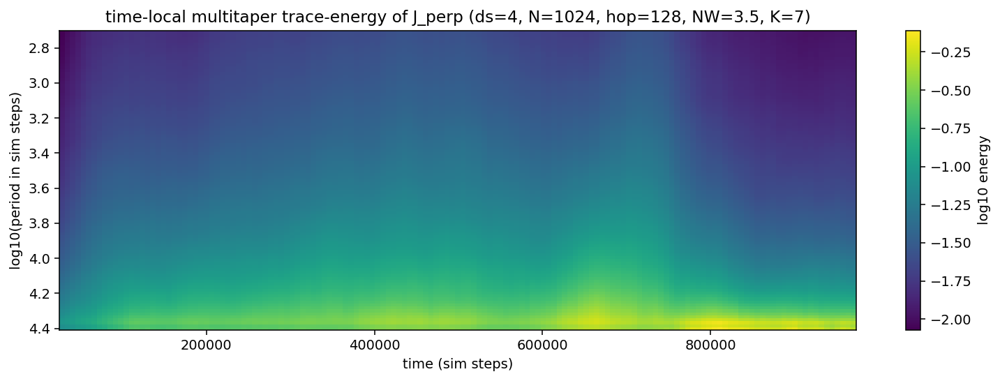

In [1]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm
from collections import deque
from scipy.signal.windows import dpss

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2   = 0, 1_000_000
frame_stride = 1

dt_sim = 50.0
period_min, period_max = 500.0, 50_000.0

N = 1024
hop = 128
NW = 3.5
K  = 7

ds = 4
max_windows = None

eps = 1e-30

device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)


dt_eff = dt_sim * frame_stride   # ВАЖНО: если берёте каждый frame_stride-ый кадр

n0 = (np.arange(N, dtype=np.float32) - (N - 1) / 2.0)          # mean=0
den = float((n0 * n0).sum()) + 1e-12                           # для наклона
Lwin = N * dt_eff                                               # длина окна в sim steps
fmin = 1.0 / Lwin                                               # lowest resolvable freq

# ----------------------------
# DPSS + freq bins
# ----------------------------
tapers = dpss(N, NW, Kmax=K, sym=False).astype(np.float32)      # (K,N)
taper_norm2 = (tapers * tapers).sum(axis=1).astype(np.float32) + 1e-12

freqs = np.fft.rfftfreq(N, d=dt_eff)                            # cycles / sim-step
periods = np.where(freqs > 0, 1.0 / freqs, np.inf)              # sim-steps

# drop DC + drop frequencies below 1/Lwin (иначе это дрейф/утечки)
fi_sel = np.where(
    (freqs >= fmin) &
    (periods >= period_min) &
    (periods <= min(period_max, Lwin))                          # не рисуем периоды > длины окна
)[0]

periods_sel = periods[fi_sel]
xlog = np.log10(periods_sel)

print("freq bins:", len(fi_sel),
      "period range:", float(periods_sel.min()), float(periods_sel.max()),
      "Lwin:", float(Lwin))
# ----------------------------
# helpers
# ----------------------------
def pool_flatten_jax(Jp, ds):
    if ds <= 1:
        v = Jp
    else:
        H, W, C = Jp.shape
        H2, W2 = H // ds, W // ds
        v = Jp[:H2*ds, :W2*ds, :].reshape(H2, ds, W2, ds, C).mean(axis=(1,3))
    return v.reshape(-1)

def get_block(buf, ptr):
    # ring buffer -> contiguous block of length N starting at ptr
    if ptr == 0:
        return buf.copy()
    return np.concatenate([buf[ptr:], buf[:ptr]], axis=0)

# ----------------------------
# STREAM windows -> compute E(t0, period) heatmap
# ----------------------------
buf_v = None          # (N,D) float32
buf_step = None       # (N,) int64
ptr = 0
kept = 0              # number of appended frames (after frame_stride)

times = []
logE = []

seen = 0
win_count = 0

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A","F")), desc="mt-trace"):
    if (seen % frame_stride) != 0:
        seen += 1
        continue
    seen += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        _, _, Jp, _, _ = jperp_fn(A, F)                        # (H,W,2)
        vflat = pool_flatten_jax(Jp, ds)                       # (D,)

    vflat = np.asarray(jax.device_get(vflat), dtype=np.float32)

    if buf_v is None:
        D = vflat.shape[0]
        buf_v = np.zeros((N, D), dtype=np.float32)
        buf_step = np.zeros((N,), dtype=np.int64)

    buf_v[ptr] = vflat
    buf_step[ptr] = int(t)
    ptr = (ptr + 1) % N
    kept += 1

    if kept < N:
        continue

    # emit every hop frames (in the *kept* stream)
    if ((kept - N) % hop) != 0:
        continue

    block = get_block(buf_v, ptr)                               # (N,D)
    steps_blk = get_block(buf_step, ptr)                        # (N,)
    t_center = int(steps_blk[N // 2])

    block = block - block.mean(axis=0, keepdims=True)               # remove DC per-dim
    slope = (n0[:, None] * block).sum(axis=0) / den                 # best-fit slope per-dim
    block = block - n0[:, None] * slope                             # remove linear trend

    acc = np.zeros((len(fi_sel),), dtype=np.float64)
    for k in range(K):
        Xt = block * tapers[k][:, None]                         # (N,D)
        Fk = np.fft.rfft(Xt, axis=0).astype(np.complex64)       # (Nf,D)
        Pk = (np.abs(Fk[fi_sel])**2).sum(axis=1)                # sum over D -> (F,)
        acc += (Pk / taper_norm2[k]).astype(np.float64)

    E = (acc / K) / float(block.shape[1])                       # per-dim trace-energy
    times.append(t_center)
    logE.append(np.log10(E + eps))

    win_count += 1
    if max_windows is not None and win_count >= max_windows:
        break

times = np.asarray(times, dtype=np.int64)
logE = np.asarray(logE, dtype=np.float32)                       # (Tw, F)

print("windows:", len(times), "heatmap:", logE.shape, "ds:", ds, "N:", N, "hop:", hop)

# ----------------------------
# PLOT heatmap
# ----------------------------
plt.figure(figsize=(11, 4), dpi=140)
plt.imshow(
    logE.T,
    aspect="auto",
    origin="lower",
    extent=[float(times[0]), float(times[-1]), float(xlog[0]), float(xlog[-1])],
)
plt.xlabel("time (sim steps)")
plt.ylabel("log10(period in sim steps)")
plt.title(f"time-local multitaper trace-energy of J_perp (ds={ds}, N={N}, hop={hop}, NW={NW}, K={K})")
plt.colorbar(label="log10 energy")
plt.tight_layout()
plt.show()

def inspect_window(w):
    plt.figure(figsize=(6,3), dpi=140)
    plt.plot(periods_sel, 10**logE[w])
    plt.xscale("log"); plt.yscale("log")
    plt.xlabel("period (sim steps)")
    plt.ylabel("energy")
    plt.title(f"window {w}, t≈{times[w]}")
    plt.grid(True, which="both", alpha=0.3)
    plt.tight_layout()
    plt.show()

# inspect_window(0)

scan: 16000it [00:46, 346.77it/s]


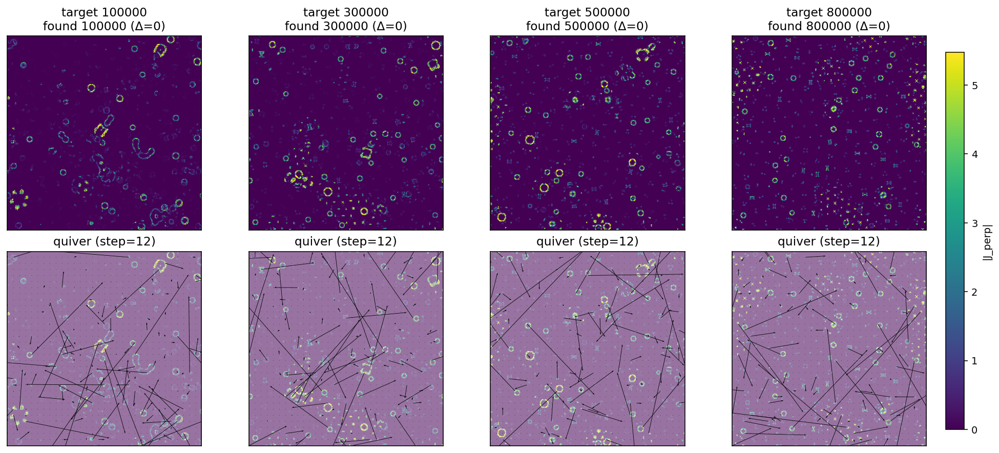

In [2]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG (подставь свои)
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2   = 0, 1_000_000
frame_stride = 1

dt_sim = 50.0                         # шаг между снапшотами в sim steps (у тебя так)
targets = [100_000, 300_000, 500_000, 800_000]

# quiver downsample (для стрелочек)
q = 12

device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)


def pick_nearest_snapshots(save_pth, targets, t1, t2, frame_stride, dt_sim, fields=("A", "F")):
    targets = list(map(int, targets))
    best = {tt: (10**18, None, None) for tt in targets}  # tt -> (abs_delta, found_t, snapshot)
    seen = 0

    # типичный шаг по t у снапшотов (для ранней остановки)
    dt_snap = int(dt_sim * frame_stride)

    for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=fields), desc="scan"):
        if (seen % frame_stride) != 0:
            seen += 1
            continue
        seen += 1

        ti = int(t)
        for tt in targets:
            d = abs(ti - tt)
            if d < best[tt][0]:
                best[tt] = (d, ti, s)

        # ранняя остановка: когда мы уже прошли максимум и у всех точность <= dt_snap/2
        if ti >= max(targets):
            ok = True
            for tt in targets:
                if best[tt][1] is None or best[tt][0] > dt_snap // 2:
                    ok = False
                    break
            if ok:
                break

    out = {}
    for tt in targets:
        d, ti, s = best[tt]
        if s is None:
            raise RuntimeError(f"Не нашёл снапшот для target={tt} в диапазоне [{t1},{t2}]")
        out[tt] = (ti, s, d)
    return out


# 1) найдём ближайшие снапшоты к нужным временам
picked = pick_nearest_snapshots(save_pth, targets, t1, t2, frame_stride, dt_sim)

# 2) посчитаем J_perp для каждого
Jps = {}
for tt in targets:
    ti, s, d = picked[tt]
    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        _, _, Jp, _, _ = jperp_fn(A, F)         # (H, W, 2)
    Jp = np.asarray(jax.device_get(Jp), dtype=np.float32)
    Jps[tt] = (ti, d, Jp)

# 3) подготовим масштабы для сравнимого imshow (один vmax на все кадры)
mags = []
for tt in targets:
    _, _, Jp = Jps[tt]
    mags.append(np.linalg.norm(Jp, axis=-1))
all_mag = np.concatenate([m.ravel() for m in mags], axis=0)
vmax = float(np.quantile(all_mag, 0.995))
vmin = 0.0

# 4) визуализация: верхний ряд magnitude, нижний ряд quiver
fig, axes = plt.subplots(
    2, len(targets),
    figsize=(3.6 * len(targets), 6.2),
    dpi=140,
    constrained_layout=True,
)

for i, tt in enumerate(targets):
    ti, d, Jp = Jps[tt]
    mag = np.linalg.norm(Jp, axis=-1)          # (H,W)
    U = Jp[..., 0]
    V = Jp[..., 1]

    ax0 = axes[0, i]
    im = ax0.imshow(mag, vmin=vmin, vmax=vmax, origin="lower")
    ax0.set_title(f"target {tt}\nfound {ti} (Δ={d})")
    ax0.set_xticks([]); ax0.set_yticks([])

    ax1 = axes[1, i]
    # subsample for arrows
    UU = U[::q, ::q]
    VV = V[::q, ::q]
    H, W = U.shape
    xs = np.arange(0, W, q)
    ys = np.arange(0, H, q)
    X, Y = np.meshgrid(xs, ys)
    ax1.imshow(mag, vmin=vmin, vmax=vmax, origin="lower", alpha=0.55)
    ax1.quiver(X, Y, UU, VV, angles="xy", scale_units="xy", scale=None, width=0.0022)
    ax1.set_title(f"quiver (step={q})")
    ax1.set_xticks([]); ax1.set_yticks([])

cbar = fig.colorbar(im, ax=axes, shrink=0.92, pad=0.02)
cbar.set_label("|J_perp|")
plt.show()

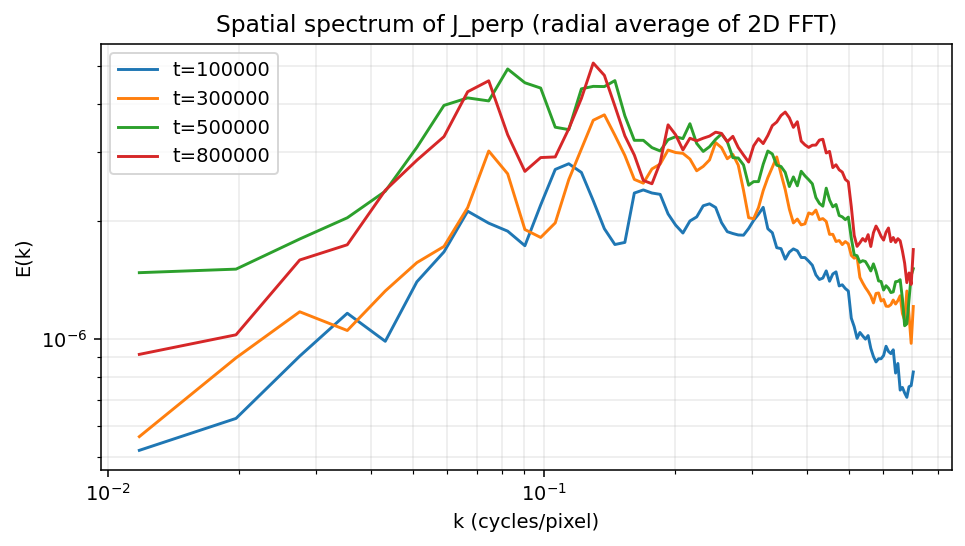

In [3]:
import numpy as np
import matplotlib.pyplot as plt

def radial_spectrum_2d(Jp, nbins=80):
    """
    Jp: (H, W, 2) float
    Возвращает (k_centers, Ek) для Ek = 0.5*(|Fx|^2+|Fy|^2) с радиальным биннингом по |k|.
    Единицы k — "на пиксель" (dx=dy=1), вам тут важна форма на log-log.
    """
    H, W, _ = Jp.shape
    Ux = Jp[..., 0]
    Uy = Jp[..., 1]

    Fx = np.fft.fft2(Ux)
    Fy = np.fft.fft2(Uy)
    P = 0.5 * (np.abs(Fx)**2 + np.abs(Fy)**2) / (H * W)**2  # per-mode energy

    kx = np.fft.fftfreq(W, d=1.0)  # cycles/pixel
    ky = np.fft.fftfreq(H, d=1.0)
    KX, KY = np.meshgrid(kx, ky, indexing="xy")
    K = np.sqrt(KX**2 + KY**2)

    kmax = float(K.max())
    edges = np.linspace(0.0, kmax, nbins + 1)
    k_centers = 0.5 * (edges[:-1] + edges[1:])

    idx = np.digitize(K.ravel(), edges) - 1
    valid = (idx >= 0) & (idx < nbins)

    Ek = np.zeros(nbins, dtype=np.float64)
    Nk = np.zeros(nbins, dtype=np.int64)
    np.add.at(Ek, idx[valid], P.ravel()[valid])
    np.add.at(Nk, idx[valid], 1)
    Ek = Ek / np.maximum(Nk, 1)  # mean over ring

    # выбросить k=0 (DC)
    return k_centers[1:], Ek[1:]


# предполагается, что у вас уже есть:
# Jps[tt] = (found_t, delta, Jp)
targets = [100_000, 300_000, 500_000, 800_000]

plt.figure(figsize=(7,4), dpi=140)
for tt in targets:
    ti, d, Jp = Jps[tt]
    k, Ek = radial_spectrum_2d(Jp, nbins=90)
    plt.plot(k, Ek, label=f"t={ti}")

plt.xscale("log")
plt.yscale("log")
plt.xlabel("k (cycles/pixel)")
plt.ylabel("E(k)")
plt.title("Spatial spectrum of J_perp (radial average of 2D FFT)")
plt.grid(True, which="both", alpha=0.25)
plt.legend()
plt.tight_layout()
plt.show()

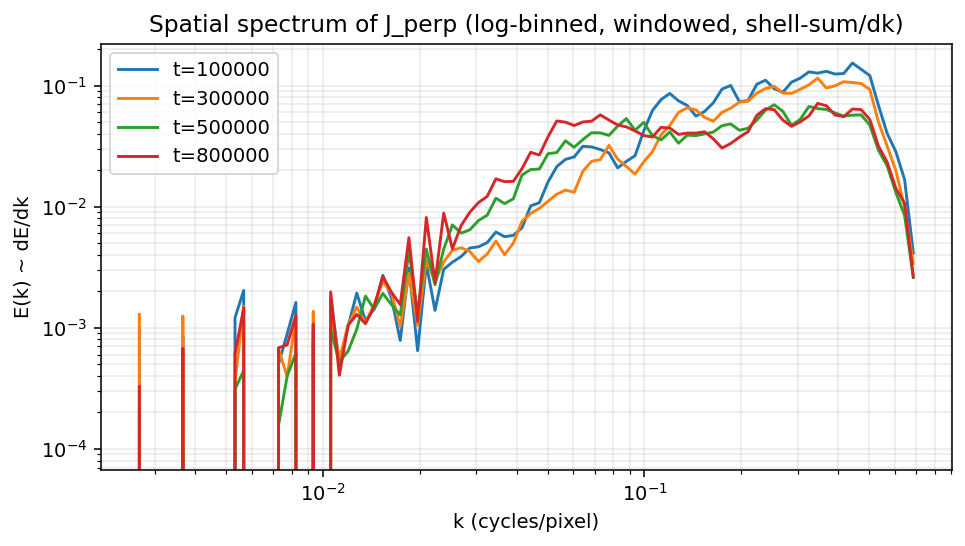

t=100000: band fractions [0.00088297 0.03072281 0.3144936  0.47575545]  (sum=0.822)
t=300000: band fractions [0.00121608 0.02958436 0.33189006 0.47083584]  (sum=0.834)
t=500000: band fractions [0.00236491 0.09006949 0.34102991 0.41482532]  (sum=0.848)
t=800000: band fractions [0.00290035 0.10378279 0.31500042 0.41484761]  (sum=0.837)


In [7]:
import matplotlib.pyplot as plt


import numpy as np

def isotropic_Ek(Jp, nbins=80, logbins=True, window=True, eps=1e-30):
    """
    Jp: (H, W, 2)
    returns:
      k_center: (nbins,)
      Ek:       (nbins,)  ~ dE/dk (shell-sum divided by bin width)
    """
    H, W, _ = Jp.shape
    Ux = Jp[..., 0].astype(np.float64)
    Uy = Jp[..., 1].astype(np.float64)

    if window:
        wx = np.hanning(W)
        wy = np.hanning(H)
        W2 = wy[:, None] * wx[None, :]
        Ux = Ux * W2
        Uy = Uy * W2

    Fx = np.fft.fft2(Ux)
    Fy = np.fft.fft2(Uy)
    P  = 0.5 * (np.abs(Fx)**2 + np.abs(Fy)**2) / (H * W)**2   # per-mode energy

    kx = np.fft.fftfreq(W, d=1.0)   # cycles/pixel
    ky = np.fft.fftfreq(H, d=1.0)
    KX, KY = np.meshgrid(kx, ky, indexing="xy")
    K = np.sqrt(KX**2 + KY**2)

    Kf = K.ravel()
    Pf = P.ravel()

    # drop DC
    m = Kf > 0
    Kf = Kf[m]
    Pf = Pf[m]

    kmin = Kf.min()
    kmax = Kf.max()

    if logbins:
        edges = np.logspace(np.log10(kmin + eps), np.log10(kmax), nbins + 1)
    else:
        edges = np.linspace(kmin, kmax, nbins + 1)

    idx = np.digitize(Kf, edges) - 1
    valid = (idx >= 0) & (idx < nbins)

    Ebin = np.zeros(nbins, dtype=np.float64)
    np.add.at(Ebin, idx[valid], Pf[valid])

    dk = edges[1:] - edges[:-1]
    k_center = np.sqrt(edges[1:] * edges[:-1]) if logbins else 0.5 * (edges[1:] + edges[:-1])

    Ek = Ebin / (dk + eps)   # density per unit k
    return k_center, Ek


def band_fractions(k, Ek, bands):
    """
    bands: list of (k_lo, k_hi)
    returns fractions of total energy in each band (sum Ek*dk over band / total)
    """
    # approximate integral with trapezoid in k
    # (k is bin centers, but Ek is dE/dk; integrate as sum Ek*dk using neighbor spacing)
    dk = np.empty_like(k)
    dk[1:-1] = 0.5 * (k[2:] - k[:-2])
    dk[0] = k[1] - k[0]
    dk[-1] = k[-1] - k[-2]
    w = Ek * dk
    total = w.sum() + 1e-30
    out = []
    for klo, khi in bands:
        m = (k >= klo) & (k < khi)
        out.append(w[m].sum() / total)
    return np.array(out)
    
targets = [100_000, 300_000, 500_000, 800_000]

plt.figure(figsize=(7,4), dpi=140)
spectra = {}
for tt in targets:
    ti, d, Jp = Jps[tt]
    k, Ek = isotropic_Ek(Jp, nbins=90, logbins=True, window=True)
    spectra[tt] = (k, Ek)
    plt.plot(k, Ek, label=f"t={ti}")
plt.xscale("log"); plt.yscale("log")
plt.xlabel("k (cycles/pixel)")
plt.ylabel("E(k) ~ dE/dk")
plt.title("Spatial spectrum of J_perp (log-binned, windowed, shell-sum/dk)")
plt.grid(True, which="both", alpha=0.25)
plt.legend()
plt.tight_layout()
plt.show()

# “доказательство” в виде долей энергии в нескольких декадах
bands = [(0.01, 0.03), (0.03, 0.1), (0.1, 0.3), (0.3, 0.5)]
for tt in targets:
    k, Ek = spectra[tt]
    frac = band_fractions(k, Ek, bands)
    print(f"t={tt}: band fractions {frac}  (sum={frac.sum():.3f})")

t=100000: total_E=5.270e-02, effective_scales(exp(H))=27.82, bins_used=57
t=300000: total_E=4.179e-02, effective_scales(exp(H))=27.67, bins_used=57
t=500000: total_E=2.736e-02, effective_scales(exp(H))=33.76, bins_used=57
t=800000: total_E=2.803e-02, effective_scales(exp(H))=34.45, bins_used=57


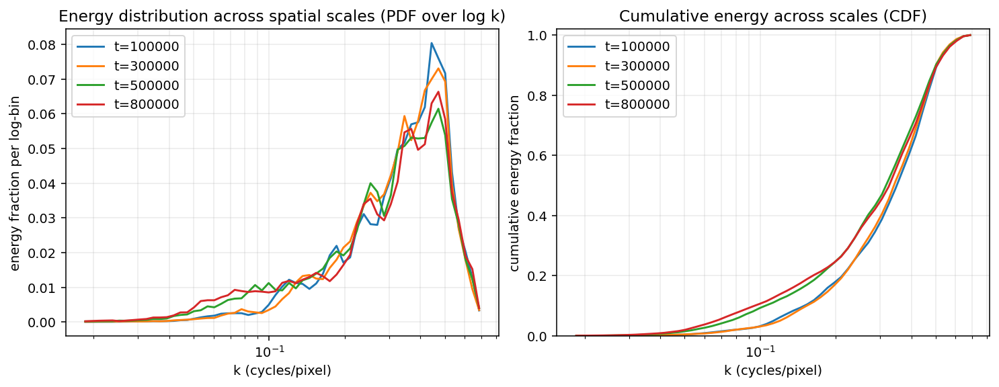

In [8]:
import numpy as np
import matplotlib.pyplot as plt

def isotropic_logbin_energy(Jp, nbins=80, window=True, eps=1e-30):
    """
    Jp: (H, W, 2)
    Returns:
      k_center: centers of log-bins
      Ebin:     energy in each log-bin (shell-sum, not divided by dk)
      Nk:       number of Fourier modes in each bin
      edges:    bin edges
    """
    H, W, _ = Jp.shape
    Ux = Jp[..., 0].astype(np.float64)
    Uy = Jp[..., 1].astype(np.float64)

    if window:
        wx = np.hanning(W)
        wy = np.hanning(H)
        W2 = wy[:, None] * wx[None, :]
        Ux = Ux * W2
        Uy = Uy * W2

    Fx = np.fft.fft2(Ux)
    Fy = np.fft.fft2(Uy)
    P  = 0.5 * (np.abs(Fx)**2 + np.abs(Fy)**2) / (H * W)**2  # per-mode energy

    kx = np.fft.fftfreq(W, d=1.0)
    ky = np.fft.fftfreq(H, d=1.0)
    KX, KY = np.meshgrid(kx, ky, indexing="xy")
    K = np.sqrt(KX**2 + KY**2)

    Kf = K.ravel()
    Pf = P.ravel()

    m = Kf > 0
    Kf = Kf[m]
    Pf = Pf[m]

    kmin = float(Kf.min())
    kmax = float(Kf.max())

    edges = np.logspace(np.log10(kmin + eps), np.log10(kmax), nbins + 1)
    k_center = np.sqrt(edges[1:] * edges[:-1])

    idx = np.digitize(Kf, edges) - 1
    valid = (idx >= 0) & (idx < nbins)

    Ebin = np.zeros(nbins, dtype=np.float64)
    Nk   = np.zeros(nbins, dtype=np.int64)
    np.add.at(Ebin, idx[valid], Pf[valid])
    np.add.at(Nk,   idx[valid], 1)

    return k_center, Ebin, Nk, edges


def effective_scales_from_p(p, eps=1e-30):
    """
    p: probability mass over log-bins, sum=1
    returns exp(entropy) = effective number of occupied bins
    """
    p = np.asarray(p, dtype=np.float64)
    p = p / (p.sum() + eps)
    H = -np.sum(p * np.log(p + eps))
    return float(np.exp(H))


# --- usage on your Jps dict ---
targets = [100_000, 300_000, 500_000, 800_000]
nbins = 90
min_modes_per_bin = 25  # маска от "игл" на малых k

fig, axes = plt.subplots(1, 2, figsize=(10.5, 4), dpi=140, constrained_layout=True)

for tt in targets:
    ti, d, Jp = Jps[tt]
    k, Ebin, Nk, edges = isotropic_logbin_energy(Jp, nbins=nbins, window=True)

    # маска бинов с достаточным числом мод
    m = Nk >= min_modes_per_bin
    k2 = k[m]
    E2 = Ebin[m]

    # PDF по log k: энергия в бине / суммарная энергия (это уже "per decade", т.к. бины логарифмические)
    p = E2 / (E2.sum() + 1e-30)

    # CDF
    cdf = np.cumsum(p)

    axes[0].plot(k2, p, label=f"t={ti}")
    axes[1].plot(k2, cdf, label=f"t={ti}")

    neff = effective_scales_from_p(p)
    print(f"t={ti}: total_E={E2.sum():.3e}, effective_scales(exp(H))={neff:.2f}, bins_used={p.size}")

axes[0].set_xscale("log")
axes[0].set_xlabel("k (cycles/pixel)")
axes[0].set_ylabel("energy fraction per log-bin")
axes[0].set_title("Energy distribution across spatial scales (PDF over log k)")
axes[0].grid(True, which="both", alpha=0.25)
axes[0].legend()

axes[1].set_xscale("log")
axes[1].set_ylim(0, 1.02)
axes[1].set_xlabel("k (cycles/pixel)")
axes[1].set_ylabel("cumulative energy fraction")
axes[1].set_title("Cumulative energy across scales (CDF)")
axes[1].grid(True, which="both", alpha=0.25)
axes[1].legend()

plt.show()

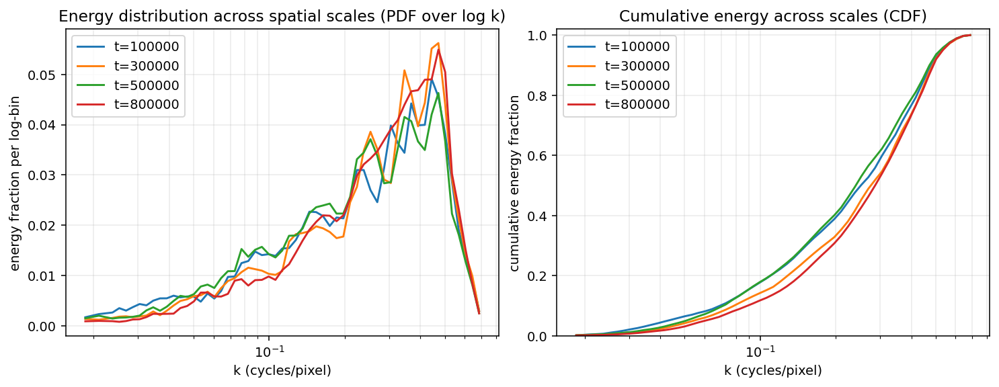

colony-track: 1601it [00:30, 53.21it/s]


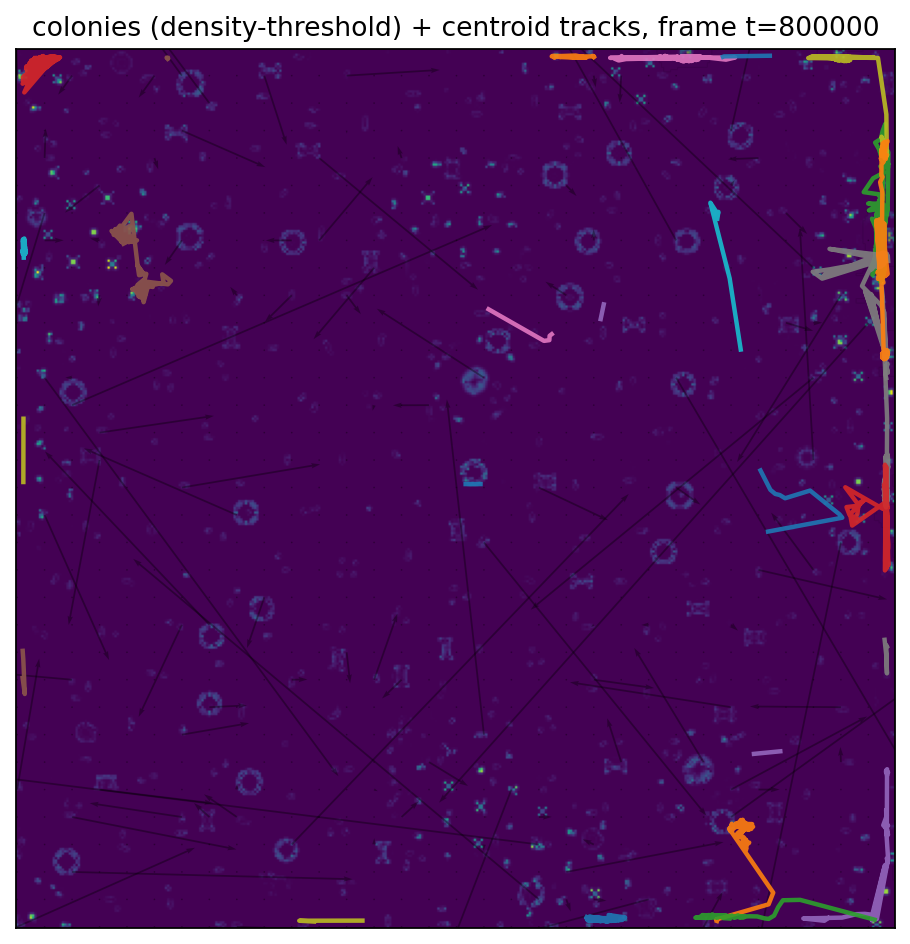

In [9]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.ndimage import uniform_filter, label

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"

# интервал, где хотите трекать колонии
t1, t2 = 760_000, 840_000

frame_stride = 1
dt_sim = 50.0
dt_eff = dt_sim * frame_stride

device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# параметры детектора колоний
ds_vis = 1          # можно 2/4 если тяжело, но лучше 1 для точек
q_mag = 0.995       # порог "точек" по |J|
dens_win = 23       # окно плотности (в пикселях), подберите под размер колонии
q_dens = 0.995      # порог колоний по плотности
min_area = 120      # минимальная площадь региона колонии (в пикселях после ds_vis)

# параметры трекера
max_dist = 35.0     # максимум сдвига центроида между кадрами (в пикселях после ds_vis)

# визуализация
plot_t = 800_000     # кадр, на котором покажем маску колоний
quiver_step = 12     # шаг для стрелочек на визуализации


def pool2(Jp, ds):
    if ds <= 1:
        return Jp
    H, W, C = Jp.shape
    H2, W2 = H // ds, W // ds
    return Jp[:H2*ds, :W2*ds, :].reshape(H2, ds, W2, ds, C).mean(axis=(1, 3))


def compute_Jp(snapshot):
    with jax.default_device(dev):
        A = jnp.asarray(snapshot["A"], dtype=jnp.float32)
        F = jnp.asarray(snapshot["F"], dtype=jnp.float32)
        _, _, Jp, _, _ = jperp_fn(A, F)
    return np.asarray(jax.device_get(Jp), dtype=np.float32)


def detect_colonies(Jp):
    Jp = pool2(Jp, ds_vis)
    mag = np.sqrt(Jp[..., 0]**2 + Jp[..., 1]**2)

    thr = float(np.quantile(mag, q_mag))
    pts = (mag >= thr).astype(np.float32)

    dens = uniform_filter(pts, size=dens_win, mode="nearest")
    dens_thr = float(np.quantile(dens, q_dens))
    colony = dens >= dens_thr

    lbl, n = label(colony)
    regs = []
    for rid in range(1, n + 1):
        m = (lbl == rid)
        area = int(m.sum())
        if area < min_area:
            continue
        ys, xs = np.nonzero(m)
        cy = float(ys.mean())
        cx = float(xs.mean())
        Jmean = Jp[m].mean(axis=0)          # (2,)
        mag_mean = float(mag[m].mean())
        regs.append({"id": rid, "cy": cy, "cx": cx, "area": area, "Jmean": Jmean, "mag_mean": mag_mean})
    return mag, pts, dens, colony, regs


def match_tracks(prev_tracks, regs):
    # prev_tracks: dict tid -> last (cy,cx)
    # regs: list of dict with (cy,cx)
    used = set()
    assigns = {}  # tid -> reg_index
    for tid, (py, px) in prev_tracks.items():
        best_j = None
        best_d = 1e9
        for j, r in enumerate(regs):
            if j in used:
                continue
            dy = r["cy"] - py
            dx = r["cx"] - px
            d = float(np.hypot(dy, dx))
            if d < best_d:
                best_d = d
                best_j = j
        if best_j is not None and best_d <= max_dist:
            assigns[tid] = best_j
            used.add(best_j)

    new_tracks = dict(prev_tracks)
    for tid, j in assigns.items():
        r = regs[j]
        new_tracks[tid] = (r["cy"], r["cx"])

    # новые регионы -> новые треки
    next_tid = (max(prev_tracks.keys()) + 1) if prev_tracks else 0
    for j, r in enumerate(regs):
        if j in used:
            continue
        new_tracks[next_tid] = (r["cy"], r["cx"])
        next_tid += 1

    return new_tracks, assigns


# ----------------------------
# RUN: scan frames, detect colonies, track centroids
# ----------------------------
tracks_xy = {}   # tid -> list of (t, cy, cx, Jmean_y, Jmean_x)
active = {}      # tid -> (cy,cx)

Jp_plot = None
mag_plot = None
colony_plot = None

seen = 0
for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "F")), desc="colony-track"):
    if (seen % frame_stride) != 0:
        seen += 1
        continue
    seen += 1

    ti = int(t)
    Jp = compute_Jp(s)

    mag, pts, dens, colony, regs = detect_colonies(Jp)

    active, assigns = match_tracks(active, regs)

    # лог треков
    for tid, (cy, cx) in active.items():
        # найдём Jmean региона, если он был сматчен в этом кадре, иначе ставим nan
        Jmy, Jmx = np.nan, np.nan
        for r in regs:
            if abs(r["cy"] - cy) < 1e-6 and abs(r["cx"] - cx) < 1e-6:
                Jmy, Jmx = float(r["Jmean"][0]), float(r["Jmean"][1])
                break
        tracks_xy.setdefault(tid, []).append((ti, cy, cx, Jmy, Jmx))

    if ti == plot_t:
        Jp_plot = pool2(Jp, ds_vis)
        mag_plot = mag
        colony_plot = colony.copy()

# ----------------------------
# PLOT: one frame + colony mask + trajectories
# ----------------------------
if Jp_plot is None:
    # если точного plot_t нет, возьмём ближайший из записанных
    # (для простоты — просто возьмите plot_t, который точно есть)
    raise RuntimeError("plot_t не попал в [t1,t2] или не встретился в снапшотах")

H, W = mag_plot.shape

plt.figure(figsize=(6, 6), dpi=160)
plt.imshow(mag_plot, origin="lower")
plt.imshow(np.ma.masked_where(~colony_plot, colony_plot), origin="lower", alpha=0.35)

# стрелочки среднего J внутри колоний (по сетке) — чисто для ориентира
U = Jp_plot[..., 0]
V = Jp_plot[..., 1]
xs = np.arange(0, W, quiver_step)
ys = np.arange(0, H, quiver_step)
X, Y = np.meshgrid(xs, ys)
plt.quiver(X, Y, U[::quiver_step, ::quiver_step], V[::quiver_step, ::quiver_step],
           angles="xy", scale_units="xy", scale=None, width=0.002, alpha=0.35)

# траектории центроидов колоний
for tid, seq in tracks_xy.items():
    # рисуем только достаточно длинные
    if len(seq) < 8:
        continue
    ys_tr = [p[1] for p in seq]
    xs_tr = [p[2] for p in seq]
    plt.plot(xs_tr, ys_tr, linewidth=2.0, alpha=0.9)

plt.title(f"colonies (density-threshold) + centroid tracks, frame t={plot_t}")
plt.xticks([]); plt.yticks([])
plt.tight_layout()
plt.show()

angle-dists: 16000it [02:33, 104.29it/s]


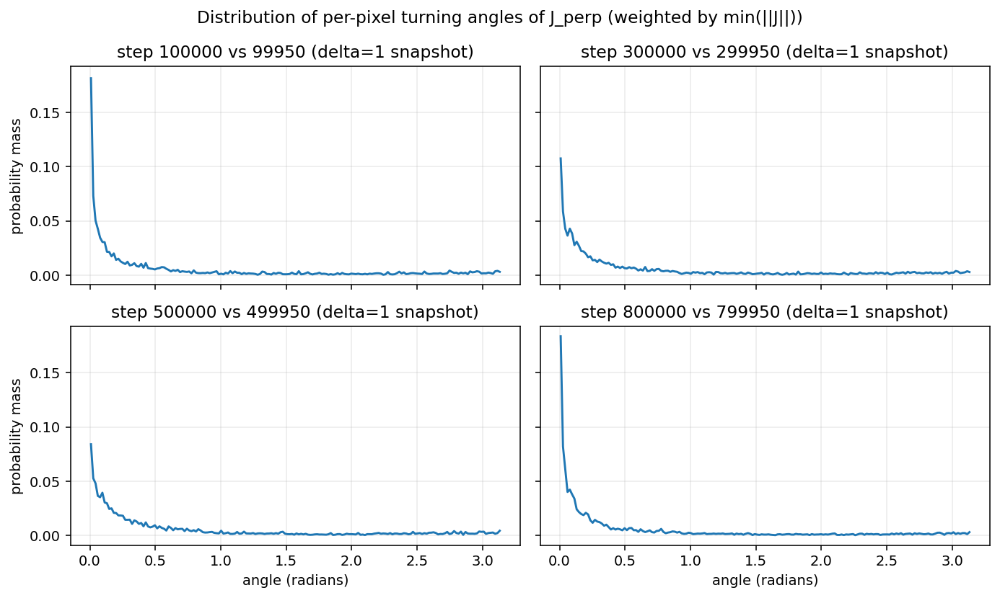

In [1]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
target_steps = [100_000, 300_000, 500_000, 800_000]  # sim steps (must exist in logs)
t1, t2 = 0, max(target_steps) + 1                    # iterate enough to hit targets
frame_stride = 1                                     # logging already every 50 sim-steps
delta = 1                                            # in snapshots (=> 50 sim-steps here)

bins = 180                                           # histogram bins on [0, pi]
eps = 1e-12

# ----------------------------
# DEVICE + JPERP
# ----------------------------
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# MAIN
# ----------------------------
targets = set(target_steps)
done = {}

prev_step = None
prev_Jp = None

seen = 0
for step, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A","F")), desc="angle-dists"):
    if (seen % frame_stride) != 0:
        seen += 1
        continue
    seen += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        _, _, Jp, _, _ = jperp_fn(A, F)                         # (H,W,2)

    if prev_Jp is None:
        prev_Jp = Jp
        prev_step = int(step)
        continue

    cur_step = int(step)

    # delta=1 in snapshots => compare prev snapshot to current snapshot
    if cur_step in targets:
        J0 = prev_Jp
        J1 = Jp

        n0 = jnp.sqrt(jnp.sum(J0 * J0, axis=-1) + eps)          # (H,W)
        n1 = jnp.sqrt(jnp.sum(J1 * J1, axis=-1) + eps)          # (H,W)
        u0 = J0 / n0[..., None]
        u1 = J1 / n1[..., None]
        c = jnp.clip(jnp.sum(u0 * u1, axis=-1), -1.0, 1.0)      # cos(angle)
        ang = jnp.arccos(c)                                     # radians in [0, pi]

        # weights suppress near-zero flow pixels (optional but рекомендую)
        w = jnp.minimum(n0, n1)                                 # (H,W)

        ang_np = np.asarray(jax.device_get(ang), dtype=np.float32).ravel()
        w_np   = np.asarray(jax.device_get(w),   dtype=np.float32).ravel()

        # If you want UNWEIGHTED distribution: set w_np = None and use np.histogram(..., weights=None)
        done[cur_step] = (ang_np, w_np, prev_step, cur_step)

        if len(done) == len(target_steps):
            break

    prev_Jp = Jp
    prev_step = cur_step

# ----------------------------
# PLOT
# ----------------------------
edges = np.linspace(0.0, np.pi, bins + 1)
centers = 0.5 * (edges[:-1] + edges[1:])

fig, axs = plt.subplots(2, 2, figsize=(10, 6), dpi=140, sharex=True, sharey=True)
axs = axs.ravel()

for ax, t in zip(axs, target_steps):
    if t not in done:
        ax.set_title(f"t={t}: NOT FOUND")
        ax.axis("off")
        continue

    ang_np, w_np, tprev, tcur = done[t]
    # weighted PDF
    hist, _ = np.histogram(ang_np, bins=edges, weights=w_np, density=False)
    pdf = hist / (hist.sum() + 1e-30)
    ax.plot(centers, pdf)
    ax.set_title(f"step {tcur} vs {tprev} (delta=1 snapshot)")
    ax.grid(True, alpha=0.25)

for ax in axs[2:]:
    ax.set_xlabel("angle (radians)")
for ax in axs[::2]:
    ax.set_ylabel("probability mass")

plt.suptitle("Distribution of per-pixel turning angles of J_perp (weighted by min(||J||))")
plt.tight_layout()
plt.show()

cache ranges: [(20000, 130000), (220000, 330000), (420000, 530000), (720000, 830000)]
cache frames (expected): 8804


cache: 20000it [03:10, 104.88it/s]


cached frames (got): 8804


KeyboardInterrupt: 

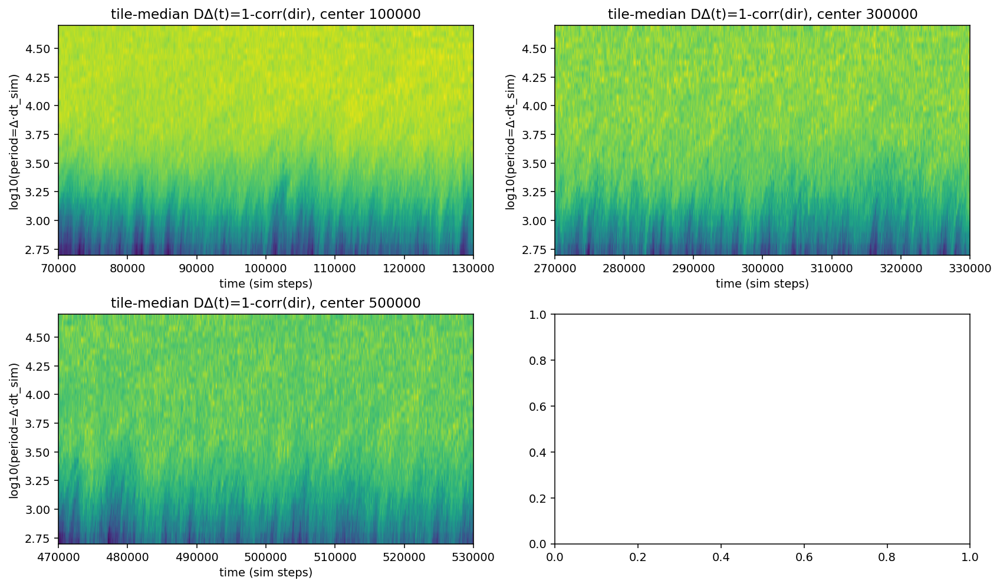

In [2]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
t1, t2 = 0, 1_000_000
frame_stride = 1

dt_sim = 50  # sim-steps per snapshot (у тебя так)
period_min, period_max = 500, 50_000
delta_min = period_min // dt_sim          # 10 snapshots
delta_max = period_max // dt_sim          # 1000 snapshots

centers_steps = [100_000, 300_000, 500_000, 800_000]

# "окрестность" вокруг центра, в сим-шагах (без учета запаса под delta_max)
neigh_steps = 30_000

# тайлы для робастной агрегации
tile_h, tile_w = 32, 32

# сетка лагов (в снапшотах) — логарифмическая, чтобы покрыть [10..1000]
n_deltas = 40
delta_list = np.unique(np.round(np.logspace(np.log10(delta_min), np.log10(delta_max), n_deltas)).astype(int))
delta_list = delta_list[(delta_list >= 1)]
delta_list = np.unique(delta_list)

eps = 1e-8

device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# build step-set to cache (include margin for max delta)
# ----------------------------
margin_steps = delta_max * dt_sim
cache_ranges = []
for c in centers_steps:
    lo = max(t1, c - neigh_steps - margin_steps)
    hi = min(t2, c + neigh_steps)
    cache_ranges.append((lo, hi))

def in_any_range(t, ranges):
    for lo, hi in ranges:
        if lo <= t <= hi:
            return True
    return False

# expected step grid
def snap_grid(lo, hi, dt):
    lo2 = ((lo + dt - 1)//dt)*dt
    hi2 = (hi//dt)*dt
    return np.arange(lo2, hi2 + 1, dt, dtype=np.int64)

cache_steps = set()
for lo, hi in cache_ranges:
    for tt in snap_grid(lo, hi, dt_sim):
        cache_steps.add(int(tt))

print("cache ranges:", cache_ranges)
print("cache frames (expected):", len(cache_steps))

# ----------------------------
# PASS 1: cache u_t(x), norm_t(x) in RAM
# ----------------------------
U = {}   # step -> (H,W,2) float16
Nrm = {} # step -> (H,W)   float16

seen = 0
for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A","F")), desc="cache"):
    if (seen % frame_stride) != 0:
        seen += 1
        continue
    seen += 1

    if int(t) not in cache_steps:
        continue

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        _, _, Jp, _, _ = jperp_fn(A, F)              # (H,W,2)
        nrm = jnp.sqrt(jnp.sum(Jp*Jp, axis=-1) + eps) # (H,W)
        u = Jp / nrm[..., None]

    u_np = np.asarray(jax.device_get(u), dtype=np.float16)
    n_np = np.asarray(jax.device_get(nrm), dtype=np.float16)
    U[int(t)] = u_np
    Nrm[int(t)] = n_np

print("cached frames (got):", len(U))

# ----------------------------
# helpers: tile-median direction decorrelation
# ----------------------------
def tile_reduce_corr(u1, n1, u0, n0, tile_h=32, tile_w=32, eps=1e-8):
    # u*: (H,W,2), n*: (H,W)
    H, W, _ = u1.shape
    H2 = (H // tile_h) * tile_h
    W2 = (W // tile_w) * tile_w

    u1 = u1[:H2, :W2].astype(np.float32)
    u0 = u0[:H2, :W2].astype(np.float32)
    n1 = n1[:H2, :W2].astype(np.float32)
    n0 = n0[:H2, :W2].astype(np.float32)

    dot = (u1[...,0]*u0[...,0] + u1[...,1]*u0[...,1])             # (H2,W2)
    w = np.minimum(n1, n0)                                        # (H2,W2)
    wd = w * dot

    # -> (Th, tile_h, Tw, tile_w)
    Th = H2 // tile_h
    Tw = W2 // tile_w
    wd_t = wd.reshape(Th, tile_h, Tw, tile_w).sum(axis=(1,3))     # (Th,Tw)
    w_t  = w.reshape(Th, tile_h, Tw, tile_w).sum(axis=(1,3))      # (Th,Tw)

    corr_t = wd_t / (w_t + eps)                                   # (Th,Tw)
    # робастно к “глайдеру в одном месте”: берем медиану по тайлам
    corr = np.median(corr_t.reshape(-1))
    return corr

def compute_heatmap_for_center(center_step):
    lo = max(t1, center_step - neigh_steps)
    hi = min(t2, center_step + neigh_steps)

    steps = snap_grid(lo, hi, dt_sim)
    steps = np.array([t for t in steps if t in U and t in Nrm], dtype=np.int64)

    # для каждого t нужно t - max(delta) присутствовать
    steps_ok = []
    for t in steps:
        if int(t - delta_max*dt_sim) in U:
            steps_ok.append(int(t))
    steps_ok = np.asarray(steps_ok, dtype=np.int64)
    steps_ok.sort()

    if len(steps_ok) == 0:
        raise RuntimeError(f"no steps with full lag coverage near center {center_step}")

    y = np.zeros((len(delta_list), len(steps_ok)), dtype=np.float32)  # D(t,delta)=1-corr

    for j, d in enumerate(delta_list):
        dt = int(d * dt_sim)
        for i, t in enumerate(steps_ok):
            u1 = U[int(t)]
            n1 = Nrm[int(t)]
            u0 = U[int(t - dt)]
            n0 = Nrm[int(t - dt)]
            c = tile_reduce_corr(u1, n1, u0, n0, tile_h, tile_w, eps=eps)
            y[j, i] = 1.0 - c

    return steps_ok, y

# ----------------------------
# compute + plot (4 panels)
# ----------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 7), dpi=140, constrained_layout=True)
axes = axes.reshape(-1)

y_axis = np.log10(delta_list * dt_sim)

for ax, c in zip(axes, centers_steps):
    steps_ok, Y = compute_heatmap_for_center(c)   # Y: (len(delta_list), T)
    ax.imshow(
        Y,
        aspect="auto",
        origin="lower",
        extent=[float(steps_ok[0]), float(steps_ok[-1]), float(y_axis[0]), float(y_axis[-1])],
    )
    ax.set_title(f"tile-median DΔ(t)=1-corr(dir), center {c}")
    ax.set_xlabel("time (sim steps)")
    ax.set_ylabel("log10(period=Δ·dt_sim)")

plt.suptitle(f"Direction decorrelation heatmaps (tile {tile_h}x{tile_w}, Δ in [{delta_list.min()},{delta_list.max()}] snapshots)", y=1.02)
plt.show()

scan: 0it [00:00, ?it/s]

scan: 16000it [00:47, 334.71it/s]


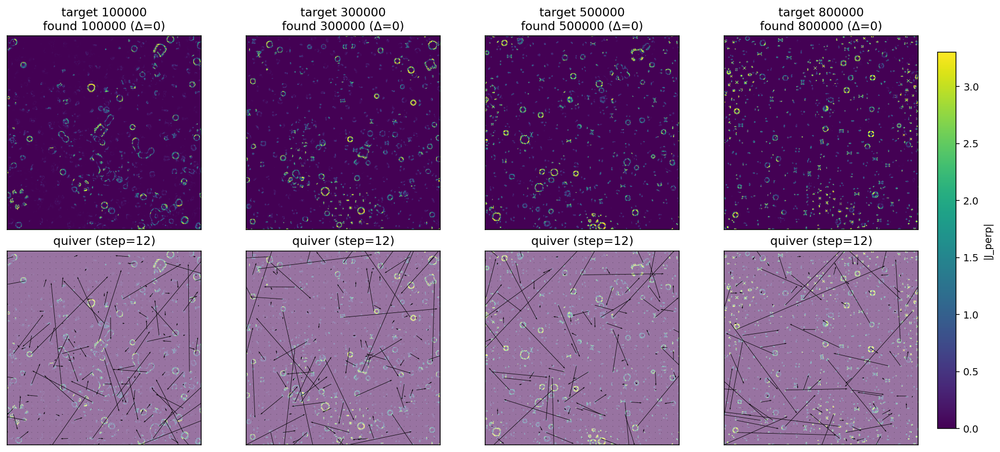

In [5]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG (подставь свои)
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602101525/interp_6"
t1, t2   = 0, 1_000_000
frame_stride = 1

dt_sim = 50.0                         # шаг между снапшотами в sim steps (у тебя так)
targets = [100_000, 300_000, 500_000, 800_000]

# quiver downsample (для стрелочек)
q = 12

device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)


def pick_nearest_snapshots(save_pth, targets, t1, t2, frame_stride, dt_sim, fields=("A", "F")):
    targets = list(map(int, targets))
    best = {tt: (10**18, None, None) for tt in targets}  # tt -> (abs_delta, found_t, snapshot)
    seen = 0

    # типичный шаг по t у снапшотов (для ранней остановки)
    dt_snap = int(dt_sim * frame_stride)

    for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=fields), desc="scan"):
        if (seen % frame_stride) != 0:
            seen += 1
            continue
        seen += 1

        ti = int(t)
        for tt in targets:
            d = abs(ti - tt)
            if d < best[tt][0]:
                best[tt] = (d, ti, s)

        # ранняя остановка: когда мы уже прошли максимум и у всех точность <= dt_snap/2
        if ti >= max(targets):
            ok = True
            for tt in targets:
                if best[tt][1] is None or best[tt][0] > dt_snap // 2:
                    ok = False
                    break
            if ok:
                break

    out = {}
    for tt in targets:
        d, ti, s = best[tt]
        if s is None:
            raise RuntimeError(f"Не нашёл снапшот для target={tt} в диапазоне [{t1},{t2}]")
        out[tt] = (ti, s, d)
    return out


# 1) найдём ближайшие снапшоты к нужным временам
picked = pick_nearest_snapshots(save_pth, targets, t1, t2, frame_stride, dt_sim)

# 2) посчитаем J_perp для каждого
Jps = {}
for tt in targets:
    ti, s, d = picked[tt]
    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        _, _, Jp, _, _ = jperp_fn(A, F)         # (H, W, 2)
    Jp = np.asarray(jax.device_get(Jp), dtype=np.float32)
    Jps[tt] = (ti, d, Jp)

# 3) подготовим масштабы для сравнимого imshow (один vmax на все кадры)
mags = []
for tt in targets:
    _, _, Jp = Jps[tt]
    mags.append(np.linalg.norm(Jp, axis=-1))
all_mag = np.concatenate([m.ravel() for m in mags], axis=0)
vmax = float(np.quantile(all_mag, 0.995))
vmin = 0.0

# 4) визуализация: верхний ряд magnitude, нижний ряд quiver
fig, axes = plt.subplots(
    2, len(targets),
    figsize=(3.6 * len(targets), 6.2),
    dpi=140,
    constrained_layout=True,
)

for i, tt in enumerate(targets):
    ti, d, Jp = Jps[tt]
    mag = np.linalg.norm(Jp, axis=-1)          # (H,W)
    U = Jp[..., 0]
    V = Jp[..., 1]

    ax0 = axes[0, i]
    im = ax0.imshow(mag, vmin=vmin, vmax=vmax, origin="lower")
    ax0.set_title(f"target {tt}\nfound {ti} (Δ={d})")
    ax0.set_xticks([]); ax0.set_yticks([])

    ax1 = axes[1, i]
    # subsample for arrows
    UU = U[::q, ::q]
    VV = V[::q, ::q]
    H, W = U.shape
    xs = np.arange(0, W, q)
    ys = np.arange(0, H, q)
    X, Y = np.meshgrid(xs, ys)
    ax1.imshow(mag, vmin=vmin, vmax=vmax, origin="lower", alpha=0.55)
    ax1.quiver(X, Y, UU, VV, angles="xy", scale_units="xy", scale=None, width=0.0022)
    ax1.set_title(f"quiver (step={q})")
    ax1.set_xticks([]); ax1.set_yticks([])

cbar = fig.colorbar(im, ax=axes, shrink=0.92, pad=0.02)
cbar.set_label("|J_perp|")
plt.show()

scan experiments/flow_lenia_apf_rollouts/checkpoints/2602021501: 20000it [03:04, 108.21it/s]
scan experiments/flow_lenia_apf_rollouts/checkpoints/2602101525/interp_6: 20000it [02:56, 113.42it/s]



== point ==
frames: 20000 dt_sim≈ 50
E:  median 10.438148498535156 p90 10.996093368530273
R=D/Eprev: median 0.7769210338592529 p90 0.9019914746284485 p99 0.9813282215595246
C=cos(prev): median 0.6116713789364886 p10 0.5488530662720277

== avg ==
frames: 20000 dt_sim≈ 50
E:  median 2.8966622352600098 p90 3.595855021476746
R=D/Eprev: median 0.0026962582487612963 p90 0.0036070943344384434 p99 0.004022175269201398
C=cos(prev): median 0.9986529901806607 p10 0.9981979789587371


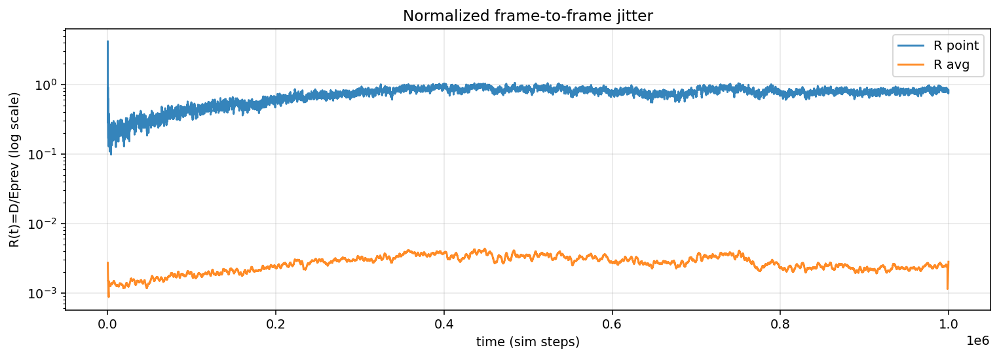

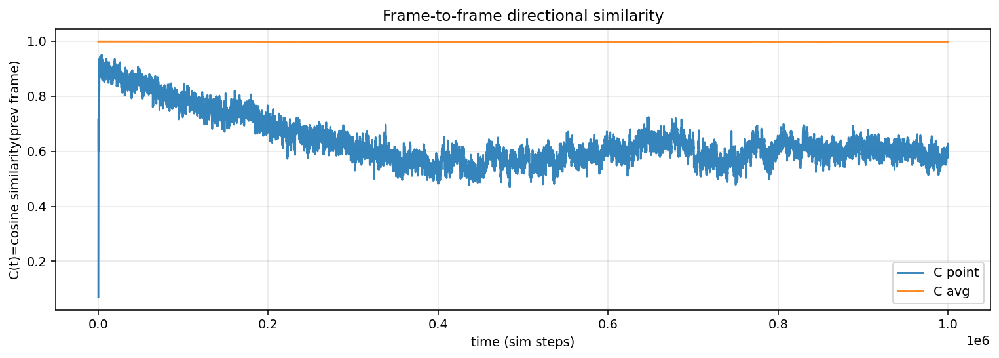

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from flow_drift_metrics import iter_npz_snapshots

eps = 1e-12

def frame_energy_and_flat(F):
    F = np.asarray(F, np.float32)
    flat = F.reshape(-1).astype(np.float32)
    E = (flat * flat).mean()
    return E, flat

def run_stability(save_pth, t1=0, t2=1_000_000, frame_stride=1):
    steps = []
    E = []
    D = []
    R = []
    C = []

    prev_flat = None
    prev_E = None

    i = 0
    for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("F",)), desc=f"scan {save_pth}"):
        if (i % frame_stride) != 0:
            i += 1
            continue
        i += 1

        Et, flat = frame_energy_and_flat(s["F"])
        steps.append(int(t))
        E.append(float(Et))

        if prev_flat is not None:
            d = flat - prev_flat
            Dt = float((d * d).mean())
            D.append(Dt)
            R.append(Dt / (prev_E + eps))

            num = float((flat * prev_flat).sum())
            den = float(np.sqrt((flat * flat).sum() * (prev_flat * prev_flat).sum()) + eps)
            C.append(num / den)

        prev_flat = flat
        prev_E = Et

    steps = np.asarray(steps, np.int64)
    E = np.asarray(E, np.float64)
    D = np.asarray(D, np.float64)
    R = np.asarray(R, np.float64)
    C = np.asarray(C, np.float64)

    return dict(steps=steps, E=E, D=D, R=R, C=C)

def summarize(name, out):
    def q(x, p): return float(np.percentile(x, p))
    print(f"\n== {name} ==")
    print("frames:", len(out["steps"]), "dt_sim≈", int(np.median(np.diff(out["steps"]))) if len(out["steps"]) > 1 else None)
    print("E:  median", float(np.median(out["E"])), "p90", q(out["E"], 90))
    if len(out["R"]) > 0:
        print("R=D/Eprev: median", float(np.median(out["R"])), "p90", q(out["R"], 90), "p99", q(out["R"], 99))
        print("C=cos(prev): median", float(np.median(out["C"])), "p10", q(out["C"], 10))

# ---- use ----
save_point = "experiments/flow_lenia_apf_rollouts/checkpoints/2602021501"
save_avg   = "experiments/flow_lenia_apf_rollouts/checkpoints/2602101525/interp_6"

out0 = run_stability(save_point)
out1 = run_stability(save_avg)

summarize("point", out0)
summarize("avg", out1)

# quick visual: compare R(t) and C(t)
plt.figure(figsize=(11,4), dpi=140)
t0 = out0["steps"][1:]
t1 = out1["steps"][1:]
plt.plot(t0, out0["R"], label="R point", alpha=0.9)
plt.plot(t1, out1["R"], label="R avg", alpha=0.9)
plt.yscale("log")
plt.xlabel("time (sim steps)")
plt.ylabel("R(t)=D/Eprev (log scale)")
plt.title("Normalized frame-to-frame jitter")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(11,4), dpi=140)
plt.plot(t0, out0["C"], label="C point", alpha=0.9)
plt.plot(t1, out1["C"], label="C avg", alpha=0.9)
plt.xlabel("time (sim steps)")
plt.ylabel("C(t)=cosine similarity(prev frame)")
plt.title("Frame-to-frame directional similarity")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

t=100000: total_E=1.288e-02, effective_scales(exp(H))=43.18, bins_used=57
t=300000: total_E=1.109e-02, effective_scales(exp(H))=39.41, bins_used=57
t=500000: total_E=9.186e-03, effective_scales(exp(H))=42.69, bins_used=57
t=800000: total_E=1.216e-02, effective_scales(exp(H))=37.59, bins_used=57


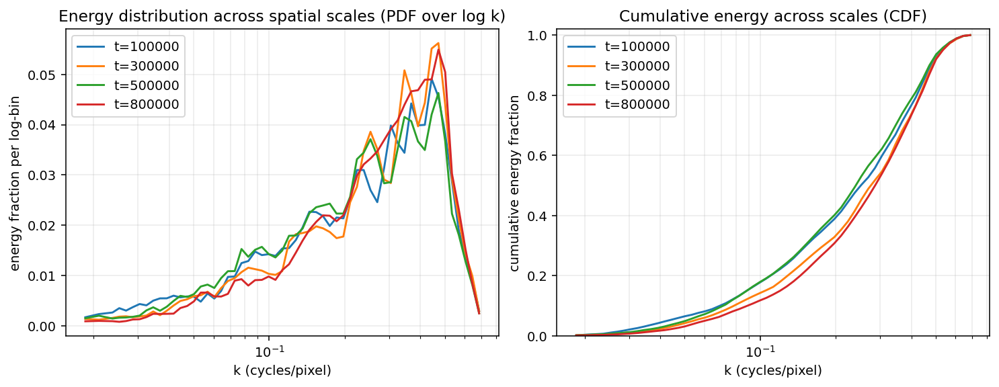

In [6]:
import numpy as np
import matplotlib.pyplot as plt

def isotropic_logbin_energy(Jp, nbins=80, window=True, eps=1e-30):
    """
    Jp: (H, W, 2)
    Returns:
      k_center: centers of log-bins
      Ebin:     energy in each log-bin (shell-sum, not divided by dk)
      Nk:       number of Fourier modes in each bin
      edges:    bin edges
    """
    H, W, _ = Jp.shape
    Ux = Jp[..., 0].astype(np.float64)
    Uy = Jp[..., 1].astype(np.float64)

    if window:
        wx = np.hanning(W)
        wy = np.hanning(H)
        W2 = wy[:, None] * wx[None, :]
        Ux = Ux * W2
        Uy = Uy * W2

    Fx = np.fft.fft2(Ux)
    Fy = np.fft.fft2(Uy)
    P  = 0.5 * (np.abs(Fx)**2 + np.abs(Fy)**2) / (H * W)**2  # per-mode energy

    kx = np.fft.fftfreq(W, d=1.0)
    ky = np.fft.fftfreq(H, d=1.0)
    KX, KY = np.meshgrid(kx, ky, indexing="xy")
    K = np.sqrt(KX**2 + KY**2)

    Kf = K.ravel()
    Pf = P.ravel()

    m = Kf > 0
    Kf = Kf[m]
    Pf = Pf[m]

    kmin = float(Kf.min())
    kmax = float(Kf.max())

    edges = np.logspace(np.log10(kmin + eps), np.log10(kmax), nbins + 1)
    k_center = np.sqrt(edges[1:] * edges[:-1])

    idx = np.digitize(Kf, edges) - 1
    valid = (idx >= 0) & (idx < nbins)

    Ebin = np.zeros(nbins, dtype=np.float64)
    Nk   = np.zeros(nbins, dtype=np.int64)
    np.add.at(Ebin, idx[valid], Pf[valid])
    np.add.at(Nk,   idx[valid], 1)

    return k_center, Ebin, Nk, edges


def effective_scales_from_p(p, eps=1e-30):
    """
    p: probability mass over log-bins, sum=1
    returns exp(entropy) = effective number of occupied bins
    """
    p = np.asarray(p, dtype=np.float64)
    p = p / (p.sum() + eps)
    H = -np.sum(p * np.log(p + eps))
    return float(np.exp(H))


# --- usage on your Jps dict ---
targets = [100_000, 300_000, 500_000, 800_000]
nbins = 90
min_modes_per_bin = 25  # маска от "игл" на малых k

fig, axes = plt.subplots(1, 2, figsize=(10.5, 4), dpi=140, constrained_layout=True)

for tt in targets:
    ti, d, Jp = Jps[tt]
    k, Ebin, Nk, edges = isotropic_logbin_energy(Jp, nbins=nbins, window=True)

    # маска бинов с достаточным числом мод
    m = Nk >= min_modes_per_bin
    k2 = k[m]
    E2 = Ebin[m]

    # PDF по log k: энергия в бине / суммарная энергия (это уже "per decade", т.к. бины логарифмические)
    p = E2 / (E2.sum() + 1e-30)

    # CDF
    cdf = np.cumsum(p)

    axes[0].plot(k2, p, label=f"t={ti}")
    axes[1].plot(k2, cdf, label=f"t={ti}")

    neff = effective_scales_from_p(p)
    print(f"t={ti}: total_E={E2.sum():.3e}, effective_scales(exp(H))={neff:.2f}, bins_used={p.size}")

axes[0].set_xscale("log")
axes[0].set_xlabel("k (cycles/pixel)")
axes[0].set_ylabel("energy fraction per log-bin")
axes[0].set_title("Energy distribution across spatial scales (PDF over log k)")
axes[0].grid(True, which="both", alpha=0.25)
axes[0].legend()

axes[1].set_xscale("log")
axes[1].set_ylim(0, 1.02)
axes[1].set_xlabel("k (cycles/pixel)")
axes[1].set_ylabel("cumulative energy fraction")
axes[1].set_title("Cumulative energy across scales (CDF)")
axes[1].grid(True, which="both", alpha=0.25)
axes[1].legend()

plt.show()

/home/coder/tmp/ipykernel_672611/894210354.py:62: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(freqs > 0, 1.0 / freqs, np.inf)   # sim-steps


selected freqs: 101 period range: 501.96078431372547 25600.0


stream: 20000it [05:01, 66.34it/s]


blocks: 38 D: 18432


spod: 100%|██████████| 101/101 [00:00<00:00, 293.76it/s]


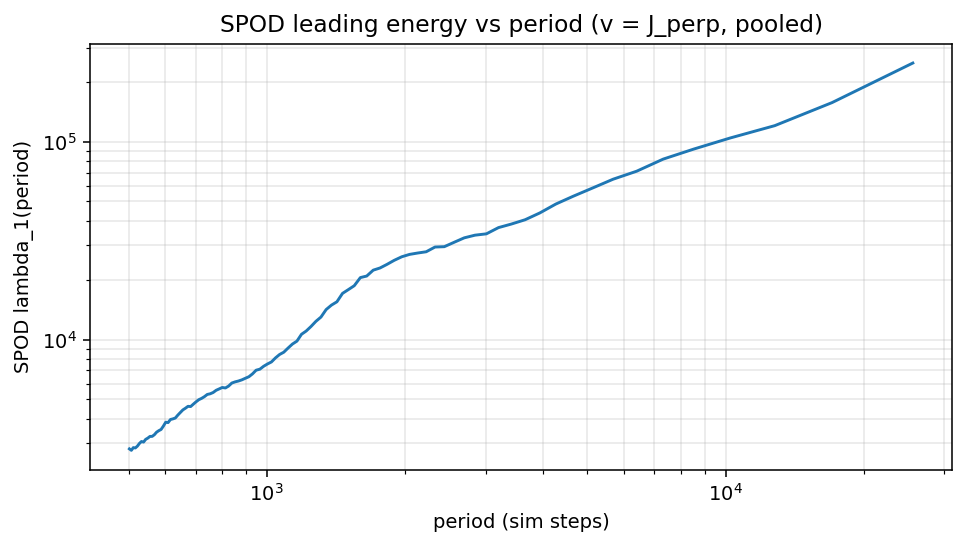

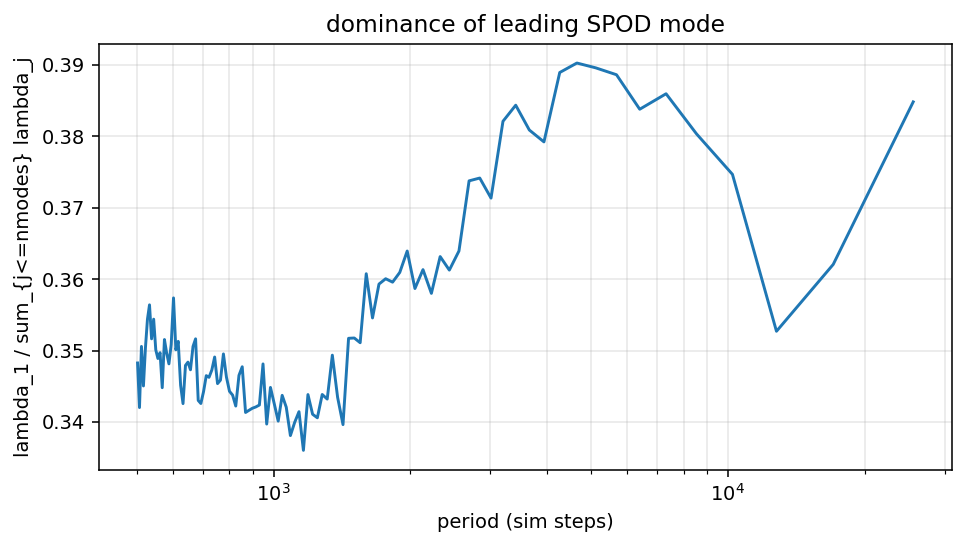

In [7]:
import numpy as np
import jax
import jax.numpy as jnp
from tqdm import tqdm
from collections import deque
import matplotlib.pyplot as plt

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602101525/interp_6"
t1, t2 = 0, 1_000_000          # sim steps
frame_stride = 1               # logging already every 50 sim-steps

dt_sim = 50.0                  # you said fixed; if not, compute from steps
period_min = 500.0
period_max = 50_000.0

ds = 4                         # spatial pooling factor (deterministic)
nfft = 1024                    # max period ~ nfft*dt_sim = 51200
overlap = 0.5
hop = int(nfft * (1.0 - overlap))
nmodes = 3                     # leading SPOD eigenvalues per freq

max_blocks = None              # optionally cap blocks (e.g. 64)

eps = 1e-12
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# helpers
# ----------------------------
def avg_pool_vecfield(v, ds):
    # v: (H,W,2) numpy float32
    H, W, C = v.shape
    H2, W2 = H // ds, W // ds
    v = v[:H2*ds, :W2*ds, :]
    v = v.reshape(H2, ds, W2, ds, C).mean(axis=(1,3))
    return v

# SPOD: method of snapshots at one frequency
def spod_eigs_from_Qf(Qf_BD, nmodes=3):
    # Qf_BD: (B,D) complex64, columns are realizations (blocks) at fixed freq
    B, D = Qf_BD.shape
    Q = Qf_BD.T  # (D,B)
    G = (Q.conj().T @ Q) / float(B)  # (B,B) Hermitian
    w, V = np.linalg.eigh(G)         # ascending
    idx = np.argsort(w)[::-1]
    w = w[idx]
    V = V[:, idx]
    w = np.maximum(w, 0.0)
    return w[:nmodes], V[:, :nmodes]

# ----------------------------
# choose frequencies (period band)
# ----------------------------
freqs = np.fft.rfftfreq(nfft, d=dt_sim)              # cycles per sim-step
periods = np.where(freqs > 0, 1.0 / freqs, np.inf)   # sim-steps
fi_sel = np.where((periods >= period_min) & (periods <= period_max))[0]
fi_sel = fi_sel[fi_sel != 0]                         # drop DC
periods_sel = periods[fi_sel]
nfi = len(fi_sel)
print("selected freqs:", nfi, "period range:", periods_sel.min(), periods_sel.max())

# ----------------------------
# streaming blocks -> store Fourier coeffs for selected freqs
# blocks_F: list of (nfi, D) complex64, length B
# ----------------------------
wtime = np.hanning(nfft).astype(np.float32)
buf = deque(maxlen=nfft)

blocks_F = []
n_seen = 0
i = 0

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A","F")), desc="stream"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        m, J, Jp, q, n = jperp_fn(A, F)  # Jp: (H,W,2)

    Jp_np = np.asarray(jax.device_get(Jp), dtype=np.float32)
    v = avg_pool_vecfield(Jp_np, ds)              # (H',W',2)
    qv = v.reshape(-1)                            # D = 2*H'*W'
    buf.append(qv)
    n_seen += 1

    if n_seen >= nfft and ((n_seen - nfft) % hop == 0):
        block = np.stack(buf, axis=0).astype(np.float32)            # (nfft, D)
        block = block - block.mean(axis=0, keepdims=True)           # remove block-mean
        block = block * wtime[:, None]
        Fblk = np.fft.rfft(block, axis=0).astype(np.complex64)      # (nfreq, D)
        blocks_F.append(Fblk[fi_sel, :])                            # (nfi, D)

        if max_blocks is not None and len(blocks_F) >= max_blocks:
            break

B = len(blocks_F)
print("blocks:", B, "D:", blocks_F[0].shape[1])

Q = np.stack(blocks_F, axis=0)   # (B, nfi, D) complex64

# ----------------------------
# SPOD eigenvalues spectrum
# ----------------------------
lam = np.zeros((nfi, nmodes), dtype=np.float32)

for j in tqdm(range(nfi), desc="spod"):
    Qf = Q[:, j, :]  # (B, D)
    w, _ = spod_eigs_from_Qf(Qf, nmodes=nmodes)
    lam[j, :len(w)] = w.real.astype(np.float32)

# ----------------------------
# plot: leading eigenvalue vs period
# ----------------------------
plt.figure(figsize=(7,4), dpi=140)
plt.plot(periods_sel, lam[:,0] + 1e-30)
plt.xscale("log")
plt.yscale("log")
plt.xlabel("period (sim steps)")
plt.ylabel("SPOD lambda_1(period)")
plt.title("SPOD leading energy vs period (v = J_perp, pooled)")
plt.grid(True, which="both", alpha=0.3)
plt.tight_layout()
plt.show()

# optional: show how many modes are important at each period
plt.figure(figsize=(7,4), dpi=140)
ratio = (lam[:,0] + 1e-30) / (lam.sum(axis=1) + 1e-30)
plt.plot(periods_sel, ratio)
plt.xscale("log")
plt.xlabel("period (sim steps)")
plt.ylabel("lambda_1 / sum_{j<=nmodes} lambda_j")
plt.title("dominance of leading SPOD mode")
plt.grid(True, which="both", alpha=0.3)
plt.tight_layout()
plt.show()

In [10]:
import numpy as np
import jax
import jax.numpy as jnp
from tqdm import tqdm
from collections import deque
import matplotlib.pyplot as plt

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602101525/interp_6"
t1, t2 = 0, 1000_000
frame_stride = 20            # берём каждый N-й снапшот
max_frames = 5000            # ограничение по числу обработанных точек (None = без ограничения)

hue_bins = 12
m_thr_frac = 0.02
sat_min = 0.08
val_min = 0.08

q_top = 0.95                 # агрегат по fg: верхний квантиль
r_list = [0, 1, 2, 4, 8, 12, 16, 20, 24] # пространственные масштабы (радиус box blur)
max_lag = 400                # лаг ACF в шагах по обработанным кадрам

mode = "angle"               # "amp" или "angle"
delta_frames = 10            # только для mode="angle": угол между t и t-delta

eps = 1e-12

# ----------------------------
# SMALL HELPERS
# ----------------------------
def rgb_to_hsv(rgb):
    r, g, b = rgb[..., 0], rgb[..., 1], rgb[..., 2]
    cmax = jnp.maximum(jnp.maximum(r, g), b)
    cmin = jnp.minimum(jnp.minimum(r, g), b)
    delta = cmax - cmin
    delta_safe = delta + 1e-12

    h = jnp.zeros_like(cmax)
    is_r = (cmax == r) & (delta > 0)
    is_g = (cmax == g) & (delta > 0)
    is_b = (cmax == b) & (delta > 0)

    h = jnp.where(is_r, ((g - b) / delta_safe) % 6.0, h)
    h = jnp.where(is_g, ((b - r) / delta_safe) + 2.0, h)
    h = jnp.where(is_b, ((r - g) / delta_safe) + 4.0, h)
    h = (h / 6.0) % 1.0

    s = jnp.where(cmax > 0, delta / (cmax + 1e-12), 0.0)
    v = cmax
    return jnp.stack([h, s, v], axis=-1)

def rgb_bins_label(P, m, hue_bins=12, m_thr_frac=0.02, sat_min=0.08, val_min=0.08):
    rgb = jnp.clip(P[..., :3], 0.0, 1.0)
    hsv = rgb_to_hsv(rgb)
    h, s, v = hsv[..., 0], hsv[..., 1], hsv[..., 2]
    m_thr = m_thr_frac * (jnp.max(m) + 1e-12)
    fg = (m > m_thr) & (s > sat_min) & (v > val_min)
    bin_id = jnp.floor(h * hue_bins).astype(jnp.int32) + 1
    bin_id = jnp.where(bin_id > hue_bins, hue_bins, bin_id)
    return jnp.where(fg, bin_id, 0).astype(jnp.int32)

def box_blur_periodic(x, r):
    if r <= 0:
        return x
    acc = jnp.zeros_like(x)
    for k in range(-r, r + 1):
        acc = acc + jnp.roll(x, k, axis=0)
    acc = acc / float(2 * r + 1)
    acc2 = jnp.zeros_like(acc)
    for k in range(-r, r + 1):
        acc2 = acc2 + jnp.roll(acc, k, axis=1)
    return acc2 / float(2 * r + 1)

def acf_fft(x, max_lag):
    x = np.asarray(x, np.float64)
    x = x - x.mean()
    n = len(x)
    if n < 2:
        return np.full(max_lag + 1, np.nan)
    var = x.var() + 1e-12
    m = 1
    while m < 2 * n:
        m *= 2
    X = np.fft.rfft(x, n=m)
    c = np.fft.irfft(X * np.conj(X), n=m)[:max_lag + 1]
    norm = np.arange(n, n - (max_lag + 1), -1, dtype=np.float64)
    return (c / (var * norm))

def tau_e(ac, dt):
    thr = 1 / np.e
    idx = np.where(ac <= thr)[0]
    return float(idx[0] * dt) if len(idx) else float("nan")

def tau_int(ac, dt):
    ac = np.asarray(ac, np.float64)
    if not np.isfinite(ac[0]):
        return float("nan")
    s = 0.0
    for k in range(1, len(ac)):
        if ac[k] <= 0:
            break
        s += ac[k]
    return float(dt * (1.0 + 2.0 * s))

# ----------------------------
# DEVICE + JPERP
# ----------------------------
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# MAIN: build z_r(t) series
# ----------------------------
series = {r: [] for r in r_list}
fg_frac = []

buf_Jp = deque(maxlen=delta_frames + 1)

i = 0
kept = 0

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "P", "F")), desc="build"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        P = jnp.asarray(s["P"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)

    m, J, Jp, q, n = jperp_fn(A, F)                # Jp: (H,W,2)
    lab = rgb_bins_label(P, m, hue_bins, m_thr_frac, sat_min, val_min)
    fg = (lab > 0)

    fg_frac.append(float(jax.device_get(jnp.mean(fg.astype(jnp.float32)))))

    if mode == "amp":
        X = jnp.sqrt(jnp.sum(Jp * Jp, axis=-1) + eps)     # (H,W)
    elif mode == "angle":
        buf_Jp.append(Jp)
        if len(buf_Jp) < (delta_frames + 1):
            continue
        Jp0 = buf_Jp[0]
        Jp1 = buf_Jp[-1]
        n0 = jnp.sqrt(jnp.sum(Jp0 * Jp0, axis=-1) + eps)
        n1 = jnp.sqrt(jnp.sum(Jp1 * Jp1, axis=-1) + eps)
        u0 = Jp0 / (n0[..., None] + 1e-6)
        u1 = Jp1 / (n1[..., None] + 1e-6)
        c = jnp.clip(jnp.sum(u0 * u1, axis=-1), -1.0, 1.0)  # cos(angle)
        X = 1.0 - c                                         # 0..2, (H,W)
    else:
        raise ValueError("mode must be 'amp' or 'angle'")

    X_fg = jnp.where(fg, X, 0.0)

    outs = []
    for r in r_list:
        Xr = box_blur_periodic(X_fg, r)
        vals = Xr[fg]
        zr = jnp.where(vals.size > 0, jnp.quantile(vals, q_top), 0.0)
        outs.append(zr)

    outs_np = np.asarray(jax.device_get(jnp.stack(outs, axis=0)))
    for r, zr in zip(r_list, outs_np):
        series[r].append(float(zr))

    kept += 1
    if max_frames is not None and kept >= max_frames:
        break

print("built frames:", kept, "mode:", mode, "dt_per_point(sim steps) =", frame_stride)

# ----------------------------
# TIMESCALE ESTIMATION
# ----------------------------
dt = float(frame_stride)  # в "тиках симуляции", если это так у тебя определено

tau_e_map = {}
tau_int_map = {}
ac_map = {}

for r in r_list:
    z = np.asarray(series[r], dtype=np.float64)
    if len(z) < max_lag + 5:
        print("r", r, "too short:", len(z))
        continue
    ac = acf_fft(z, max_lag=max_lag)
    ac_map[r] = ac
    tau_e_map[r] = tau_e(ac, dt)
    tau_int_map[r] = tau_int(ac, dt)

print("tau_e by r:", tau_e_map)
print("tau_int by r:", tau_int_map)

# ----------------------------
# PLOTS (optional)
# ----------------------------
rs = [r for r in r_list if r in tau_e_map]
te = [tau_e_map[r] for r in rs]
ti = [tau_int_map[r] for r in rs]

plt.figure(figsize=(6,4), dpi=140)
plt.plot(rs, te, marker="o")
plt.xlabel("spatial blur radius r (pixels)")
plt.ylabel("tau_e (sim steps)")
plt.title(f"timescale vs spatial scale (mode={mode})")
plt.grid(True)
plt.show()

plt.figure(figsize=(6,4), dpi=140)
plt.plot(rs, ti, marker="o")
plt.xlabel("spatial blur radius r (pixels)")
plt.ylabel("tau_int (sim steps)")
plt.title(f"integral timescale vs spatial scale (mode={mode})")
plt.grid(True)
plt.show()

plt.figure(figsize=(6,4), dpi=140)
for r in rs[:4]:
    plt.plot(ac_map[r], label=f"r={r}")
plt.xlabel("lag (points)")
plt.ylabel("ACF")
plt.title("ACF examples")
plt.legend()
plt.grid(True)
plt.show()


build: 0it [00:00, ?it/s]

build: 3600it [03:44, 16.05it/s]


KeyboardInterrupt: 

angle-dists: 16000it [02:24, 111.09it/s]


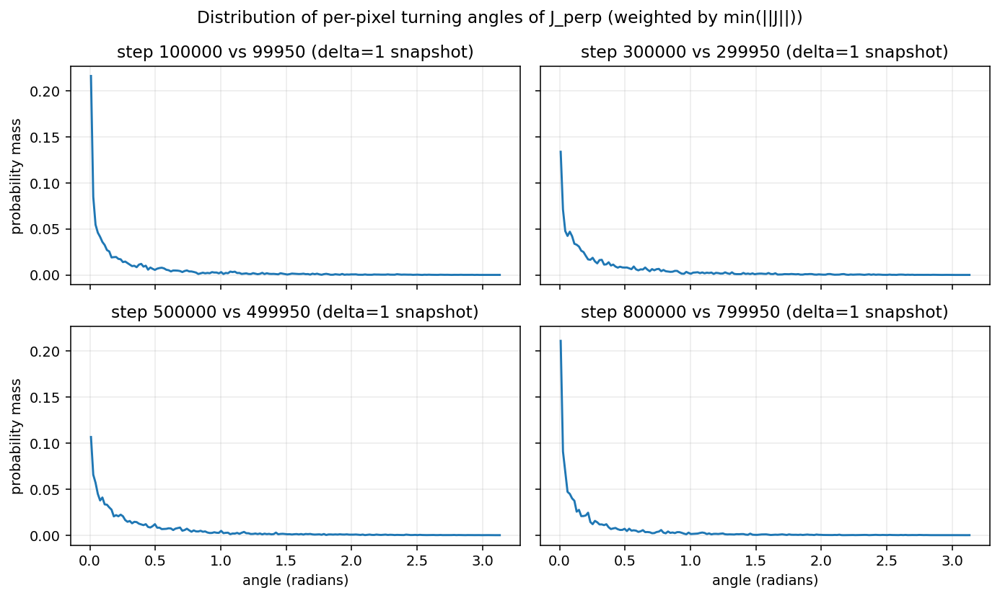

In [9]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602101525/interp_6"
target_steps = [100_000, 300_000, 500_000, 800_000]  # sim steps (must exist in logs)
t1, t2 = 0, max(target_steps) + 1                    # iterate enough to hit targets
frame_stride = 1                                     # logging already every 50 sim-steps
delta = 10                                            # in snapshots (=> 50 sim-steps here)

bins = 180                                           # histogram bins on [0, pi]
eps = 1e-12

# ----------------------------
# DEVICE + JPERP
# ----------------------------
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# MAIN
# ----------------------------
targets = set(target_steps)
done = {}

prev_step = None
prev_Jp = None

seen = 0
for step, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A","F")), desc="angle-dists"):
    if (seen % frame_stride) != 0:
        seen += 1
        continue
    seen += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        _, _, Jp, _, _ = jperp_fn(A, F)                         # (H,W,2)

    if prev_Jp is None:
        prev_Jp = Jp
        prev_step = int(step)
        continue

    cur_step = int(step)

    # delta=1 in snapshots => compare prev snapshot to current snapshot
    if cur_step in targets:
        J0 = prev_Jp
        J1 = Jp

        n0 = jnp.sqrt(jnp.sum(J0 * J0, axis=-1) + eps)          # (H,W)
        n1 = jnp.sqrt(jnp.sum(J1 * J1, axis=-1) + eps)          # (H,W)
        u0 = J0 / n0[..., None]
        u1 = J1 / n1[..., None]
        c = jnp.clip(jnp.sum(u0 * u1, axis=-1), -1.0, 1.0)      # cos(angle)
        ang = jnp.arccos(c)                                     # radians in [0, pi]

        # weights suppress near-zero flow pixels (optional but рекомендую)
        w = jnp.minimum(n0, n1)                                 # (H,W)

        ang_np = np.asarray(jax.device_get(ang), dtype=np.float32).ravel()
        w_np   = np.asarray(jax.device_get(w),   dtype=np.float32).ravel()

        # If you want UNWEIGHTED distribution: set w_np = None and use np.histogram(..., weights=None)
        done[cur_step] = (ang_np, w_np, prev_step, cur_step)

        if len(done) == len(target_steps):
            break

    prev_Jp = Jp
    prev_step = cur_step

# ----------------------------
# PLOT
# ----------------------------
edges = np.linspace(0.0, np.pi, bins + 1)
centers = 0.5 * (edges[:-1] + edges[1:])

fig, axs = plt.subplots(2, 2, figsize=(10, 6), dpi=140, sharex=True, sharey=True)
axs = axs.ravel()

for ax, t in zip(axs, target_steps):
    if t not in done:
        ax.set_title(f"t={t}: NOT FOUND")
        ax.axis("off")
        continue

    ang_np, w_np, tprev, tcur = done[t]
    # weighted PDF
    hist, _ = np.histogram(ang_np, bins=edges, weights=w_np, density=False)
    pdf = hist / (hist.sum() + 1e-30)
    ax.plot(centers, pdf)
    ax.set_title(f"step {tcur} vs {tprev} (delta=1 snapshot)")
    ax.grid(True, alpha=0.25)

for ax in axs[2:]:
    ax.set_xlabel("angle (radians)")
for ax in axs[::2]:
    ax.set_ylabel("probability mass")

plt.suptitle("Distribution of per-pixel turning angles of J_perp (weighted by min(||J||))")
plt.tight_layout()
plt.show()

mu/I: 20000it [05:04, 65.77it/s]


frames: 20000 dt_sim: 50.0
saved: precomputed/mu_I_heatmaps_apf_2602101525.npz


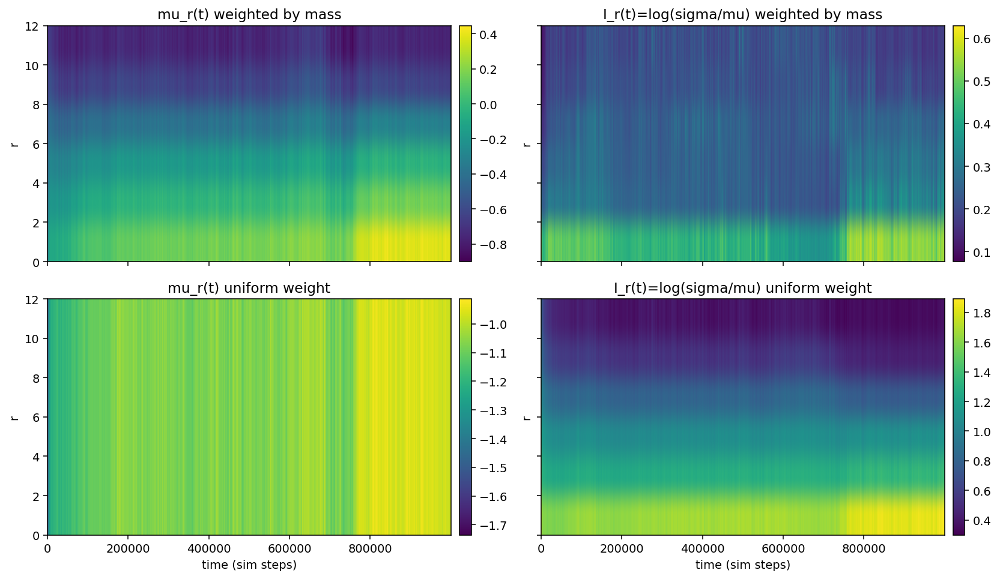

In [11]:
import numpy as np
import jax
import jax.numpy as jnp
import jax.lax as lax
from tqdm import tqdm
import matplotlib.pyplot as plt

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602101525/interp_6"
t1, t2 = 0, 1_000_000          # sim steps
frame_stride = 1               # IMPORTANT: keep 1 (logging already sparse)
max_frames = None              # None = all in [t1,t2]

r_list = [0, 1, 2, 4, 8, 12]
eps = 1e-12

# compute both weights:
do_weight_mass = True          # w = m(x)
do_weight_uniform = True       # w = 1

out_npz = "precomputed/mu_I_heatmaps_apf_2602101525.npz"

# ----------------------------
# DEVICE
# ----------------------------
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# PERIODIC BOX BLUR (2D scalar)
# ----------------------------
def box_blur_periodic_fast_2d(x, r):
    if r <= 0:
        return x
    win = 2 * r + 1

    def blur1d(x, axis):
        def body(i, acc):
            shift = i - r
            return acc + jnp.roll(x, shift, axis=axis)
        acc = lax.fori_loop(0, win, body, jnp.zeros_like(x))
        return acc / float(win)

    x = blur1d(x, axis=0)
    x = blur1d(x, axis=1)
    return x

# stats for fixed r (compiled per r)
def make_stats_fn(r):
    def stats(X, w):
        Xr = box_blur_periodic_fast_2d(X, r)
        sw = jnp.sum(w) + eps
        mu = jnp.sum(w * Xr) / sw
        ms2 = jnp.sum(w * (Xr * Xr)) / sw
        sig = jnp.sqrt(ms2 + eps)
        I = jnp.log((sig + eps) / (mu + eps))
        return mu.astype(jnp.float32), I.astype(jnp.float32)
    return jax.jit(stats)

stats_fns = {r: make_stats_fn(r) for r in r_list}

# ----------------------------
# MAIN LOOP
# ----------------------------
steps = []
mu_mass, I_mass = [], []
mu_uni,  I_uni  = [], []

i = 0
kept = 0

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A", "F")), desc="mu/I"):
    if (i % frame_stride) != 0:
        i += 1
        continue
    i += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)

        m, J, Jp, q, n = jperp_fn(A, F)                 # m: (H,W), Jp: (H,W,2)
        X = jnp.sqrt(jnp.sum(Jp * Jp, axis=-1) + eps)    # X = ||J_perp||, (H,W)

        if do_weight_mass:
            w_m = jnp.maximum(m, 0.0)
        if do_weight_uniform:
            w_u = jnp.ones_like(X)

        mus_m, Is_m = [], []
        mus_u, Is_u = [], []

        for r in r_list:
            fn = stats_fns[r]
            if do_weight_mass:
                mu, I = fn(X, w_m)
                mus_m.append(mu); Is_m.append(I)
            if do_weight_uniform:
                mu, I = fn(X, w_u)
                mus_u.append(mu); Is_u.append(I)

        if do_weight_mass:
            mu_mass.append(np.asarray(jax.device_get(jnp.stack(mus_m)), dtype=np.float32))
            I_mass.append(np.asarray(jax.device_get(jnp.stack(Is_m)), dtype=np.float32))
        if do_weight_uniform:
            mu_uni.append(np.asarray(jax.device_get(jnp.stack(mus_u)), dtype=np.float32))
            I_uni.append(np.asarray(jax.device_get(jnp.stack(Is_u)), dtype=np.float32))

    steps.append(int(t))
    kept += 1
    if max_frames is not None and kept >= max_frames:
        break

steps = np.asarray(steps, dtype=np.int64)
dt_sim = float(np.median(np.diff(steps))) if len(steps) >= 2 else float("nan")
print("frames:", kept, "dt_sim:", dt_sim)

r_arr = np.asarray(r_list, dtype=np.int32)

if do_weight_mass:
    mu_mass = np.stack(mu_mass, axis=0)  # (T,R)
    I_mass  = np.stack(I_mass,  axis=0)  # (T,R)
if do_weight_uniform:
    mu_uni  = np.stack(mu_uni,  axis=0)  # (T,R)
    I_uni   = np.stack(I_uni,   axis=0)  # (T,R)

# ----------------------------
# SAVE
# ----------------------------
payload = {
    "steps": steps,
    "dt_sim": np.asarray(dt_sim, np.float64),
    "r_list": r_arr,
}
if do_weight_mass:
    payload["mu_mass"] = mu_mass
    payload["I_mass"]  = I_mass
if do_weight_uniform:
    payload["mu_uni"] = mu_uni
    payload["I_uni"]  = I_uni

import os
os.makedirs(os.path.dirname(out_npz) or ".", exist_ok=True)
np.savez_compressed(out_npz, **payload)
print("saved:", out_npz)

# ----------------------------
# PLOT (single figure; 2x2 if both weights)
# ----------------------------
t0, t1p = float(steps[0]), float(steps[-1])
extent = [t0, t1p, float(r_arr[0]), float(r_arr[-1])]

def show_heat(ax, Z, title, log=False):
    ZZ = Z.copy()
    if log:
        ZZ = np.log10(ZZ + 1e-30)
    im = ax.imshow(
        ZZ.T, aspect="auto", origin="lower", extent=extent
    )
    ax.set_ylabel("r")
    ax.set_title(title)
    return im

if do_weight_mass and do_weight_uniform:
    fig, ax = plt.subplots(2, 2, figsize=(12, 7), dpi=140, sharex=True, sharey=True)

    im00 = show_heat(ax[0,0], mu_mass, "mu_r(t) weighted by mass", log=True)
    plt.colorbar(im00, ax=ax[0,0], fraction=0.03, pad=0.02)

    im01 = show_heat(ax[0,1], I_mass, "I_r(t)=log(sigma/mu) weighted by mass", log=False)
    plt.colorbar(im01, ax=ax[0,1], fraction=0.03, pad=0.02)

    im10 = show_heat(ax[1,0], mu_uni, "mu_r(t) uniform weight", log=True)
    plt.colorbar(im10, ax=ax[1,0], fraction=0.03, pad=0.02)

    im11 = show_heat(ax[1,1], I_uni, "I_r(t)=log(sigma/mu) uniform weight", log=False)
    plt.colorbar(im11, ax=ax[1,1], fraction=0.03, pad=0.02)

    for a in ax[1,:]:
        a.set_xlabel("time (sim steps)")
    for a in ax[:,0]:
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

elif do_weight_mass:
    fig, ax = plt.subplots(1, 2, figsize=(12, 3.5), dpi=140, sharex=True, sharey=True)

    im0 = show_heat(ax[0], mu_mass, "mu_r(t) weighted by mass", log=True)
    plt.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.02)

    im1 = show_heat(ax[1], I_mass, "I_r(t)=log(sigma/mu) weighted by mass", log=False)
    plt.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.02)

    for a in ax:
        a.set_xlabel("time (sim steps)")
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

else:
    fig, ax = plt.subplots(1, 2, figsize=(12, 3.5), dpi=140, sharex=True, sharey=True)

    im0 = show_heat(ax[0], mu_uni, "mu_r(t) uniform weight", log=True)
    plt.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.02)

    im1 = show_heat(ax[1], I_uni, "I_r(t)=log(sigma/mu) uniform weight", log=False)
    plt.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.02)

    for a in ax:
        a.set_xlabel("time (sim steps)")
        a.set_ylabel("r")

    plt.tight_layout()
    plt.show()

/home/coder/tmp/ipykernel_672611/392756178.py:39: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(freqs > 0, 1.0 / freqs, np.inf)


selected bins: 101 period range: 501.96078431372547 25600.0


mt-spod: 20000it [47:16,  7.05it/s]


windows: 149
saved: mt_spod_smoothed.npz


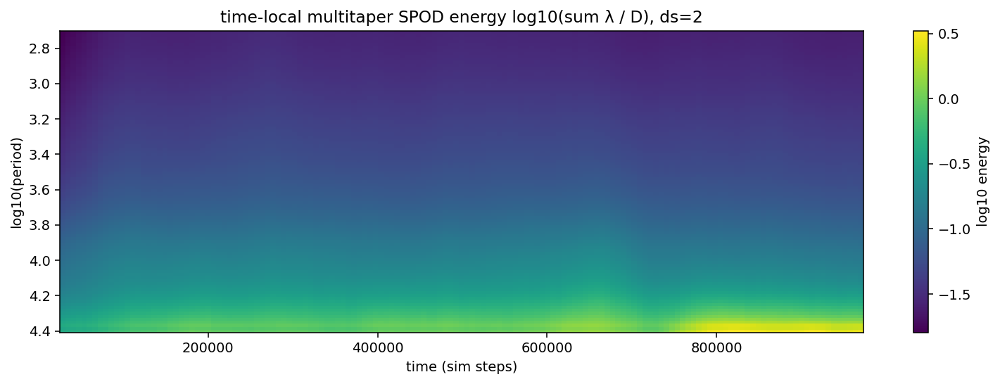

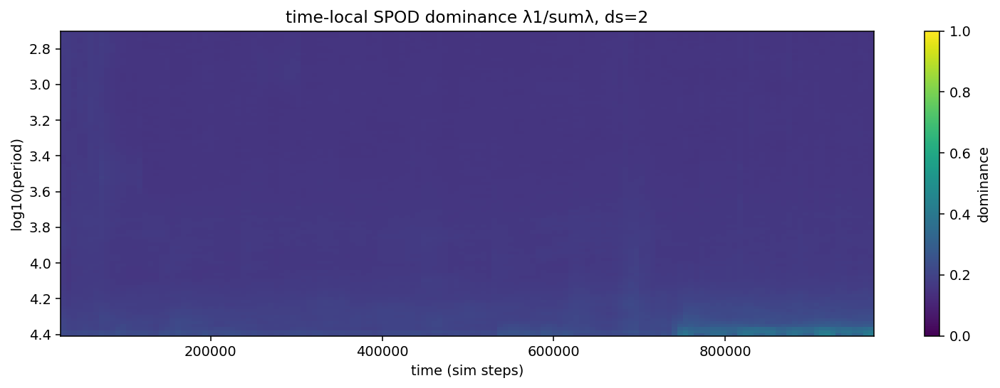

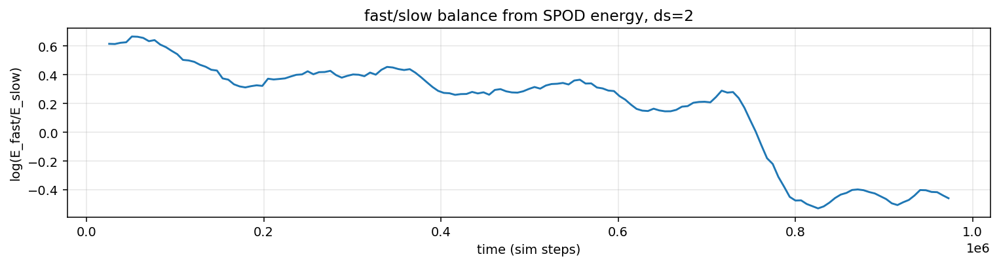

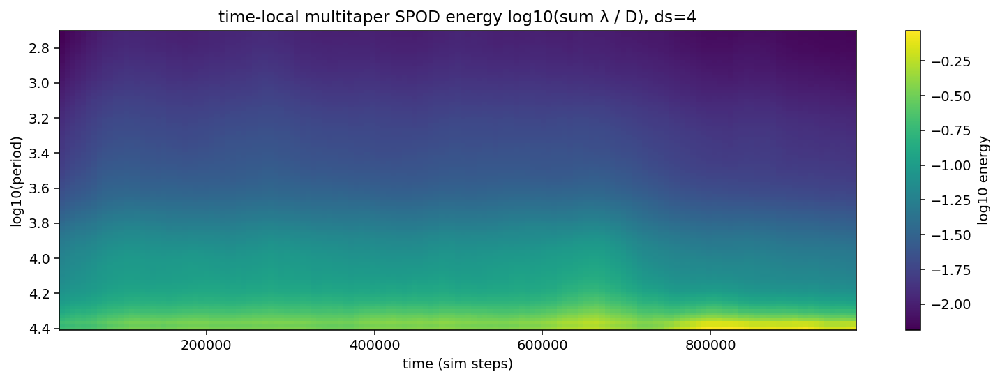

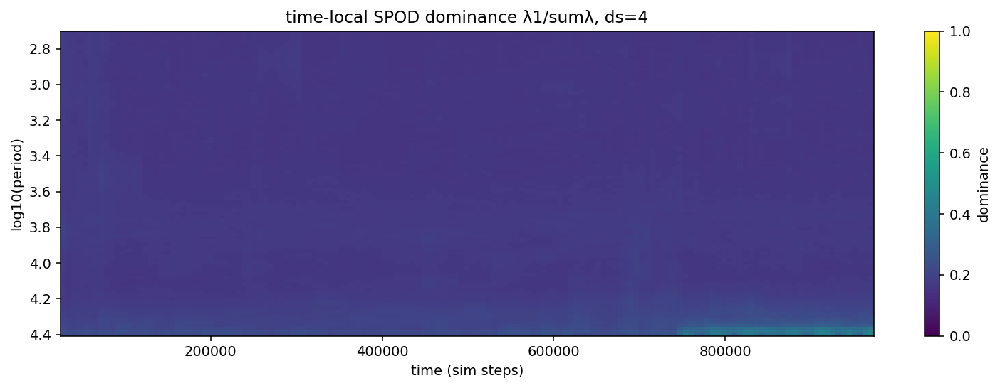

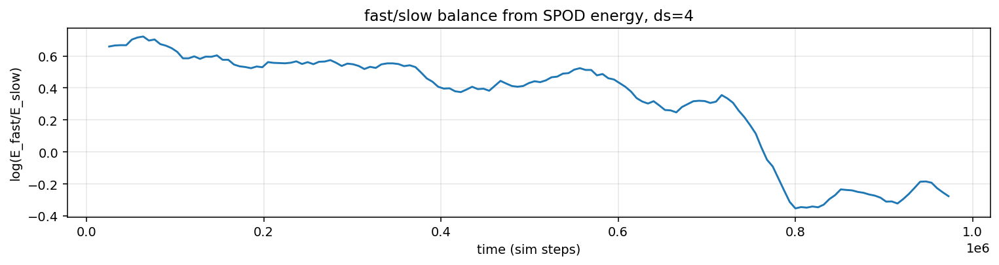

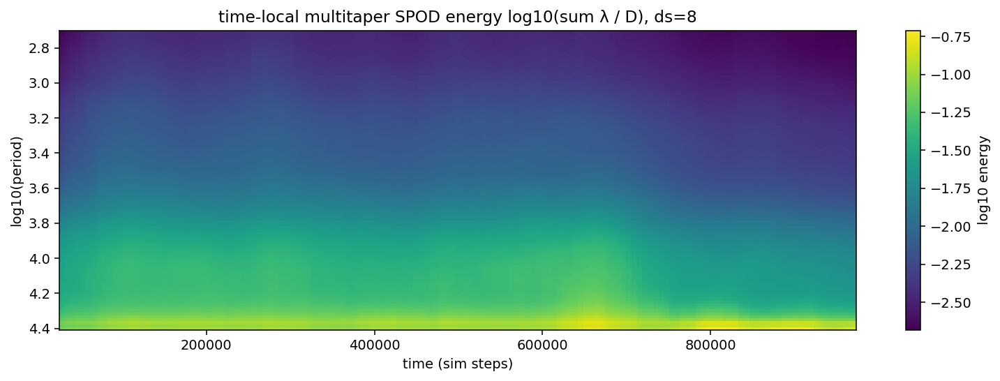

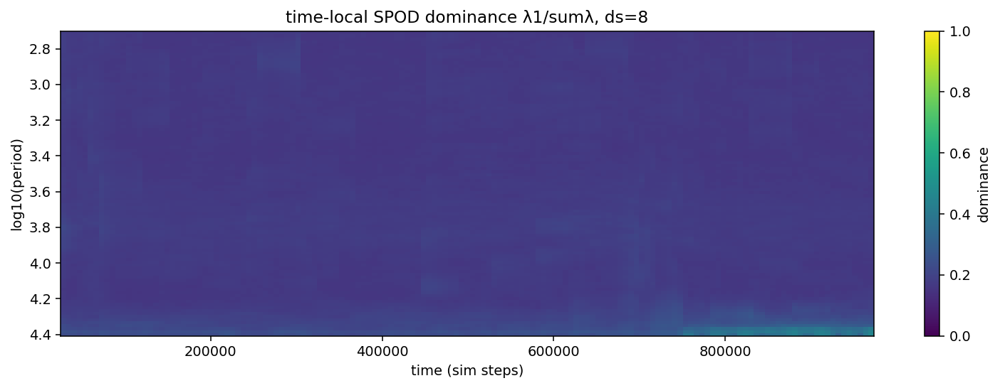

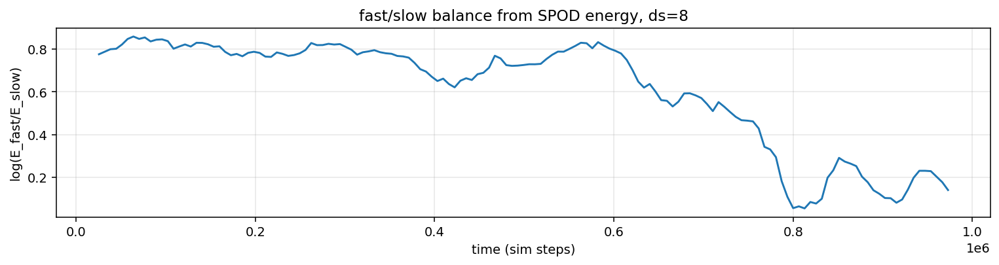

In [12]:
import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.signal.windows import dpss

from flow_drift_metrics import iter_npz_snapshots, resolve_device, make_jperp_fn

# ----------------------------
# CONFIG (set YOUR smoothed checkpoint)
# ----------------------------
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602101525/interp_6"
t1, t2   = 0, 1_000_000
frame_stride = 1                 # logging already every 50 sim-steps

dt_sim = 50.0
period_min, period_max = 500.0, 50_000.0

N  = 1024                        # max period ~ N*dt_sim = 51200
hop = 128                        # sliding step (in frames)
NW = 3.5                         # DPSS time-bandwidth
K  = 7                           # number of tapers

ds_list = (2, 4, 8)              # spatial coarse-grain levels (try 2/4/8 first)

eps = 1e-30
device = "gpu:0" if any(d.platform == "gpu" for d in jax.devices()) else "cpu"
dev = resolve_device(device)
jperp_fn = make_jperp_fn(eps=1e-6)

# ----------------------------
# freq bins for target period band
# ----------------------------
tapers = dpss(N, NW, Kmax=K, sym=False).astype(np.float32)      # (K,N)
taper_norm2 = (tapers * tapers).sum(axis=1).astype(np.float32) + 1e-12

freqs = np.fft.rfftfreq(N, d=dt_sim)
periods = np.where(freqs > 0, 1.0 / freqs, np.inf)
fi_sel = np.where((periods >= period_min) & (periods <= period_max))[0]
fi_sel = fi_sel[fi_sel != 0]
periods_sel = periods[fi_sel]
xlog = np.log10(periods_sel)

print("selected bins:", len(fi_sel), "period range:", float(periods_sel.min()), float(periods_sel.max()))

def avg_pool_vecfield_np(v, ds):
    # v: (H,W,2) float32
    if ds <= 1:
        return v.reshape(-1)
    H, W, C = v.shape
    H2, W2 = H // ds, W // ds
    v = v[:H2*ds, :W2*ds, :]
    v = v.reshape(H2, ds, W2, ds, C).mean(axis=(1,3))
    return v.reshape(-1)

def get_block(buf, ptr):
    if ptr == 0:
        return buf.copy()
    return np.concatenate([buf[ptr:], buf[:ptr]], axis=0)

def eigs_from_tapers(Qf_KD):
    # Qf_KD: (K,D) complex64, rows = taper realizations at fixed freq
    G = (Qf_KD.conj() @ Qf_KD.T) / float(K)        # (K,K) Hermitian
    w = np.linalg.eigvalsh(G)                      # ascending, length K
    w = np.maximum(w, 0.0)
    w = w[::-1]                                    # descending
    s = float(w.sum())
    l1 = float(w[0])
    dom = l1 / (s + eps)
    return l1, s, dom

# ----------------------------
# STREAM + sliding-window multitaper SPOD (using tapers as ensemble)
# ----------------------------
buf_step = None
buf_v = {ds: None for ds in ds_list}
ptr = 0
kept = 0
seen = 0

times = []
E_sum = {ds: [] for ds in ds_list}     # each entry: (F,) per window, sum eigenvals
E_l1  = {ds: [] for ds in ds_list}     # (F,) per window, leading eigenval
Dom   = {ds: [] for ds in ds_list}     # (F,) per window, dominance

for t, s in tqdm(iter_npz_snapshots(save_pth, t1, t2, fields=("A","F")), desc="mt-spod"):
    if (seen % frame_stride) != 0:
        seen += 1
        continue
    seen += 1

    with jax.default_device(dev):
        A = jnp.asarray(s["A"], dtype=jnp.float32)
        F = jnp.asarray(s["F"], dtype=jnp.float32)
        _, _, Jp, _, _ = jperp_fn(A, F)            # (H,W,2)

    Jp_np = np.asarray(jax.device_get(Jp), dtype=np.float32)

    if buf_step is None:
        buf_step = np.zeros((N,), dtype=np.int64)
        for ds in ds_list:
            v0 = avg_pool_vecfield_np(Jp_np, ds)
            buf_v[ds] = np.zeros((N, v0.shape[0]), dtype=np.float32)

    buf_step[ptr] = int(t)
    for ds in ds_list:
        buf_v[ds][ptr] = avg_pool_vecfield_np(Jp_np, ds)

    ptr = (ptr + 1) % N
    kept += 1
    if kept < N:
        continue
    if ((kept - N) % hop) != 0:
        continue

    steps_blk = get_block(buf_step, ptr)
    t_center = int(steps_blk[N // 2])
    times.append(t_center)

    for ds in ds_list:
        block = get_block(buf_v[ds], ptr).astype(np.float32)     # (N,D)
        Ddim = block.shape[1]
        block = block - block.mean(axis=0, keepdims=True)

        # Q: (K, F, D) where F=len(fi_sel)
        Q = np.empty((K, len(fi_sel), Ddim), dtype=np.complex64)
        for k in range(K):
            Xt = block * tapers[k][:, None]
            Fk = np.fft.rfft(Xt, axis=0).astype(np.complex64)    # (Nf,D)
            Q[k] = Fk[fi_sel, :]

        l1 = np.empty((len(fi_sel),), dtype=np.float32)
        s  = np.empty((len(fi_sel),), dtype=np.float32)
        d1 = np.empty((len(fi_sel),), dtype=np.float32)
        for j in range(len(fi_sel)):
            lam1, lamsum, dom = eigs_from_tapers(Q[:, j, :])
            l1[j] = lam1 / float(Ddim)                           # normalize by D for comparability
            s[j]  = lamsum / float(Ddim)
            d1[j] = dom

        E_l1[ds].append(l1)
        E_sum[ds].append(s)
        Dom[ds].append(d1)

times = np.asarray(times, dtype=np.int64)
for ds in ds_list:
    E_l1[ds] = np.asarray(E_l1[ds], dtype=np.float32)            # (Tw,F)
    E_sum[ds] = np.asarray(E_sum[ds], dtype=np.float32)          # (Tw,F)
    Dom[ds] = np.asarray(Dom[ds], dtype=np.float32)              # (Tw,F)

print("windows:", len(times))

# ----------------------------
# SAVE (so you never recompute)
# ----------------------------
out_path = "mt_spod_smoothed.npz"
np.savez_compressed(
    out_path,
    times=times,
    periods_sel=periods_sel.astype(np.float64),
    ds_list=np.asarray(ds_list, dtype=np.int32),
    **{f"E_sum_ds{ds}": E_sum[ds] for ds in ds_list},
    **{f"E_l1_ds{ds}":  E_l1[ds]  for ds in ds_list},
    **{f"Dom_ds{ds}":   Dom[ds]   for ds in ds_list},
)
print("saved:", out_path)

# ----------------------------
# PLOT (two interpretable views per ds)
# ----------------------------
for ds in ds_list:
    # energy heatmap: log10 E_sum
    plt.figure(figsize=(11, 4), dpi=140)
    plt.imshow(
        np.log10(E_sum[ds].T + eps),
        aspect="auto", origin="lower",
        extent=[float(times[0]), float(times[-1]), float(xlog[0]), float(xlog[-1])]
    )
    plt.xlabel("time (sim steps)")
    plt.ylabel("log10(period)")
    plt.title(f"time-local multitaper SPOD energy log10(sum λ / D), ds={ds}")
    plt.colorbar(label="log10 energy")
    plt.tight_layout()
    plt.show()

    # dominance heatmap: λ1 / sum λ
    plt.figure(figsize=(11, 4), dpi=140)
    plt.imshow(
        Dom[ds].T,
        aspect="auto", origin="lower",
        extent=[float(times[0]), float(times[-1]), float(xlog[0]), float(xlog[-1])],
        vmin=0.0, vmax=1.0
    )
    plt.xlabel("time (sim steps)")
    plt.ylabel("log10(period)")
    plt.title(f"time-local SPOD dominance λ1/sumλ, ds={ds}")
    plt.colorbar(label="dominance")
    plt.tight_layout()
    plt.show()

    # one scalar per time: fast vs slow energy ratio (your band, robust & readable)
    p = periods_sel
    fast = (p >= 500.0) & (p <= 5_000.0)
    slow = (p >= 5_000.0) & (p <= 50_000.0)
    R = np.log((E_sum[ds][:, fast].sum(axis=1) + eps) / (E_sum[ds][:, slow].sum(axis=1) + eps))
    plt.figure(figsize=(11, 3), dpi=140)
    plt.plot(times, R)
    plt.xlabel("time (sim steps)")
    plt.ylabel("log(E_fast/E_slow)")
    plt.title(f"fast/slow balance from SPOD energy, ds={ds}")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

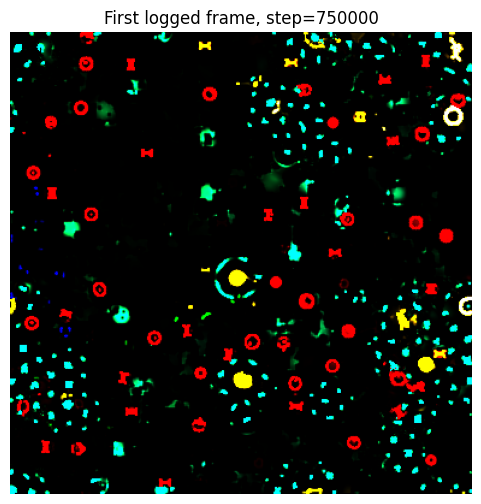

In [10]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

dump_dir = "experiments/flow_lenia_apf_rollouts/checkpoints/2602112129/interp_6"  # путь к save_apf дампу

pat = re.compile(r"P_steps_(\d+)_(\d+)__secs_[0-9.]+_[0-9.]+__idx_(\d+)\.npz$")
chunks = []
for fn in os.listdir(dump_dir):
    m = pat.match(fn)
    if m:
        chunks.append((int(m.group(1)), int(m.group(3)), os.path.join(dump_dir, fn)))
chunks.sort(key=lambda x: (x[0], x[1]))

index = 100

if not chunks:
    raise FileNotFoundError(f"No P_steps_*.npz in {dump_dir}")

with np.load('experiments/flow_lenia_apf_rollouts/checkpoints/2602112129/interp_6/P_steps_750000_762450__secs_3000.000_3049.800__idx_0060.npz') as z:
    step0 = int(z["steps"][0])

    if "rgb" in z.files:
        frame = z["rgb"][index]
        if frame.dtype != np.uint8:
            frame = (np.clip(frame, 0, 1) * 255).astype(np.uint8)
    else:
        p = z["P"][index].astype(np.float32)
        reps = int(np.ceil(3 / p.shape[-1]))
        p3 = np.tile(p, (1, 1, reps))[..., :3]

        if "A" in z.files:
            a_sum = z["A"][index].astype(np.float32).sum(axis=-1, keepdims=True)
            frame = (np.clip(a_sum * p3, 0, 1) * 255).astype(np.uint8)
        else:
            lo, hi = float(p3.min()), float(p3.max())
            frame = (np.clip((p3 - lo) / (hi - lo + 1e-8), 0, 1) * 255).astype(np.uint8)

plt.figure(figsize=(6, 6))
plt.imshow(frame)
plt.title(f"First logged frame, step={step0}")
plt.axis("off")
plt.show()


In [15]:
import numpy as np
import matplotlib.pyplot as plt

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state

# -----------------------------
# IO: iter over lagrangian_xy
# -----------------------------
def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)

    if fmt == "npz":
        # предполагаем, что снапшоты содержат ключ 'lagrangian_xy'
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = None
            if isinstance(st, dict):
                xy = st.get("lagrangian_xy", None)
            else:
                xy = getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy is missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")

# -----------------------------
# geometry helpers
# -----------------------------
def unwrap_periodic(X, L):
    """
    X: (T,N,2) positions in [0,L)
    returns unwrapped (T,N,2) with minimal displacement per step.
    """
    X = np.asarray(X, dtype=np.float32)
    dX = np.diff(X, axis=0)
    dX = (dX + 0.5 * L) % L - 0.5 * L
    X0 = X[0:1]
    return np.concatenate([X0, X0 + np.cumsum(dX, axis=0)], axis=0)

# -----------------------------
# main: quantile speed spectrum
# -----------------------------
def quantile_speed_spectrum(
    X, t_logged,
    lag_min=5, lag_max=800,
    q_grid=None,
    max_samples_per_tau=20_000,
    periodic_L=None,
    rng_seed=0,
):
    """
    X: (T,N,2) positions at times t_logged (int64)
    t_logged: (T,) monotonically increasing simulation steps
    lag_min/lag_max: target physical lags in simulation steps
    Returns:
      tau_idx: index-lags (in frames) used
      tau_phys: representative physical lag (median of t_logged differences) per tau_idx
      q_grid: (Q,)
      Qqt: (Q,K) quantiles of v over random (t,i) samples for each tau_idx
      beta: (Q,K-1) local slope d log Q / d log tau_phys between consecutive taus
      tau_phys_mid: (K-1,) midpoints for beta plotting
    """
    X = np.asarray(X, dtype=np.float32)
    t_logged = np.asarray(t_logged, dtype=np.int64)
    T, N, D = X.shape
    assert D == 2

    if q_grid is None:
        q_grid = np.linspace(0.01, 0.99, 99, dtype=np.float32)
    else:
        q_grid = np.asarray(q_grid, dtype=np.float32)

    if periodic_L is not None:
        Xu = unwrap_periodic(X, float(periodic_L))
    else:
        Xu = X

    # переводим физические лаги (в шагах симуляции) в лаги по индексам кадров.
    # используем типичный шаг логирования.
    if T < 2:
        raise ValueError("Need at least 2 frames.")
    dt_steps = np.diff(t_logged)
    step = int(np.median(dt_steps))
    if step <= 0:
        step = 1

    tau_idx_min = int(np.ceil(lag_min / step))
    tau_idx_max = int(np.floor(lag_max / step))
    tau_idx_max = min(tau_idx_max, T - 1)

    tau_idx = np.arange(tau_idx_min, tau_idx_max + 1, dtype=int)
    K = tau_idx.size

    tau_phys = np.empty(K, dtype=np.float64)
    Qqt = np.empty((q_grid.size, K), dtype=np.float64)

    rng = np.random.default_rng(rng_seed)

    for k, tau in enumerate(tau_idx):
        # физический лаг для каждой пары t -> t+tau (может быть неидеально константным)
        dtau = (t_logged[tau:] - t_logged[:-tau]).astype(np.float64)  # (T-tau,)
        tau_phys[k] = np.median(dtau)

        M = (T - tau) * N
        m = int(min(max_samples_per_tau, M))

        # выбираем m случайных наблюдений из прямоугольника (T-tau) x N без построения 3D тензоров
        lin = rng.integers(0, M, size=m, endpoint=False)
        tt = (lin // N).astype(np.int64)
        ii = (lin % N).astype(np.int64)

        x0 = Xu[tt, ii, :]          # (m,2)
        x1 = Xu[tt + tau, ii, :]    # (m,2)
        dx = x1 - x0
        dist = np.sqrt((dx * dx).sum(axis=1))  # (m,)

        denom = dtau[tt]            # (m,)
        v = dist / denom            # средняя скорость на интервале dtau

        # квантили по v
        try:
            Qqt[:, k] = np.quantile(v, q_grid, method="linear")
        except TypeError:
            Qqt[:, k] = np.quantile(v, q_grid, interpolation="linear")

    # локальный наклон по log(tau_phys) между соседними tau_idx
    eps = 1e-12
    logQ = np.log(np.maximum(Qqt, eps))
    logTau = np.log(np.maximum(tau_phys, eps))

    beta = (logQ[:, 1:] - logQ[:, :-1]) / (logTau[1:] - logTau[:-1])[None, :]
    tau_phys_mid = np.sqrt(tau_phys[1:] * tau_phys[:-1])  # геом. середина для оси beta

    return tau_idx, tau_phys, q_grid, Qqt, beta, tau_phys_mid

# -----------------------------
# plotting
# -----------------------------
def plot_logQ_heatmap(tau_phys, q_grid, Qqt, out_png):
    Z = np.log10(np.maximum(Qqt, 1e-12))
    plt.figure(figsize=(10, 4.6))
    plt.imshow(
        Z,
        origin="lower",
        aspect="auto",
        extent=[tau_phys[0], tau_phys[-1], float(q_grid[0]), float(q_grid[-1])],
    )
    plt.xlabel("physical lag tau (simulation steps)")
    plt.ylabel("quantile q")
    plt.title("log10 Q(q; tau) for v(t,i;tau)=||dx||/dtau")
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()

def plot_beta_heatmap(tau_phys_mid, q_grid, beta, out_png):
    plt.figure(figsize=(10, 4.6))
    plt.imshow(
        beta,
        origin="lower",
        aspect="auto",
        extent=[tau_phys_mid[0], tau_phys_mid[-1], float(q_grid[0]), float(q_grid[-1])],
    )
    plt.xlabel("physical lag tau (midpoints)")
    plt.ylabel("quantile q")
    plt.title("beta(q; tau) = d log Q / d log tau (local slope)")
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()

# -----------------------------
# runner
# -----------------------------
if __name__ == "__main__":
    save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602112129/interp_6"  # твоя переменная
    t1, t2 = 150000, 200000
    log_format = "auto"

    lag_min, lag_max = 100, 2000
    max_samples_per_tau = 20_000
    periodic_L = None  # если xy на торе [0,L), поставь L (например 256). если уже unwrapped — None.

    t_list = []
    xy_list = []

    for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
        t_list.append(t)
        xy_list.append(np.asarray(xy, dtype=np.float32))  # (N,2)

    t_logged = np.asarray(t_list, dtype=np.int64)
    X = np.stack(xy_list, axis=0)  # (T_logged,N,2)

    tau_idx, tau_phys, q_grid, Qqt, beta, tau_phys_mid = quantile_speed_spectrum(
        X, t_logged,
        lag_min=lag_min, lag_max=lag_max,
        q_grid=np.linspace(0.01, 0.99, 99),
        max_samples_per_tau=max_samples_per_tau,
        periodic_L=periodic_L,
        rng_seed=0,
    )

    np.savez(
        "lagrangian_quantile_spectrum.npz",
        t_logged=t_logged,
        tau_idx=tau_idx,
        tau_phys=tau_phys,
        q_grid=q_grid,
        Qqt=Qqt,
        beta=beta,
        tau_phys_mid=tau_phys_mid,
    )

    plot_logQ_heatmap(tau_phys, q_grid, Qqt, "lagrangian_logQ.png")
    plot_beta_heatmap(tau_phys_mid, q_grid, beta, "lagrangian_beta.png")

    print("saved: lagrangian_quantile_spectrum.npz, lagrangian_logQ.png, lagrangian_beta.png")

saved: lagrangian_quantile_spectrum.npz, lagrangian_logQ.png, lagrangian_beta.png


In [16]:
import numpy as np
import matplotlib.pyplot as plt

npz_path = "lagrangian_quantile_spectrum.npz"  # твой файл
out_prefix = "beta_dyadic"

z = np.load(npz_path)
q = z["q_grid"].astype(np.float64)          # (Q,)
Qqt = z["Qqt"].astype(np.float64)           # (Q, K)
tau_phys = z["tau_phys"].astype(np.float64) # (K,)

# желательно, чтобы ты сохранял tau_idx (индекс-лаги по кадрам логирования).
# если нет — используем индексы 1..K (хуже, но работает).
if "tau_idx" in z:
    tau_idx = z["tau_idx"].astype(np.int64)
else:
    tau_idx = np.arange(1, Qqt.shape[1] + 1, dtype=np.int64)

eps = 1e-12
logQ = np.log(np.maximum(Qqt, eps))
logTau = np.log(np.maximum(tau_phys, eps))

# пары (tau, 2*tau) в индекс-лаговом смысле
idx_map = {int(t): i for i, t in enumerate(tau_idx)}
pairs = [(idx_map[int(t)], idx_map[int(2*t)]) for t in tau_idx if int(2*t) in idx_map]
i1 = np.array([a for a, b in pairs], dtype=np.int64)
i2 = np.array([b for a, b in pairs], dtype=np.int64)

beta = (logQ[:, i2] - logQ[:, i1]) / (logTau[i2] - logTau[i1])[None, :]
tau_mid = np.sqrt(tau_phys[i1] * tau_phys[i2])

# heatmap beta(q, tau_mid)
vmin, vmax = np.nanpercentile(beta, [2, 98])  # только для читаемой шкалы
plt.figure(figsize=(10, 4.6))
plt.imshow(
    beta,
    origin="lower",
    aspect="auto",
    extent=[tau_mid[0], tau_mid[-1], float(q[0]), float(q[-1])],
    vmin=vmin, vmax=vmax
)
plt.xlabel("physical lag tau (dyadic midpoints)")
plt.ylabel("quantile q")
plt.title("dyadic beta(q; tau) = (log Q(2tau)-log Q(tau)) / (log(2tau)-log(tau))")
plt.colorbar()
plt.tight_layout()
plt.savefig(out_prefix + "_heatmap.png", dpi=200)
plt.close()

# 1D beta(q): медиана по tau + IQR по tau
beta_med = np.median(beta, axis=1)
beta_lo = np.quantile(beta, 0.25, axis=1)
beta_hi = np.quantile(beta, 0.75, axis=1)

plt.figure(figsize=(6.8, 4.2))
plt.plot(q, beta_med)
plt.fill_between(q, beta_lo, beta_hi, alpha=0.25)
plt.xlabel("quantile q")
plt.ylabel("beta")
plt.title("beta(q): median over tau, band = IQR over tau")
plt.tight_layout()
plt.savefig(out_prefix + "_beta_of_q.png", dpi=200)
plt.close()

np.savez(out_prefix + "_results.npz", q=q, tau_mid=tau_mid, beta=beta, beta_med=beta_med, beta_lo=beta_lo, beta_hi=beta_hi)
print("saved:", out_prefix + "_heatmap.png,", out_prefix + "_beta_of_q.png,", out_prefix + "_results.npz")

saved: beta_dyadic_heatmap.png, beta_dyadic_beta_of_q.png, beta_dyadic_results.npz


In [21]:
import os
import math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state


# ---------- IO ----------
def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)

    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = st.get("lagrangian_xy", None) if isinstance(st, dict) else getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy is missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")


# ---------- core stats ----------
def compute_Qqt_window(X, t_logged, tau_min_idx, tau_max_idx, q_grid, max_samples_per_tau=20000, seed=0):
    """
    X: (Tw, N, 2) float32
    t_logged: (Tw,) int64, physical sim steps for each frame
    tau_min_idx/tau_max_idx: tau in "frames" (log cadence units), not physical
    Qqt[q,k] = quantile_q of v = ||x(t+tau)-x(t)|| / (t_logged[t+tau]-t_logged[t])
    """
    X = np.asarray(X, np.float32)
    t_logged = np.asarray(t_logged, np.int64)
    Tw, N, _ = X.shape

    tau_max_idx = min(int(tau_max_idx), Tw - 1)
    tau_min_idx = max(int(tau_min_idx), 1)
    tau_idx = np.arange(tau_min_idx, tau_max_idx + 1, dtype=np.int64)

    Q = q_grid.size
    K = tau_idx.size
    Qqt = np.empty((Q, K), np.float64)
    tau_phys = np.empty(K, np.float64)

    rng = np.random.default_rng(seed)

    for k, tau in enumerate(tau_idx):
        dtau_all = (t_logged[tau:] - t_logged[:-tau]).astype(np.float64)  # (Tw-tau,)
        tau_phys[k] = np.median(dtau_all)

        M = (Tw - tau) * N
        m = int(min(max_samples_per_tau, M))
        lin = rng.integers(0, M, size=m, endpoint=False)
        tt = (lin // N).astype(np.int64)
        ii = (lin % N).astype(np.int64)

        dx = X[tt + tau, ii] - X[tt, ii]
        dist = np.sqrt((dx * dx).sum(axis=1))
        v = dist / dtau_all[tt]

        Qqt[:, k] = np.quantile(v, q_grid, method="linear")

    return tau_idx, tau_phys, Qqt


def dyadic_beta_from_Qqt(tau_idx, tau_phys, Qqt):
    """
    dyadic pairs by tau_idx: (tau, 2*tau) must exist.
    beta(q,tau) = (log Q(2tau)-log Q(tau)) / (log tau_phys(2tau)-log tau_phys(tau))
    """
    eps = 1e-12
    logQ = np.log(np.maximum(Qqt, eps))
    logT = np.log(np.maximum(tau_phys, eps))

    idx_map = {int(t): i for i, t in enumerate(tau_idx)}
    pairs = [(idx_map[t], idx_map[2 * t], t) for t in tau_idx if int(2 * t) in idx_map]
    i1 = np.array([a for a, b, t in pairs], np.int64)
    i2 = np.array([b for a, b, t in pairs], np.int64)

    beta = (logQ[:, i2] - logQ[:, i1]) / (logT[i2] - logT[i1])[None, :]
    tau_mid = np.sqrt(tau_phys[i1] * tau_phys[i2])
    tau_base = np.array([t for a, b, t in pairs], np.int64)  # tau in frame units for reference
    return tau_mid, tau_base, beta


# ---------- plotting ----------
def save_window_panel(out_png, q_grid, tau_mid, beta, title):
    """
    One PNG per window:
    top: beta(q) median over tau_mid, IQR band
    bottom: heatmap beta(q,tau_mid)
    Implemented as two separate images stacked (no matplotlib subplots).
    """
    beta_med = np.median(beta, axis=1)
    beta_lo = np.quantile(beta, 0.25, axis=1)
    beta_hi = np.quantile(beta, 0.75, axis=1)

    tmp1 = out_png.replace(".png", "_tmp_curve.png")
    tmp2 = out_png.replace(".png", "_tmp_heat.png")

    plt.figure(figsize=(6.8, 3.6))
    plt.plot(q_grid, beta_med)
    plt.fill_between(q_grid, beta_lo, beta_hi, alpha=0.25)
    plt.xlabel("quantile q")
    plt.ylabel("beta")
    plt.title(title + "  |  beta(q): median over tau, band=IQR")
    plt.tight_layout()
    plt.savefig(tmp1, dpi=170)
    plt.close()

    vmin, vmax = np.nanpercentile(beta, [2, 98])
    plt.figure(figsize=(6.8, 3.6))
    plt.imshow(
        beta,
        origin="lower",
        aspect="auto",
        extent=[tau_mid[0], tau_mid[-1], float(q_grid[0]), float(q_grid[-1])],
        vmin=vmin, vmax=vmax,
    )
    plt.xlabel("physical lag tau (dyadic midpoints, log scale)")
    plt.ylabel("quantile q")
    plt.title(title + "  |  dyadic beta(q; tau)")
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(tmp2, dpi=170)
    plt.close()

    im1 = Image.open(tmp1).convert("RGB")
    im2 = Image.open(tmp2).convert("RGB")
    W = max(im1.size[0], im2.size[0])
    H = im1.size[1] + im2.size[1]

    canvas = Image.new("RGB", (W, H), (255, 255, 255))
    canvas.paste(im1, (0, 0))
    canvas.paste(im2, (0, im1.size[1]))
    canvas.save(out_png)

    os.remove(tmp1)
    os.remove(tmp2)


# ---------- collage ----------
def make_collage(panel_paths, out_png, cols=3, rows=2, pad=8, bg=(255, 255, 255)):
    ims = [Image.open(p).convert("RGB") for p in panel_paths]
    w, h = ims[0].size
    W = cols * w + (cols + 1) * pad
    H = rows * h + (rows + 1) * pad
    canvas = Image.new("RGB", (W, H), bg)

    for idx, im in enumerate(ims):
        r = idx // cols
        c = idx % cols
        x = pad + c * (w + pad)
        y = pad + r * (h + pad)
        canvas.paste(im, (x, y))

    canvas.save(out_png)


# ---------- main ----------
if __name__ == "__main__":
    save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602112129/interp_6"              # твоя переменная
    log_format = "auto"

    # общий диапазон чтения (можешь ограничить)
    t1, t2 = 0, 1_000_000

    # окно по физическим шагам симуляции
    window_size = 50_000
    window_step = 50_000             # сделай меньше для перекрывающихся окон

    # tau в "кадрах логирования" (НЕ в физических шагах)
    tau_min_idx = 2
    tau_max_idx = 40

    q_grid = np.linspace(0.05, 0.95, 91).astype(np.float64)
    max_samples_per_tau = 20_000

    out_dir = "metrics/lagrangian_windows"
    os.makedirs(out_dir, exist_ok=True)

    # собираем все кадры один раз (проще и надёжнее)
    t_all = []
    x_all = []
    for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
        t_all.append(t)
        x_all.append(np.asarray(xy, np.float32))
    t_all = np.asarray(t_all, np.int64)
    X_all = np.stack(x_all, axis=0)  # (T, N, 2)

    # окна по физическому времени
    t_min = int(t_all[0])
    t_max = int(t_all[-1])
    w_starts = np.arange(t_min, t_max - window_size + 1, window_step, dtype=np.int64)

    panel_paths = []
    for wi, ws in enumerate(w_starts):
        we = int(ws + window_size)
        mask = (t_all >= ws) & (t_all < we)
        idx = np.nonzero(mask)[0]
        if idx.size < 2 * tau_max_idx + 2:
            continue

        tw = t_all[idx]
        Xw = X_all[idx]

        tau_idx, tau_phys, Qqt = compute_Qqt_window(
            Xw, tw,
            tau_min_idx=tau_min_idx, tau_max_idx=tau_max_idx,
            q_grid=q_grid,
            max_samples_per_tau=max_samples_per_tau,
            seed=wi,
        )
        tau_mid, tau_base, beta = dyadic_beta_from_Qqt(tau_idx, tau_phys, Qqt)

        title = f"t in [{ws}, {we})  |  frames={idx.size}  |  tau_idx in [{tau_idx[0]}, {tau_idx[-1]}]"
        out_png = os.path.join(out_dir, f"panel_w{wi:03d}_{ws}_{we}.png")
        save_window_panel(out_png, q_grid, tau_mid, beta, title)
        panel_paths.append(out_png)

    # группируем панели в страницы
    cols, rows = 3, 2
    per_page = cols * rows
    pages = int(math.ceil(len(panel_paths) / per_page))

    for p in range(pages):
        chunk = panel_paths[p * per_page:(p + 1) * per_page]
        if not chunk:
            break
        out_png = os.path.join(out_dir, f"collage_page_{p:02d}.png")
        make_collage(chunk, out_png, cols=cols, rows=rows)

    print(f"Saved {len(panel_paths)} panels and {pages} collages into {out_dir}")

Saved 19 panels and 4 collages into metrics/lagrangian_windows


In [1]:
import os, math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state


# ---------------- IO ----------------
def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)
    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = st.get("lagrangian_xy", None) if isinstance(st, dict) else getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")


# ---------------- stats core ----------------
def compute_Qqt_window(X, t_logged, tau_min_idx, tau_max_idx, q_grid, max_samples_per_tau=20000, seed=0):
    X = np.asarray(X, np.float32)
    t_logged = np.asarray(t_logged, np.int64)
    Tw, N, _ = X.shape

    tau_max_idx = min(int(tau_max_idx), Tw - 1)
    tau_min_idx = max(int(tau_min_idx), 1)
    tau_idx = np.arange(tau_min_idx, tau_max_idx + 1, dtype=np.int64)

    Qqt = np.empty((q_grid.size, tau_idx.size), np.float64)
    tau_phys = np.empty(tau_idx.size, np.float64)

    rng = np.random.default_rng(seed)

    for k, tau in enumerate(tau_idx):
        dtau_all = (t_logged[tau:] - t_logged[:-tau]).astype(np.float64)  # (Tw-tau,)
        tau_phys[k] = np.median(dtau_all)

        M = (Tw - tau) * N
        m = int(min(max_samples_per_tau, M))
        lin = rng.integers(0, M, size=m, endpoint=False)
        tt = (lin // N).astype(np.int64)
        ii = (lin % N).astype(np.int64)

        dx = X[tt + tau, ii] - X[tt, ii]
        dist = np.sqrt((dx * dx).sum(axis=1))
        v = dist / dtau_all[tt]

        Qqt[:, k] = np.quantile(v, q_grid, method="linear")

    return tau_idx, tau_phys, Qqt


def dyadic_beta_from_Qqt(tau_idx, tau_phys, Qqt):
    eps = 1e-12
    logQ = np.log(np.maximum(Qqt, eps))
    logT = np.log(np.maximum(tau_phys, eps))

    idx_map = {int(t): i for i, t in enumerate(tau_idx)}
    pairs = [(idx_map[t], idx_map[2 * t]) for t in tau_idx if int(2 * t) in idx_map]
    i1 = np.array([a for a, b in pairs], np.int64)
    i2 = np.array([b for a, b in pairs], np.int64)

    beta = (logQ[:, i2] - logQ[:, i1]) / (logT[i2] - logT[i1])[None, :]
    tau_mid = np.sqrt(tau_phys[i1] * tau_phys[i2])
    return tau_mid, beta


# ---------------- surrogate A: increment shuffle ----------------
def make_increment_shuffle_surrogate(Xw, seed=0, remove_mean_drift=False):
    """
    Xw: (Tw,N,2)
    Surrogate preserves one-step increment distribution but destroys time ordering.
    If remove_mean_drift=True: subtract global mean increment before shuffle.
    """
    Xw = np.asarray(Xw, np.float32)
    Tw, N, _ = Xw.shape
    rng = np.random.default_rng(seed)

    dX = Xw[1:] - Xw[:-1]  # (Tw-1,N,2)

    if remove_mean_drift:
        mu = dX.reshape(-1, 2).mean(axis=0, keepdims=True).astype(np.float32)
        dX0 = dX - mu
    else:
        mu = None
        dX0 = dX

    perm = rng.permutation(dX0.shape[0])  # one permutation for all particles (fast, decent null)
    dXs = dX0[perm]

    if mu is not None:
        dXs = dXs + mu

    Xs = np.empty_like(Xw)
    Xs[0] = Xw[0]
    Xs[1:] = Xs[0:1] + np.cumsum(dXs, axis=0)
    return Xs


# ---------------- plotting helpers ----------------
def _save_tmp(fig_path, fig_fn):
    fig_fn()
    plt.savefig(fig_path, dpi=170)
    plt.close()

def save_panel_real_vs_surr(out_png, q_grid, tau_mid, beta_real, beta_surr, title):
    # curves
    def plot_curves():
        brm = np.median(beta_real, axis=1)
        brl = np.quantile(beta_real, 0.25, axis=1)
        brh = np.quantile(beta_real, 0.75, axis=1)

        bsm = np.median(beta_surr, axis=1)
        bsl = np.quantile(beta_surr, 0.25, axis=1)
        bsh = np.quantile(beta_surr, 0.75, axis=1)

        plt.figure(figsize=(7.2, 3.6))
        plt.plot(q_grid, brm, label="real")
        plt.fill_between(q_grid, brl, brh, alpha=0.20)
        plt.plot(q_grid, bsm, label="surrogate")
        plt.fill_between(q_grid, bsl, bsh, alpha=0.20)
        plt.xlabel("quantile q")
        plt.ylabel("beta")
        plt.title(title + " | beta(q): median over tau, band=IQR")
        plt.legend()

    # heatmaps
    vmin = np.nanpercentile(np.concatenate([beta_real.ravel(), beta_surr.ravel()]), 2)
    vmax = np.nanpercentile(np.concatenate([beta_real.ravel(), beta_surr.ravel()]), 98)

    def plot_heat_real():
        plt.figure(figsize=(7.2, 3.6))
        plt.imshow(beta_real, origin="lower", aspect="auto",
                   extent=[tau_mid[0], tau_mid[-1], float(q_grid[0]), float(q_grid[-1])],
                   vmin=vmin, vmax=vmax)
        plt.xscale("log")
        plt.xlabel("physical lag tau (dyadic midpoints)")
        plt.ylabel("quantile q")
        plt.title("real: dyadic beta(q; tau)")
        plt.colorbar()

    def plot_heat_surr():
        plt.figure(figsize=(7.2, 3.6))
        plt.imshow(beta_surr, origin="lower", aspect="auto",
                   extent=[tau_mid[0], tau_mid[-1], float(q_grid[0]), float(q_grid[-1])],
                   vmin=vmin, vmax=vmax)
        plt.xscale("log")
        plt.xlabel("physical lag tau (dyadic midpoints)")
        plt.ylabel("quantile q")
        plt.title("surrogate: dyadic beta(q; tau)")
        plt.colorbar()

    tmp1 = out_png.replace(".png", "_tmp1.png")
    tmp2 = out_png.replace(".png", "_tmp2.png")
    tmp3 = out_png.replace(".png", "_tmp3.png")

    _save_tmp(tmp1, plot_curves)
    _save_tmp(tmp2, plot_heat_real)
    _save_tmp(tmp3, plot_heat_surr)

    im1 = Image.open(tmp1).convert("RGB")
    im2 = Image.open(tmp2).convert("RGB")
    im3 = Image.open(tmp3).convert("RGB")

    W = max(im1.size[0], im2.size[0], im3.size[0])
    H = im1.size[1] + im2.size[1] + im3.size[1]

    canvas = Image.new("RGB", (W, H), (255, 255, 255))
    canvas.paste(im1, (0, 0))
    canvas.paste(im2, (0, im1.size[1]))
    canvas.paste(im3, (0, im1.size[1] + im2.size[1]))
    canvas.save(out_png)

    os.remove(tmp1); os.remove(tmp2); os.remove(tmp3)


def make_collage(panel_paths, out_png, cols=3, rows=2, pad=8):
    ims = [Image.open(p).convert("RGB") for p in panel_paths]
    w, h = ims[0].size
    W = cols * w + (cols + 1) * pad
    H = rows * h + (rows + 1) * pad
    canvas = Image.new("RGB", (W, H), (255, 255, 255))
    for idx, im in enumerate(ims):
        r = idx // cols
        c = idx % cols
        x = pad + c * (w + pad)
        y = pad + r * (h + pad)
        canvas.paste(im, (x, y))
    canvas.save(out_png)


# ---------------- main (non-overlapping windows) ----------------
if __name__ == "__main__":
    save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602112129/interp_6"
    log_format = "auto"
    t1, t2 = 0, 1_000_000

    window_size = 50_000      # physical steps
    window_step = 50_000      # keep = window_size (stream-friendly)

    tau_min_idx = 2
    tau_max_idx = 40          # важно: при frames≈1000 это ок
    q_grid = np.linspace(0.05, 0.95, 91).astype(np.float64)
    max_samples_per_tau = 20_000

    remove_mean_drift = False  # попробуй True, если хочешь убрать чистый дрейф из нуля

    out_dir = "metrics/lagrangian_windows_surrogateA"
    os.makedirs(out_dir, exist_ok=True)

    panels = []
    rng_seed = 0

    # streaming accumulation for each non-overlapping physical window
    ws = None
    tw = []
    Xw = []

    def flush_window(ws, we, tw, Xw, wi):
        tw = np.asarray(tw, np.int64)
        Xw = np.stack(Xw, axis=0).astype(np.float32)

        # real
        tau_idx, tau_phys, Qqt = compute_Qqt_window(
            Xw, tw, tau_min_idx, tau_max_idx, q_grid, max_samples_per_tau=max_samples_per_tau, seed=wi
        )
        tau_mid, beta_real = dyadic_beta_from_Qqt(tau_idx, tau_phys, Qqt)

        # surrogate
        Xs = make_increment_shuffle_surrogate(Xw, seed=10_000 + wi, remove_mean_drift=remove_mean_drift)
        tau_idx_s, tau_phys_s, Qqt_s = compute_Qqt_window(
            Xs, tw, tau_min_idx, tau_max_idx, q_grid, max_samples_per_tau=max_samples_per_tau, seed=20_000 + wi
        )
        tau_mid_s, beta_surr = dyadic_beta_from_Qqt(tau_idx_s, tau_phys_s, Qqt_s)

        # align tau_mid (should match; if not, take intersection)
        if tau_mid_s.shape != tau_mid.shape or np.max(np.abs(np.log(tau_mid_s) - np.log(tau_mid))) > 1e-9:
            # minimal intersection by rounding
            a = np.round(tau_mid, 6)
            b = np.round(tau_mid_s, 6)
            keep_a = np.isin(a, b)
            keep_b = np.isin(b, a)
            tau_mid2 = tau_mid[keep_a]
            beta_real2 = beta_real[:, keep_a]
            beta_surr2 = beta_surr[:, keep_b]
        else:
            tau_mid2, beta_real2, beta_surr2 = tau_mid, beta_real, beta_surr

        title = f"t in [{ws},{we}) | frames={tw.size} | tau_idx=[{tau_min_idx},{tau_max_idx}]"
        out_png = os.path.join(out_dir, f"panel_w{wi:03d}_{ws}_{we}.png")
        save_panel_real_vs_surr(out_png, q_grid, tau_mid2, beta_real2, beta_surr2, title)
        return out_png

    wi = 0
    for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
        if ws is None:
            ws = (t // window_step) * window_step
        we = ws + window_size

        if t < ws:
            continue

        if t >= we:
            if len(tw) >= 2 * tau_max_idx + 5:
                panels.append(flush_window(ws, we, tw, Xw, wi))
                wi += 1
            # advance window(s) until t fits
            while t >= we:
                ws += window_step
                we = ws + window_size
            tw = []
            Xw = []

        if ws <= t < we:
            tw.append(t)
            Xw.append(np.asarray(xy, np.float32))

    # tail
    if ws is not None and len(tw) >= 2 * tau_max_idx + 5:
        panels.append(flush_window(ws, ws + window_size, tw, Xw, wi))

    # collages
    cols, rows = 3, 2
    per_page = cols * rows
    pages = int(math.ceil(len(panels) / per_page))
    for p in range(pages):
        chunk = panels[p * per_page:(p + 1) * per_page]
        if not chunk:
            break
        make_collage(chunk, os.path.join(out_dir, f"collage_{p:02d}.png"), cols=cols, rows=rows)

    print(f"Saved {len(panels)} panels into {out_dir} (+ {pages} collages)")

Saved 20 panels into metrics/lagrangian_windows_surrogateA (+ 4 collages)


In [9]:
import numpy as np
import matplotlib.pyplot as plt

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state


def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)

    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = st.get("lagrangian_xy", None) if isinstance(st, dict) else getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")


def unwrap_1d(x, L):
    dx = np.diff(x)
    dx = (dx + 0.5 * L) % L - 0.5 * L
    y = np.empty_like(x, dtype=np.float64)
    y[0] = x[0]
    y[1:] = y[0] + np.cumsum(dx)
    return y


def compute_tamsd_and_ngp(xy, t_logged, lags):
    """
    xy: (T,2) float64, unwrapped
    t_logged: (T,) int64
    lags: (K,) int64 (frame lags)
    Returns:
      tau_phys: (K,) float64, median physical lag in sim steps
      tamsd: (K,) float64, time-averaged MSD
      ngp: (K,) float64, time-averaged non-Gaussian parameter in 2D
    """
    T = xy.shape[0]
    tau_phys = np.empty(lags.size, np.float64)
    tamsd = np.empty(lags.size, np.float64)
    ngp = np.empty(lags.size, np.float64)

    for k, L in enumerate(lags):
        dx = xy[L:] - xy[:-L]                      # (T-L,2)
        r2 = (dx * dx).sum(axis=1)                 # (T-L,)
        m2 = r2.mean()
        m4 = (r2 * r2).mean()
        tau_phys[k] = np.median(t_logged[L:] - t_logged[:-L])
        tamsd[k] = m2
        ngp[k] = m4 / (2.0 * (m2 * m2)) - 1.0      # 2D: Gaussian => 0
    return tau_phys, tamsd, ngp


def plot_trajectories(X, ids, out_png="traj_6.png", Lx=None, Ly=None):
    T = X.shape[0]
    plt.figure(figsize=(7, 7))
    for pid in ids:
        x = X[:, pid, 0].astype(np.float64)
        y = X[:, pid, 1].astype(np.float64)
        if Lx is not None:
            x = unwrap_1d(x, Lx)
        if Ly is not None:
            y = unwrap_1d(y, Ly)

        plt.plot(x, y, lw=0.8, alpha=0.9, label=f"id={pid}")
        plt.scatter([x[0]], [y[0]], s=12)
        plt.scatter([x[-1]], [y[-1]], s=12)

    plt.gca().set_aspect("equal", adjustable="box")
    plt.title(f"{len(ids)} trajectories | T={T} frames")
    plt.legend(fontsize=8, loc="best")
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.close()
    print("saved:", out_png)


def plot_tamsd_ngp(X, t_logged, ids, out_png="traj_6_tamsd_ngp.png", Lx=None, Ly=None,
                   n_lags=200, lag_max=None, min_tail=200):
    """
    n_lags: сколько лагов рисовать (лог-сетка)
    lag_max: максимум лага в кадрах (если None -> (T-min_tail))
    min_tail: требуем минимум точек (T-lag) >= min_tail
    """
    T = X.shape[0]
    if lag_max is None:
        lag_max = max(2, T - min_tail)
    lag_max = int(min(lag_max, T - 2))

    # лог-сетка лагов в кадрах
    lags = np.unique(np.clip(np.rint(np.logspace(np.log10(1), np.log10(lag_max), n_lags)), 1, lag_max).astype(int))
    lags = lags[(T - lags) >= min_tail]
    if lags.size < 3:
        raise ValueError("Too few valid lags; increase window or decrease min_tail.")

    plt.figure(figsize=(8.0, 7.2))

    ax1 = plt.subplot(2, 1, 1)
    ax2 = plt.subplot(2, 1, 2)

    for pid in ids:
        x = X[:, pid, 0].astype(np.float64)
        y = X[:, pid, 1].astype(np.float64)
        if Lx is not None:
            x = unwrap_1d(x, Lx)
        if Ly is not None:
            y = unwrap_1d(y, Ly)
        xy = np.stack([x, y], axis=1)

        tau_phys, tamsd, ngp = compute_tamsd_and_ngp(xy, t_logged, lags)

        ax1.plot(tau_phys, tamsd, lw=1.1, label=f"id={pid}")
        ax2.plot(tau_phys, ngp, lw=1.1, label=f"id={pid}")

    # ax1.set_xscale("log"); ax1.set_yscale("log")
    ax1.set_xlabel("lag τ (simulation steps)")
    ax1.set_ylabel("TAMSD(τ) = mean_t ||x(t+τ)-x(t)||^2")
    ax1.grid(True, which="both", alpha=0.2)
    ax1.legend(fontsize=8, ncol=2)

    ax2.set_xscale("log")
    ax2.set_xlabel("lag τ (simulation steps)")
    ax2.set_ylabel("NGP(τ) = <r^4>/(2<r^2>^2) - 1   (time-avg, per traj)")
    ax2.axhline(0.0, color="k", lw=0.8, alpha=0.3)
    ax2.grid(True, which="both", alpha=0.2)

    plt.suptitle("TAMSD and NGP for the same trajectories")
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.close()
    print("saved:", out_png)


# ---------- user inputs ----------
save_pth = save_pth
log_format = "auto"

t1, t2 = 120_000, 150_000          # физические шаги симуляции в логах
n_traj = 6
seed = 0

# если координаты на торе [0,L):
Lx = None  # например 400
Ly = None  # например 400

# ---------- load ----------
t_list = []
xy_list = []
for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
    t_list.append(t)
    xy_list.append(np.asarray(xy, dtype=np.float32))  # (N,2)

t_logged = np.asarray(t_list, dtype=np.int64)
X = np.stack(xy_list, axis=0)  # (T,N,2)
N = X.shape[1]

rng = np.random.default_rng(seed)
ids = rng.choice(N, size=n_traj, replace=False).tolist()
print("picked particle ids:", ids)

plot_trajectories(X, ids, out_png="traj_6.png", Lx=Lx, Ly=Ly)
plot_tamsd_ngp(X, t_logged, ids, out_png="traj_6_tamsd_ngp.png", Lx=Lx, Ly=Ly,
               n_lags=200, lag_max=None, min_tail=200)

picked particle ids: [2209, 5215, 4185, 2521, 335, 6964]
saved: traj_6.png
saved: traj_6_tamsd_ngp.png


In [11]:
import os, math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state


# ---------------- IO ----------------
def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)

    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = st.get("lagrangian_xy", None) if isinstance(st, dict) else getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")


# ---------------- surrogate A ----------------
def increment_shuffle_surrogate(Xw, seed=0):
    rng = np.random.default_rng(seed)
    Xw = np.asarray(Xw, np.float32)
    dX = Xw[1:] - Xw[:-1]  # (Tw-1,N,2)
    perm = rng.permutation(dX.shape[0])
    dXs = dX[perm]
    Xs = np.empty_like(Xw)
    Xs[0] = Xw[0]
    Xs[1:] = Xs[0:1] + np.cumsum(dXs, axis=0)
    return Xs


# ---------------- features for distribution P_{i,w,tau} ----------------
def features_for_tau(Xw, tw, tau, eps=1e-12):
    """
    Xw: (Tw,N,2) float32
    tw: (Tw,) int64 physical steps
    tau: int in frames
    Returns f: (N,6) float64 with [mux,muy,cxx,cxy,cyy,ngp]
    """
    Xw = np.asarray(Xw, np.float32)
    tw = np.asarray(tw, np.int64)
    Tw, N, _ = Xw.shape
    if tau >= Tw:
        return None

    dx = Xw[tau:] - Xw[:-tau]                          # (Tw-tau, N, 2)
    dt = (tw[tau:] - tw[:-tau]).astype(np.float64)     # (Tw-tau,)
    dt = dt[:, None, None]
    v = dx.astype(np.float64) / np.maximum(dt, eps)    # (Tw-tau, N, 2)

    mu = v.mean(axis=0)                                # (N,2)
    vx = v[..., 0]; vy = v[..., 1]                     # (Tw-tau,N)
    mux = mu[:, 0]; muy = mu[:, 1]
    cxx = (vx * vx).mean(axis=0) - mux * mux
    cyy = (vy * vy).mean(axis=0) - muy * muy
    cxy = (vx * vy).mean(axis=0) - mux * muy

    r2 = (vx * vx + vy * vy)                           # (Tw-tau,N)
    m2 = r2.mean(axis=0)
    m4 = (r2 * r2).mean(axis=0)
    ngp = m4 / (2.0 * np.maximum(m2, eps) ** 2) - 1.0

    f = np.stack([mux, muy, cxx, cxy, cyy, ngp], axis=1)
    return f


# ---------------- kmeans (numpy) ----------------
def kmeans_pp_init(X, K, seed=0):
    rng = np.random.default_rng(seed)
    n, d = X.shape
    C = np.empty((K, d), dtype=np.float64)
    i0 = rng.integers(0, n)
    C[0] = X[i0]
    dist2 = np.sum((X - C[0]) ** 2, axis=1)
    for k in range(1, K):
        probs = dist2 / np.maximum(dist2.sum(), 1e-12)
        ik = rng.choice(n, p=probs)
        C[k] = X[ik]
        dist2 = np.minimum(dist2, np.sum((X - C[k]) ** 2, axis=1))
    return C

def kmeans_fit(X, K, n_iter=30, seed=0):
    X = np.asarray(X, np.float64)
    C = kmeans_pp_init(X, K, seed=seed)
    for _ in range(n_iter):
        # assign
        d2 = ((X[:, None, :] - C[None, :, :]) ** 2).sum(axis=2)  # (n,K)
        lab = d2.argmin(axis=1)
        # update
        for k in range(K):
            m = (lab == k)
            if m.any():
                C[k] = X[m].mean(axis=0)
    # final SSE
    d2 = ((X[:, None, :] - C[None, :, :]) ** 2).sum(axis=2)
    lab = d2.argmin(axis=1)
    sse = d2[np.arange(X.shape[0]), lab].sum()
    return C, lab, sse

def kmeans_assign(X, C):
    d2 = ((X[:, None, :] - C[None, :, :]) ** 2).sum(axis=2)
    return d2.argmin(axis=1), d2.min(axis=1)

def bic_from_sse(n, d, K, sse):
    # spherical Gaussian approx for kmeans: BIC = n*log(sse/n) + p*log(n), p = K*(d+1)
    sse = max(float(sse), 1e-12)
    p = K * (d + 1)
    return n * np.log(sse / n) + p * np.log(n)

def choose_K_bic(X, Kmax=8, seed=0):
    n, d = X.shape
    best = None
    for K in range(1, Kmax + 1):
        C, lab, sse = kmeans_fit(X, K, n_iter=25, seed=seed + 17 * K)
        bic = bic_from_sse(n, d, K, sse)
        if (best is None) or (bic < best[0]):
            best = (bic, K, C)
    return best[1], best[2]  # K, centroids


# ---------------- windowing (stream) ----------------
def iter_windows(save_pth, t1, t2, window_size, window_step, log_format="auto"):
    ws = None
    tw, Xw = [], []
    for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
        if ws is None:
            ws = (t // window_step) * window_step
        we = ws + window_size

        if t >= we:
            yield ws, we, np.asarray(tw, np.int64), np.stack(Xw, axis=0).astype(np.float32)
            while t >= we:
                ws += window_step
                we = ws + window_size
            tw, Xw = [], []

        if ws <= t < we:
            tw.append(t)
            Xw.append(np.asarray(xy, np.float32))
    if ws is not None and len(tw) > 0:
        yield ws, ws + window_size, np.asarray(tw, np.int64), np.stack(Xw, axis=0).astype(np.float32)


# ---------------- stats over windows and tau ----------------
def chi2_pvalue(counts_a, counts_b):
    # 2xK chi-square test (approx), no scipy.
    # return p-value using chi-square survival function approximation via Wilson-Hilferty.
    a = np.asarray(counts_a, np.float64)
    b = np.asarray(counts_b, np.float64)
    if a.sum() < 1 or b.sum() < 1:
        return 1.0
    K = a.size
    obs = np.stack([a, b], axis=0)  # (2,K)
    row = obs.sum(axis=1, keepdims=True)
    col = obs.sum(axis=0, keepdims=True)
    tot = obs.sum()
    exp = row @ col / tot
    chi2 = ((obs - exp) ** 2 / np.maximum(exp, 1e-12)).sum()
    df = (2 - 1) * (K - 1)
    if df <= 0:
        return 1.0
    # Wilson–Hilferty transform to normal
    z = ((chi2 / df) ** (1/3) - (1 - 2/(9*df))) / np.sqrt(2/(9*df))
    # p = P(Chi2>=chi2) ~= P(N(0,1) >= z)
    p = 0.5 * (1 - math.erf(z / np.sqrt(2)))
    return float(np.clip(p, 0.0, 1.0))

def entropy_pi(pi):
    pi = np.asarray(pi, np.float64)
    pi = np.maximum(pi, 1e-12)
    pi = pi / pi.sum()
    return float(-(pi * np.log(pi)).sum())


# ---------------- plotting summary heatmaps ----------------
def heatmap(mat, x, y, title, out_png, vmin=None, vmax=None, cmap=None):
    plt.figure(figsize=(10.5, 4.8))
    plt.imshow(mat, origin="lower", aspect="auto",
               extent=[x[0], x[-1], y[0], y[-1]],
               vmin=vmin, vmax=vmax, cmap=cmap)
    plt.xlabel("tau (simulation steps)")
    plt.ylabel("window index")
    plt.title(title)
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()


# =========================
# MAIN
# =========================
if __name__ == "__main__":
    save_pth = save_pth
    log_format = "auto"
    t1, t2 = 0, 1_000_000

    window_size = 50_000
    window_step = 50_000

    # tau is in frames (log cadence units). Keep small enough for ~1000 frames/window.
    tau_list = [1, 2, 4, 8, 16, 32, 40, 56, 72, 96, 108]

    # sampling for global centroid training
    n_windows_sample = 6
    n_particles_sample = 1024
    Kmax = 8
    seed = 0

    max_samples_per_tau = 20_000
    eps = 1e-12

    out_dir = "metrics/dist_cluster_pipeline"
    os.makedirs(out_dir, exist_ok=True)

    # ---------- PASS A: sample windows to train global centroids per tau ----------
    # pick roughly evenly spaced window indices
    # first count windows cheaply by streaming times only
    w_meta = []
    for ws, we, tw, Xw in iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format):
        w_meta.append((ws, we, tw.size))
    W = len(w_meta)
    if W == 0:
        raise RuntimeError("No windows found.")

    sample_widx = np.unique(np.rint(np.linspace(0, W - 1, n_windows_sample)).astype(int))
    rng = np.random.default_rng(seed)

    # collect pooled features per tau from sampled windows and sampled particles
    pooled = {tau: [] for tau in tau_list}
    tau_phys_ref = {tau: None for tau in tau_list}

    for wi, (ws, we, _frames) in enumerate([(w_meta[i][0], w_meta[i][1], w_meta[i][2]) for i in sample_widx]):
        # re-read this window (streaming again is simplest)
        for ws2, we2, tw, Xw in iter_windows(save_pth, ws, we - 1, window_size, window_step, log_format=log_format):
            # ws2 should == ws
            N = Xw.shape[1]
            part = rng.choice(N, size=min(n_particles_sample, N), replace=False)
            for tau in tau_list:
                f = features_for_tau(Xw, tw, tau, eps=eps)
                if f is None:
                    continue
                pooled[tau].append(f[part])
                if tau_phys_ref[tau] is None:
                    # representative physical lag for this tau in this window
                    dtau = (tw[tau:] - tw[:-tau]).astype(np.float64)
                    tau_phys_ref[tau] = float(np.median(dtau))
            break

    # train standardization + K + centroids per tau
    model = {}
    for tau in tau_list:
        if len(pooled[tau]) == 0:
            continue
        Xs = np.concatenate(pooled[tau], axis=0).astype(np.float64)  # (M,6)
        mu = Xs.mean(axis=0)
        sig = Xs.std(axis=0) + 1e-9
        Z = (Xs - mu) / sig
        K, C = choose_K_bic(Z, Kmax=Kmax, seed=seed + 1234 + tau)
        model[tau] = dict(K=K, mu=mu, sig=sig, C=C)  # centroids in standardized space
        np.save(os.path.join(out_dir, f"centroids_tau{tau}.npy"), C)
        np.save(os.path.join(out_dir, f"scaler_mu_tau{tau}.npy"), mu)
        np.save(os.path.join(out_dir, f"scaler_sig_tau{tau}.npy"), sig)

    # ---------- PASS B: run over all windows, compute pi and tests ----------
    tau_used = [tau for tau in tau_list if tau in model]
    Ttau = len(tau_used)

    win_centers = []
    tau_phys_axis = np.array([tau_phys_ref[t] if tau_phys_ref[t] is not None else float(t) for t in tau_used], np.float64)

    entropy_real = np.full((W, Ttau), np.nan, np.float64)
    entropy_surr = np.full((W, Ttau), np.nan, np.float64)
    r2_real = np.full((W, Ttau), np.nan, np.float64)
    r2_surr = np.full((W, Ttau), np.nan, np.float64)
    p_change = np.full((W, Ttau), np.nan, np.float64)

    # store pi per tau
    pi_real = {tau: [] for tau in tau_used}
    pi_surr = {tau: [] for tau in tau_used}

    prev_counts = {tau: None for tau in tau_used}

    for w_idx, (ws, we, tw, Xw) in enumerate(iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format)):
        win_centers.append(0.5 * (ws + we))
        Xsurr = increment_shuffle_surrogate(Xw, seed=10_000 + w_idx)

        for j, tau in enumerate(tau_used):
            m = model[tau]
            K = m["K"]

            f = features_for_tau(Xw, tw, tau, eps=eps)
            fs = features_for_tau(Xsurr, tw, tau, eps=eps)
            if f is None or fs is None:
                pi_real[tau].append(np.full(K, np.nan))
                pi_surr[tau].append(np.full(K, np.nan))
                continue

            Z = (f - m["mu"]) / m["sig"]
            Zs = (fs - m["mu"]) / m["sig"]

            lab, dmin = kmeans_assign(Z, m["C"])
            labs, dmins = kmeans_assign(Zs, m["C"])

            counts = np.bincount(lab, minlength=K).astype(np.float64)
            countss = np.bincount(labs, minlength=K).astype(np.float64)

            pi = counts / np.maximum(counts.sum(), 1.0)
            pis = countss / np.maximum(countss.sum(), 1.0)

            pi_real[tau].append(pi)
            pi_surr[tau].append(pis)

            entropy_real[w_idx, j] = entropy_pi(pi)
            entropy_surr[w_idx, j] = entropy_pi(pis)

            # clustering strength R^2
            # total ss around global mean in standardized space
            Zc = Z - Z.mean(axis=0, keepdims=True)
            ss_tot = (Zc * Zc).sum()
            ss_with = (dmin).sum()
            r2_real[w_idx, j] = 1.0 - ss_with / np.maximum(ss_tot, 1e-12)

            Zcs = Zs - Zs.mean(axis=0, keepdims=True)
            ss_tot_s = (Zcs * Zcs).sum()
            ss_with_s = (dmins).sum()
            r2_surr[w_idx, j] = 1.0 - ss_with_s / np.maximum(ss_tot_s, 1e-12)

            # nonstationarity test: compare counts to previous window
            if prev_counts[tau] is None:
                p_change[w_idx, j] = 1.0
            else:
                p_change[w_idx, j] = chi2_pvalue(prev_counts[tau], counts)
            prev_counts[tau] = counts

    # stack pi arrays to npy per tau
    for tau in tau_used:
        np.save(os.path.join(out_dir, f"pi_real_tau{tau}.npy"), np.stack(pi_real[tau], axis=0))
        np.save(os.path.join(out_dir, f"pi_surr_tau{tau}.npy"), np.stack(pi_surr[tau], axis=0))

    np.save(os.path.join(out_dir, "window_centers.npy"), np.asarray(win_centers, np.float64))
    np.save(os.path.join(out_dir, "tau_phys_axis.npy"), tau_phys_axis)
    np.save(os.path.join(out_dir, "tau_used.npy"), np.asarray(tau_used, np.int64))
    np.save(os.path.join(out_dir, "entropy_real.npy"), entropy_real)
    np.save(os.path.join(out_dir, "entropy_surr.npy"), entropy_surr)
    np.save(os.path.join(out_dir, "r2_real.npy"), r2_real)
    np.save(os.path.join(out_dir, "r2_surr.npy"), r2_surr)
    np.save(os.path.join(out_dir, "p_change.npy"), p_change)

    # ---------- plots (tau axis is x, window index is y) ----------
    y = np.arange(W, dtype=np.float64)
    x = tau_phys_axis

    heatmap(entropy_real, x, y, "Entropy H(pi) (real)  | higher = more mixed regimes", os.path.join(out_dir, "entropy_real.png"))
    heatmap(entropy_surr, x, y, "Entropy H(pi) (surrogate)  | increment-shuffle", os.path.join(out_dir, "entropy_surr.png"))
    heatmap(entropy_real - entropy_surr, x, y, "Entropy delta (real - surrogate)", os.path.join(out_dir, "entropy_delta.png"), cmap="coolwarm")

    heatmap(r2_real, x, y, "Clustering strength R^2 (real)", os.path.join(out_dir, "r2_real.png"))
    heatmap(r2_surr, x, y, "Clustering strength R^2 (surrogate)", os.path.join(out_dir, "r2_surr.png"))
    heatmap(r2_real - r2_surr, x, y, "R^2 delta (real - surrogate)", os.path.join(out_dir, "r2_delta.png"), cmap="coolwarm")

    # -log10 p for change points
    p = np.clip(p_change, 1e-300, 1.0)
    neglogp = -np.log10(p)
    heatmap(neglogp, x, y, "-log10 p for change in pi between consecutive windows (chi^2 approx)", os.path.join(out_dir, "change_neglogp.png"))

    # print brief model summary
    with open(os.path.join(out_dir, "model_summary.txt"), "w") as f:
        for tau in tau_used:
            f.write(f"tau_idx={tau}  tau_phys≈{tau_phys_ref[tau]}  K={model[tau]['K']}\n")

    print("done. outputs in:", out_dir)

done. outputs in: metrics/dist_cluster_pipeline


collected windows: [0, 3, 10, 15]


FileNotFoundError: missing model files for tau_idx=64 in metrics/dist_cluster_pipeline

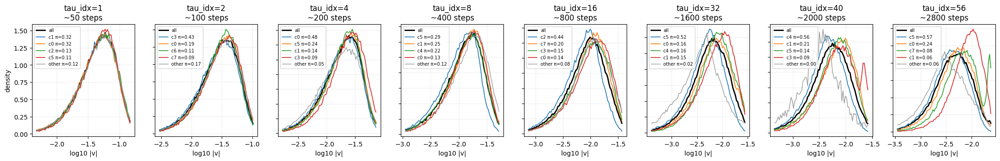

In [17]:
import os
import numpy as np
import matplotlib.pyplot as plt

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state


# ---------- IO ----------
def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)

    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = st.get("lagrangian_xy", None) if isinstance(st, dict) else getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")


def collect_selected_windows(save_pth, t1, t2, window_size, window_step, window_indices, log_format="auto"):
    win_indices = set(int(w) for w in window_indices)
    buffers = {w: {"t": [], "x": []} for w in win_indices}
    w_max = max(win_indices)

    for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
        w = int(t // window_step)
        if w > w_max:
            break
        if w not in buffers:
            continue
        ws = w * window_step
        we = ws + window_size
        if not (ws <= t < we):
            continue
        buffers[w]["t"].append(t)
        buffers[w]["x"].append(np.asarray(xy, np.float32))

    out = {}
    for w, b in buffers.items():
        if len(b["t"]) == 0:
            continue
        tw = np.asarray(b["t"], np.int64)
        Xw = np.stack(b["x"], axis=0).astype(np.float32)  # (Tw,N,2)
        out[w] = (tw, Xw)
    return out


# ---------- periodic delta (optional) ----------
def delta_periodic(dx, Lx=None, Ly=None):
    if Lx is not None:
        dx[..., 0] = (dx[..., 0] + 0.5 * Lx) % Lx - 0.5 * Lx
    if Ly is not None:
        dx[..., 1] = (dx[..., 1] + 0.5 * Ly) % Ly - 0.5 * Ly
    return dx


# ---------- features (same as in pipeline) ----------
def features_for_tau(Xw, tw, tau, eps=1e-12):
    Xw = np.asarray(Xw, np.float32)
    tw = np.asarray(tw, np.int64)
    Tw, N, _ = Xw.shape
    if tau >= Tw:
        return None

    dx = Xw[tau:] - Xw[:-tau]                          # (Tw-tau,N,2)
    dt = (tw[tau:] - tw[:-tau]).astype(np.float64)     # (Tw-tau,)
    v = dx.astype(np.float64) / np.maximum(dt[:, None, None], eps)

    mu = v.mean(axis=0)                                # (N,2)
    vx = v[..., 0]; vy = v[..., 1]
    mux = mu[:, 0]; muy = mu[:, 1]
    cxx = (vx * vx).mean(axis=0) - mux * mux
    cyy = (vy * vy).mean(axis=0) - muy * muy
    cxy = (vx * vy).mean(axis=0) - mux * muy

    r2 = (vx * vx + vy * vy)
    m2 = r2.mean(axis=0)
    m4 = (r2 * r2).mean(axis=0)
    ngp = m4 / (2.0 * np.maximum(m2, eps) ** 2) - 1.0

    return np.stack([mux, muy, cxx, cxy, cyy, ngp], axis=1)  # (N,6)


def kmeans_assign(Z, C):
    d2 = ((Z[:, None, :] - C[None, :, :]) ** 2).sum(axis=2)  # (N,K)
    lab = d2.argmin(axis=1)
    return lab


# ---------- sampling |v| for all or subset of particles ----------
def sample_logv(tw, Xw, tau, particle_ids=None, Lx=None, Ly=None, max_samples=200000, seed=0, eps=1e-12):
    Tw, N, _ = Xw.shape
    tau = int(tau)
    if tau >= Tw:
        return None, None

    dt_all = (tw[tau:] - tw[:-tau]).astype(np.float64)  # (Tw-tau,)
    tau_phys = float(np.median(dt_all))
    Tseg = Tw - tau

    rng = np.random.default_rng(seed)

    if particle_ids is None:
        # sample over all (t,i)
        M = Tseg * N
        m = int(min(max_samples, M))
        lin = rng.integers(0, M, size=m, endpoint=False)
        tt = (lin // N).astype(np.int64)
        ii = (lin % N).astype(np.int64)
    else:
        particle_ids = np.asarray(particle_ids, np.int64)
        Nk = particle_ids.size
        if Nk == 0:
            return tau_phys, np.empty((0,), np.float64)
        M = Tseg * Nk
        m = int(min(max_samples, M))
        lin = rng.integers(0, M, size=m, endpoint=False)
        tt = (lin // Nk).astype(np.int64)
        jj = (lin % Nk).astype(np.int64)
        ii = particle_ids[jj]

    dx = (Xw[tt + tau, ii] - Xw[tt, ii]).astype(np.float64)
    if (Lx is not None) or (Ly is not None):
        dx = delta_periodic(dx, Lx=Lx, Ly=Ly)

    v = dx / np.maximum(dt_all[tt, None], eps)
    sp = np.sqrt((v * v).sum(axis=1))
    logv = np.log10(np.maximum(sp, 1e-12))
    return tau_phys, logv


# ---------- main plotting ----------
def plot_window_mixture_and_clusters(
    w, ws, we, tw, Xw,
    tau_list,
    model_dir,
    out_dir,
    topK=4,
    bins=80,
    max_samples_total=200000,
    max_samples_cluster=120000,
    Lx=None, Ly=None,
):
    os.makedirs(out_dir, exist_ok=True)

    ncols = len(tau_list)
    fig = plt.figure(figsize=(3.4 * ncols, 3.2))

    for j, tau in enumerate(tau_list):
        tau = int(tau)

        mu_path = os.path.join(model_dir, f"scaler_mu_tau{tau}.npy")
        sig_path = os.path.join(model_dir, f"scaler_sig_tau{tau}.npy")
        C_path  = os.path.join(model_dir, f"centroids_tau{tau}.npy")
        if not (os.path.exists(mu_path) and os.path.exists(sig_path) and os.path.exists(C_path)):
            raise FileNotFoundError(f"missing model files for tau_idx={tau} in {model_dir}")

        mu = np.load(mu_path)
        sig = np.load(sig_path)
        C = np.load(C_path)  # (K,6)
        K = C.shape[0]

        f = features_for_tau(Xw, tw, tau)
        if f is None:
            continue
        Z = (f - mu) / sig
        lab = kmeans_assign(Z, C)                 # (N,)
        counts = np.bincount(lab, minlength=K)
        pi = counts / np.maximum(counts.sum(), 1)

        # choose topK clusters by weight
        order = np.argsort(-pi)
        top = order[:min(topK, K)]
        other = order[min(topK, K):]

        # sample overall and per cluster (log|v|)
        tau_phys, logv_all = sample_logv(tw, Xw, tau, None, Lx=Lx, Ly=Ly,
                                         max_samples=max_samples_total, seed=1000*w + 17*tau)
        logs = [logv_all]

        pid_by_cluster = {k: np.nonzero(lab == k)[0] for k in range(K)}
        logv_top = {}
        for k in top:
            _, logv_k = sample_logv(tw, Xw, tau, pid_by_cluster[int(k)], Lx=Lx, Ly=Ly,
                                    max_samples=max_samples_cluster, seed=2000*w + 31*tau + int(k))
            logv_top[int(k)] = logv_k
            logs.append(logv_k)

        if other.size > 0:
            pid_other = np.concatenate([pid_by_cluster[int(k)] for k in other], axis=0)
            _, logv_o = sample_logv(tw, Xw, tau, pid_other, Lx=Lx, Ly=Ly,
                                    max_samples=max_samples_cluster, seed=3000*w + 43*tau)
            logs.append(logv_o)
        else:
            logv_o = None

        logs = np.concatenate([z for z in logs if z is not None and z.size > 0], axis=0)
        lo, hi = np.quantile(logs, [0.01, 0.99])
        edges = np.linspace(lo, hi, bins + 1)
        centers = 0.5 * (edges[:-1] + edges[1:])

        ax = plt.subplot(1, ncols, j + 1)

        # total
        h, _ = np.histogram(logv_all, bins=edges, density=True)
        ax.plot(centers, h, lw=2.0, color="k", label="all")

        # top clusters
        for k in top:
            hk, _ = np.histogram(logv_top[int(k)], bins=edges, density=True)
            ax.plot(centers, hk, lw=1.2, label=f"c{k} π={pi[int(k)]:.2f}")

        # other
        if logv_o is not None and logv_o.size > 0:
            ho, _ = np.histogram(logv_o, bins=edges, density=True)
            ax.plot(centers, ho, lw=1.0, color="0.6", label=f"other π={pi[other].sum():.2f}")

        ax.set_title(f"tau_idx={tau}\n~{int(round(tau_phys))} steps")
        ax.set_xlabel("log10 |v|")
        if j == 0:
            ax.set_ylabel("density")
        else:
            ax.set_yticklabels([])
        ax.grid(alpha=0.2)
        ax.legend(fontsize=7, ncol=1)

    plt.suptitle(f"Speed mixture + cluster components | window {w}: [{ws},{we}) | frames={tw.size}", y=1.05)
    plt.tight_layout()
    out_png = os.path.join(out_dir, f"speed_mix_clusters_w{w:03d}_{ws}_{we}.png")
    plt.savefig(out_png, dpi=220, bbox_inches="tight")
    plt.close(fig)
    return out_png


# ==========================
# USER INPUTS
# ==========================
save_pth = save_pth
log_format = "auto"
t1, t2 = 0, 1_000_000

window_size = 50_000
window_step = 50_000
window_indices = [0, 3, 10, 15]  # какие окна рисовать

tau_list = [1, 2, 4, 8, 16, 32, 40, 56, 64]  # tau в кадрах логирования

model_dir = "metrics/dist_cluster_pipeline"          # где лежат centroids/scaler_*_tau{tau}.npy
out_dir = "metrics/speed_dists_all_with_clusters"

# если координаты на торе:
Lx = None  # например 400
Ly = None  # например 400

# ==========================
# RUN
# ==========================
wins = collect_selected_windows(save_pth, t1, t2, window_size, window_step, window_indices, log_format=log_format)
print("collected windows:", sorted(wins.keys()))

for w in sorted(wins.keys()):
    ws = w * window_step
    we = ws + window_size
    tw, Xw = wins[w]
    out_png = plot_window_mixture_and_clusters(
        w, ws, we, tw, Xw,
        tau_list=tau_list,
        model_dir=model_dir,
        out_dir=out_dir,
        topK=4,
        bins=80,
        max_samples_total=200000,
        max_samples_cluster=120000,
        Lx=Lx, Ly=Ly
    )
    print("saved:", out_png)

# FINAL VARIANT

In [1]:
# dist_pipeline.py
# Pipeline: local distribution clustering by distance between P_{i,w,tau} (objects = (particle, window)).
# Distance: sliced 1D Wasserstein-1 over random projections (fast, bandwidth-free).
# Prototypes: global medoids per tau, learned on selected windows (uniform + hard by DeltaH).
# Outputs: validity mask, DeltaH, global prototypes, pi(w,tau,k), separability, TV, transition mass, plots.
#
# Requirements: numpy, matplotlib, tqdm, and your project imports:
#   from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state
#
# NOTE: "i,j" in D_ij are indices of objects a=(particle,window) in the training collection for a fixed tau.

import os
import math
import numpy as np
import matplotlib.pyplot as plt

# progress bars
try:
    from tqdm import tqdm
except Exception:
    def tqdm(x, **kw):  # fallback: no progress bar
        return x

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state


# =========================
# USER CONFIG (edit here)
# =========================
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602112129/interp_6"                  # <-- path to your simulation log folder (npz/pickle)
log_format = "auto"                  # "auto" / "npz" / "pickle"

t1, t2 = 0, 1_000_000                # <-- physical sim steps to analyze (inclusive/exclusive-ish by log iterator)

window_size = 20_000                 # <-- physical steps per window (Delta T)
window_step = 20_000                 # <-- physical step between window starts (==window_size => non-overlap)

tau_list = [1, 2, 3, 4, 6, 8, 10, 12, 16, 24, 32, 40, 48, 56, 60, 70, 80, 100, 120, 140, 160, 180, 200]  # <-- tau axis in FRAME units (lag in logged frames)

# cell validity: we only trust (w,tau) if enough increments per particle
m_min = 100                          # <-- min increments per particle for a (w,tau) cell to be "valid"
rho_min = 0.80                       # <-- fraction of particles that must satisfy m_i>=m_min (avoid tail artifacts)

# scan pass (cheap heterogeneity for hard-window selection)
S_scan = 256                         # <-- particles used in scan H(w,tau) (smaller => faster, noisier)
m_scan = 48                          # <-- increments per particle used in scan signatures
null_reps_scan = 6                   # <-- how many null replicates to estimate DeltaH in scan (finite-sample null)

# training pass (global prototypes per tau)
n_train_uniform = 20                 # <-- number of uniformly spaced windows per tau for training coverage
n_train_hard = 20                    # <-- number of "hard" windows per tau (top DeltaH)
particles_per_train_window = 96      # <-- objects per training window (per tau); total objects ~ (n_train_uniform+n_train_hard)*particles_per_train_window
m_train = 64                         # <-- increments per training object distribution (must be <= available)
n_proj = 16                          # <-- number of random projection directions (sliced Wasserstein); higher => more accurate, slower

# k selection (global)
n_min_cluster = 30                   # <-- minimal cluster size in training set (for interpretability/medoid stability)
K_cap = 12                           # <-- hard cap for K search (prevents silly large K)
B_stab = 24                          # <-- stability repeats for selecting K (ARI via subsampling)
subsample_frac = 0.85                # <-- fraction of training objects per stability run
swap_trials = 250                    # <-- k-medoids swap trials per run (higher => better, slower)
seed = 0                             # <-- RNG seed for reproducibility

# application pass
m_apply = 64                         # <-- increments per particle distribution for assignment (match m_train)
chunk_particles = 512                # <-- assignment computed in chunks of particles to control memory

# periodic domain (set to None if not periodic)
Lx = None                            # <-- e.g. 400 if x wraps in [0,Lx)
Ly = None                            # <-- e.g. 400 if y wraps in [0,Ly)

# outputs
out_dir = "metrics/dist_pipeline_A"  # <-- folder for results
make_plots = True                    # <-- save heatmaps and a few diagnostics
top_case_windows = 2                 # <-- number of case-study windows per tau (largest pi_fast and largest TV)


# =========================
# Utilities: IO and window iterator
# =========================
def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)
    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = st.get("lagrangian_xy", None) if isinstance(st, dict) else getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")


def iter_windows(save_pth, t1, t2, window_size, window_step, log_format="auto"):
    """
    Streams the log and yields one window at a time:
      (w_idx, ws, we, tw, Xw)
    tw: (Tw,) int64 times (physical steps) of frames in window
    Xw: (Tw,N,2) float32 positions
    """
    ws = None
    we = None
    tw_buf = []
    X_buf = []
    for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
        if ws is None:
            ws = (t // window_step) * window_step
            we = ws + window_size

        # advance windows until current t fits
        while t >= we:
            w_idx = int(ws // window_step)
            if len(tw_buf) > 0:
                tw = np.asarray(tw_buf, np.int64)
                Xw = np.stack(X_buf, axis=0).astype(np.float32)
            else:
                tw = np.asarray([], np.int64)
                Xw = None
            yield w_idx, ws, we, tw, Xw
            ws += window_step
            we = ws + window_size
            tw_buf = []
            X_buf = []

        if ws <= t < we:
            tw_buf.append(t)
            X_buf.append(np.asarray(xy, np.float32))

    # flush last window if any
    if ws is not None:
        w_idx = int(ws // window_step)
        if len(tw_buf) > 0:
            tw = np.asarray(tw_buf, np.int64)
            Xw = np.stack(X_buf, axis=0).astype(np.float32)
        else:
            tw = np.asarray([], np.int64)
            Xw = None
        yield w_idx, ws, ws + window_size, tw, Xw


# =========================
# Geometry: periodic deltas
# =========================
def delta_periodic(dx, Lx=None, Ly=None):
    if Lx is not None:
        dx[..., 0] = (dx[..., 0] + 0.5 * Lx) % Lx - 0.5 * Lx
    if Ly is not None:
        dx[..., 1] = (dx[..., 1] + 0.5 * Ly) % Ly - 0.5 * Ly
    return dx


# =========================
# Core: signatures for distributions P_{i,w,tau}
# =========================
def make_dirs(n_proj, seed=0):
    rng = np.random.default_rng(seed)
    dirs = rng.normal(size=(n_proj, 2)).astype(np.float32)
    nrm = np.sqrt((dirs * dirs).sum(axis=1, keepdims=True))
    dirs = dirs / np.maximum(nrm, 1e-12)
    return dirs  # (L,2)

DIRS = make_dirs(n_proj, seed=seed + 123)


def sample_velocities_window(Xw, tw, tau, k_idx, particle_idx=None, Lx=None, Ly=None):
    """
    Xw: (Tw,N,2), tw: (Tw,)
    tau: lag in frames
    k_idx: (m,) indices into [0, Tw-tau)
    particle_idx: array of particle ids to extract (None => all)
    Returns v_s: (m, Ns, 2) float32
    """
    Tw = Xw.shape[0]
    if tau >= Tw:
        return None
    k_idx = np.asarray(k_idx, np.int64)
    if k_idx.max(initial=0) >= (Tw - tau):
        return None

    if particle_idx is None:
        X0 = Xw[k_idx, :, :]
        X1 = Xw[k_idx + tau, :, :]
    else:
        particle_idx = np.asarray(particle_idx, np.int64)
        X0 = Xw[k_idx][:, particle_idx, :]
        X1 = Xw[k_idx + tau][:, particle_idx, :]

    dx = (X1 - X0).astype(np.float32)
    if (Lx is not None) or (Ly is not None):
        dx = delta_periodic(dx, Lx=Lx, Ly=Ly)

    dt = (tw[k_idx + tau] - tw[k_idx]).astype(np.float32)  # (m,)
    v = dx / np.maximum(dt[:, None, None], 1e-12)
    return v


def signature_from_v(v_s, dirs):
    """
    v_s: (m, Ns, 2)
    dirs: (L,2)
    Signature per particle = concatenation of sorted projected samples for each dir.
    Returns Sig: (Ns, L*m) float32
    """
    m, Ns, _ = v_s.shape
    # proj: (m,Ns,L)
    proj = v_s[..., 0:1] * dirs[:, 0][None, None, :] + v_s[..., 1:2] * dirs[:, 1][None, None, :]
    # sort along sample axis for each particle+dir
    proj = np.sort(proj, axis=0)  # (m,Ns,L)
    # flatten (dir-major then quantile-major)
    Sig = np.transpose(proj, (1, 2, 0)).reshape(Ns, -1).astype(np.float32)  # (Ns, L*m)
    return Sig


def mean_pairwise_l1(Sig):
    """
    Sig: (S,D)
    returns mean_{i<j} mean_abs(Sig[i]-Sig[j])
    """
    S = Sig.shape[0]
    if S <= 1:
        return 0.0
    # compute full pairwise in a memory-safe way for small S (scan S<=256)
    D = np.mean(np.abs(Sig[:, None, :] - Sig[None, :, :]), axis=2)  # (S,S)
    triu = np.triu_indices(S, k=1)
    return float(D[triu].mean())


# =========================
# Distance matrix on signatures (training)
# =========================
def pairwise_dist_matrix(Sig, chunk=16):
    """
    Sig: (M,D)
    returns D: (M,M) float32 where D[a,b] = mean_abs(Sig[a]-Sig[b])
    chunk: row chunk for memory control
    """
    M, Ddim = Sig.shape
    D = np.empty((M, M), np.float32)
    for i0 in tqdm(range(0, M, chunk), desc="pairwise D rows", leave=False):
        i1 = min(M, i0 + chunk)
        block = Sig[i0:i1, None, :]  # (c,1,D)
        # (c,M,D) -> mean over D
        d = np.mean(np.abs(block - Sig[None, :, :]), axis=2).astype(np.float32)
        D[i0:i1, :] = d
    # enforce symmetry numerically
    D = 0.5 * (D + D.T)
    np.fill_diagonal(D, 0.0)
    return D


# =========================
# k-medoids on precomputed distance matrix
# =========================
def kmedoids_build(D, K, rng):
    """
    Greedy BUILD initialization for k-medoids.
    D: (M,M) distances.
    """
    M = D.shape[0]
    # first medoid: smallest total distance
    m0 = int(np.argmin(D.sum(axis=1)))
    medoids = [m0]
    # current best dist to any medoid
    best = D[:, m0].copy()
    while len(medoids) < K:
        # choose next medoid that maximally reduces total cost
        # cost if choose j: sum min(best, D[:,j])
        costs = np.empty(M, np.float64)
        for j in range(M):
            if j in medoids:
                costs[j] = np.inf
            else:
                costs[j] = np.minimum(best, D[:, j]).sum()
        mj = int(np.argmin(costs))
        medoids.append(mj)
        best = np.minimum(best, D[:, mj])
    return np.array(medoids, np.int64)


def assign_to_medoids(D, medoids):
    """
    Returns:
      labels: (M,)
      d1: (M,) distance to closest medoid
      d2: (M,) distance to 2nd closest medoid
    """
    dm = D[:, medoids]  # (M,K)
    order = np.argsort(dm, axis=1)
    labels = order[:, 0]
    d1 = dm[np.arange(dm.shape[0]), order[:, 0]]
    d2 = dm[np.arange(dm.shape[0]), order[:, 1]] if dm.shape[1] > 1 else np.full_like(d1, np.inf)
    # map label index to global medoid id (optional later)
    return labels, d1, d2


def kmedoids_refine(D, medoids, swap_trials, rng):
    """
    Random SWAP trials to improve medoids.
    """
    M = D.shape[0]
    medoids = medoids.copy()
    is_med = np.zeros(M, dtype=bool)
    is_med[medoids] = True

    def cost(meds):
        dm = D[:, meds]
        return float(np.min(dm, axis=1).sum())

    best_cost = cost(medoids)

    for _ in range(swap_trials):
        # pick a medoid to replace and a non-medoid to insert
        out_idx = int(rng.integers(0, len(medoids)))
        out_med = int(medoids[out_idx])
        in_cand = int(rng.integers(0, M))
        if is_med[in_cand]:
            continue
        new_medoids = medoids.copy()
        new_medoids[out_idx] = in_cand
        c = cost(new_medoids)
        if c < best_cost:
            is_med[out_med] = False
            is_med[in_cand] = True
            medoids = new_medoids
            best_cost = c
    return medoids, best_cost


# =========================
# ARI for stability (no sklearn)
# =========================
def adjusted_rand_index(labels_true, labels_pred):
    labels_true = np.asarray(labels_true, np.int64)
    labels_pred = np.asarray(labels_pred, np.int64)
    n = int(labels_true.size)
    if n == 0:
        return 0.0

    # relabel to consecutive
    _, lt = np.unique(labels_true, return_inverse=True)
    _, lp = np.unique(labels_pred, return_inverse=True)

    k1 = int(lt.max() + 1)
    k2 = int(lp.max() + 1)
    cont = np.zeros((k1, k2), dtype=np.int64)
    for a, b in zip(lt, lp):
        cont[a, b] += 1

    def comb2(x):
        # works for ints and arrays
        x = np.asarray(x)
        return (x * (x - 1)) // 2

    nij = cont
    ai = nij.sum(axis=1)
    bj = nij.sum(axis=0)

    index = int(comb2(nij).sum())
    sum_ai = int(comb2(ai).sum())
    sum_bj = int(comb2(bj).sum())

    total = n * (n - 1) // 2
    if total == 0:
        return 0.0

    expected = (sum_ai * sum_bj) / float(total)
    max_index = 0.5 * (sum_ai + sum_bj)

    denom = max_index - expected
    if denom == 0.0:
        return 0.0
    return float((index - expected) / denom)

def stability_score(D, K, B, subsample_frac, swap_trials, rng):
    """
    Returns S_K = median(ARI) - median(ARI_null)
    Also returns median ARI and median null ARI for diagnostics.
    """
    M = D.shape[0]
    m_sub = max(int(math.floor(M * subsample_frac)), K + 2)
    runs = []
    runs_null = []

    # collect runs
    for b in range(B):
        idx = rng.choice(M, size=m_sub, replace=False)
        idx.sort()
        Dsub = D[np.ix_(idx, idx)]
        meds = kmedoids_build(Dsub, K, rng)
        meds, _ = kmedoids_refine(Dsub, meds, swap_trials, rng)
        lab, _, _ = assign_to_medoids(Dsub, meds)
        runs.append((idx, lab))

        # null: permute labels (preserves cluster sizes)
        lab_null = lab.copy()
        rng.shuffle(lab_null)
        runs_null.append((idx, lab_null))

    # sample pairs for ARI estimation
    pairs = []
    for _ in range(min(60, B * (B - 1) // 2)):
        a = int(rng.integers(0, B))
        b = int(rng.integers(0, B - 1))
        if b >= a:
            b += 1
        pairs.append((a, b))

    aris = []
    aris_null = []
    for a, b in pairs:
        idx_a, lab_a = runs[a]
        idx_b, lab_b = runs[b]
        # intersection
        inter, ia, ib = np.intersect1d(idx_a, idx_b, return_indices=True)
        if inter.size < K + 2:
            continue
        aris.append(adjusted_rand_index(lab_a[ia], lab_b[ib]))

        idx_a, lab_a = runs_null[a]
        idx_b, lab_b = runs_null[b]
        inter, ia, ib = np.intersect1d(idx_a, idx_b, return_indices=True)
        if inter.size < K + 2:
            continue
        aris_null.append(adjusted_rand_index(lab_a[ia], lab_b[ib]))

    if len(aris) == 0:
        return 0.0, 0.0, 0.0
    med = float(np.median(aris))
    med0 = float(np.median(aris_null)) if len(aris_null) else 0.0
    return float(med - med0), med, med0


# =========================
# Plot helpers
# =========================
def save_heatmap(mat, x_labels, y_labels, title, out_png, vmin=None, vmax=None, cmap=None):
    plt.figure(figsize=(10.5, 4.8))
    plt.imshow(mat, origin="lower", aspect="auto", vmin=vmin, vmax=vmax, cmap=cmap)
    plt.xticks(np.arange(len(x_labels)), x_labels, rotation=45, ha="right")
    plt.yticks(np.arange(len(y_labels)), y_labels)
    plt.title(title)
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()


# =========================
# MAIN PIPELINE
# =========================
def main():
    os.makedirs(out_dir, exist_ok=True)
    rng = np.random.default_rng(seed)

    tau_list_sorted = list(map(int, tau_list))
    tau_labels = [str(t) for t in tau_list_sorted]

    # ---------- PASS A: scan windows; compute validity + DeltaH ----------
    # store by window index in a dict first (unknown W ahead of time)
    scan_meta = []  # list of (w_idx, ws, we, Tw)
    DeltaH = {}     # DeltaH[w_idx] -> (Ttau,)
    Valid = {}      # Valid[w_idx] -> (Ttau,) bool

    print("PASS A: scan windows (validity + DeltaH) ...")
    for w_idx, ws, we, tw, Xw in tqdm(iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format),
                                      desc="scan windows"):
        Tw = int(tw.size)
        scan_meta.append((w_idx, ws, we, Tw))
        if Tw == 0:
            DeltaH[w_idx] = np.full(len(tau_list_sorted), np.nan, np.float32)
            Valid[w_idx] = np.zeros(len(tau_list_sorted), bool)
            continue

        N = Xw.shape[1]
        # pick particle subset for scan (fixed per window for determinism)
        p_scan = rng.choice(N, size=min(S_scan, N), replace=False)
        # precompute: for each tau compute DeltaH, validity
        dh = np.full(len(tau_list_sorted), np.nan, np.float32)
        vd = np.zeros(len(tau_list_sorted), bool)

        for ti, tau in enumerate(tau_list_sorted):
            if tau >= Tw:
                continue

            Tseg = Tw - tau
            # per-particle increment count is Tseg (same for all particles) in this construction
            # validity: need Tseg >= m_min for >=rho fraction of particles -> here either all or none
            if Tseg < m_min:
                continue
            vd[ti] = True

            # choose common time indices for scan signature
            m0 = min(m_scan, Tseg)
            k_idx = rng.choice(Tseg, size=m0, replace=False)
            k_idx.sort()

            v_s = sample_velocities_window(Xw, tw, tau, k_idx, particle_idx=p_scan, Lx=Lx, Ly=Ly)
            if v_s is None:
                vd[ti] = False
                continue

            Sig = signature_from_v(v_s, DIRS)  # (S_scan, L*m0)
            H_real = mean_pairwise_l1(Sig)

            # finite-sample null: pool all v samples in this subset, resample pseudo particles
            # pool shape: (m0*S_scan, 2)
            v_pool = v_s.reshape(-1, 2)
            H_nulls = []
            for _ in range(null_reps_scan):
                # create pseudo particles with same m0 by sampling from pool
                # pseudo v: (m0, S_scan, 2)
                idx = rng.integers(0, v_pool.shape[0], size=(m0, Sig.shape[0]))
                v_pseudo = v_pool[idx]  # (m0, S_scan, 2)
                Sig0 = signature_from_v(v_pseudo, DIRS)
                H_nulls.append(mean_pairwise_l1(Sig0))
            H0 = float(np.median(H_nulls))
            dh[ti] = float(H_real - H0)

        DeltaH[w_idx] = dh
        Valid[w_idx] = vd

    # assemble window list in order
    scan_meta.sort(key=lambda x: x[0])
    w_indices = [m[0] for m in scan_meta]
    W = len(w_indices)
    Ttau = len(tau_list_sorted)

    DeltaH_mat = np.vstack([DeltaH[w] for w in w_indices])  # (W,Ttau)
    Valid_mat = np.vstack([Valid[w] for w in w_indices])    # (W,Ttau)

    np.save(os.path.join(out_dir, "w_indices.npy"), np.asarray(w_indices, np.int64))
    np.save(os.path.join(out_dir, "window_meta.npy"), np.asarray(scan_meta, dtype=object))
    np.save(os.path.join(out_dir, "tau_list.npy"), np.asarray(tau_list_sorted, np.int64))
    np.save(os.path.join(out_dir, "DeltaH.npy"), DeltaH_mat)
    np.save(os.path.join(out_dir, "Valid.npy"), Valid_mat.astype(np.uint8))

    if make_plots:
        save_heatmap(Valid_mat.astype(float), tau_labels, [str(w) for w in w_indices],
                     "Validity mask (1=valid cell)", os.path.join(out_dir, "valid_mask.png"),
                     vmin=0, vmax=1)
        # visualize DeltaH with symmetric-ish scale
        vmax = np.nanpercentile(np.abs(DeltaH_mat), 98) if np.isfinite(DeltaH_mat).any() else 1.0
        save_heatmap(DeltaH_mat, tau_labels, [str(w) for w in w_indices],
                     "DeltaH(w,tau) = H_real - median(H_null) (scan)", os.path.join(out_dir, "DeltaH.png"),
                     vmin=-vmax, vmax=vmax, cmap="coolwarm")

    # ---------- PASS B: train global prototypes per tau ----------
    print("PASS B: train global prototypes per tau ...")
    proto = {}  # tau -> dict with keys: K, medoid_sig (K,D), medoid_stats, K_scores
    train_windows_by_tau = {}

    # helper to choose training windows for a tau
    def select_train_windows_for_tau(ti):
        # base: evenly spaced over all windows
        base = np.unique(np.rint(np.linspace(0, W - 1, n_train_uniform)).astype(int)).tolist()
        base_w = [w_indices[i] for i in base]

        # hard: top DeltaH among valid windows
        d = DeltaH_mat[:, ti].copy()
        v = Valid_mat[:, ti].copy()
        d[~v] = -np.inf
        hard_idx = np.argsort(-d)[:n_train_hard]
        hard_w = [w_indices[i] for i in hard_idx if np.isfinite(d[i])]
        # union
        ws = list(dict.fromkeys(base_w + hard_w))
        return ws

    # build a mapping from window index -> rank in scan_meta for fast membership tests
    w_to_pos = {w: i for i, w in enumerate(w_indices)}

    for ti, tau in enumerate(tqdm(tau_list_sorted, desc="train tau")):
        # skip tau if almost no valid windows
        if Valid_mat[:, ti].sum() < 3:
            continue

        train_w = select_train_windows_for_tau(ti)
        train_windows_by_tau[tau] = train_w

        # collect training objects: (particle, window) -> signature
        obj_sigs = []
        obj_speed_q50 = []
        obj_speed_q90 = []
        obj_meta = []  # (w_idx, particle_id)
        rng_tau = np.random.default_rng(seed + 1000 + tau)

        # pass over data once and collect only selected windows
        needed = set(train_w)
        for w_idx, ws, we, tw, Xw in tqdm(iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format),
                                          desc=f"collect train objects tau={tau}", leave=False):
            if w_idx not in needed:
                continue
            Tw = tw.size
            if Tw == 0 or tau >= Tw:
                continue
            Tseg = Tw - tau
            if Tseg < max(m_train, m_min):
                continue

            N = Xw.shape[1]
            # balanced per window: sample fixed number of particles
            p = rng_tau.choice(N, size=min(particles_per_train_window, N), replace=False)
            # fixed common time indices per window for training objects
            k_idx = rng_tau.choice(Tseg, size=m_train, replace=False)
            k_idx.sort()

            v_s = sample_velocities_window(Xw, tw, tau, k_idx, particle_idx=p, Lx=Lx, Ly=Ly)  # (m_train, P,2)
            if v_s is None:
                continue
            Sig = signature_from_v(v_s, DIRS)  # (P, Dsig)

            # speed quantiles for interpretability / "fast cluster" tag
            sp = np.sqrt((v_s * v_s).sum(axis=2))  # (m_train, P)
            q50 = np.quantile(sp, 0.5, axis=0)
            q90 = np.quantile(sp, 0.9, axis=0)

            obj_sigs.append(Sig)
            obj_speed_q50.append(q50.astype(np.float32))
            obj_speed_q90.append(q90.astype(np.float32))
            obj_meta.extend([(w_idx, int(pid)) for pid in p.tolist()])

        if not obj_sigs:
            continue

        Sig_all = np.vstack(obj_sigs).astype(np.float32)  # (M,D)
        q50_all = np.concatenate(obj_speed_q50).astype(np.float32)
        q90_all = np.concatenate(obj_speed_q90).astype(np.float32)
        M = Sig_all.shape[0]

        # compute D among training objects (this is the heavy part)
        Dmat = pairwise_dist_matrix(Sig_all, chunk=16)

        # choose K by stability
        Kmax = min(K_cap, M // n_min_cluster) if M >= n_min_cluster else 1
        if Kmax < 1:
            Kmax = 1

        K_scores = []
        best = None

        for K in range(1, Kmax + 1):
            Sk, ari_med, ari0_med = stability_score(Dmat, K, B_stab, subsample_frac, swap_trials, rng_tau)
            K_scores.append((K, Sk, ari_med, ari0_med))

        # select K_global
        Ks = np.array([k for k, _, _, _ in K_scores], np.int64)
        Ss = np.array([s for _, s, _, _ in K_scores], np.float64)
        if Ss.size == 0:
            continue
        Smax = float(Ss.max())
        if Smax <= 1e-6:
            # "continuum": no stable discrete clusters
            # we still store a single prototype (medoid) for assignment/diagnostics
            K_global = 1
        else:
            target = 0.95 * Smax
            K_global = int(Ks[np.where(Ss >= target)[0].min()])

        # fit final k-medoids on full D for K_global
        meds = kmedoids_build(Dmat, K_global, rng_tau)
        meds, best_cost = kmedoids_refine(Dmat, meds, swap_trials * 3, rng_tau)
        labels, d1, d2 = assign_to_medoids(Dmat, meds)

        # store prototypes: medoid signatures and their speed stats
        med_sig = Sig_all[meds].copy()
        med_q50 = q50_all[meds].copy()
        med_q90 = q90_all[meds].copy()

        # define "fast cluster" for this tau as argmax medoid q90
        fast_k = int(np.argmax(med_q90)) if K_global >= 1 else 0

        proto[tau] = dict(
            tau=tau,
            K=int(K_global),
            medoids=meds.astype(np.int64),
            med_sig=med_sig.astype(np.float32),
            med_q50=med_q50.astype(np.float32),
            med_q90=med_q90.astype(np.float32),
            fast_k=int(fast_k),
            K_scores=np.asarray(K_scores, dtype=np.float64),
            train_windows=np.asarray(train_w, np.int64),
            Sig_dim=int(Sig_all.shape[1]),
        )

        # persist per tau
        tau_dir = os.path.join(out_dir, f"tau_{tau:04d}")
        os.makedirs(tau_dir, exist_ok=True)
        np.save(os.path.join(tau_dir, "med_sig.npy"), med_sig)
        np.save(os.path.join(tau_dir, "med_q50.npy"), med_q50)
        np.save(os.path.join(tau_dir, "med_q90.npy"), med_q90)
        np.save(os.path.join(tau_dir, "K_scores.npy"), np.asarray(K_scores, np.float64))
        np.save(os.path.join(tau_dir, "train_windows.npy"), np.asarray(train_w, np.int64))

    # ---------- PASS C: apply prototypes to all windows ----------
    print("PASS C: apply prototypes; compute pi, separability, TV, transitions ...")

    # determine per tau K and output tensors
    tau_used = sorted(proto.keys())
    if not tau_used:
        raise RuntimeError("No tau produced prototypes. Check validity / training selection.")

    tau_used = [int(t) for t in tau_used]
    Tuse = len(tau_used)
    Kmax_global = max(proto[t]["K"] for t in tau_used)

    pi = np.full((W, Tuse, Kmax_global), np.nan, np.float32)            # pi[w,ti,k]
    sep_ratio = np.full((W, Tuse), np.nan, np.float32)                  # median (d2-d1)/d1
    pi_fast = np.full((W, Tuse), np.nan, np.float32)                    # pi of fast prototype
    tv = np.full((W, Tuse), np.nan, np.float32)                         # TV between consecutive windows
    offdiag = np.full((W, Tuse), np.nan, np.float32)                    # 1 - sum diag(T_ab)

    # we compute transitions online; need previous labels for each tau
    prev_labels = {t: None for t in tau_used}

    # streaming over windows in order; map w_idx -> row position
    wpos = {w: i for i, w in enumerate(w_indices)}

    rng_apply = np.random.default_rng(seed + 9999)

    for w_idx, ws, we, tw, Xw in tqdm(iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format),
                                      desc="apply windows"):
        if w_idx not in wpos:
            continue
        wi = wpos[w_idx]
        Tw = tw.size
        if Tw == 0:
            continue
        N = Xw.shape[1]

        for ti, tau in enumerate(tau_used):
            # require validity from scan
            if tau not in tau_list_sorted:
                continue
            scan_ti = tau_list_sorted.index(tau)
            if not Valid_mat[wi, scan_ti]:
                continue
            if tau >= Tw:
                continue
            Tseg = Tw - tau
            if Tseg < max(m_apply, m_min):
                continue

            P = proto[tau]
            K = P["K"]
            med_sig = P["med_sig"]  # (K, Dsig)

            # common time indices for all particles in this window (vectorization)
            k_idx = rng_apply.choice(Tseg, size=m_apply, replace=False)
            k_idx.sort()

            v_s = sample_velocities_window(Xw, tw, tau, k_idx, particle_idx=None, Lx=Lx, Ly=Ly)  # (m_apply,N,2)
            if v_s is None:
                continue
            Sig_all = signature_from_v(v_s, DIRS)  # (N, Dsig)

            # assign in chunks to control peak memory
            labels = np.empty(N, np.int64)
            d1_all = np.empty(N, np.float32)
            d2_all = np.empty(N, np.float32)

            for i0 in range(0, N, chunk_particles):
                i1 = min(N, i0 + chunk_particles)
                Sg = Sig_all[i0:i1].astype(np.float32)  # (c,D)
                # distances to prototypes: mean abs difference
                # (c,1,D) - (1,K,D) -> (c,K,D) -> mean over D -> (c,K)
                dist = np.mean(np.abs(Sg[:, None, :] - med_sig[None, :, :]), axis=2).astype(np.float32)
                ordk = np.argsort(dist, axis=1)
                labels[i0:i1] = ordk[:, 0]
                d1_all[i0:i1] = dist[np.arange(i1 - i0), ordk[:, 0]]
                d2_all[i0:i1] = dist[np.arange(i1 - i0), ordk[:, 1]] if K > 1 else np.inf

            # weights pi
            counts = np.bincount(labels, minlength=K).astype(np.float32)
            pik = counts / max(float(N), 1.0)
            pi[wi, ti, :K] = pik

            # separability: median normalized margin
            ratio = np.median((d2_all - d1_all) / np.maximum(d1_all, 1e-12))
            sep_ratio[wi, ti] = float(ratio)

            # fast weight
            fk = int(P["fast_k"])
            pi_fast[wi, ti] = float(pik[fk])

            # transitions with previous window for same tau
            prev = prev_labels[tau]
            if prev is None:
                offdiag[wi, ti] = 0.0
            else:
                # confusion matrix (K x K) normalized by N
                Tmat = np.zeros((K, K), np.float32)
                for a, b in zip(prev, labels):
                    Tmat[a, b] += 1.0
                Tmat /= max(float(N), 1.0)
                offdiag[wi, ti] = float(1.0 - np.trace(Tmat))
            prev_labels[tau] = labels

    # TV
    for ti, tau in enumerate(tau_used):
        K = proto[tau]["K"]
        for wi in range(1, W):
            a = pi[wi - 1, ti, :K]
            b = pi[wi, ti, :K]
            if not (np.isfinite(a).all() and np.isfinite(b).all()):
                continue
            tv[wi, ti] = 0.5 * float(np.abs(a - b).sum())

    # save core arrays
    np.save(os.path.join(out_dir, "tau_used.npy"), np.asarray(tau_used, np.int64))
    np.save(os.path.join(out_dir, "pi.npy"), pi)
    np.save(os.path.join(out_dir, "pi_fast.npy"), pi_fast)
    np.save(os.path.join(out_dir, "sep_ratio.npy"), sep_ratio)
    np.save(os.path.join(out_dir, "tv.npy"), tv)
    np.save(os.path.join(out_dir, "offdiag.npy"), offdiag)

    # plots
    if make_plots:
        save_heatmap(sep_ratio, [str(t) for t in tau_used], [str(w) for w in w_indices],
                     "Separability: median((d2-d1)/d1) (higher=more confident)", os.path.join(out_dir, "sep_ratio.png"))
        save_heatmap(pi_fast, [str(t) for t in tau_used], [str(w) for w in w_indices],
                     "pi_fast(w,tau): weight of fastest prototype", os.path.join(out_dir, "pi_fast.png"), vmin=0, vmax=1)
        save_heatmap(tv, [str(t) for t in tau_used], [str(w) for w in w_indices],
                     "TV(w,tau) between consecutive windows", os.path.join(out_dir, "tv.png"), vmin=0, vmax=np.nanpercentile(tv, 98))
        save_heatmap(offdiag, [str(t) for t in tau_used], [str(w) for w in w_indices],
                     "offdiag mass: 1 - trace(T_ab) (fraction switching)", os.path.join(out_dir, "offdiag.png"), vmin=0, vmax=np.nanpercentile(offdiag, 98))

    print("DONE. Outputs in:", out_dir)
    print("Trained taus:", tau_used)
    for tau in tau_used:
        P = proto[tau]
        print(f"tau={tau}: K_global={P['K']}, fast_k={P['fast_k']}, train_windows={len(P['train_windows'])}")


if __name__ == "__main__":
    main()

PASS A: scan windows (validity + DeltaH) ...


scan windows: 50it [18:18, 21.97s/it]


PASS B: train global prototypes per tau ...


train tau: 100%|██████████| 23/23 [24:36<00:00, 64.20s/it]


PASS C: apply prototypes; compute pi, separability, TV, transitions ...


apply windows: 50it [04:21,  5.23s/it]


DONE. Outputs in: metrics/dist_pipeline_A
Trained taus: [1, 2, 3, 4, 6, 8, 10, 12, 16, 24, 32, 40, 48, 56, 60, 70, 80, 100, 120, 140, 160, 180, 200]
tau=1: K_global=2, fast_k=0, train_windows=33
tau=2: K_global=2, fast_k=0, train_windows=32
tau=3: K_global=2, fast_k=0, train_windows=31
tau=4: K_global=3, fast_k=2, train_windows=31
tau=6: K_global=5, fast_k=3, train_windows=31
tau=8: K_global=3, fast_k=1, train_windows=33
tau=10: K_global=4, fast_k=2, train_windows=33
tau=12: K_global=3, fast_k=1, train_windows=34
tau=16: K_global=3, fast_k=2, train_windows=35
tau=24: K_global=2, fast_k=1, train_windows=34
tau=32: K_global=4, fast_k=3, train_windows=32
tau=40: K_global=4, fast_k=3, train_windows=34
tau=48: K_global=3, fast_k=2, train_windows=33
tau=56: K_global=5, fast_k=4, train_windows=32
tau=60: K_global=2, fast_k=1, train_windows=33
tau=70: K_global=3, fast_k=1, train_windows=33
tau=80: K_global=2, fast_k=1, train_windows=32
tau=100: K_global=2, fast_k=1, train_windows=32
tau=120: K

In [29]:
# dist_pipeline.py
# Pipeline: local distribution clustering by distance between P_{i,w,tau} (objects = (particle, window)).
# Distance: sliced 1D Wasserstein-1 over random projections (fast, bandwidth-free).
# Prototypes: global medoids per tau, learned on selected windows (uniform + hard by DeltaH).
# Outputs:
#   PASS A: Valid(w,tau), DeltaH(w,tau)
#   PASS B: prototypes per tau + stability curves + NEW: per-tau cluster separation metrics (geometry-based)
#   PASS C: pi(w,tau,k), pi_fast(w,tau), sep_ratio(w,tau), TV(w,tau), offdiag(w,tau)
#          + NEW: entropy/complexity of regime mixture: H_pi(w,tau), H_norm(w,tau), K_eff(w,tau)
#          + NEW: per-tau summary plots for separation metrics vs tau (optional)
#
# Requirements: numpy, matplotlib, tqdm, and project imports:
#   from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state
#
# NOTE: "i,j" in D_ij are indices of objects a=(particle,window) in the training collection for a fixed tau.

import os
import math
import numpy as np
import matplotlib.pyplot as plt

try:
    from tqdm import tqdm
except Exception:
    def tqdm(x, **kw):
        return x

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state


# =========================
# USER CONFIG (edit here)
# =========================
save_pth = "experiments/flow_lenia_apf_rollouts/checkpoints/2602231617/interp_2"
log_format = "auto"                  # "auto" / "npz" / "pickle"

t1, t2 = 0, 1_000_000                # physical sim steps to analyze

window_size = 20_000                 # physical steps per window
window_step = 20_000                 # physical step between window starts

tau_list = [1, 2, 3, 4, 6, 8, 10, 12, 16, 24, 32, 40, 48, 56, 60, 70, 80, 100, 120, 140, 160, 180, 200]  # lag in FRAME units

# cell validity: trust (w,tau) if enough increments per particle for this lag
m_min = 100

# scan pass (cheap heterogeneity for hard-window selection)
S_scan = 256
m_scan = 48
null_reps_scan = 6

# training pass (global prototypes per tau)
n_train_uniform = 20
n_train_hard = 20
particles_per_train_window = 96
m_train = 64
n_proj = 16

# k selection (global)
n_min_cluster = 30
K_cap = 12
B_stab = 24
subsample_frac = 0.85
swap_trials = 250
seed = 0

# application pass
m_apply = 64
chunk_particles = 512

# periodic domain (set to None if not periodic)  -- wall mode => keep None
Lx = None
Ly = None

# outputs
out_dir = "metrics/dist_pipeline_A_interp2"
make_plots = True

# extra: per-tau cluster geometry/separation metrics
compute_tau_separation_metrics = True
save_small_tau_artifacts = True      # saves only small arrays (KxK medoid distances etc.)
save_full_train_labels = False       # if True: save labels for all training objects (can be big but ok)
save_full_train_D = False            # if True: saves D_train.npy (can be huge across taus)


# =========================
# Utilities: IO and window iterator
# =========================
def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)
    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = st.get("lagrangian_xy", None) if isinstance(st, dict) else getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")


def iter_windows(save_pth, t1, t2, window_size, window_step, log_format="auto"):
    """
    Yields one window at a time:
      (w_idx, ws, we, tw, Xw)
    tw: (Tw,) int64 physical times
    Xw: (Tw,N,2) float32 positions
    """
    ws = None
    we = None
    tw_buf = []
    X_buf = []
    for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
        if ws is None:
            ws = (t // window_step) * window_step
            we = ws + window_size

        while t >= we:
            w_idx = int(ws // window_step)
            if len(tw_buf) > 0:
                tw = np.asarray(tw_buf, np.int64)
                Xw = np.stack(X_buf, axis=0).astype(np.float32)
            else:
                tw = np.asarray([], np.int64)
                Xw = None
            yield w_idx, ws, we, tw, Xw
            ws += window_step
            we = ws + window_size
            tw_buf = []
            X_buf = []

        if ws <= t < we:
            tw_buf.append(t)
            X_buf.append(np.asarray(xy, np.float32))

    if ws is not None:
        w_idx = int(ws // window_step)
        if len(tw_buf) > 0:
            tw = np.asarray(tw_buf, np.int64)
            Xw = np.stack(X_buf, axis=0).astype(np.float32)
        else:
            tw = np.asarray([], np.int64)
            Xw = None
        yield w_idx, ws, ws + window_size, tw, Xw


# =========================
# Geometry: periodic deltas
# =========================
def delta_periodic(dx, Lx=None, Ly=None):
    if Lx is not None:
        dx[..., 0] = (dx[..., 0] + 0.5 * Lx) % Lx - 0.5 * Lx
    if Ly is not None:
        dx[..., 1] = (dx[..., 1] + 0.5 * Ly) % Ly - 0.5 * Ly
    return dx


# =========================
# Core: signatures for distributions P_{i,w,tau}
# =========================
def make_dirs(n_proj, seed=0):
    rng = np.random.default_rng(seed)
    dirs = rng.normal(size=(n_proj, 2)).astype(np.float32)
    nrm = np.sqrt((dirs * dirs).sum(axis=1, keepdims=True))
    dirs = dirs / np.maximum(nrm, 1e-12)
    return dirs  # (L,2)

DIRS = make_dirs(n_proj, seed=seed + 123)


def sample_velocities_window(Xw, tw, tau, k_idx, particle_idx=None, Lx=None, Ly=None):
    """
    Xw: (Tw,N,2), tw: (Tw,)
    tau: lag in frames
    k_idx: (m,) indices into [0, Tw-tau)
    particle_idx: array of particle ids (None => all)
    Returns v_s: (m, Ns, 2) float32
    """
    Tw = Xw.shape[0]
    if tau >= Tw:
        return None
    k_idx = np.asarray(k_idx, np.int64)
    if k_idx.size == 0:
        return None
    if k_idx.max(initial=0) >= (Tw - tau):
        return None

    if particle_idx is None:
        X0 = Xw[k_idx, :, :]
        X1 = Xw[k_idx + tau, :, :]
    else:
        particle_idx = np.asarray(particle_idx, np.int64)
        X0 = Xw[k_idx][:, particle_idx, :]
        X1 = Xw[k_idx + tau][:, particle_idx, :]

    dx = (X1 - X0).astype(np.float32)
    if (Lx is not None) or (Ly is not None):
        dx = delta_periodic(dx, Lx=Lx, Ly=Ly)

    dt = (tw[k_idx + tau] - tw[k_idx]).astype(np.float32)  # (m,)
    v = dx / np.maximum(dt[:, None, None], 1e-12)
    return v


def signature_from_v(v_s, dirs):
    """
    v_s: (m, Ns, 2)
    dirs: (L,2)
    Signature per particle = concatenation of sorted projected samples for each dir.
    Returns Sig: (Ns, L*m) float32
    """
    m, Ns, _ = v_s.shape
    proj = v_s[..., 0:1] * dirs[:, 0][None, None, :] + v_s[..., 1:2] * dirs[:, 1][None, None, :]
    proj = np.sort(proj, axis=0)  # (m,Ns,L)
    Sig = np.transpose(proj, (1, 2, 0)).reshape(Ns, -1).astype(np.float32)  # (Ns, L*m)
    return Sig


def mean_pairwise_l1(Sig):
    """
    Sig: (S,D)
    returns mean_{i<j} mean_abs(Sig[i]-Sig[j])
    """
    S = Sig.shape[0]
    if S <= 1:
        return 0.0
    D = np.mean(np.abs(Sig[:, None, :] - Sig[None, :, :]), axis=2)  # (S,S)
    triu = np.triu_indices(S, k=1)
    return float(D[triu].mean())


# =========================
# Distance matrix on signatures (training)
# =========================
def pairwise_dist_matrix(Sig, chunk=16):
    """
    Sig: (M,D)
    returns D: (M,M) float32 where D[a,b] = mean_abs(Sig[a]-Sig[b])
    """
    M, Ddim = Sig.shape
    D = np.empty((M, M), np.float32)
    for i0 in tqdm(range(0, M, chunk), desc="pairwise D rows", leave=False):
        i1 = min(M, i0 + chunk)
        block = Sig[i0:i1, None, :]  # (c,1,D)
        d = np.mean(np.abs(block - Sig[None, :, :]), axis=2).astype(np.float32)
        D[i0:i1, :] = d
    D = 0.5 * (D + D.T)
    np.fill_diagonal(D, 0.0)
    return D


# =========================
# k-medoids on precomputed distance matrix
# =========================
def kmedoids_build(D, K, rng):
    M = D.shape[0]
    m0 = int(np.argmin(D.sum(axis=1)))
    medoids = [m0]
    best = D[:, m0].copy()
    while len(medoids) < K:
        costs = np.empty(M, np.float64)
        for j in range(M):
            if j in medoids:
                costs[j] = np.inf
            else:
                costs[j] = np.minimum(best, D[:, j]).sum()
        mj = int(np.argmin(costs))
        medoids.append(mj)
        best = np.minimum(best, D[:, mj])
    return np.array(medoids, np.int64)


def assign_to_medoids(D, medoids):
    dm = D[:, medoids]  # (M,K)
    order = np.argsort(dm, axis=1)
    labels = order[:, 0]
    d1 = dm[np.arange(dm.shape[0]), order[:, 0]]
    d2 = dm[np.arange(dm.shape[0]), order[:, 1]] if dm.shape[1] > 1 else np.full_like(d1, np.inf)
    return labels, d1, d2


def kmedoids_refine(D, medoids, swap_trials, rng):
    M = D.shape[0]
    medoids = medoids.copy()
    is_med = np.zeros(M, dtype=bool)
    is_med[medoids] = True

    def cost(meds):
        dm = D[:, meds]
        return float(np.min(dm, axis=1).sum())

    best_cost = cost(medoids)

    for _ in range(swap_trials):
        out_idx = int(rng.integers(0, len(medoids)))
        out_med = int(medoids[out_idx])
        in_cand = int(rng.integers(0, M))
        if is_med[in_cand]:
            continue
        new_medoids = medoids.copy()
        new_medoids[out_idx] = in_cand
        c = cost(new_medoids)
        if c < best_cost:
            is_med[out_med] = False
            is_med[in_cand] = True
            medoids = new_medoids
            best_cost = c
    return medoids, best_cost


# =========================
# ARI for stability (no sklearn)
# =========================
def adjusted_rand_index(labels_true, labels_pred):
    labels_true = np.asarray(labels_true, np.int64)
    labels_pred = np.asarray(labels_pred, np.int64)
    n = int(labels_true.size)
    if n == 0:
        return 0.0

    _, lt = np.unique(labels_true, return_inverse=True)
    _, lp = np.unique(labels_pred, return_inverse=True)

    k1 = int(lt.max() + 1)
    k2 = int(lp.max() + 1)
    cont = np.zeros((k1, k2), dtype=np.int64)
    for a, b in zip(lt, lp):
        cont[a, b] += 1

    def comb2(x):
        x = np.asarray(x)
        return (x * (x - 1)) // 2

    nij = cont
    ai = nij.sum(axis=1)
    bj = nij.sum(axis=0)

    index = int(comb2(nij).sum())
    sum_ai = int(comb2(ai).sum())
    sum_bj = int(comb2(bj).sum())

    total = n * (n - 1) // 2
    if total == 0:
        return 0.0

    expected = (sum_ai * sum_bj) / float(total)
    max_index = 0.5 * (sum_ai + sum_bj)

    denom = max_index - expected
    if denom == 0.0:
        return 0.0
    return float((index - expected) / denom)


def stability_score(D, K, B, subsample_frac, swap_trials, rng):
    M = D.shape[0]
    m_sub = max(int(math.floor(M * subsample_frac)), K + 2)
    runs = []
    runs_null = []

    for b in range(B):
        idx = rng.choice(M, size=m_sub, replace=False)
        idx.sort()
        Dsub = D[np.ix_(idx, idx)]
        meds = kmedoids_build(Dsub, K, rng)
        meds, _ = kmedoids_refine(Dsub, meds, swap_trials, rng)
        lab, _, _ = assign_to_medoids(Dsub, meds)
        runs.append((idx, lab))

        lab_null = lab.copy()
        rng.shuffle(lab_null)
        runs_null.append((idx, lab_null))

    pairs = []
    for _ in range(min(60, B * (B - 1) // 2)):
        a = int(rng.integers(0, B))
        b = int(rng.integers(0, B - 1))
        if b >= a:
            b += 1
        pairs.append((a, b))

    aris = []
    aris_null = []
    for a, b in pairs:
        idx_a, lab_a = runs[a]
        idx_b, lab_b = runs[b]
        inter, ia, ib = np.intersect1d(idx_a, idx_b, return_indices=True)
        if inter.size < K + 2:
            continue
        aris.append(adjusted_rand_index(lab_a[ia], lab_b[ib]))

        idx_a, lab_a = runs_null[a]
        idx_b, lab_b = runs_null[b]
        inter, ia, ib = np.intersect1d(idx_a, idx_b, return_indices=True)
        if inter.size < K + 2:
            continue
        aris_null.append(adjusted_rand_index(lab_a[ia], lab_b[ib]))

    if len(aris) == 0:
        return 0.0, 0.0, 0.0
    med = float(np.median(aris))
    med0 = float(np.median(aris_null)) if len(aris_null) else 0.0
    return float(med - med0), med, med0


# =========================
# NEW: per-tau cluster separation metrics (computed from training D + final labels)
# =========================
def tau_separation_metrics(D_train, medoids, labels, eps=1e-12):
    """
    D_train: (M,M)
    medoids: (K,) indices in [0,M)
    labels: (M,) in [0,K)
    Returns dict of scalar metrics + small arrays (K sizes/radii/medoid distances)
    """
    M = D_train.shape[0]
    K = int(medoids.size)

    sizes = np.bincount(labels, minlength=K).astype(np.int64)

    radii_mean = np.zeros(K, np.float32)
    radii_q90 = np.zeros(K, np.float32)
    for k in range(K):
        idx = np.where(labels == k)[0]
        if idx.size == 0:
            radii_mean[k] = np.nan
            radii_q90[k] = np.nan
            continue
        d = D_train[idx, int(medoids[k])]
        radii_mean[k] = float(np.mean(d))
        radii_q90[k] = float(np.quantile(d, 0.9))

    w = sizes.astype(np.float64) / max(float(M), 1.0)
    intra_mean = float(np.nansum(w * radii_mean))
    intra_q90 = float(np.nanmax(radii_q90)) if np.isfinite(radii_q90).any() else np.nan

    # medoid distance matrix (K,K)
    Dm = D_train[np.ix_(medoids, medoids)].astype(np.float32)
    Dm = 0.5 * (Dm + Dm.T)
    np.fill_diagonal(Dm, 0.0)

    if K <= 1:
        inter_min = np.nan
        inter_mean = np.nan
        dunn = np.nan
        db = np.nan
    else:
        triu = np.triu_indices(K, k=1)
        inter_min = float(np.min(Dm[triu]))
        inter_mean = float(np.mean(Dm[triu]))
        dunn = float(inter_min / (intra_mean + eps))

        # Davies–Bouldin with medoids: DB = mean_k max_{l!=k} ( (r_k + r_l) / d(m_k,m_l) )
        # use radii_mean as r_k
        db_terms = []
        for k in range(K):
            rk = float(radii_mean[k])
            if not np.isfinite(rk):
                continue
            worst = -np.inf
            for l in range(K):
                if l == k:
                    continue
                rl = float(radii_mean[l])
                dkl = float(Dm[k, l])
                if not (np.isfinite(rl) and np.isfinite(dkl) and dkl > 0):
                    continue
                worst = max(worst, (rk + rl) / dkl)
            if np.isfinite(worst):
                db_terms.append(worst)
        db = float(np.mean(db_terms)) if len(db_terms) else np.nan

    return dict(
        M=int(M),
        K=int(K),
        sizes=sizes,
        radii_mean=radii_mean,
        radii_q90=radii_q90,
        intra_mean=float(intra_mean),
        intra_q90=float(intra_q90) if np.isfinite(intra_q90) else np.nan,
        inter_min=float(inter_min) if np.isfinite(inter_min) else np.nan,
        inter_mean=float(inter_mean) if np.isfinite(inter_mean) else np.nan,
        dunn=float(dunn) if np.isfinite(dunn) else np.nan,
        db=float(db) if np.isfinite(db) else np.nan,
        Dm=Dm,
    )


# =========================
# Plot helpers
# =========================
def save_heatmap(mat, x_labels, y_labels, title, out_png, vmin=None, vmax=None, cmap=None):
    plt.figure(figsize=(10.5, 4.8))
    plt.imshow(mat, origin="lower", aspect="auto", vmin=vmin, vmax=vmax, cmap=cmap)
    plt.xticks(np.arange(len(x_labels)), x_labels, rotation=45, ha="right")
    plt.yticks(np.arange(len(y_labels)), y_labels)
    plt.title(title)
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()


def save_line(x, y, title, xlabel, ylabel, out_png, ylim=None):
    plt.figure(figsize=(8.0, 4.0))
    plt.plot(x, y, marker="o", linewidth=1)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()


def entropy_from_pi(pik, eps=1e-12):
    """
    pik: (K,) nonnegative, sum~1
    Returns H = -sum p log p
    """
    p = np.asarray(pik, np.float64)
    p = p[p > 0]
    if p.size == 0:
        return 0.0
    return float(-np.sum(p * np.log(p + eps)))


# =========================
# MAIN PIPELINE
# =========================
def main():
    os.makedirs(out_dir, exist_ok=True)
    rng = np.random.default_rng(seed)

    tau_list_sorted = list(map(int, tau_list))
    tau_labels = [str(t) for t in tau_list_sorted]
    tau_to_scan_ti = {int(t): i for i, t in enumerate(tau_list_sorted)}

    # ---------- PASS A: scan windows; compute validity + DeltaH ----------
    scan_meta = []  # list of (w_idx, ws, we, Tw)
    DeltaH = {}     # w_idx -> (Ttau,)
    Valid = {}      # w_idx -> (Ttau,) bool

    print("PASS A: scan windows (validity + DeltaH) ...")
    for w_idx, ws, we, tw, Xw in tqdm(
        iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format),
        desc="scan windows"
    ):
        Tw = int(tw.size)
        scan_meta.append((w_idx, ws, we, Tw))
        if Tw == 0:
            DeltaH[w_idx] = np.full(len(tau_list_sorted), np.nan, np.float32)
            Valid[w_idx] = np.zeros(len(tau_list_sorted), bool)
            continue

        N = Xw.shape[1]
        p_scan = rng.choice(N, size=min(S_scan, N), replace=False)

        dh = np.full(len(tau_list_sorted), np.nan, np.float32)
        vd = np.zeros(len(tau_list_sorted), bool)

        for ti, tau in enumerate(tau_list_sorted):
            if tau >= Tw:
                continue
            Tseg = Tw - tau
            if Tseg < m_min:
                continue
            vd[ti] = True

            m0 = min(m_scan, Tseg)
            k_idx = rng.choice(Tseg, size=m0, replace=False)
            k_idx.sort()

            v_s = sample_velocities_window(Xw, tw, tau, k_idx, particle_idx=p_scan, Lx=Lx, Ly=Ly)
            if v_s is None:
                vd[ti] = False
                continue

            Sig = signature_from_v(v_s, DIRS)
            H_real = mean_pairwise_l1(Sig)

            v_pool = v_s.reshape(-1, 2)
            H_nulls = []
            for _ in range(null_reps_scan):
                idx = rng.integers(0, v_pool.shape[0], size=(m0, Sig.shape[0]))
                v_pseudo = v_pool[idx]  # (m0, S_scan, 2)
                Sig0 = signature_from_v(v_pseudo, DIRS)
                H_nulls.append(mean_pairwise_l1(Sig0))
            H0 = float(np.median(H_nulls))
            dh[ti] = float(H_real - H0)

        DeltaH[w_idx] = dh
        Valid[w_idx] = vd

    scan_meta.sort(key=lambda x: x[0])
    w_indices = [m[0] for m in scan_meta]
    W = len(w_indices)
    Ttau = len(tau_list_sorted)

    DeltaH_mat = np.vstack([DeltaH[w] for w in w_indices]).astype(np.float32)  # (W,Ttau)
    Valid_mat = np.vstack([Valid[w] for w in w_indices]).astype(bool)          # (W,Ttau)

    np.save(os.path.join(out_dir, "w_indices.npy"), np.asarray(w_indices, np.int64))
    np.save(os.path.join(out_dir, "window_meta.npy"), np.asarray(scan_meta, dtype=object))
    np.save(os.path.join(out_dir, "tau_list.npy"), np.asarray(tau_list_sorted, np.int64))
    np.save(os.path.join(out_dir, "DeltaH.npy"), DeltaH_mat)
    np.save(os.path.join(out_dir, "Valid.npy"), Valid_mat.astype(np.uint8))

    if make_plots:
        save_heatmap(
            Valid_mat.astype(float), tau_labels, [str(w) for w in w_indices],
            "Validity mask (1=valid cell)", os.path.join(out_dir, "valid_mask.png"),
            vmin=0, vmax=1
        )
        vmax = np.nanpercentile(np.abs(DeltaH_mat), 98) if np.isfinite(DeltaH_mat).any() else 1.0
        save_heatmap(
            DeltaH_mat, tau_labels, [str(w) for w in w_indices],
            "DeltaH(w,tau) = H_real - median(H_null) (scan)", os.path.join(out_dir, "DeltaH.png"),
            vmin=-vmax, vmax=vmax, cmap="coolwarm"
        )

    # ---------- PASS B: train global prototypes per tau ----------
    print("PASS B: train global prototypes per tau ...")
    proto = {}  # tau -> dict
    w_to_pos = {w: i for i, w in enumerate(w_indices)}

    def select_train_windows_for_tau(ti):
        base = np.unique(np.rint(np.linspace(0, W - 1, n_train_uniform)).astype(int)).tolist()
        base_w = [w_indices[i] for i in base]

        d = DeltaH_mat[:, ti].copy()
        v = Valid_mat[:, ti].copy()
        d[~v] = -np.inf
        hard_idx = np.argsort(-d)[:n_train_hard]
        hard_w = [w_indices[i] for i in hard_idx if np.isfinite(d[i])]

        ws = list(dict.fromkeys(base_w + hard_w))
        return ws

    tau_sep_summary = {}  # tau -> dict from tau_separation_metrics

    for ti, tau in enumerate(tqdm(tau_list_sorted, desc="train tau")):
        if int(Valid_mat[:, ti].sum()) < 3:
            continue

        train_w = select_train_windows_for_tau(ti)
        needed = set(train_w)
        rng_tau = np.random.default_rng(seed + 1000 + int(tau))

        obj_sigs = []
        obj_meta = []  # (w_idx, particle_id)

        # per-object speed/velocity stats (so medoid characterization does not require re-reading)
        obj_sp_q10 = []
        obj_sp_q50 = []
        obj_sp_q90 = []
        obj_sp_q99 = []
        obj_sp_mean = []
        obj_sp_std = []
        obj_tail = []     # q90/(q50+eps)
        obj_aniso = []    # anisotropy of velocity covariance eigenvalues: lam_max/(lam_min+eps)

        for w_idx, ws, we, tw, Xw in tqdm(
            iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format),
            desc=f"collect train objects tau={tau}", leave=False
        ):
            if w_idx not in needed:
                continue
            Tw = int(tw.size)
            if Tw == 0 or tau >= Tw:
                continue
            Tseg = Tw - tau
            if Tseg < max(m_train, m_min):
                continue

            N = Xw.shape[1]
            p = rng_tau.choice(N, size=min(particles_per_train_window, N), replace=False)
            k_idx = rng_tau.choice(Tseg, size=m_train, replace=False)
            k_idx.sort()

            v_s = sample_velocities_window(Xw, tw, tau, k_idx, particle_idx=p, Lx=Lx, Ly=Ly)  # (m_train,P,2)
            if v_s is None:
                continue
            Sig = signature_from_v(v_s, DIRS)  # (P, Dsig)
            obj_sigs.append(Sig)
            obj_meta.extend([(w_idx, int(pid)) for pid in p.tolist()])

            sp = np.sqrt((v_s * v_s).sum(axis=2)).astype(np.float32)  # (m_train,P)
            q10 = np.quantile(sp, 0.10, axis=0).astype(np.float32)
            q50 = np.quantile(sp, 0.50, axis=0).astype(np.float32)
            q90 = np.quantile(sp, 0.90, axis=0).astype(np.float32)
            q99 = np.quantile(sp, 0.99, axis=0).astype(np.float32)
            mu = np.mean(sp, axis=0).astype(np.float32)
            sd = np.std(sp, axis=0).astype(np.float32)
            tail = (q90 / np.maximum(q50, 1e-12)).astype(np.float32)

            # anisotropy of velocity covariance per particle
            # v_s: (m_train,P,2) -> for each p: cov(2x2) eigenvalues
            v0 = v_s.astype(np.float32)
            vmean = np.mean(v0, axis=0, keepdims=True)  # (1,P,2)
            vc = v0 - vmean
            # cov entries: (P,)
            c00 = np.mean(vc[:, :, 0] * vc[:, :, 0], axis=0)
            c11 = np.mean(vc[:, :, 1] * vc[:, :, 1], axis=0)
            c01 = np.mean(vc[:, :, 0] * vc[:, :, 1], axis=0)
            tr = c00 + c11
            det = c00 * c11 - c01 * c01
            disc = np.maximum(tr * tr - 4.0 * det, 0.0)
            sdisc = np.sqrt(disc)
            lam1 = 0.5 * (tr + sdisc)
            lam2 = 0.5 * (tr - sdisc)
            aniso = (lam1 / np.maximum(lam2, 1e-12)).astype(np.float32)

            obj_sp_q10.append(q10)
            obj_sp_q50.append(q50)
            obj_sp_q90.append(q90)
            obj_sp_q99.append(q99)
            obj_sp_mean.append(mu)
            obj_sp_std.append(sd)
            obj_tail.append(tail)
            obj_aniso.append(aniso)

        if not obj_sigs:
            continue

        Sig_all = np.vstack(obj_sigs).astype(np.float32)  # (M,D)
        M = int(Sig_all.shape[0])

        sp_q10 = np.concatenate(obj_sp_q10).astype(np.float32)
        sp_q50 = np.concatenate(obj_sp_q50).astype(np.float32)
        sp_q90 = np.concatenate(obj_sp_q90).astype(np.float32)
        sp_q99 = np.concatenate(obj_sp_q99).astype(np.float32)
        sp_mean = np.concatenate(obj_sp_mean).astype(np.float32)
        sp_std = np.concatenate(obj_sp_std).astype(np.float32)
        tail = np.concatenate(obj_tail).astype(np.float32)
        aniso = np.concatenate(obj_aniso).astype(np.float32)

        # distance matrix among training objects
        Dmat = pairwise_dist_matrix(Sig_all, chunk=16)

        # choose K by stability
        Kmax = min(K_cap, M // n_min_cluster) if M >= n_min_cluster else 1
        if Kmax < 1:
            Kmax = 1

        K_scores = []
        for K in range(1, Kmax + 1):
            Sk, ari_med, ari0_med = stability_score(Dmat, K, B_stab, subsample_frac, swap_trials, rng_tau)
            K_scores.append((K, Sk, ari_med, ari0_med))

        Ks = np.array([k for k, _, _, _ in K_scores], np.int64)
        Ss = np.array([s for _, s, _, _ in K_scores], np.float64)
        if Ss.size == 0:
            continue
        Smax = float(Ss.max())
        if Smax <= 1e-6:
            K_global = 1
        else:
            target = 0.95 * Smax
            K_global = int(Ks[np.where(Ss >= target)[0].min()])

        meds = kmedoids_build(Dmat, K_global, rng_tau)
        meds, best_cost = kmedoids_refine(Dmat, meds, swap_trials * 3, rng_tau)
        labels, d1, d2 = assign_to_medoids(Dmat, meds)

        # prototypes: medoid signatures and their stats
        med_sig = Sig_all[meds].copy()
        med_sp_q10 = sp_q10[meds].copy()
        med_sp_q50 = sp_q50[meds].copy()
        med_sp_q90 = sp_q90[meds].copy()
        med_sp_q99 = sp_q99[meds].copy()
        med_sp_mean = sp_mean[meds].copy()
        med_sp_std = sp_std[meds].copy()
        med_tail = tail[meds].copy()
        med_aniso = aniso[meds].copy()

        fast_k = int(np.argmax(med_sp_q90)) if K_global >= 1 else 0

        proto[int(tau)] = dict(
            tau=int(tau),
            K=int(K_global),
            medoids=meds.astype(np.int64),
            med_sig=med_sig.astype(np.float32),
            fast_k=int(fast_k),
            K_scores=np.asarray(K_scores, dtype=np.float64),
            Smax=float(Smax),
            train_windows=np.asarray(train_w, np.int64),
            Sig_dim=int(Sig_all.shape[1]),
            med_sp_q10=med_sp_q10.astype(np.float32),
            med_sp_q50=med_sp_q50.astype(np.float32),
            med_sp_q90=med_sp_q90.astype(np.float32),
            med_sp_q99=med_sp_q99.astype(np.float32),
            med_sp_mean=med_sp_mean.astype(np.float32),
            med_sp_std=med_sp_std.astype(np.float32),
            med_tail=med_tail.astype(np.float32),
            med_aniso=med_aniso.astype(np.float32),
        )

        tau_dir = os.path.join(out_dir, f"tau_{int(tau):04d}")
        os.makedirs(tau_dir, exist_ok=True)

        np.save(os.path.join(tau_dir, "med_sig.npy"), med_sig.astype(np.float32))
        np.save(os.path.join(tau_dir, "medoids.npy"), meds.astype(np.int64))
        np.save(os.path.join(tau_dir, "fast_k.npy"), np.asarray([fast_k], np.int64))

        np.save(os.path.join(tau_dir, "med_sp_q10.npy"), med_sp_q10.astype(np.float32))
        np.save(os.path.join(tau_dir, "med_sp_q50.npy"), med_sp_q50.astype(np.float32))
        np.save(os.path.join(tau_dir, "med_sp_q90.npy"), med_sp_q90.astype(np.float32))
        np.save(os.path.join(tau_dir, "med_sp_q99.npy"), med_sp_q99.astype(np.float32))
        np.save(os.path.join(tau_dir, "med_sp_mean.npy"), med_sp_mean.astype(np.float32))
        np.save(os.path.join(tau_dir, "med_sp_std.npy"), med_sp_std.astype(np.float32))
        np.save(os.path.join(tau_dir, "med_tail.npy"), med_tail.astype(np.float32))
        np.save(os.path.join(tau_dir, "med_aniso.npy"), med_aniso.astype(np.float32))

        np.save(os.path.join(tau_dir, "K_scores.npy"), np.asarray(K_scores, np.float64))
        np.save(os.path.join(tau_dir, "train_windows.npy"), np.asarray(train_w, np.int64))
        np.save(os.path.join(tau_dir, "Smax.npy"), np.asarray([Smax], np.float64))

        if save_full_train_labels:
            np.save(os.path.join(tau_dir, "train_labels.npy"), labels.astype(np.int64))
            np.save(os.path.join(tau_dir, "train_obj_meta.npy"), np.asarray(obj_meta, dtype=np.int64))
        if save_full_train_D:
            np.save(os.path.join(tau_dir, "D_train.npy"), Dmat.astype(np.float32))

        if compute_tau_separation_metrics:
            sep = tau_separation_metrics(Dmat, meds, labels)
            tau_sep_summary[int(tau)] = sep
            if save_small_tau_artifacts:
                np.save(os.path.join(tau_dir, "sep_sizes.npy"), sep["sizes"].astype(np.int64))
                np.save(os.path.join(tau_dir, "sep_radii_mean.npy"), sep["radii_mean"].astype(np.float32))
                np.save(os.path.join(tau_dir, "sep_radii_q90.npy"), sep["radii_q90"].astype(np.float32))
                np.save(os.path.join(tau_dir, "sep_Dm.npy"), sep["Dm"].astype(np.float32))
                np.save(os.path.join(tau_dir, "sep_scalars.npy"), np.asarray([
                    sep["M"], sep["K"], sep["intra_mean"], sep["intra_q90"], sep["inter_min"], sep["inter_mean"], sep["dunn"], sep["db"]
                ], np.float64))

    # ---------- PASS C: apply prototypes to all windows ----------
    print("PASS C: apply prototypes; compute pi, separability, entropy, TV, transitions ...")

    tau_used = sorted(proto.keys())
    if not tau_used:
        raise RuntimeError("No tau produced prototypes. Check validity / training selection.")

    tau_used = [int(t) for t in tau_used]
    Tuse = len(tau_used)
    Kmax_global = max(int(proto[t]["K"]) for t in tau_used)

    pi = np.full((W, Tuse, Kmax_global), np.nan, np.float32)
    sep_ratio = np.full((W, Tuse), np.nan, np.float32)
    pi_fast = np.full((W, Tuse), np.nan, np.float32)
    tv = np.full((W, Tuse), np.nan, np.float32)
    offdiag = np.full((W, Tuse), np.nan, np.float32)

    # NEW: mixture entropy/complexity
    H_pi = np.full((W, Tuse), np.nan, np.float32)
    H_norm = np.full((W, Tuse), np.nan, np.float32)
    K_eff = np.full((W, Tuse), np.nan, np.float32)

    prev_labels = {t: None for t in tau_used}
    wpos = {w: i for i, w in enumerate(w_indices)}
    rng_apply = np.random.default_rng(seed + 9999)

    for w_idx, ws, we, tw, Xw in tqdm(
        iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format),
        desc="apply windows"
    ):
        if w_idx not in wpos:
            continue
        wi = wpos[w_idx]
        Tw = int(tw.size)
        if Tw == 0:
            continue
        N = int(Xw.shape[1])

        for ti, tau in enumerate(tau_used):
            scan_ti = tau_to_scan_ti.get(int(tau), None)
            if scan_ti is None:
                continue
            if not bool(Valid_mat[wi, scan_ti]):
                continue
            if tau >= Tw:
                continue
            Tseg = Tw - tau
            if Tseg < max(m_apply, m_min):
                continue

            P = proto[int(tau)]
            K = int(P["K"])
            med_sig = P["med_sig"]  # (K, Dsig)

            k_idx = rng_apply.choice(Tseg, size=m_apply, replace=False)
            k_idx.sort()

            v_s = sample_velocities_window(Xw, tw, tau, k_idx, particle_idx=None, Lx=Lx, Ly=Ly)  # (m_apply,N,2)
            if v_s is None:
                continue
            Sig_all = signature_from_v(v_s, DIRS)  # (N, Dsig)

            labels = np.empty(N, np.int64)
            d1_all = np.empty(N, np.float32)
            d2_all = np.empty(N, np.float32)

            for i0 in range(0, N, chunk_particles):
                i1 = min(N, i0 + chunk_particles)
                Sg = Sig_all[i0:i1].astype(np.float32)  # (c,D)
                dist = np.mean(np.abs(Sg[:, None, :] - med_sig[None, :, :]), axis=2).astype(np.float32)  # (c,K)
                ordk = np.argsort(dist, axis=1)
                labels[i0:i1] = ordk[:, 0]
                d1_all[i0:i1] = dist[np.arange(i1 - i0), ordk[:, 0]]
                if K > 1:
                    d2_all[i0:i1] = dist[np.arange(i1 - i0), ordk[:, 1]]
                else:
                    d2_all[i0:i1] = np.inf

            counts = np.bincount(labels, minlength=K).astype(np.float32)
            pik = counts / max(float(N), 1.0)
            pi[wi, ti, :K] = pik

            if K > 1:
                ratio = np.median((d2_all - d1_all) / np.maximum(d1_all, 1e-12))
                sep_ratio[wi, ti] = float(ratio)
            else:
                sep_ratio[wi, ti] = 0.0

            fk = int(P["fast_k"])
            pi_fast[wi, ti] = float(pik[fk])

            # NEW: entropy / normalized entropy / effective number of regimes
            H = entropy_from_pi(pik)
            H_pi[wi, ti] = float(H)
            if K > 1:
                H_norm[wi, ti] = float(H / max(math.log(K), 1e-12))
            else:
                H_norm[wi, ti] = 0.0
            K_eff[wi, ti] = float(math.exp(H))

            prev = prev_labels[int(tau)]
            if prev is None:
                offdiag[wi, ti] = 0.0
            else:
                Tmat = np.zeros((K, K), np.float32)
                for a, b in zip(prev, labels):
                    Tmat[a, b] += 1.0
                Tmat /= max(float(N), 1.0)
                offdiag[wi, ti] = float(1.0 - np.trace(Tmat))
            prev_labels[int(tau)] = labels

    # TV
    for ti, tau in enumerate(tau_used):
        K = int(proto[int(tau)]["K"])
        for wi in range(1, W):
            a = pi[wi - 1, ti, :K]
            b = pi[wi, ti, :K]
            if not (np.isfinite(a).all() and np.isfinite(b).all()):
                continue
            tv[wi, ti] = 0.5 * float(np.abs(a - b).sum())

    # save core arrays
    np.save(os.path.join(out_dir, "tau_used.npy"), np.asarray(tau_used, np.int64))
    np.save(os.path.join(out_dir, "pi.npy"), pi)
    np.save(os.path.join(out_dir, "pi_fast.npy"), pi_fast)
    np.save(os.path.join(out_dir, "sep_ratio.npy"), sep_ratio)
    np.save(os.path.join(out_dir, "tv.npy"), tv)
    np.save(os.path.join(out_dir, "offdiag.npy"), offdiag)

    # NEW: entropy outputs
    np.save(os.path.join(out_dir, "H_pi.npy"), H_pi)
    np.save(os.path.join(out_dir, "H_norm.npy"), H_norm)
    np.save(os.path.join(out_dir, "K_eff.npy"), K_eff)

    # per-tau summary arrays
    K_of_tau = np.asarray([int(proto[t]["K"]) for t in tau_used], np.int64)
    Smax_of_tau = np.asarray([float(proto[t]["Smax"]) for t in tau_used], np.float64)
    np.save(os.path.join(out_dir, "K_of_tau.npy"), K_of_tau)
    np.save(os.path.join(out_dir, "Smax_of_tau.npy"), Smax_of_tau)

    if compute_tau_separation_metrics and len(tau_sep_summary) > 0:
        # align with tau_used
        dunn = np.full(Tuse, np.nan, np.float32)
        db = np.full(Tuse, np.nan, np.float32)
        intra = np.full(Tuse, np.nan, np.float32)
        inter_min = np.full(Tuse, np.nan, np.float32)
        for i, t in enumerate(tau_used):
            if int(t) not in tau_sep_summary:
                continue
            s = tau_sep_summary[int(t)]
            dunn[i] = float(s["dunn"]) if np.isfinite(s["dunn"]) else np.nan
            db[i] = float(s["db"]) if np.isfinite(s["db"]) else np.nan
            intra[i] = float(s["intra_mean"]) if np.isfinite(s["intra_mean"]) else np.nan
            inter_min[i] = float(s["inter_min"]) if np.isfinite(s["inter_min"]) else np.nan

        np.save(os.path.join(out_dir, "sep_dunn_of_tau.npy"), dunn)
        np.save(os.path.join(out_dir, "sep_db_of_tau.npy"), db)
        np.save(os.path.join(out_dir, "sep_intra_of_tau.npy"), intra)
        np.save(os.path.join(out_dir, "sep_inter_min_of_tau.npy"), inter_min)

    # plots
    if make_plots:
        x_use = [str(t) for t in tau_used]
        y_lab = [str(w) for w in w_indices]

        save_heatmap(
            sep_ratio, x_use, y_lab,
            "Separability: median((d2-d1)/d1) (higher=more confident)",
            os.path.join(out_dir, "sep_ratio.png")
        )
        save_heatmap(
            pi_fast, x_use, y_lab,
            "pi_fast(w,tau): weight of fastest prototype",
            os.path.join(out_dir, "pi_fast.png"),
            vmin=0, vmax=1
        )
        vmax_tv = np.nanpercentile(tv[np.isfinite(tv)], 98) if np.isfinite(tv).any() else 1.0
        save_heatmap(
            tv, x_use, y_lab,
            "TV(w,tau) between consecutive windows",
            os.path.join(out_dir, "tv.png"),
            vmin=0, vmax=float(vmax_tv)
        )
        vmax_off = np.nanpercentile(offdiag[np.isfinite(offdiag)], 98) if np.isfinite(offdiag).any() else 1.0
        save_heatmap(
            offdiag, x_use, y_lab,
            "offdiag mass: 1 - trace(T_ab) (fraction switching)",
            os.path.join(out_dir, "offdiag.png"),
            vmin=0, vmax=float(vmax_off)
        )

        # NEW: entropy heatmaps
        save_heatmap(
            H_pi, x_use, y_lab,
            "H_pi(w,tau) = -sum_k pi_k log(pi_k) (entropy of regime mixture)",
            os.path.join(out_dir, "H_pi.png")
        )
        save_heatmap(
            H_norm, x_use, y_lab,
            "H_norm(w,tau) = H_pi / log(K(tau)) (normalized entropy in [0,1])",
            os.path.join(out_dir, "H_norm.png"),
            vmin=0, vmax=1
        )
        save_heatmap(
            K_eff, x_use, y_lab,
            "K_eff(w,tau) = exp(H_pi) (effective number of regimes)",
            os.path.join(out_dir, "K_eff.png")
        )

        # NEW: per-tau stability/separation summary plots (x-axis is tau in frames)
        save_line(
            tau_used, K_of_tau,
            "Chosen K(tau) from trained prototypes",
            "tau (frames)", "K(tau)",
            os.path.join(out_dir, "K_of_tau.png")
        )
        save_line(
            tau_used, Smax_of_tau,
            "Smax(tau) = max_K [median(ARI) - median(ARI_null)]",
            "tau (frames)", "Smax(tau)",
            os.path.join(out_dir, "Smax_of_tau.png")
        )
        if compute_tau_separation_metrics and len(tau_sep_summary) > 0:
            dunn = np.load(os.path.join(out_dir, "sep_dunn_of_tau.npy"))
            db = np.load(os.path.join(out_dir, "sep_db_of_tau.npy"))
            save_line(
                tau_used, dunn,
                "Cluster separability vs tau: Dunn-like = inter_min / intra_mean",
                "tau (frames)", "dunn(tau)",
                os.path.join(out_dir, "sep_dunn_of_tau.png")
            )
            save_line(
                tau_used, db,
                "Davies–Bouldin vs tau (lower is better separated)",
                "tau (frames)", "DB(tau)",
                os.path.join(out_dir, "sep_db_of_tau.png")
            )

    print("DONE. Outputs in:", out_dir)
    print("Trained taus:", tau_used)
    for tau in tau_used:
        P = proto[int(tau)]
        msg = f"tau={tau}: K={P['K']}, fast_k={P['fast_k']}, Smax={P['Smax']:.3f}, train_windows={len(P['train_windows'])}"
        if compute_tau_separation_metrics and int(tau) in tau_sep_summary:
            s = tau_sep_summary[int(tau)]
            msg += f", dunn={s['dunn']:.3f}, db={s['db']:.3f}"
        print(msg)


if __name__ == "__main__":
    main()

PASS A: scan windows (validity + DeltaH) ...


scan windows: 50it [18:42, 22.46s/it]


PASS B: train global prototypes per tau ...


train tau: 100%|██████████| 23/23 [24:23<00:00, 63.64s/it]


PASS C: apply prototypes; compute pi, separability, entropy, TV, transitions ...


apply windows: 50it [04:08,  4.98s/it]


DONE. Outputs in: metrics/dist_pipeline_A_interp2
Trained taus: [1, 2, 3, 4, 6, 8, 10, 12, 16, 24, 32, 40, 48, 56, 60, 70, 80, 100, 120, 140, 160, 180, 200]
tau=1: K=2, fast_k=0, Smax=0.747, train_windows=31, dunn=1.471, db=1.240
tau=2: K=3, fast_k=1, Smax=0.879, train_windows=31, dunn=1.327, db=1.290
tau=3: K=3, fast_k=1, Smax=0.756, train_windows=33, dunn=1.238, db=1.522
tau=4: K=3, fast_k=1, Smax=0.870, train_windows=31, dunn=1.355, db=1.471
tau=6: K=3, fast_k=1, Smax=0.869, train_windows=35, dunn=1.214, db=1.315
tau=8: K=3, fast_k=1, Smax=0.894, train_windows=32, dunn=1.187, db=1.272
tau=10: K=3, fast_k=2, Smax=0.872, train_windows=31, dunn=1.177, db=1.611
tau=12: K=3, fast_k=1, Smax=1.000, train_windows=29, dunn=0.999, db=1.488
tau=16: K=3, fast_k=1, Smax=0.790, train_windows=32, dunn=1.101, db=1.409
tau=24: K=3, fast_k=1, Smax=0.950, train_windows=31, dunn=1.175, db=1.796
tau=32: K=4, fast_k=1, Smax=0.795, train_windows=30, dunn=1.064, db=1.581
tau=40: K=4, fast_k=1, Smax=0.737, 

In [10]:
# replot_dist_pipeline_outputs.py
# Re-draw ALL heatmaps produced by dist_pipeline.py from saved .npy files (no recomputation).
# Adds:
#   - H_pi(w,tau), H_norm(w,tau), K_eff(w,tau) heatmaps from pi
#   - K(tau) and S_max(tau) curves from per-tau artifacts
#   - per-tau prototype "passport" plots (med_q50, med_q90, tail ratio)
#   - per-tau medoid distance matrix heatmaps using med_sig.npy
#
# Reads from:
#   out_dir/
#     w_indices.npy
#     tau_list.npy
#     tau_used.npy
#     Valid.npy
#     DeltaH.npy
#     pi.npy
#     pi_fast.npy
#     sep_ratio.npy
#     tv.npy
#     offdiag.npy
#   and per-tau:
#     out_dir/tau_XXXX/K_scores.npy
#     out_dir/tau_XXXX/med_q50.npy
#     out_dir/tau_XXXX/med_q90.npy
#     out_dir/tau_XXXX/med_sig.npy
#
# Writes PNGs to:
#   out_dir/replots/

import os
import numpy as np
import matplotlib.pyplot as plt

try:
    from tqdm import tqdm
except Exception:
    def tqdm(x, **kw): return x


# ===== user params =====
out_dir = "metrics/dist_pipeline_A"   # folder from the pipeline run
replot_dir = os.path.join(out_dir, "replots")

# If you want y-axis to show physical time instead of window index, set these:
window_step = 20_000                  # physical steps between window starts (must match your pipeline run)

# If tau_list is in "logged frames", and one logged frame corresponds to tau_phys_scale physical steps:
tau_phys_scale = 50                   # used only for axis labels; set to 1 if you want raw tau units

# entropy numerical epsilon
eps = 1e-12

# ===== helpers =====
def ensure_dir(p):
    os.makedirs(p, exist_ok=True)

def safe_nanpercentile(A, q, default=1.0):
    A = np.asarray(A)
    good = np.isfinite(A)
    if not good.any():
        return float(default)
    v = float(np.nanpercentile(A[good], q))
    if not np.isfinite(v):
        return float(default)
    return v

def robust_vlim(A, q=98.0):
    A = np.asarray(A)
    good = np.isfinite(A)
    if not good.any():
        return (-1.0, 1.0)
    v = np.nanpercentile(np.abs(A[good]), q)
    if not np.isfinite(v) or v <= 0:
        v = float(np.nanmax(np.abs(A[good]))) if good.any() else 1.0
        if v <= 0:
            v = 1.0
    return (-float(v), float(v))

def save_heatmap(mat, x_labels, y_labels, title, out_png, vmin=None, vmax=None, cmap=None):
    mat = np.asarray(mat)
    H, W = mat.shape
    plt.figure(figsize=(10.5, 4.8))
    plt.imshow(mat, origin="lower", aspect="auto", vmin=vmin, vmax=vmax, cmap=cmap)

    plt.xticks(np.arange(W), x_labels, rotation=45, ha="right")
    # avoid overcrowding y ticks: show up to ~20 ticks
    if H <= 20:
        yt = np.arange(H)
    else:
        yt = np.unique(np.rint(np.linspace(0, H - 1, 20)).astype(int))
    plt.yticks(yt, [y_labels[i] for i in yt])

    plt.title(title)
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.close()

def replot_K_scores_for_tau(tau_dir, tau, out_pth):
    ks_path = os.path.join(tau_dir, "K_scores.npy")
    if not os.path.exists(ks_path):
        return None
    K_scores = np.load(ks_path)  # columns: K, S_K, median ARI, median ARI_null
    if K_scores.ndim != 2 or K_scores.shape[1] < 4:
        return None

    K = K_scores[:, 0]
    S = K_scores[:, 1]
    ari = K_scores[:, 2]
    ari0 = K_scores[:, 3]

    plt.figure(figsize=(7.5, 4.2))
    plt.plot(K, S, marker="o", label="S_K = median(ARI) - median(ARI_null)")
    plt.plot(K, ari, marker=".", label="median(ARI)")
    plt.plot(K, ari0, marker=".", label="median(ARI_null)")
    plt.title(f"Stability vs K (tau={tau})")
    plt.xlabel("K")
    plt.ylabel("score")
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig(out_pth, dpi=220)
    plt.close()

    smax = float(np.nanmax(S)) if S.size else 0.0
    return dict(K_grid=K.copy(), S=S.copy(), ari=ari.copy(), ari0=ari0.copy(), Smax=smax)

def mean_abs_dist(A, B):
    # A: (na,D), B: (nb,D) -> (na,nb)
    return np.mean(np.abs(A[:, None, :] - B[None, :, :]), axis=2)

def plot_K_and_Smax(tau_used, tau_to_K, tau_to_Smax, out_png_K, out_png_S):
    x = np.asarray(tau_used, np.int64) * int(tau_phys_scale)
    K = np.asarray([tau_to_K.get(int(t), np.nan) for t in tau_used], np.float32)
    S = np.asarray([tau_to_Smax.get(int(t), np.nan) for t in tau_used], np.float32)

    plt.figure(figsize=(7.8, 4.2))
    plt.plot(x, K, marker="o")
    plt.title("Chosen K(tau) from trained prototypes")
    plt.xlabel(f"tau (physical steps) = tau * {tau_phys_scale}")
    plt.ylabel("K(tau)")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(out_png_K, dpi=220)
    plt.close()

    plt.figure(figsize=(7.8, 4.2))
    plt.plot(x, S, marker="o")
    plt.title("S_max(tau) = max_K [median(ARI)-median(ARI_null)]")
    plt.xlabel(f"tau (physical steps) = tau * {tau_phys_scale}")
    plt.ylabel("S_max(tau)")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(out_png_S, dpi=220)
    plt.close()

def plot_proto_passport(tau_dir, tau, out_png):
    q50_p = os.path.join(tau_dir, "med_q50.npy")
    q90_p = os.path.join(tau_dir, "med_q90.npy")
    if not (os.path.exists(q50_p) and os.path.exists(q90_p)):
        return None

    q50 = np.load(q50_p).astype(np.float32).reshape(-1)
    q90 = np.load(q90_p).astype(np.float32).reshape(-1)
    K = int(q50.size)
    if K == 0:
        return None
    R = q90 / (q50 + eps)

    k = np.arange(K, dtype=np.int64)

    plt.figure(figsize=(8.2, 4.2))
    plt.yscale('log')
    plt.plot(k, q50, marker="o", label="med_q50 (||v||)")
    plt.plot(k, q90, marker="o", label="med_q90 (||v||)")
    plt.plot(k, R, marker="o", label="tail ratio R = q90/(q50+eps)")
    plt.title(f"Prototype passport (tau={tau}): speed scales and tailiness")
    plt.xlabel("prototype index k (0..K-1)")
    plt.ylabel("value")
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig(out_png, dpi=220)
    plt.close()

    return dict(K=K, q50=q50, q90=q90, R=R)

def plot_medoid_distance_matrix(tau_dir, tau, out_png):
    ms_p = os.path.join(tau_dir, "med_sig.npy")
    if not os.path.exists(ms_p):
        return
    med_sig = np.load(ms_p).astype(np.float32)
    if med_sig.ndim != 2 or med_sig.shape[0] == 0:
        return
    K = int(med_sig.shape[0])
    Dm = mean_abs_dist(med_sig, med_sig).astype(np.float32)
    np.fill_diagonal(Dm, 0.0)

    xlab = [str(i) for i in range(K)]
    ylab = [str(i) for i in range(K)]
    save_heatmap(
        Dm, xlab, ylab,
        f"Medoid distances D_med(a,b) (tau={tau})",
        out_png,
        vmin=0.0,
        vmax=float(np.nanpercentile(Dm, 98)) if np.isfinite(Dm).any() else 1.0,
        cmap=None
    )

# === add to replot_dist_pipeline_outputs.py ===
# Prototype "atlas" plots from saved per-tau medoid stats + pi (no recomputation).
#
# Expects, for each tau in tau_used:
#   out_dir/tau_XXXX/med_q50.npy   shape (K,)
#   out_dir/tau_XXXX/med_q90.npy   shape (K,)
#   out_dir/tau_XXXX/K_scores.npy  shape (Kcand,4) columns: K, S_K, median ARI, median ARI_null   (optional)
#
# Produces:
#   replot_dir/prototype_atlas.png
#   replot_dir/prototype_atlas_with_stability.png  (optional)

import os
import numpy as np
import matplotlib.pyplot as plt

# === paste into replot_dist_pipeline_outputs.py ===
# Call `replot_cluster_separation(...)` inside main() after loading tau_used and ensuring replot_dir.

import os
import numpy as np
import matplotlib.pyplot as plt


def load_tau_training_artifacts(tau_dir):
    """
    Tries to load:
      D: (M,M) distance matrix between training objects for this tau
      z: (M,) cluster labels for the FINAL chosen K(tau)

    You MUST align these with your actual saved filenames from dist_pipeline.py.
    """
    D = None
    z = None

    # Distance matrix candidates
    for name in [
        "D_train.npy", "D.npy", "dist_mat.npy", "distance_matrix.npy",
        "train_dist.npy", "train_D.npy",
    ]:
        p = os.path.join(tau_dir, name)
        if os.path.exists(p):
            D = np.load(p)
            break

    # Labels candidates (final clustering, not stability sweep)
    for name in [
        "labels.npy", "Z.npy", "assign.npy", "cluster_labels.npy",
        "train_labels.npy", "kmedoids_labels.npy", "labels_final.npy",
    ]:
        p = os.path.join(tau_dir, name)
        if os.path.exists(p):
            z = np.load(p)
            break

    if D is None or z is None:
        return None, None

    D = np.asarray(D, dtype=np.float32)
    z = np.asarray(z).astype(np.int64).reshape(-1)

    if D.ndim != 2 or D.shape[0] != D.shape[1] or D.shape[0] != z.size:
        return None, None

    return D, z


def medoids_from_distance(D, z):
    """
    Recompute medoid index per cluster using only the distance matrix.
    Returns:
      med: dict k -> index in [0..M-1]
    """
    med = {}
    labs = np.unique(z)
    for k in labs:
        idx = np.where(z == k)[0]
        if idx.size == 0:
            continue
        # choose i in cluster minimizing sum_j D[i,j] over j in cluster
        sub = D[np.ix_(idx, idx)]
        i_local = int(np.argmin(np.sum(sub, axis=1)))
        med[int(k)] = int(idx[i_local])
    return med


def silhouette_mean_from_distance(D, z, eps=1e-12):
    """
    Mean silhouette using full distance matrix.
    O(M^2) but M is usually manageable for training subset.
    """
    M = z.size
    labs = np.unique(z)

    # precompute cluster members
    members = {int(k): np.where(z == k)[0] for k in labs}

    s = np.zeros(M, dtype=np.float32)
    for i in range(M):
        ki = int(z[i])
        same = members[ki]
        if same.size <= 1:
            s[i] = 0.0
            continue

        # a(i): mean distance within own cluster (excluding self)
        a = (np.sum(D[i, same]) - 0.0) / float(same.size - 1)  # D[i,i]=0 assumed

        # b(i): min mean distance to other clusters
        b = np.inf
        for k in labs:
            k = int(k)
            if k == ki:
                continue
            idx = members[k]
            if idx.size == 0:
                continue
            b = min(b, float(np.mean(D[i, idx])))

        den = max(a, b) + eps
        s[i] = (b - a) / den

    return float(np.mean(s))


def separation_metrics(D, z, eps=1e-12):
    """
    Computes:
      intra: mean distance to own medoid
      inter_min: min distance between medoids
      sep = inter_min/(intra+eps)
      sil = mean silhouette
    """
    med = medoids_from_distance(D, z)
    labs = sorted(med.keys())

    # intra (mean over points of distance to own medoid)
    intra_sum = 0.0
    M = z.size
    for k in labs:
        c = med[k]
        idx = np.where(z == k)[0]
        intra_sum += float(np.sum(D[idx, c]))
    intra = intra_sum / float(M + 1e-12)

    # inter_min between medoids
    inter_min = np.inf
    for a_i in range(len(labs)):
        for b_i in range(a_i + 1, len(labs)):
            ca = med[labs[a_i]]
            cb = med[labs[b_i]]
            inter_min = min(inter_min, float(D[ca, cb]))
    if not np.isfinite(inter_min):
        inter_min = np.nan

    sep = float(inter_min / (intra + eps)) if np.isfinite(inter_min) else np.nan
    sil = silhouette_mean_from_distance(D, z, eps=eps) if len(labs) >= 2 else 0.0
    K = int(len(labs))

    return intra, inter_min, sep, sil, K


def replot_cluster_separation(out_dir, replot_dir, tau_used, tau_phys_scale=50):
    tau_used = np.asarray(tau_used).astype(np.int64).reshape(-1)
    tau_phys = tau_used.astype(np.float32) * float(tau_phys_scale)

    intra_list = []
    intermin_list = []
    sep_list = []
    sil_list = []
    K_list = []
    ok_tau = []

    for tau in tau_used.tolist():
        tau_dir = os.path.join("metrics/dist_pipeline_A", f"tau_{tau:04d}")
        print(tau_dir)
        D, z = load_tau_training_artifacts(tau_dir)
        if D is None:
            continue
        intra, inter_min, sep, sil, K = separation_metrics(D, z)
        ok_tau.append(tau)
        intra_list.append(intra)
        intermin_list.append(inter_min)
        sep_list.append(sep)
        sil_list.append(sil)
        K_list.append(K)

    if len(ok_tau) == 0:
        print("No per-tau training artifacts found for separation metrics.")
        return

    ok_tau = np.asarray(ok_tau, dtype=np.int64)
    ok_phys = ok_tau.astype(np.float32) * float(tau_phys_scale)

    intra_list = np.asarray(intra_list, dtype=np.float32)
    intermin_list = np.asarray(intermin_list, dtype=np.float32)
    sep_list = np.asarray(sep_list, dtype=np.float32)
    sil_list = np.asarray(sil_list, dtype=np.float32)
    K_list = np.asarray(K_list, dtype=np.int64)

    np.save(os.path.join(replot_dir, "cluster_separation_metrics.npy"), {
        "tau": ok_tau,
        "tau_phys": ok_phys,
        "K": K_list,
        "intra": intra_list,
        "inter_min": intermin_list,
        "sep": sep_list,
        "silhouette": sil_list,
    }, allow_pickle=True)

    fig = plt.figure(figsize=(10.5, 8.8))

    ax1 = plt.subplot(3, 1, 1)
    ax1.plot(ok_phys, sep_list, marker="o", linewidth=1)
    ax1.set_title("Cluster separability vs tau: sep(tau) = inter_min / (intra + eps)")
    ax1.set_xlabel(f"tau_phys = tau * {tau_phys_scale}")
    ax1.set_ylabel("sep(tau)")
    ax1.grid(True, alpha=0.3)

    ax2 = plt.subplot(3, 1, 2)
    ax2.plot(ok_phys, sil_list, marker="o", linewidth=1)
    ax2.set_title("Mean silhouette vs tau (distance-based)")
    ax2.set_xlabel(f"tau_phys = tau * {tau_phys_scale}")
    ax2.set_ylabel("silhouette mean")
    ax2.grid(True, alpha=0.3)

    ax3 = plt.subplot(3, 1, 3)
    ax3.plot(ok_phys, intra_list, marker="o", linewidth=1, label="intra = mean d(x, medoid(z_x))")
    ax3.plot(ok_phys, intermin_list, marker="o", linewidth=1, label="inter_min = min d(medoid_k, medoid_l)")
    ax3.set_title("Absolute distance scales vs tau (helps detect 'identical clusters')")
    ax3.set_xlabel(f"tau_phys = tau * {tau_phys_scale}")
    ax3.set_ylabel("distance")
    ax3.grid(True, alpha=0.3)
    ax3.legend(fontsize=8)

    plt.tight_layout()
    print(os.path.join(replot_dir, "cluster_separation_vs_tau.png"))
    plt.savefig(os.path.join(replot_dir, "cluster_separation_vs_tau.png"), dpi=220)
    plt.close(fig)


# === in main(), after ensure_dir(replot_dir) and after tau_used is loaded:
# 
def _nanpercentile_fallback(x, q):
    x = np.asarray(x)
    good = np.isfinite(x)
    if not good.any():
        return np.nan
    return float(np.nanpercentile(x[good], q))


def _yticks_labels(y_labels, H, max_ticks=18):
    if H <= max_ticks:
        yt = np.arange(H)
    else:
        yt = np.unique(np.rint(np.linspace(0, H - 1, max_ticks)).astype(int))
    return yt, [y_labels[i] for i in yt]


def build_prototype_atlas(out_dir, replot_dir, tau_used, pi, tau_phys_scale=50, eps=1e-12):
    """
    tau_used: (Tuse,) int
    pi: (W,Tuse,Kmax_global) float32 with NaNs for missing cells
    tau_phys_scale: multiply factor for labeling tau in physical steps if needed
    """
    tau_used = list(map(int, tau_used))
    Tuse = len(tau_used)
    if Tuse == 0:
        return

    # --- pass 1: discover K per tau and global Kmax across taus ---
    K_list = []
    have_any = False
    for tau in tau_used:
        tau_dir = os.path.join(out_dir, f"tau_{tau:04d}")
        q90_path = os.path.join(tau_dir, "med_q90.npy")
        if os.path.exists(q90_path):
            q90 = np.load(q90_path)
            K_list.append(int(q90.shape[0]))
            have_any = True
        else:
            K_list.append(0)

    if not have_any:
        return

    Kmax = int(max(K_list))

    q50_mat = np.full((Tuse, Kmax), np.nan, np.float32)
    q90_mat = np.full((Tuse, Kmax), np.nan, np.float32)
    ratio_mat = np.full((Tuse, Kmax), np.nan, np.float32)   # q90/q50
    meanpi_mat = np.full((Tuse, Kmax), np.nan, np.float32)  # mean_w pi

    # stability summaries (optional)
    Smax = np.full((Tuse,), np.nan, np.float32)     # max S_K
    Ksel = np.full((Tuse,), np.nan, np.float32)     # selected K (as used in medoids)

    # --- pass 2: fill matrices with per-tau medoid stats; reorder by "fast rank" ---
    for ti, tau in enumerate(tau_used):
        tau_dir = os.path.join(out_dir, f"tau_{tau:04d}")
        q50_path = os.path.join(tau_dir, "med_q50.npy")
        q90_path = os.path.join(tau_dir, "med_q90.npy")

        if not (os.path.exists(q50_path) and os.path.exists(q90_path)):
            continue

        q50 = np.load(q50_path).astype(np.float32).reshape(-1)
        q90 = np.load(q90_path).astype(np.float32).reshape(-1)
        K = int(min(q50.shape[0], q90.shape[0]))
        if K <= 0:
            continue

        # reorder prototypes by descending q90 ("fast rank": r=1 fastest)
        order = np.argsort(-q90[:K])
        q50 = q50[:K][order]
        q90 = q90[:K][order]

        q50_mat[ti, :K] = q50
        q90_mat[ti, :K] = q90
        ratio_mat[ti, :K] = q90 / np.maximum(q50, eps)

        # reorder pi columns in the same way (pi uses the original prototype indices)
        # pi slice shape: (W, Kmax_global); only first K entries are meaningful for this tau.
        pik = pi[:, ti, :K].astype(np.float32)
        pik = pik[:, order]  # (W,K) in rank order
        meanpi_mat[ti, :K] = np.nanmean(pik, axis=0)

        # optional: stability file
        ks_path = os.path.join(tau_dir, "K_scores.npy")
        if os.path.exists(ks_path):
            K_scores = np.load(ks_path)
            if K_scores.ndim == 2 and K_scores.shape[1] >= 2:
                Smax[ti] = float(np.nanmax(K_scores[:, 1]))
        Ksel[ti] = float(K)

    # y-axis labels = taus (optionally in physical units)
    y_labels = [f"{tau * int(tau_phys_scale)}" for tau in tau_used] if tau_phys_scale is not None else [str(t) for t in tau_used]
    x_labels = [str(r) for r in range(1, Kmax + 1)]

    # --- plot: 3-panel atlas ---
    fig = plt.figure(figsize=(10.8, 8.8))

    # Panel 1: med_q90
    ax1 = fig.add_subplot(3, 1, 1)
    im1 = ax1.imshow(q90_mat, origin="lower", aspect="auto")
    ax1.set_title("Prototype speed atlas: med_q90(tau, rank)  (rank=1 is fastest within each tau)")
    ax1.set_xticks(np.arange(Kmax))
    ax1.set_xticklabels(x_labels, rotation=0)
    yt, yl = _yticks_labels(y_labels, Tuse, max_ticks=16)
    ax1.set_yticks(yt)
    ax1.set_yticklabels([yl[i] for i in range(len(yl))])
    fig.colorbar(im1, ax=ax1, fraction=0.025, pad=0.02)

    # Panel 2: q90/q50
    ax2 = fig.add_subplot(3, 1, 2)
    im2 = ax2.imshow(ratio_mat, origin="lower", aspect="auto")
    ax2.set_title("Tail/dispersion atlas: med_q90 / (med_q50 + eps)")
    ax2.set_xticks(np.arange(Kmax))
    ax2.set_xticklabels(x_labels, rotation=0)
    yt, yl = _yticks_labels(y_labels, Tuse, max_ticks=16)
    ax2.set_yticks(yt)
    ax2.set_yticklabels([yl[i] for i in range(len(yl))])
    fig.colorbar(im2, ax=ax2, fraction=0.025, pad=0.02)

    # Panel 3: mean pi over windows
    ax3 = fig.add_subplot(3, 1, 3)
    im3 = ax3.imshow(meanpi_mat, origin="lower", aspect="auto", vmin=0.0, vmax=_nanpercentile_fallback(meanpi_mat, 99.0))
    ax3.set_title("Prototype prevalence atlas: mean_w pi(tau, rank)")
    ax3.set_xlabel("prototype rank within tau (sorted by med_q90)")
    ax3.set_xticks(np.arange(Kmax))
    ax3.set_xticklabels(x_labels, rotation=0)
    yt, yl = _yticks_labels(y_labels, Tuse, max_ticks=16)
    ax3.set_yticks(yt)
    ax3.set_yticklabels([yl[i] for i in range(len(yl))])
    fig.colorbar(im3, ax=ax3, fraction=0.025, pad=0.02)

    plt.tight_layout()
    plt.savefig(os.path.join(replot_dir, "prototype_atlas.png"), dpi=240)
    plt.close(fig)

    # --- optional: add a compact stability view (K and Smax as side plots) ---
    if np.isfinite(Smax).any():
        fig = plt.figure(figsize=(10.8, 9.6))

        axA = fig.add_subplot(4, 1, 1)
        imA = axA.imshow(q90_mat, origin="lower", aspect="auto")
        axA.set_title("med_q90(tau, rank)")
        axA.set_xticks(np.arange(Kmax))
        axA.set_xticklabels(x_labels, rotation=0)
        yt, yl = _yticks_labels(y_labels, Tuse, max_ticks=16)
        axA.set_yticks(yt)
        axA.set_yticklabels([yl[i] for i in range(len(yl))])
        fig.colorbar(imA, ax=axA, fraction=0.025, pad=0.02)

        axB = fig.add_subplot(4, 1, 2)
        imB = axB.imshow(ratio_mat, origin="lower", aspect="auto")
        axB.set_title("med_q90/(med_q50+eps)")
        axB.set_xticks(np.arange(Kmax))
        axB.set_xticklabels(x_labels, rotation=0)
        yt, yl = _yticks_labels(y_labels, Tuse, max_ticks=16)
        axB.set_yticks(yt)
        axB.set_yticklabels([yl[i] for i in range(len(yl))])
        fig.colorbar(imB, ax=axB, fraction=0.025, pad=0.02)

        axC = fig.add_subplot(4, 1, 3)
        imC = axC.imshow(meanpi_mat, origin="lower", aspect="auto", vmin=0.0, vmax=_nanpercentile_fallback(meanpi_mat, 99.0))
        axC.set_title("mean_w pi(tau, rank)")
        axC.set_xticks(np.arange(Kmax))
        axC.set_xticklabels(x_labels, rotation=0)
        yt, yl = _yticks_labels(y_labels, Tuse, max_ticks=16)
        axC.set_yticks(yt)
        axC.set_yticklabels([yl[i] for i in range(len(yl))])
        fig.colorbar(imC, ax=axC, fraction=0.025, pad=0.02)

        axD = fig.add_subplot(4, 1, 4)
        axD.plot(np.arange(Tuse), Ksel, marker="o", linewidth=1.0, label="K(tau) used (from medoids)")
        axD.plot(np.arange(Tuse), Smax, marker=".", linewidth=1.0, label="Smax(tau) from K_scores (if available)")
        axD.set_title("Stability summary vs tau")
        axD.set_xlabel("tau index (aligned with heatmaps)")
        axD.set_ylabel("value")
        axD.grid(True, alpha=0.3)
        axD.legend(fontsize=8)

        plt.tight_layout()
        plt.savefig(os.path.join(replot_dir, "prototype_atlas_with_stability.png"), dpi=240)
        plt.close(fig)
        
# ===== main =====
def main():
    ensure_dir(replot_dir)
    proto_dir = os.path.join(replot_dir, "prototypes")
    ensure_dir(proto_dir)

    w_indices = np.load(os.path.join(out_dir, "w_indices.npy")).astype(np.int64)     # (W,)
    tau_list  = np.load(os.path.join(out_dir, "tau_list.npy")).astype(np.int64)     # (Ttau_scan,)
    tau_used  = np.load(os.path.join(out_dir, "tau_used.npy")).astype(np.int64)     # (Ttau_use,)

    Valid  = np.load(os.path.join(out_dir, "Valid.npy")).astype(np.float32)         # (W,Ttau_scan) 0/1
    DeltaH = np.load(os.path.join(out_dir, "DeltaH.npy")).astype(np.float32)        # (W,Ttau_scan)

    pi        = np.load(os.path.join(out_dir, "pi.npy")).astype(np.float32)         # (W,Ttau_use,Kmax_global)
    pi_fast   = np.load(os.path.join(out_dir, "pi_fast.npy")).astype(np.float32)    # (W,Ttau_use)
    sep_ratio = np.load(os.path.join(out_dir, "sep_ratio.npy")).astype(np.float32)  # (W,Ttau_use)
    tv        = np.load(os.path.join(out_dir, "tv.npy")).astype(np.float32)         # (W,Ttau_use)
    offdiag   = np.load(os.path.join(out_dir, "offdiag.npy")).astype(np.float32)    # (W,Ttau_use)

    W = w_indices.size
    y_labels = [f"w={int(w)} (t={int(w)*window_step})" for w in w_indices]

    # axis labels
    x_scan = [str(int(t) * int(tau_phys_scale)) for t in tau_list]
    x_use = [str(int(t) * int(tau_phys_scale)) for t in tau_used]

    # --- scan heatmaps ---
    save_heatmap(
        Valid, x_scan, y_labels,
        "Validity mask (1=valid cell)", os.path.join(replot_dir, "valid_mask.png"),
        vmin=0, vmax=1, cmap=None
    )
    vmin, vmax = robust_vlim(DeltaH, q=98.0)
    save_heatmap(
        DeltaH, x_scan, y_labels,
        "DeltaH(w,tau) = H_real - median(H_null) (scan)", os.path.join(replot_dir, "DeltaH.png"),
        vmin=vmin, vmax=vmax, cmap="coolwarm"
    )

    # --- apply heatmaps (existing) ---
    save_heatmap(
        sep_ratio, x_use, y_labels,
        "Separability: median((d2-d1)/d1) (higher=more confident)",
        os.path.join(replot_dir, "sep_ratio.png"),
        vmin=safe_nanpercentile(sep_ratio, 2, default=0.0),
        vmax=safe_nanpercentile(sep_ratio, 98, default=1.0)
    )
    save_heatmap(
        pi_fast, x_use, y_labels,
        "pi_fast(w,tau): weight of fastest prototype",
        os.path.join(replot_dir, "pi_fast.png"),
        vmin=0, vmax=1
    )
    vmax_tv = float(np.nanpercentile(tv[np.isfinite(tv)], 98)) if np.isfinite(tv).any() else 1.0
    save_heatmap(
        tv, x_use, y_labels,
        "TV(w,tau) between consecutive windows",
        os.path.join(replot_dir, "tv.png"),
        vmin=0, vmax=vmax_tv
    )
    vmax_off = float(np.nanpercentile(offdiag[np.isfinite(offdiag)], 98)) if np.isfinite(offdiag).any() else 1.0
    save_heatmap(
        offdiag, x_use, y_labels,
        "offdiag mass: 1 - trace(T_ab) (fraction switching)",
        os.path.join(replot_dir, "offdiag.png"),
        vmin=0, vmax=vmax_off
    )

    # --- optionally plot pi_k heatmaps for each k (can be many) ---
    Kmax = pi.shape[2]
    for k in range(Kmax):
        mat = pi[:, :, k]
        if not np.isfinite(mat).any():
            continue
        if float(np.nanmax(mat)) < 1e-3:
            continue
        save_heatmap(
            mat, x_use, y_labels,
            f"pi_k(w,tau) for k={k}",
            os.path.join(replot_dir, f"pi_k_{k:02d}.png"),
            vmin=0, vmax=float(np.nanpercentile(mat[np.isfinite(mat)], 99))
        )

    # --- per-tau K_scores plots + collect K(tau), S_max(tau), and prototype summaries ---
    tau_to_K = {}
    tau_to_Smax = {}
    tau_to_passport = {}

    for tau in tqdm(tau_used.tolist(), desc="replot per-tau"):
        tau_dir = os.path.join(out_dir, f"tau_{int(tau):04d}")
        if not os.path.isdir(tau_dir):
            continue

        # 1) stability vs K plot
        ks_out = os.path.join(replot_dir, f"tau_{int(tau):04d}_K_scores.png")
        ks_info = replot_K_scores_for_tau(tau_dir, int(tau), ks_out)
        if ks_info is not None:
            tau_to_Smax[int(tau)] = float(ks_info["Smax"])

        # 2) prototype passport
        pass_out = os.path.join(proto_dir, f"tau_{int(tau):04d}_prototype_passport.png")
        pass_info = plot_proto_passport(tau_dir, int(tau), pass_out)
        if pass_info is not None:
            tau_to_K[int(tau)] = int(pass_info["K"])
            tau_to_passport[int(tau)] = pass_info

        # 3) medoid distance matrix
        dmed_out = os.path.join(proto_dir, f"tau_{int(tau):04d}_medoid_dist.png")
        plot_medoid_distance_matrix(tau_dir, int(tau), dmed_out)

    # --- K(tau) and S_max(tau) curves ---
    if len(tau_to_K) > 0:
        plot_K_and_Smax(
            tau_used.tolist(),
            tau_to_K=tau_to_K,
            tau_to_Smax=tau_to_Smax,
            out_png_K=os.path.join(replot_dir, "K_of_tau.png"),
            out_png_S=os.path.join(replot_dir, "Smax_of_tau.png"),
        )

    # --- New heatmaps from pi: entropy and effective number of regimes ---
    # Need K(tau) for each used tau; if missing, infer from finite columns in pi.
    Tuse = tau_used.size
    K_tau = np.zeros(Tuse, np.int64)
    for ti, tau in enumerate(tau_used.tolist()):
        if int(tau) in tau_to_K:
            K_tau[ti] = int(tau_to_K[int(tau)])
        else:
            # fallback: count columns with any finite values
            kk = 0
            for k in range(Kmax):
                if np.isfinite(pi[:, ti, k]).any():
                    kk = k + 1
            K_tau[ti] = max(int(kk), 1)

    H_pi = np.full((W, Tuse), np.nan, np.float32)
    H_norm = np.full((W, Tuse), np.nan, np.float32)
    K_eff = np.full((W, Tuse), np.nan, np.float32)

    for ti in range(Tuse):
        Kt = int(K_tau[ti])
        p = pi[:, ti, :Kt]  # (W,Kt)
        # normalize rows defensively: pi rows should already sum to 1, but NaNs exist
        good = np.isfinite(p).all(axis=1)
        if not good.any():
            continue
        pg = p[good]
        s = pg.sum(axis=1, keepdims=True)
        pg = pg / np.maximum(s, eps)

        h = -np.sum(pg * np.log(pg + eps), axis=1)  # (W_good,)
        H_pi[good, ti] = h.astype(np.float32)
        K_eff[good, ti] = np.exp(h).astype(np.float32)

        if Kt >= 2:
            H_norm[good, ti] = (h / np.log(float(Kt))).astype(np.float32)
        else:
            H_norm[good, ti] = 0.0

    # entropy heatmaps
    vmax_h = safe_nanpercentile(H_pi, 98, default=1.0)
    save_heatmap(
        H_pi, x_use, y_labels,
        "H_pi(w,tau) = -sum_k pi_k log(pi_k)  (entropy of regime mixture)",
        os.path.join(replot_dir, "H_pi.png"),
        vmin=0.0, vmax=vmax_h, cmap=None
    )

    vmax_hn = safe_nanpercentile(H_norm, 98, default=1.0)
    save_heatmap(
        H_norm, x_use, y_labels,
        "H_norm(w,tau) = H_pi / log(K(tau))  (normalized entropy in [0,1])",
        os.path.join(replot_dir, "H_norm.png"),
        vmin=0.0, vmax=min(1.0, vmax_hn), cmap=None
    )

    vmax_ke = safe_nanpercentile(K_eff, 98, default=1.0)
    save_heatmap(
        K_eff, x_use, y_labels,
        "K_eff(w,tau) = exp(H_pi)  (effective number of regimes)",
        os.path.join(replot_dir, "K_eff.png"),
        vmin=1.0, vmax=vmax_ke, cmap=None
    )
    build_prototype_atlas(out_dir, replot_dir, tau_used, pi, tau_phys_scale=50)
    replot_cluster_separation(out_dir, replot_dir, tau_used, tau_phys_scale=50)

    print("Replots saved to:", replot_dir)
    print("Prototype plots saved to:", proto_dir)


if __name__ == "__main__":
    main()

replot per-tau: 100%|██████████| 23/23 [00:17<00:00,  1.31it/s]


metrics/dist_pipeline_A/tau_0001
metrics/dist_pipeline_A/tau_0002
metrics/dist_pipeline_A/tau_0003
metrics/dist_pipeline_A/tau_0004
metrics/dist_pipeline_A/tau_0006
metrics/dist_pipeline_A/tau_0008
metrics/dist_pipeline_A/tau_0010
metrics/dist_pipeline_A/tau_0012
metrics/dist_pipeline_A/tau_0016
metrics/dist_pipeline_A/tau_0024
metrics/dist_pipeline_A/tau_0032
metrics/dist_pipeline_A/tau_0040
metrics/dist_pipeline_A/tau_0048
metrics/dist_pipeline_A/tau_0056
metrics/dist_pipeline_A/tau_0060
metrics/dist_pipeline_A/tau_0070
metrics/dist_pipeline_A/tau_0080
metrics/dist_pipeline_A/tau_0100
metrics/dist_pipeline_A/tau_0120
metrics/dist_pipeline_A/tau_0140
metrics/dist_pipeline_A/tau_0160
metrics/dist_pipeline_A/tau_0180
metrics/dist_pipeline_A/tau_0200
No per-tau training artifacts found for separation metrics.
Replots saved to: metrics/dist_pipeline_A/replots
Prototype plots saved to: metrics/dist_pipeline_A/replots/prototypes


In [3]:
# analyze_transition_w15.py
# Case study: window 14 -> 15 transition (fast runners disappear, slow drifting colonies appear)
#
# Assumptions:
# - You already ran dist_pipeline.py and have metrics/dist_pipeline_A with tau protos.
# - Your logs contain lagrangian_xy and are readable via flow_drift_metrics iterators.
#
# What it produces:
# - For each chosen tau: a 2x2 figure (scatter labels for w_before/w_after, and pi bars for w_before/w_after)
# - For each chosen tau: ECDF(|v|) per top clusters (by mass) for w_before and w_after
# - Prints: window physical ranges, tau physical lag (median dt), pi_fast before/after, cluster deltas, mean drift per cluster.

import os
import numpy as np
import matplotlib.pyplot as plt

try:
    from tqdm import tqdm
except Exception:
    def tqdm(x, **kw): return x

from flow_drift_metrics import infer_log_format, iter_npz_snapshots, load_state


# =========================
# USER PARAMS (edit)
# =========================
save_pth = save_pth                 # log folder
log_format = "auto"                 # "auto"/"npz"/"pickle"

out_dir = "metrics/dist_pipeline_A" # where pipeline saved results

w_before = 32                       # window index before transition
w_after  = 37                       # window index after transition

tau_show = [1, 2, 3, 4, 6, 8, 10, 12, 16, 24, 32, 40, 48, 56, 60, 70, 80, 100, 120, 140, 160, 180, 200]                  # which taus to analyze in-depth (pick one "good separability" and one "bad")

m_apply = 64                       # increments per particle used to compute signatures/vels for this analysis
n_proj = 16                         # projections must match training; if not sure, set to same as pipeline

# periodic domain, set to None if not periodic
Lx = None
Ly = None

# visualization density control (scatter all 8192 points is ok; you can subsample for speed)
scatter_subsample = None            # None -> plot all; else int like 4096

seed = 0                            # reproducibility for any sampling (we mostly use deterministic k_idx)


# =========================
# IO: read lagrangian_xy frames
# =========================
def iter_lagrangian_xy(save_pth, t1, t2, log_format="auto"):
    fmt = log_format
    if fmt == "auto":
        fmt = infer_log_format(save_pth)
    if fmt == "npz":
        for t, s in iter_npz_snapshots(save_pth, t1, t2, fields=("lagrangian_xy",)):
            yield int(t), s["lagrangian_xy"]
    elif fmt == "pickle":
        for t in range(int(t1), int(t2) + 1):
            st = load_state(save_pth, t)
            xy = st.get("lagrangian_xy", None) if isinstance(st, dict) else getattr(st, "lagrangian_xy", None)
            if xy is None:
                raise ValueError(f"lagrangian_xy missing at t={t}")
            yield int(t), xy
    else:
        raise ValueError(f"Unknown log_format={log_format!r}")


def iter_windows(save_pth, t1, t2, window_size, window_step, log_format="auto"):
    """
    Yields (w_idx, ws, we, tw, Xw):
      tw: (Tw,) int64 physical times
      Xw: (Tw,N,2) float32 positions
    """
    ws = None
    we = None
    tw_buf = []
    X_buf = []

    for t, xy in iter_lagrangian_xy(save_pth, t1, t2, log_format=log_format):
        if ws is None:
            ws = (t // window_step) * window_step
            we = ws + window_size

        while t >= we:
            w_idx = int(ws // window_step)
            if tw_buf:
                tw = np.asarray(tw_buf, np.int64)
                Xw = np.stack(X_buf, axis=0).astype(np.float32)
            else:
                tw = np.asarray([], np.int64)
                Xw = None
            yield w_idx, ws, we, tw, Xw
            ws += window_step
            we = ws + window_size
            tw_buf, X_buf = [], []

        if ws <= t < we:
            tw_buf.append(t)
            X_buf.append(np.asarray(xy, np.float32))

    if ws is not None:
        w_idx = int(ws // window_step)
        if tw_buf:
            tw = np.asarray(tw_buf, np.int64)
            Xw = np.stack(X_buf, axis=0).astype(np.float32)
        else:
            tw = np.asarray([], np.int64)
            Xw = None
        yield w_idx, ws, ws + window_size, tw, Xw


def load_window_by_index(save_pth, w_target, t1, t2, window_size, window_step, log_format="auto"):
    for w_idx, ws, we, tw, Xw in tqdm(
        iter_windows(save_pth, t1, t2, window_size, window_step, log_format=log_format),
        desc=f"load window w={w_target}"
    ):
        if w_idx == w_target:
            return ws, we, tw, Xw
    raise ValueError(f"Window {w_target} not found in [{t1},{t2}] with step={window_step}")


# =========================
# Geometry: periodic dx
# =========================
def delta_periodic(dx, Lx=None, Ly=None):
    if Lx is not None:
        dx[..., 0] = (dx[..., 0] + 0.5 * Lx) % Lx - 0.5 * Lx
    if Ly is not None:
        dx[..., 1] = (dx[..., 1] + 0.5 * Ly) % Ly - 0.5 * Ly
    return dx


# =========================
# Signature: sliced 1D Wasserstein via sorted projections
# (must match pipeline's definition for compatibility)
# =========================
def make_dirs(n_proj, seed=0):
    rng = np.random.default_rng(seed)
    dirs = rng.normal(size=(n_proj, 2)).astype(np.float32)
    dirs /= np.maximum(np.sqrt((dirs * dirs).sum(axis=1, keepdims=True)), 1e-12)
    return dirs

DIRS = make_dirs(n_proj, seed=seed + 123)


def sample_velocities(Xw, tw, tau, k_idx, Lx=None, Ly=None):
    """
    Xw: (Tw,N,2), tw: (Tw,), tau: int, k_idx: (m,) into [0, Tw-tau)
    returns v: (m,N,2)
    """
    Tw = Xw.shape[0]
    k_idx = np.asarray(k_idx, np.int64)
    X0 = Xw[k_idx, :, :]
    X1 = Xw[k_idx + tau, :, :]
    dx = (X1 - X0).astype(np.float32)
    if (Lx is not None) or (Ly is not None):
        dx = delta_periodic(dx, Lx=Lx, Ly=Ly)
    dt = (tw[k_idx + tau] - tw[k_idx]).astype(np.float32)  # (m,)
    v = dx / np.maximum(dt[:, None, None], 1e-12)
    return v


def signature_from_v(v, dirs):
    """
    v: (m,N,2), dirs: (L,2) -> Sig: (N, L*m)
    """
    m, N, _ = v.shape
    proj = v[..., 0:1] * dirs[:, 0][None, None, :] + v[..., 1:2] * dirs[:, 1][None, None, :]
    proj = np.sort(proj, axis=0)  # (m,N,L)
    Sig = np.transpose(proj, (1, 2, 0)).reshape(N, -1).astype(np.float32)
    return Sig


def assign_to_prototypes(Sig, med_sig):
    """
    Sig: (N,D), med_sig: (K,D)
    returns labels (N,), d1 (N,), d2 (N,)
    """
    dist = np.mean(np.abs(Sig[:, None, :] - med_sig[None, :, :]), axis=2).astype(np.float32)  # (N,K)
    order = np.argsort(dist, axis=1)
    labels = order[:, 0].astype(np.int64)
    d1 = dist[np.arange(Sig.shape[0]), order[:, 0]]
    d2 = dist[np.arange(Sig.shape[0]), order[:, 1]] if dist.shape[1] > 1 else np.full_like(d1, np.inf)
    return labels, d1, d2


# =========================
# Helpers: distributions and summaries per cluster
# =========================
def ecdf(x):
    x = np.sort(np.asarray(x))
    y = (np.arange(x.size) + 1) / max(x.size, 1)
    return x, y


def summarize_clusters(labels, v, K):
    """
    labels: (N,), v: (m,N,2)
    returns dict with:
      pi (K,), mean_v (K,2), speed_q50 (K,), speed_q90 (K,), speed_samples list
    """
    m, N, _ = v.shape
    sp = np.sqrt((v * v).sum(axis=2))  # (m,N)

    pi = np.bincount(labels, minlength=K).astype(np.float64)
    pi = pi / max(float(N), 1.0)

    mean_v = np.zeros((K, 2), np.float64)
    q50 = np.full(K, np.nan, np.float64)
    q90 = np.full(K, np.nan, np.float64)

    for k in range(K):
        idx = np.where(labels == k)[0]
        if idx.size == 0:
            continue
        vk = v[:, idx, :].reshape(-1, 2)
        mean_v[k] = vk.mean(axis=0)
        spk = sp[:, idx].reshape(-1)
        q50[k] = np.quantile(spk, 0.5)
        q90[k] = np.quantile(spk, 0.9)

    return dict(pi=pi, mean_v=mean_v, q50=q50, q90=q90, speed=sp)


# =========================
# Main case-study
# =========================
def main():
    rng = np.random.default_rng(seed)

    # load pipeline meta to get windowing
    w_indices = np.load(os.path.join(out_dir, "w_indices.npy"))
    tau_used = np.load(os.path.join(out_dir, "tau_used.npy"))
    # we assume you used window_step=window_size=50k in pipeline; read from your run config here manually
    window_size = 20_000
    window_step = 20_000

    # infer physical time range to load just needed windows
    t_load1 = int(min(w_before, w_after) * window_step)
    t_load2 = int((max(w_before, w_after) + 1) * window_step + 1)

    ws0, we0, tw0, Xw0 = load_window_by_index(save_pth, w_before, t_load1, t_load2, window_size, window_step, log_format=log_format)
    ws1, we1, tw1, Xw1 = load_window_by_index(save_pth, w_after,  t_load1, t_load2, window_size, window_step, log_format=log_format)

    print(f"Window {w_before}: [{ws0}, {we0})  frames={tw0.size}")
    print(f"Window {w_after }: [{ws1}, {we1})  frames={tw1.size}")

    # pick representative positions (mid-frame)
    def mid_positions(Xw):
        tmid = Xw.shape[0] // 2
        return Xw[tmid]  # (N,2)

    Xmid0 = mid_positions(Xw0)
    Xmid1 = mid_positions(Xw1)

    # optional subsample for scatter
    N = Xw0.shape[1]
    if scatter_subsample is not None and scatter_subsample < N:
        p_scatter = rng.choice(N, size=scatter_subsample, replace=False)
    else:
        p_scatter = np.arange(N, dtype=np.int64)

    # analyze each tau
    for tau in tau_show:
        if tau not in tau_used.tolist():
            print(f"[skip] tau={tau} not in tau_used")
            continue

        tau_dir = os.path.join(out_dir, f"tau_{tau:04d}")
        med_sig = np.load(os.path.join(tau_dir, "med_sig.npy"))  # (K,D)
        med_q90 = np.load(os.path.join(tau_dir, "med_q90.npy"))
        K = med_sig.shape[0]
        fast_k = int(np.argmax(med_q90))

        # build deterministic k_idx for both windows (no randomness)
        def make_k_idx(Tw, tau, m):
            Tseg = Tw - tau
            m_eff = min(m, Tseg)
            # evenly spaced indices, unique
            k = np.linspace(0, Tseg - 1, m_eff).round().astype(np.int64)
            k = np.unique(k)
            # if uniqueness reduced too much, fill with random to reach m_eff (rare)
            if k.size < m_eff:
                extra = np.setdiff1d(np.arange(Tseg, dtype=np.int64), k)
                add = extra[: (m_eff - k.size)]
                k = np.concatenate([k, add])
            return np.sort(k)

        k0 = make_k_idx(Xw0.shape[0], tau, m_apply)
        k1 = make_k_idx(Xw1.shape[0], tau, m_apply)

        v0 = sample_velocities(Xw0, tw0, tau, k0, Lx=Lx, Ly=Ly)  # (m,N,2)
        v1 = sample_velocities(Xw1, tw1, tau, k1, Lx=Lx, Ly=Ly)

        # estimate physical lag (median dt) for interpretability
        dt0 = np.median(tw0[k0 + tau] - tw0[k0])
        dt1 = np.median(tw1[k1 + tau] - tw1[k1])
        print(f"\n--- tau={tau} frames | median dt in window {w_before}={dt0:.1f} steps, window {w_after}={dt1:.1f} steps ---")

        Sig0 = signature_from_v(v0, DIRS)
        Sig1 = signature_from_v(v1, DIRS)

        lab0, d10, d20 = assign_to_prototypes(Sig0, med_sig)
        lab1, d11, d21 = assign_to_prototypes(Sig1, med_sig)

        # separability summary
        sep0 = np.median((d20 - d10) / np.maximum(d10, 1e-12))
        sep1 = np.median((d21 - d11) / np.maximum(d11, 1e-12))

        S0 = summarize_clusters(lab0, v0, K)
        S1 = summarize_clusters(lab1, v1, K)

        pi0, pi1 = S0["pi"], S1["pi"]

        print(f"pi_fast (k={fast_k}) before={pi0[fast_k]:.3f} after={pi1[fast_k]:.3f}")
        print(f"separability median((d2-d1)/d1) before={sep0:.3f} after={sep1:.3f}")

        # show top cluster changes
        delta = pi1 - pi0
        top_inc = np.argsort(-delta)[: min(5, K)]
        top_dec = np.argsort(delta)[: min(5, K)]
        print("Top +delta pi:", [(int(k), float(delta[k])) for k in top_inc])
        print("Top -delta pi:", [(int(k), float(delta[k])) for k in top_dec])

        # drift vectors per cluster
        mu0 = S0["mean_v"]
        mu1 = S1["mean_v"]
        print("Mean drift |mu| per cluster (before -> after) (top by |delta pi|):")
        for k in np.argsort(-np.abs(delta))[: min(6, K)]:
            n0 = np.linalg.norm(mu0[k])
            n1 = np.linalg.norm(mu1[k])
            print(f"  k={int(k)}: pi {pi0[k]:.3f}->{pi1[k]:.3f} |mu| {n0:.4g}->{n1:.4g}")

        # 2x2 panel: scatter labels + pi bars
        fig = plt.figure(figsize=(12, 8))
        ax1 = fig.add_subplot(2, 2, 1)
        ax2 = fig.add_subplot(2, 2, 2)
        ax3 = fig.add_subplot(2, 2, 3)
        ax4 = fig.add_subplot(2, 2, 4)

        ax1.scatter(Xmid0[p_scatter, 0], Xmid0[p_scatter, 1], c=lab0[p_scatter], s=2)
        ax1.set_title(f"w={w_before}, tau={tau} labels (K={K})")
        ax1.set_aspect("equal", adjustable="box")

        ax2.scatter(Xmid1[p_scatter, 0], Xmid1[p_scatter, 1], c=lab1[p_scatter], s=2)
        ax2.set_title(f"w={w_after}, tau={tau} labels (K={K})")
        ax2.set_aspect("equal", adjustable="box")

        ax3.bar(np.arange(K), pi0)
        ax3.set_title(f"pi_k in w={w_before} (fast_k={fast_k})")
        ax3.set_xlabel("cluster k")
        ax3.set_ylabel("pi")

        ax4.bar(np.arange(K), pi1)
        ax4.set_title(f"pi_k in w={w_after} (fast_k={fast_k})")
        ax4.set_xlabel("cluster k")
        ax4.set_ylabel("pi")

        plt.tight_layout()
        out_png = os.path.join(out_dir, f"case_w{w_before:02d}_w{w_after:02d}_tau{tau:04d}_panel.png")
        plt.savefig(out_png, dpi=200)
        plt.close(fig)

        # ECDF(|v|) per top clusters by mass (before/after)
        # Choose top clusters by max(pi_before, pi_after)
        topK = np.argsort(-np.maximum(pi0, pi1))[: min(4, K)]

        fig = plt.figure(figsize=(10, 5))
        ax = fig.add_subplot(1, 1, 1)

        sp0 = S0["speed"]  # (m,N)
        sp1 = S1["speed"]

        for k in topK:
            idx0 = np.where(lab0 == k)[0]
            idx1 = np.where(lab1 == k)[0]
            if idx0.size > 0:
                x, y = ecdf(sp0[:, idx0].reshape(-1))
                ax.plot(x, y, label=f"k={int(k)} before pi={pi0[k]:.2f}")
            if idx1.size > 0:
                x, y = ecdf(sp1[:, idx1].reshape(-1))
                ax.plot(x, y, linestyle="--", label=f"k={int(k)} after  pi={pi1[k]:.2f}")

        ax.set_xscale("log")
        ax.set_title(f"ECDF(|v|) for top clusters, tau={tau} (solid=before, dashed=after)")
        ax.set_xlabel("|v|")
        ax.set_ylabel("ECDF")
        ax.legend(fontsize=8)
        ax.grid(True, which="both", alpha=0.3)

        plt.tight_layout()
        out_png = os.path.join(out_dir, f"case_w{w_before:02d}_w{w_after:02d}_tau{tau:04d}_ecdf.png")
        plt.savefig(out_png, dpi=200)
        plt.close(fig)

        print(f"Saved case-study figures for tau={tau} into {out_dir}")

    print("\nDone.")

if __name__ == "__main__":
    main()

load window w=32: 0it [00:00, ?it/s]

load window w=32: 0it [00:00, ?it/s]
load window w=37: 5it [00:00, 27.05it/s]


Window 32: [640000, 660000)  frames=400
Window 37: [740000, 760000)  frames=400

--- tau=1 frames | median dt in window 32=50.0 steps, window 37=50.0 steps ---
pi_fast (k=0) before=0.619 after=0.558
separability median((d2-d1)/d1) before=1.036 after=0.890
Top +delta pi: [(1, 0.060791015625), (0, -0.060791015625)]
Top -delta pi: [(0, -0.060791015625), (1, 0.060791015625)]
Mean drift |mu| per cluster (before -> after) (top by |delta pi|):
  k=0: pi 0.619->0.558 |mu| 2.93e-05->0.0002407
  k=1: pi 0.381->0.442 |mu| 0.0004272->0.0001842
Saved case-study figures for tau=1 into metrics/dist_pipeline_A

--- tau=2 frames | median dt in window 32=100.0 steps, window 37=100.0 steps ---
pi_fast (k=0) before=0.557 after=0.515
separability median((d2-d1)/d1) before=1.218 after=1.081
Top +delta pi: [(1, 0.0416259765625), (0, -0.0416259765625)]
Top -delta pi: [(0, -0.0416259765625), (1, 0.0416259765625)]
Mean drift |mu| per cluster (before -> after) (top by |delta pi|):
  k=0: pi 0.557->0.515 |mu| 0.0

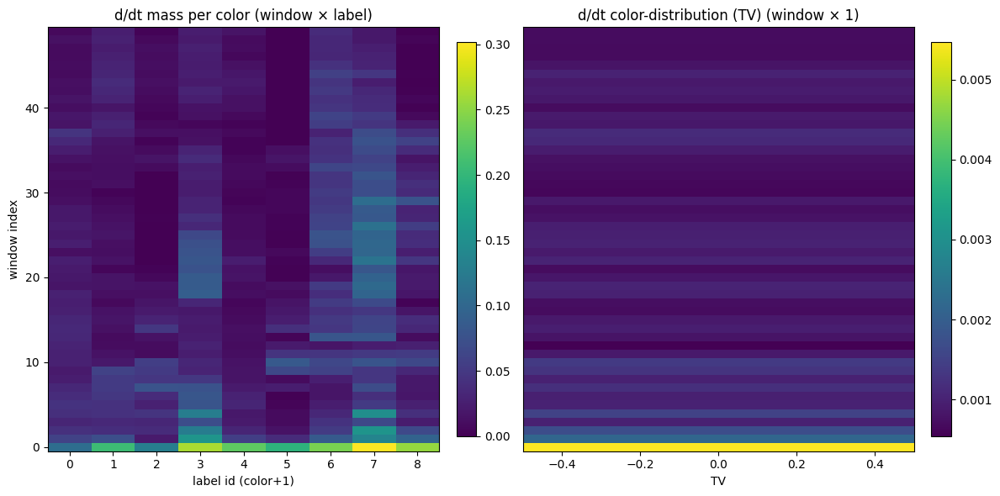

In [11]:
import numpy as np
import matplotlib.pyplot as plt

def _gaussian_kernel1d(sigma_frames, radius=None):
    # sigma_frames: сглаживание по времени (в кадрах логирования)
    if sigma_frames <= 0:
        return np.array([1.0], dtype=np.float64)
    if radius is None:
        radius = int(np.ceil(4.0 * sigma_frames))
    x = np.arange(-radius, radius + 1, dtype=np.float64)
    k = np.exp(-0.5 * (x / float(sigma_frames)) ** 2)
    k /= k.sum()
    return k

def _smooth_time(M, sigma_frames):
    # M: (T,K) float
    k = _gaussian_kernel1d(sigma_frames)
    pad = len(k) // 2
    Mp = np.pad(M, ((pad, pad), (0, 0)), mode="edge")
    out = np.empty_like(M, dtype=np.float64)
    for j in range(M.shape[1]):
        out[:, j] = np.convolve(Mp[:, j], k, mode="valid")
    return out

def _d_dt(M, t=None):
    # M: (T,K) float, t: (T,) физическое время (steps). Если None -> dt=1
    T = M.shape[0]
    if t is None:
        d = np.empty_like(M, dtype=np.float64)
        d[1:-1] = 0.5 * (M[2:] - M[:-2])
        d[0] = M[1] - M[0]
        d[-1] = M[-1] - M[-2]
        return d
    t = np.asarray(t, dtype=np.float64)
    d = np.empty_like(M, dtype=np.float64)
    dtc = (t[2:] - t[:-2])[:, None]
    d[1:-1] = (M[2:] - M[:-2]) / np.maximum(dtc, 1e-12)
    d[0] = (M[1] - M[0]) / max(t[1] - t[0], 1e-12)
    d[-1] = (M[-1] - M[-2]) / max(t[-1] - t[-2], 1e-12)
    return d

def _window_ids_from_t(t_logged, window_size_steps, window_step_steps):
    # возвращает ids кадра -> window index, и список уникальных окон в порядке
    t = np.asarray(t_logged, dtype=np.int64)
    w = (t // int(window_step_steps)).astype(np.int64)
    # фильтруем кадры, которые реально попадают в своё окно [ws, ws+size)
    ws = w * int(window_step_steps)
    ok = (t >= ws) & (t < ws + int(window_size_steps))
    w = np.where(ok, w, -1)
    uniq = np.unique(w[w >= 0])
    return w, uniq

def plot_mass_derivative_heatmaps(
    masses_T,
    t_logged=None,                 # (T,) физические шаги для каждой строки masses_T; если None -> dt=1 и окна в кадрах
    window_size_steps=50_000,      # размер окна в физических шагах (если t_logged задан)
    window_step_steps=50_000,      # шаг окон в физических шагах (если t_logged задан)
    window_size_frames=None,       # если t_logged=None: размер окна в кадрах
    window_step_frames=None,       # если t_logged=None: шаг окон в кадрах
    smooth_sigma_frames=3.0,       # сглаживание по времени ДО производной (в кадрах)
    use_abs=True,                  # True -> |dM/dt|, False -> signed dM/dt
    include_void=False,            # включать ли label 0
    title_prefix=""
):
    M = np.asarray(masses_T, dtype=np.float64)  # (T, K+1)
    T, L = M.shape
    start = 0 if include_void else 1
    M = M[:, start:]                             # (T, K) или (T, K+1)
    K = M.shape[1]

    # 1) сглаживание масс по времени
    Ms = _smooth_time(M, smooth_sigma_frames)

    # 2) производная масс
    dM = _d_dt(Ms, t_logged if t_logged is not None else None)
    if use_abs:
        dM = np.abs(dM)

    # 3) производная распределения по цветам (TV по p_t)
    denom = Ms.sum(axis=1, keepdims=True)
    p = Ms / np.maximum(denom, 1e-12)           # (T,K)
    dp = p[1:] - p[:-1]                          # (T-1,K)
    tv_t = 0.5 * np.abs(dp).sum(axis=1)          # (T-1,)

    # сгладим tv во времени тем же ядром
    tv_s = _smooth_time(tv_t[:, None], smooth_sigma_frames)[:, 0]  # (T-1,)

    # 4) окна: либо по t_logged, либо по кадрам
    if t_logged is not None:
        w_id, w_list = _window_ids_from_t(t_logged, window_size_steps, window_step_steps)
        # tv_t соответствует переходам t-1 -> t, привяжем к кадру t (индекс 1..T-1)
        w_id_tv = w_id[1:]
    else:
        if window_size_frames is None:
            window_size_frames = max(1, T // 20)
        if window_step_frames is None:
            window_step_frames = window_size_frames
        idx = np.arange(T, dtype=np.int64)
        w_id = (idx // int(window_step_frames)).astype(np.int64)
        ws = w_id * int(window_step_frames)
        ok = (idx >= ws) & (idx < ws + int(window_size_frames))
        w_id = np.where(ok, w_id, -1)
        w_list = np.unique(w_id[w_id >= 0])
        w_id_tv = w_id[1:]

    nW = int(w_list.size)
    H_mass = np.full((nW, K), np.nan, np.float64)
    H_tv   = np.full((nW, 1), np.nan, np.float64)

    # 5) агрегация по окнам: среднее по времени внутри окна
    for wi, w in enumerate(w_list):
        msk = (w_id == w)
        if msk.any():
            H_mass[wi] = dM[msk].mean(axis=0)
        msk_tv = (w_id_tv == w)
        if msk_tv.any():
            H_tv[wi, 0] = tv_s[msk_tv].mean()

    # 6) рисуем
    fig = plt.figure(figsize=(12, 6))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)

    im1 = ax1.imshow(H_mass, origin="lower", aspect="auto")
    ax1.set_title(f"{title_prefix}d/dt mass per color (window × label)")
    ax1.set_xlabel("label id (color+1)" if not include_void else "label id (including 0)")
    ax1.set_ylabel("window index")
    plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

    im2 = ax2.imshow(H_tv, origin="lower", aspect="auto")
    ax2.set_title(f"{title_prefix}d/dt color-distribution (TV) (window × 1)")
    ax2.set_xlabel("TV")
    ax2.set_yticks([])
    plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    return H_mass, H_tv, w_list


# ===== Example usage =====
# masses_T, centers, palette = compute_mass_trajectories(frames_rgb_u8, frames_mass, ...)
# Если у тебя есть массив t_logged для этих масс (физические шаги каждого кадра), передай его.
# Иначе будет оконение по кадрам.

H_mass, H_tv, w_list = plot_mass_derivative_heatmaps(
    masses_T,
    t_logged=t_logged,              # если есть
    window_size_steps=20_000,
    window_step_steps=20_000,
    smooth_sigma_frames=3.0,        # сглаживание по времени
    use_abs=True,                   # модуль производной (обычно лучше для "активности")
    include_void=False,
    title_prefix=""
)

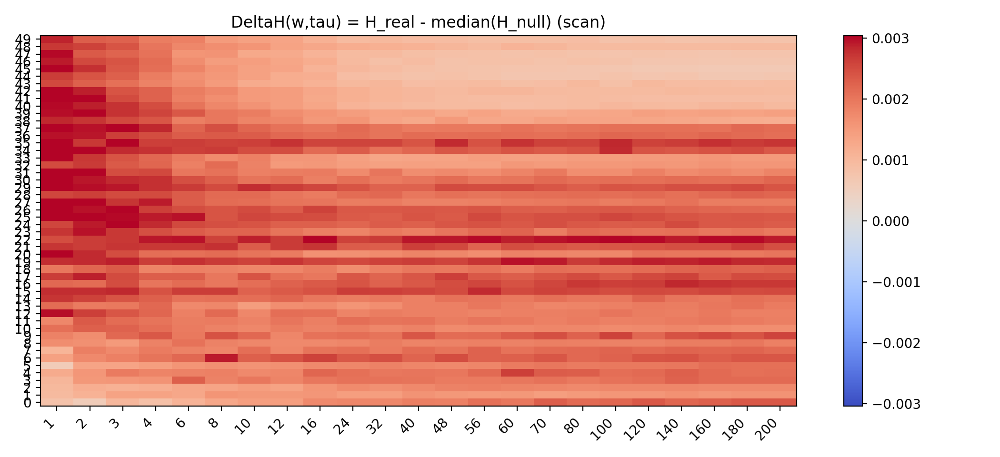

/home/coder/tmp/ipykernel_1456491/353396131.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


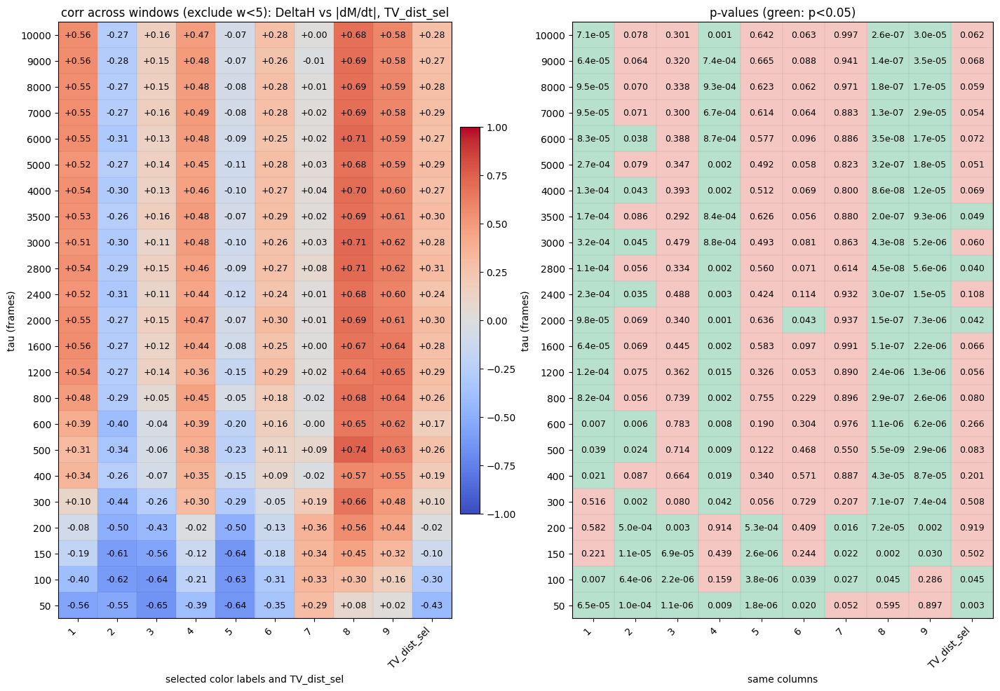

In [21]:
# =======================
# corr + pvalue heatmaps: tau × (selected colors + TV_dist_sel)
# =======================

# --- p-value for Pearson corr ---
try:
    from scipy.stats import pearsonr as _pearsonr

    def pearson_corr_pvalue(x, y):
        x = np.asarray(x, np.float64)
        y = np.asarray(y, np.float64)
        m = np.isfinite(x) & np.isfinite(y)
        n = int(m.sum())
        if n < 3:
            return np.nan, np.nan, n
        r, p = _pearsonr(x[m], y[m])
        return float(r), float(p), n

except Exception:
    # fallback (no scipy): Fisher z ~ N(0,1) approximation
    def _norm_sf(z):
        # survival function for N(0,1): 0.5 * erfc(z/sqrt(2))
        return 0.5 * math.erfc(z / math.sqrt(2.0))

    def pearson_corr_pvalue(x, y):
        x = np.asarray(x, np.float64)
        y = np.asarray(y, np.float64)
        m = np.isfinite(x) & np.isfinite(y)
        n = int(m.sum())
        if n < 4:
            return np.nan, np.nan, n
        xx = x[m] - x[m].mean()
        yy = y[m] - y[m].mean()
        sx = np.sqrt((xx * xx).mean())
        sy = np.sqrt((yy * yy).mean())
        if sx <= 1e-12 or sy <= 1e-12:
            return np.nan, np.nan, n
        r = float((xx * yy).mean() / (sx * sy))
        r = float(np.clip(r, -0.999999, 0.999999))
        z = np.arctanh(r) * np.sqrt(max(n - 3, 1))
        p = 2.0 * _norm_sf(abs(z))
        return r, float(p), n


Ksel = M_al.shape[1]
corr = np.full((tau_list.size, Ksel + 1), np.nan, np.float64)
pval = np.full((tau_list.size, Ksel + 1), np.nan, np.float64)
neff = np.zeros((tau_list.size, Ksel + 1), np.int32)

for ti in range(tau_list.size):
    x = D_al[:, ti]
    for j in range(Ksel):
        r, p, n = pearson_corr_pvalue(x, M_al[:, j])
        corr[ti, j] = r
        pval[ti, j] = p
        neff[ti, j] = n
    r, p, n = pearson_corr_pvalue(x, TV_al)
    corr[ti, Ksel] = r
    pval[ti, Ksel] = p
    neff[ti, Ksel] = n

xlabels = [str(int(cid)) for cid in sel_ids] + ["TV_dist_sel"]
ylabels = [str(int(t) * 50) for t in tau_list]

# =======================
# plotting: left corr, right p-values (green if p<0.05 else red)
# =======================
H, W = corr.shape
fs = max(5, min(10, int(220 / max(H, W))))

# pastel colors (readable with black text)
COL_GREEN = "#b7e1cd"  # soft green
COL_RED   = "#f4c7c3"  # soft red
COL_NAN   = "#eeeeee"  # light gray

from matplotlib.colors import ListedColormap, BoundaryNorm

sig = (pval < 0.05).astype(np.float64)
sig[~np.isfinite(pval)] = np.nan
sig_m = np.ma.masked_invalid(sig)

cmap_sig = ListedColormap([COL_RED, COL_GREEN])
cmap_sig.set_bad(COL_NAN)
norm_sig = BoundaryNorm([-0.5, 0.5, 1.5], cmap_sig.N)

fig_w = 0.62 * W + 11.0
fig_h = 0.35 * H + 3.0
fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(fig_w, fig_h),
    gridspec_kw=dict(width_ratios=[1.20, 1.20], wspace=0.22)
)

# --- left: correlations ---
im1 = ax1.imshow(corr, origin="lower", aspect="auto", vmin=-1, vmax=1, cmap="coolwarm")
ax1.set_xticks(np.arange(W))
ax1.set_xticklabels(xlabels, rotation=45, ha="right")
ax1.set_yticks(np.arange(H))
ax1.set_yticklabels(ylabels)
ax1.set_xlabel("selected color labels and TV_dist_sel")
ax1.set_ylabel("tau (frames)")
ax1.set_title(f"corr across windows (exclude w<{exclude_first_windows}): DeltaH vs |dM/dt|, TV_dist_sel")
fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.02)

for i in range(H):
    for j in range(W):
        v = corr[i, j]
        s = "nan" if not np.isfinite(v) else f"{v:+.2f}"
        ax1.text(j, i, s, ha="center", va="center", fontsize=fs, color="black")

ax1.set_xticks(np.arange(-0.5, W, 1), minor=True)
ax1.set_yticks(np.arange(-0.5, H, 1), minor=True)
ax1.grid(which="minor", color="k", linestyle="-", linewidth=0.2, alpha=0.25)
ax1.tick_params(which="minor", bottom=False, left=False)

# --- right: p-values (binary background by threshold) ---
im2 = ax2.imshow(sig_m, origin="lower", aspect="auto", cmap=cmap_sig, norm=norm_sig)
ax2.set_xticks(np.arange(W))
ax2.set_xticklabels(xlabels, rotation=45, ha="right")
ax2.set_yticks(np.arange(H))
ax2.set_yticklabels(ylabels)
ax2.set_xlabel("same columns")
ax2.set_ylabel("tau (frames)")
ax2.set_title("p-values (green: p<0.05)")

def _fmt_p(p):
    if not np.isfinite(p):
        return "nan"
    if p < 1e-3:
        return f"{p:.1e}"
    return f"{p:.3f}"

for i in range(H):
    for j in range(W):
        ax2.text(j, i, _fmt_p(pval[i, j]), ha="center", va="center", fontsize=fs, color="black")

ax2.set_xticks(np.arange(-0.5, W, 1), minor=True)
ax2.set_yticks(np.arange(-0.5, H, 1), minor=True)
ax2.grid(which="minor", color="k", linestyle="-", linewidth=0.2, alpha=0.25)
ax2.tick_params(which="minor", bottom=False, left=False)

plt.tight_layout()
plt.show()

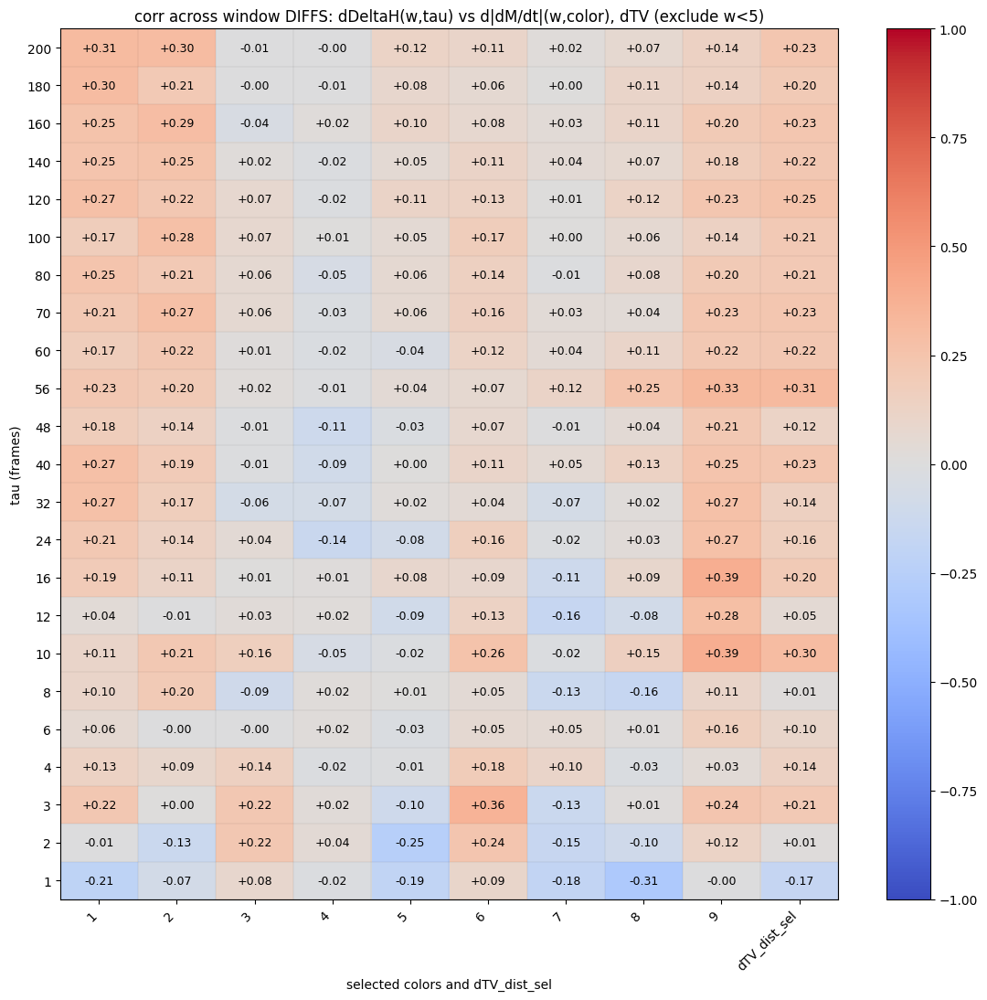

In [12]:
# --- PATCH: correlate window-to-window CHANGES (detrended) instead of raw levels ---
# Drop this right after you computed the aligned arrays:
#   D_al  : (Wc, Ttau)   = DeltaH aligned by common windows
#   M_al  : (Wc, Ksel)   = |dM/dt|_k aligned by common windows
#   TV_al : (Wc,)        = TV_dist_sel aligned by common windows
# and before you build corr heatmap.

# 1) first-differences across windows (w -> w-1)
D_diff  = D_al[1:] - D_al[:-1]          # (Wc-1, Ttau)
M_diff  = M_al[1:] - M_al[:-1]          # (Wc-1, Ksel)
TV_diff = TV_al[1:] - TV_al[:-1]        # (Wc-1,)

# optional: keep only finite
# (pearson_corr already masks finite, so you can skip)

# 2) compute corr on diffs
corr_diff = np.full((tau_list.size, Ksel + 1), np.nan, np.float64)
for ti in range(tau_list.size):
    x = D_diff[:, ti]
    for j in range(Ksel):
        corr_diff[ti, j] = pearson_corr(x, M_diff[:, j])
    corr_diff[ti, Ksel] = pearson_corr(x, TV_diff)

# 3) plot
xlabels = [str(int(cid)) for cid in sel_ids] + ["dTV_dist_sel"]
ylabels = [str(int(t)) for t in tau_list]

plt.figure(figsize=(0.55*(Ksel+1) + 6, 0.35*tau_list.size + 3))
im = plt.imshow(corr_diff, origin="lower", aspect="auto", vmin=-1, vmax=1, cmap="coolwarm")
plt.xticks(np.arange(Ksel + 1), xlabels, rotation=45, ha="right")
plt.yticks(np.arange(tau_list.size), ylabels)
plt.xlabel("selected colors and dTV_dist_sel")
plt.ylabel("tau (frames)")
plt.title(f"corr across window DIFFS: dDeltaH(w,tau) vs d|dM/dt|(w,color), dTV (exclude w<{exclude_first_windows})")
plt.colorbar(im)

# annotate cells
H, W = corr_diff.shape
fs = max(5, min(10, int(220 / max(H, W))))
for i in range(H):
    for j in range(W):
        v = corr_diff[i, j]
        s = "nan" if not np.isfinite(v) else f"{v:+.2f}"
        plt.text(j, i, s, ha="center", va="center", fontsize=fs, color="black")

plt.gca().set_xticks(np.arange(-0.5, W, 1), minor=True)
plt.gca().set_yticks(np.arange(-0.5, H, 1), minor=True)
plt.grid(which="minor", color="k", linestyle="-", linewidth=0.2, alpha=0.25)
plt.tick_params(which="minor", bottom=False, left=False)

plt.tight_layout()
plt.show()

(44,)
(44,)
(44,)
(44,)
(44,)


(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)
(44,)


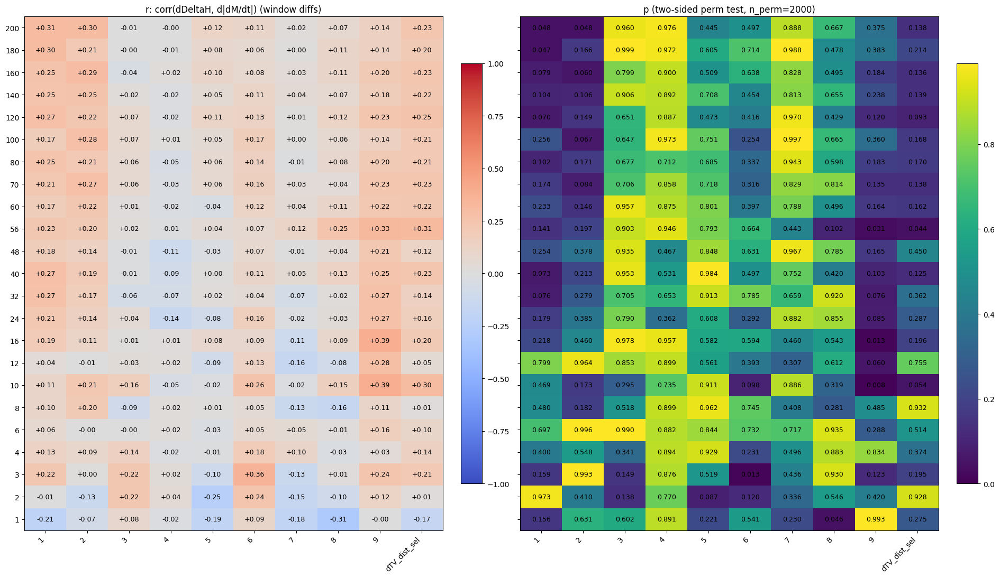

In [20]:
# --- PATCH: permutation test for corr_diff (window-diff correlations) ---
# Assumes you already computed:
#   D_diff  : (Wc-1, Ttau)   = dDeltaH across windows
#   M_diff  : (Wc-1, Ksel)   = d|dM/dt| across windows (selected colors)
#   TV_diff : (Wc-1,)        = dTV_dist_sel across windows
# and have:
#   tau_list, sel_ids, exclude_first_windows, pearson_corr

import numpy as np
import matplotlib.pyplot as plt

n_perm = 2000     # number of permutations (>=1000 is fine)
seed_perm = 0     # RNG seed for reproducibility

rngp = np.random.default_rng(seed_perm)

# observed correlations (recompute or reuse)
Ttau = D_diff.shape[1]
P = M_diff.shape[1]
corr_obs = np.full((Ttau, P + 1), np.nan, np.float64)
for ti in range(Ttau):
    x = D_diff[:, ti]
    for j in range(P):
        corr_obs[ti, j] = pearson_corr(x, M_diff[:, j])
    corr_obs[ti, P] = pearson_corr(x, TV_diff)

# permutation p-values (two-sided)
pval = np.full_like(corr_obs, np.nan, np.float64)

# precompute finite masks per column for stability
masks_M = [np.isfinite(M_diff[:, j]) for j in range(P)]
mask_TV = np.isfinite(TV_diff)

for ti in range(Ttau):
    print(x.shape)
    x = D_diff[:, ti]
    mx = np.isfinite(x)

    # for each feature build joint mask; permute x within mask positions
    for j in range(P):
        m = mx & masks_M[j]
        if m.sum() < 5:
            continue
        x0 = x[m]
        y0 = M_diff[m, j]
        r0 = corr_obs[ti, j]
        if not np.isfinite(r0):
            continue

        # null distribution
        cnt = 0
        for _ in range(n_perm):
            xp = rngp.permutation(x0)
            rp = pearson_corr(xp, y0)
            if np.isfinite(rp) and (abs(rp) >= abs(r0)):
                cnt += 1
        pval[ti, j] = (cnt + 1) / (n_perm + 1)  # +1 smoothing

    # TV column
    m = mx & mask_TV
    if m.sum() >= 5:
        x0 = x[m]
        y0 = TV_diff[m]
        r0 = corr_obs[ti, P]
        if np.isfinite(r0):
            cnt = 0
            for _ in range(n_perm):
                xp = rngp.permutation(x0)
                rp = pearson_corr(xp, y0)
                if np.isfinite(rp) and (abs(rp) >= abs(r0)):
                    cnt += 1
            pval[ti, P] = (cnt + 1) / (n_perm + 1)

# convert to -log10(p) for visualization
mlogp = pval

# --- plot: corr and -log10(p) side by side ---
xlabels = [str(int(cid)) for cid in sel_ids] + ["dTV_dist_sel"]
ylabels = [str(int(t)) for t in tau_list]  # NOTE: tau_list order must match D_diff columns

fig = plt.figure(figsize=(0.9*(P+1) + 10, 0.35*Ttau + 3))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

im1 = ax1.imshow(corr_obs, origin="lower", aspect="auto", vmin=-1, vmax=1, cmap="coolwarm")
ax1.set_title("r: corr(dDeltaH, d|dM/dt|) (window diffs)")
ax1.set_xticks(np.arange(P + 1))
ax1.set_xticklabels(xlabels, rotation=45, ha="right")
ax1.set_yticks(np.arange(Ttau))
ax1.set_yticklabels(ylabels)
fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

# annotate r
fs = max(5, min(10, int(220 / max(Ttau, P+1))))
for i in range(Ttau):
    for j in range(P + 1):
        v = corr_obs[i, j]
        s = "nan" if not np.isfinite(v) else f"{v:+.2f}"
        ax1.text(j, i, s, ha="center", va="center", fontsize=fs, color="black")

# -log10(p)
# cap for display
cap = np.nanpercentile(mlogp[np.isfinite(mlogp)], 98) if np.isfinite(mlogp).any() else 5.0
im2 = ax2.imshow(mlogp, origin="lower", aspect="auto", vmin=0, vmax=cap)
ax2.set_title(f"p (two-sided perm test, n_perm={n_perm})")
ax2.set_xticks(np.arange(P + 1))
ax2.set_xticklabels(xlabels, rotation=45, ha="right")
ax2.set_yticks(np.arange(Ttau))
ax2.set_yticklabels([])  # shared on left
fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

# annotate -log10(p)
for i in range(Ttau):
    for j in range(P + 1):
        v = mlogp[i, j]
        s = "nan" if not np.isfinite(v) else f"{v:.3f}"
        ax2.text(j, i, s, ha="center", va="center", fontsize=fs, color="black")

plt.tight_layout()
plt.show()

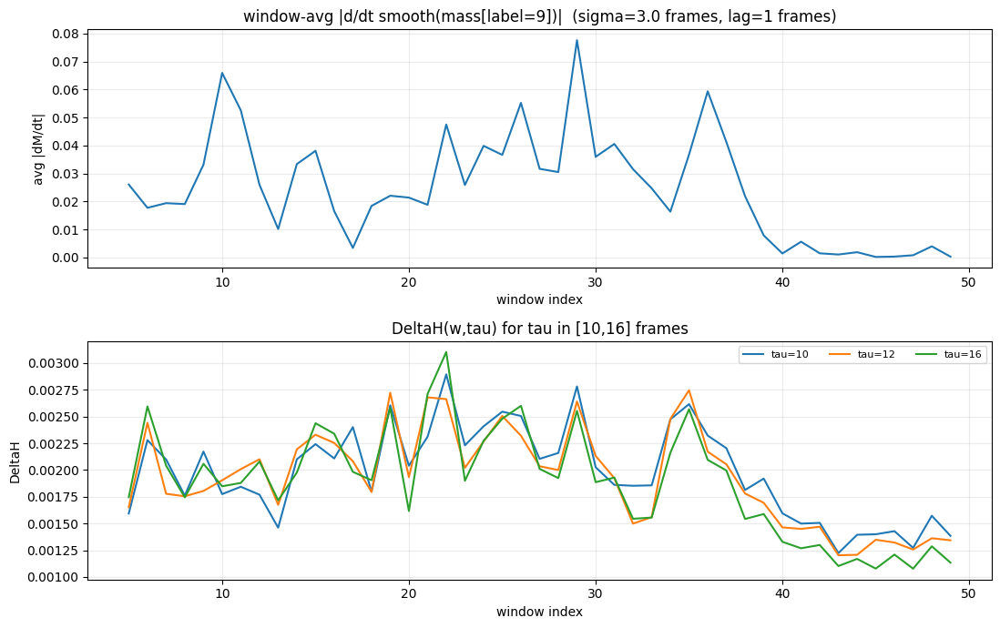

taus plotted: [10, 12, 16]
windows plotted: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


In [22]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ====== paths (подстрой под себя) ======
out_dir = "metrics/dist_pipeline_A"               # где лежат DeltaH.npy, tau_list.npy, w_indices.npy
masses_path = "metrics/species/masses_T.npy"      # твой masses_T (T, K+1)
t_logged_path = "metrics/species/t_logged.npy"    # твой t_logged (T,)

# ====== параметры ======
label_id = 9                 # "класс 9" = label 9 (labels начинаются с 1; 0 — void)
window_step_steps = 20_000
window_size_steps = 20_000

smooth_sigma_frames = 3.0    # сглаживание масс по времени (в кадрах логирования)
diff_lag_frames = 1          # лаг для производной по времени (в кадрах). 1 = максимально локально

tau_min, tau_max = 10, 16    # какие tau для DeltaH рисовать (в кадрах)

# ====== load ======
w_indices = np.load(os.path.join(out_dir, "w_indices.npy")).astype(np.int64)   # (W,)
tau_list  = np.load(os.path.join(out_dir, "tau_list.npy")).astype(np.int64)   # (Ttau,)
DeltaH    = np.load(os.path.join(out_dir, "DeltaH.npy")).astype(np.float64)   # (W,Ttau)

masses_T = np.load(masses_path).astype(np.float64)                            # (T,K+1)
t_logged = np.load(t_logged_path).astype(np.int64)                            # (T,)

# ====== helpers ======
def gaussian_kernel1d(sigma_frames, radius=None):
    if sigma_frames <= 0:
        return np.array([1.0], dtype=np.float64)
    if radius is None:
        radius = int(np.ceil(4.0 * sigma_frames))
    x = np.arange(-radius, radius + 1, dtype=np.float64)
    k = np.exp(-0.5 * (x / float(sigma_frames))**2)
    return k / k.sum()

def smooth_1d(x, sigma_frames):
    x = np.asarray(x, np.float64)
    k = gaussian_kernel1d(sigma_frames)
    pad = len(k) // 2
    xp = np.pad(x, (pad, pad), mode="edge")
    return np.convolve(xp, k, mode="valid")

def d_dt_central_lag_1d(x, t, lag_frames):
    x = np.asarray(x, np.float64)
    t = np.asarray(t, np.float64)
    T = x.size
    tau = int(lag_frames)
    if tau < 1:
        raise ValueError("diff_lag_frames must be >= 1")
    if 2 * tau >= T:
        raise ValueError(f"diff_lag_frames too large: 2*tau={2*tau} >= T={T}")

    d = np.empty_like(x, np.float64)

    num = x[2*tau:] - x[:-2*tau]
    den = t[2*tau:] - t[:-2*tau]
    d[tau:-tau] = num / np.maximum(den, 1e-12)

    numL = x[tau:2*tau] - x[:tau]
    denL = t[tau:2*tau] - t[:tau]
    d[:tau] = numL / np.maximum(denL, 1e-12)

    numR = x[-tau:] - x[-2*tau:-tau]
    denR = t[-tau:] - t[-2*tau:-tau]
    d[-tau:] = numR / np.maximum(denR, 1e-12)

    return d

def window_avg_by_t(t_logged, sig, window_step, window_size):
    t = np.asarray(t_logged, np.int64)
    sig = np.asarray(sig, np.float64)

    w = (t // int(window_step)).astype(np.int64)
    ws = w * int(window_step)
    ok = (t >= ws) & (t < ws + int(window_size))
    w = np.where(ok, w, -1)

    w_list = np.unique(w[w >= 0])
    out = np.full(w_list.size, np.nan, np.float64)
    for i, ww in enumerate(w_list):
        m = (w == ww)
        if m.any():
            out[i] = sig[m].mean()
    return w_list.astype(np.int64), out

# ====== compute window-avg |dM9/dt| ======
if label_id <= 0 or label_id >= masses_T.shape[1]:
    raise ValueError(f"label_id={label_id} out of range for masses_T with shape {masses_T.shape} (labels 0..K).")

m9 = masses_T[:, label_id]
m9s = smooth_1d(m9, smooth_sigma_frames)
dm9_dt = d_dt_central_lag_1d(m9s, t_logged, diff_lag_frames)
abs_dm9_dt = np.abs(dm9_dt)

w_list_m, abs_dm9_w = window_avg_by_t(t_logged, abs_dm9_dt, window_step_steps, window_size_steps)

# align to w_indices (чтобы ось x совпадала с DeltaH)
pos_m = {int(w): i for i, w in enumerate(w_list_m)}
abs_dm9_aligned = np.array([abs_dm9_w[pos_m[int(w)]] if int(w) in pos_m else np.nan
                            for w in w_indices], dtype=np.float64)

# ====== select taus in [10,16] ======
mask_tau = (tau_list >= tau_min) & (tau_list <= tau_max)
taus_sel = tau_list[mask_tau]
DeltaH_sel = DeltaH[:, mask_tau]  # (W, Tsel)

# ====== plot ======
x = np.arange(w_indices.size)

fig = plt.figure(figsize=(11, 7))
ax1 = fig.add_subplot(2, 1, 1)
ax2 = fig.add_subplot(2, 1, 2)

ax1.plot(x[5:], abs_dm9_aligned[5:])
ax1.set_title(f"window-avg |d/dt smooth(mass[label={label_id}])|  (sigma={smooth_sigma_frames} frames, lag={diff_lag_frames} frames)")
ax1.set_xlabel("window index")
ax1.set_ylabel("avg |dM/dt|")
ax1.grid(True, alpha=0.25)

for j, tau in enumerate(taus_sel.tolist()):
    ax2.plot(x[5:], DeltaH_sel[5:, j], label=f"tau={tau}")
ax2.set_title(f"DeltaH(w,tau) for tau in [{tau_min},{tau_max}] frames")
ax2.set_xlabel("window index")
ax2.set_ylabel("DeltaH")
ax2.grid(True, alpha=0.25)
ax2.legend(fontsize=8, ncol=4)

plt.tight_layout()
plt.show()

print("taus plotted:", taus_sel.tolist())
print("windows plotted:", w_indices.tolist())